### WS6: Clustering and Galaxy Morphology. Due April 30 at 2pm.

#### Original work statement: 

Please write your name here to indicate that your worksheet is the result of your own work, and you have not copied from sources without citing them (this is plagiarism and is not acceptable). Identical or very similar worksheet will share the credit.

#### Your name: Meryem El Baz

To work with this data set, we need to install a new image manipulation package called scikit image

pip install -U scikit-image (on MacOs X)

http://scikit-image.org/download.html

### Important! Place all the images (and just the images) in a directory called "SmallData" (or adapt the code below).

In [2]:
import numpy as np
import pandas as pd
import os
import random
import matplotlib.pyplot as plt
%matplotlib inline

import skimage
from skimage.transform import resize, rescale
from skimage import io

In [3]:
# Do not execute this cell! This shows how we reduced the size of the
# original data set, with 68,000+ galaxies and 790 Mb

# Data comes from Galaxy Zoo and was used for this Kaggle competition

# https://www.kaggle.com/c/galaxy-zoo-the-galaxy-challenge

#X = sorted(os.listdir('images_training_rev1')) 

#X_little = sorted(np.random.choice(X,500)) #Let's pick 500 of them

#for el in X_little:
#    os.system('cp images_training_rev1/'+str(el)+' SmallData/')



In [4]:
X_little = sorted(os.listdir('Smalldata/')) 

We will want to reduce the size of the original images so that the files become smaller, and the feature array is manageable. The code below shows you an example for the first image in our sample.

C:\Users\merye\Anaconda3\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
C:\Users\merye\Anaconda3\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


Text(0.5, 1.0, 'Rescaled image')

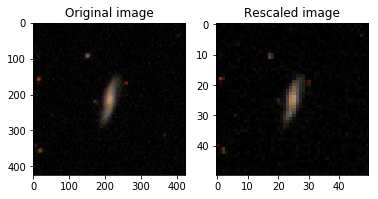

In [127]:
fig, axes = plt.subplots(ncols=2)

ax = axes.ravel()

img = skimage.io.imread('SmallData/'+X_little[0])

img_resized = resize(img,(50,50))

ax[0].imshow(img, cmap='gray')
ax[0].set_title("Original image")

ax[1].imshow(img_resized, cmap='gray')
ax[1].set_title("Rescaled image")

Q1: What are the sizes of the original and reshaped images, in pixels?

In [128]:
img.shape

(424, 424, 3)

Q2: Try changing the size of the rescaled image to (20,20) and (100,100). Which one is the best choice in your opinion, and why?  

Text(0.5, 1.0, '(100,100)')

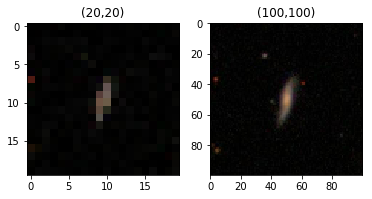

In [129]:
fig, axes = plt.subplots(ncols=2)
ax = axes.ravel()
img = skimage.io.imread('SmallData/'+X_little[0])
img_resized20 = resize(img,(20,20))
img_resized100 = resize(img,(100,100))

ax[0].imshow(img_resized20, cmap='gray')
ax[0].set_title("(20,20)")

ax[1].imshow(img_resized100, cmap='gray')
ax[1].set_title("(100,100)")

Q3: Add comments to each line in the following cell.

In [130]:
# Let's resize all the images in the dataset

# This code might take a little while (~15 sec on my machine)

for i in range(len(X_little)):
    #this is to loop through all the elements of X-little

    img = skimage.io.imread('SmallData/'+X_little[i])
    #this will make the image change every time we change the i (loop)/read every image on the folder

    img_resized = resize(img, (50,50))
    #this will give us a new image of size(50,50) for each image from the folder (for each i in range(len(X_little)))
               
    skimage.io.imsave('Image_'+str(i)+'.png',img_resized)
    #this saves the resized images and name them as Image_i.png


C:\Users\merye\Anaconda3\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


Before proceeding further, open the first image and check its size. You will see that there is more than one "layer" to the image (in other words, the shape is not just 50x50). 

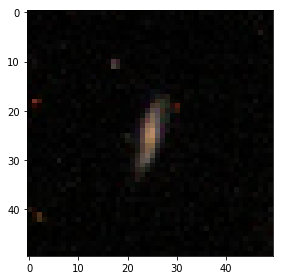

In [131]:
img_test=skimage.io.imread("Image_0.png")
skimage.io.imshow(img_test, cmap='gray')

Q4. Plot each of the "layers" of the first image, using the "imshow" command seen above. What do you think they mean? (Hint: a little google-ing might help ;) ) 

In [132]:
import matplotlib.image as mpimg
import numpy as np
img=mpimg.imread('Image_0.png')
print(img.shape)
img[:,:,0].shape

(50, 50, 3)


(50, 50)

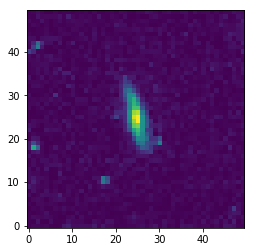

In [133]:
import matplotlib.image as mpimg
import numpy as np
img=mpimg.imread('Image_0.png')
#imgplot = plt.imshow(img)
imgplot=plt.imshow(img[:,:,0], interpolation='nearest', origin='lower', alpha=1)
plt.show()

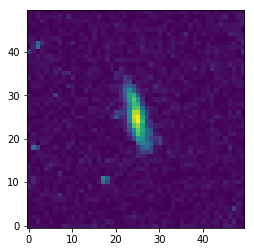

In [134]:
imgplot=plt.imshow(img[:,:,1], interpolation='nearest', origin='lower', alpha=1)
plt.show()

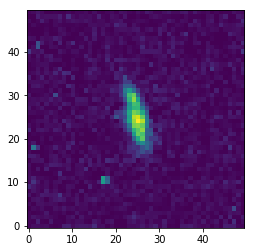

In [135]:
imgplot=plt.imshow(img[:,:,2], interpolation='nearest', origin='lower', alpha=1)
plt.show()

The code below reads data from the new images and transforms it 
into a numpy array of features that can be fed through the sklearn pipeline.

In [136]:
images = []
for i in range(len(X_little)):
    img_resized =skimage.io.imread('Image_'+str(i)+'.png')
    length = np.prod(img_resized.shape)
    img = np.reshape(img_resized,length)
    images.append(img)
    
images = np.vstack(images)

The code below visualizes the first 25 objects in your data set. You can run it to get a view of the first 25 galaxies. Note: you might get an error message, in this case see here 

https://stackoverflow.com/questions/43288550/iopub-data-rate-exceeded-in-jupyter-notebook-when-viewing-image

In [137]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(ax.shape[0]):

    img = skimage.io.imread('Image_'+str(i)+'.png')
    ax[i].imshow(img, cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

    data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAACu4AAAqzCAYAAADIISfBAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADl0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uIDMuMC4yLCBodHRwOi8vbWF0cGxvdGxpYi5vcmcvOIA7rQAAIABJREFUeJzs3UmzLct1H/ZVu3Z3zrn3PYAASIkkJFoWaZpSMCSLA4dlO0LfyF/Dn8ThiQeaeOQIDTRxhOmQFZbYyGxAgSDRvPaeZje1d3nwjAgNpLP+L1jYuBf+/abIl1k7K3Plyqy8B8M8zwUAAAAAAAAAAAAA/Gytft4PAAAAAAAAAAAAAAD/f+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D+OoWHYZh/Vg/yi2a1GtoyQ/Vlqqqu8zUoldV1a8PQP9f12v++oDurqmpORuiSdb2H4pEQvJs57ITkPS81FtK60mdfSvJMPw9L9kPyE5Pm0q5K6kpibSppb8n+nOf5/Rw0/EctmQMl4/Z67ZuLw86CMXMVrDJz9XX9PNbY93Pt6Mss+UhDGDOTfkhqStfG7Dcul+RFv2/BtWrJsfd+juNbL2fZ77t1nFlyPq9W/b+vTfPmSPIKw2cP++En8zx/J6uRn7dhGOZunsdxZ8Gx9h429wsviU1VVXNwhvW+nrdE62xS0Xu6Fv+i50B5SrLc+VTU2mK50pLnEYtV9WELXk16fh+OZTnQByQ5B3pPt0LZOXx6DhSs/8n4X4WdlXwLW6/HqK7NZtOW2W/2QXt9PVVV1+DvJE2nc1vmcjlG7R2Oh769S7aeRVle8Aov8aY3+X6aVJPlp5fLpW8vHKNLfudayvuav938bGNBH+r5Wz4Wkn3Bcue68zzLgT4wWR60aJ7civdVUbBbrqrke9+S4eLWsSeVfHuag++ecXsLnsUvVle6Nwjqur/rr/Hd3/V5bFXVp58/t2WWPQPpyyw5jNO7Itl39wXPsRaaEz+PM78hyLGT89+0wajfg75a9l7Ucv2e3An6Whd3q/oHHMds05xYMnFMNmZLHhYngXId3tl6Pgcb9SHr96UOi9O+2u12bZnn536x2K+z5z6dpr5QeLAzTclmPqoqMoTvsJNcqqqqWgX9ME1Bf1Y279frPtwcDv1hU1V26HY6ZQdcyWJ+ufTjfb/fRu0leU8yT5OY9lV7fYPpfcTkuZJ5kx6uJnXdBbE2jVfJuzmdTlFdfVvv54EUrxvG1+dAuibs9/24fX5+acusN1kal8Towzkb2/djH+tO137upuvLUv8wpCpbO87n5ANKOn/759ps+ndzPmd9laxn232fl1VlsS7JN5I+r1ouT0/3IYdDnyNswvmVvJ/dLslbsjm42/Vz8HhMc6Bl/s9Xltz/JdJ1fckPc4ksT8rix/19sk4kB25Rc7UOYlGau2zHflwdjpfvRZXxXhiGoY3n8boehItLME/S8DUGw3Ze8HA3+sdZ4fnhkoetiWRNSHLYqmxNWzJGR7E17KvNrl//k3CYzonkS0VyWL4Nc65zcL6YnN1UZb8xyafSs40kr0zHTDLen576/diS+5Alz26S+JH2+1LSvHOps5L48lWQt6S5brKXvE6zHOgD0w3ddHwstu9Ivn1U1T74JvMUXPqsqroL9ibJ+L/bZGfnh2O/z/nWL7+J6vpbv/LrbZnf+u5vtmV++eNfi9o7DH1f/egvftCW+fyLP4/a++Pv/UFb5sefPUV1PQRh+hrkCF+c+vWzqmq979fG5Nzp7d191N5nn33Wltlus3wqyZVeXvp+SPYXVVVjsFYtebEgiWtpHnF3d9eWSfpqSdfwX0Bsg5g1BbEvPQcam+8OVdnYS9el67XfF2y3Wdw+BcvJ4XSUA32AunsES+bJyX5hHcTDqqoh+LZ8Dc+CzsG3rn3wnTqNm0mcjs8bFvoDO0O4RdsG9yQOL33sSbPm5K7BdM76fRucXRyDPHy1DfcGU9/x/+Dv/1Jb5h/97n8Ztfc//fP/oy3zEnxrqMr+kVby7foazNOqLF9K7opUZec8yVqbzsH9Xb8nS+5GpTlqch6bnvntd32fHoNnT+6jVYXf74/97zsGZaqy2Jf2VRff03OuZb7WAgAAAAAAAAAAAACvcnEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuIH11/0PhmF49X+/XC5RPXd3d22Zl5eXtsw8z1F7u92uLXM6naK6Es/P/bPvVmNU1zz0v3Ger1FdieQdpv3ejZe0zPN5itrb323aMvO1b68q7Ye+nuDnVVXVatXfo18NfZnLlPXV9dqPmaRMVfbsh8MhqiuRjJlxXPLfJfQvOo19p1P/fpL+HMcwfgSDdLvt501V1fHYx8j1un+u9NmTPk3KpLH9zZuP2jLpOF6vX19e07nF+6ULPUlsqspyhNWqrytdi5ccbx+/7efJD37y47ZMEiuqqqapn+PjmPX78XhsyyRdmsbMpN+XXM+S8fDyksWwpEeHBdf+pB8ul/737XbZWNjv+31Buq4nY+Z8Prdl0rUxWdPSWDRNyRiNqlpMMo6TsZAKu71d16uyZ0/j9vPzc1tms+lj0X6/j9o7nPr4mM4JfvHM89zGnmT/8tO6ljBEK1UW75/itaovk8SntAeS9hbqzqrK3uEUnjUsFS/SHHa/37ZlTlO/FldlY/R67cuka/EYrC9JPyRrwld19e8wfX/JGpPkQGlcSHKgNJ86R2eMy+3Hkn7IZHMiyVuWPJJ48+a+LfP42Oc2VVXrdXDueVkuh03GTBr7llrjeH8Mw1CbzevzKY2ZyTp7PPaxYh2efzyf+/w+PZe5Bt+drsFznYYsFn7n2x+3Ze7D72q/8ht/vy3z7X/y3/Vlfut3ovaGemjLfOP/+tO2zL/6l/88au/v/Hp/vni9/GVU1+XdF32ZIMzdrbOc5BB8Z0ja++S5H+tV2bqQfPuoytaOJE9Kv1kkuWC6H0tiVvSdMmwvOdtI6lrybPvhTT9Pq6pegvP7ZO1f8vtwkvOn42qcgn4Pz9+GMCbz4enm3q2/c6Z5+Ta4S5F8d6qqqmB4L3nfIv2Nic36TVvmdH5sywSfKquq6qOHvr3zITiD/jl8Pk/i+X7Xx+BDcOZSVbUZ+7qOL31H/PjffxK1N0X3O7Jrg0MwRtfBHBx2WXvJupbcKayq2mz6CZ3M1YeHLJc4nvsz5+zbaBavkhw1fc+Pj31s2AR1HYI5X5W9583Yt5fmXdtt/80guVPwVZvLfET1F3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AbWS1e42WyicufjqS0zDv294tWY3T2+nKe2zDAMUV3X67UtMwf1nMP2Vquxr+vU92dV1Xa7bcskvy/tq+Px2JZZrYL3HF4xPxzOfaE5e/YhGH/Jm07e31fl+vaS93fKfl70nscxe/Z57vshqWua+nlaVXU4HNoy63UW3i6XS1smGe/T1PdnVdYPyTMl4yVtL5mnVVXrdR/fz0GsTcZeVdV+v2/LPD/3Y+HNm/uovcPju7bMuM4mWNfvyTvmPTP08y59r+t1Py+TuJPG6CS27lZZzPzhZ5+0ZVar/tnTOJCkG2k/JC5z/1xJmaqqazAekjGz2+2i9s7nPge6D/KIqqrnU7AuRPlNmFsH/bDd9mM0HVfJnLhek2w+G+9p3pwIUq7KdiJV47jMc6U5UJK6JPN5vc3m/HHq58Qq/HesyfxKcs+0z5M8L4lFX3zZ5zZVVff3fWy422fxY3oJ9mN8cNK9VSeJA9N1ubObdy/9XiGdl0n8TZbGdB+XlEv3z8k53Rydk2R9td32+7hTcIZ1f5/lQE9Pz22ZMTw7XAcv8Rr0+yo6T8rOKpOx8PT0FLW3Xifnb9mzJ3vxh4e7tkxyvlOVzfvkbKoqHQ99mSVzvGwvmbWX1LXZZPlUkhMnZ0ppe4ndrs9JjsF3h6plz98u5ywn5sMxDEO7hi65B032vGncSeLhKViDqqpqSs4t+nk5nLPvhptgP/tL/9l3orq+/Wu/0Zb57n/zX7dlfjUoU1W1f+7jxR982Zf56N/9atTe97//R22ZacrWxktwVnkJwuExHVfB1EnOTytcXpI5cblk8znJY6dg3qTzOTl3Sr7JVGV7muS50jPwpb55pu0l7+YY7BGrqlZBZ+22/X7lGuZv613/Devxsc+5vvMr343a++b6l9oyz2Fu8xLsRV6OfxzVxftlaKZBGseickF82gT5RlXV5RScTYbfejfBediS92qSuHm9ZGd0U3A2XtfgDDpqreqTT/pvh8k6lJ7TJWddH330UVTX559/3pY5B2t7sGR/VW7TF/yTv3hsy/zpn/7brMFgnxF+eKprklMFc2LZvy6a1RZu3VrPz/05ZFX2rWsOJliUE1e253wJ86AxiEVJ/rkOz2MTU/CNLj2mS/fxiS6+p2eV/uIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA3sF66wtPpFJVbDUNbZqi+zGqV3T2epqkvtOrbq6oagmdPnit6prC97XYb1ZW0Oc9zW2az2SzW3jiObZnrNXw31T/7db5GdS3les3au1wubZlkLKTjKnmu9ToLEcmYScokYyGtK+mrr1PulpJ+SPqgKhtXm032npO6EvMme8/Px0NbZr1eLtZuhyAWhevE8/EYlePDMQxDGxPTnCSZS0mMTudk8lynytaqOSg3BFWNY9ZXSX5zPp+jurLcrH/4dF1P2lvy90U5QpgD7YJ/27da9bH1dMre8xisC8l4T/OW5B2mYzQbD/27OZ+z+fzRR2/aMu/ePUZ1rYI1LZkT45itjZdLkgv29aT7zWHdV/Zw9xDV9fz8HJXrpHuo5DfuNn38WG+zcTwE4y/Nmedk7lyXySm5nS6fzvdUfblwm5O1FjxWEpuqsn1HskdL4/1+38ew1So7Bzqf+1i+2fS/L81Jltr7p7E32c+ez+k5SbKP6/sqzReXygXTs5RKzsziZ+/7/eXlJWgvaq72+34NPR6zHCGRxI90/5fEyCSPnecsfix1RleVza/0zCWR5J5LSsZ7+p6Tcun84v1wvV7r6en1tSjdNyZzLhkf+/0+ai/ZT6yD/dJX5fo4kOzX377J8sVdsGV6eBvuQYcftWXG9V+2ZVbr74ft3bVlhrHPb86n7N2MQ38+MKw+jeqaH/o+/fKL/tmTM8HUkt9IljwHSvb1ybMfDmne0v/G5HynqurNm37MHIPvGmm/J7luki/udruovfRcMDFdg9849WNmDL+9be/ftmW+8+Zvt2W++3e/G7X3m3/7v2jLrHf3UV2PU78G/C//8/8Y1cX7Y7Va1f3962PgcOi/4ValMbiPm6fwPHEOvoHMwflUVUUbw6SmdM90uST7k6wfonU0+N6XntPNwVp0DWLrKmwwGX95v/dt7oIk9XRa7tzsKdo7Zt8a1lP/XMnYq8rOSpJ1+927p6i9TfDtMN3XJP2+5B2/pe4zLRk/7u7D/WSQDya5c5ozJv0wj8G5WZK/VdU2yBnTfu9ibdoH/uIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANzA+uv+B9fr9dX/fRzHqJ55ntsyw6q/V3w8n6L2auiLrMNn7/qgqmq9/tpd+580DP3DT9O0WF1JmfP5vFh7ybOvgrFQlY2rtK7k2ZO6kmeqqrpcLm2Zw+GwyDOl0nG12WzaMsmYSfsqeTfJPK3KYlbyblLpc3WSPk+dz9nvy9rs67qesz4Ygn9bchn6MqspG1ff/Pa32jI//PQnUV3dNFxoGHBD8zy3MXG73UZ1JeWenp7aMkksTMulWcu8CmLm3A/w6zWbl8fjMSqXSOJ9soKukqSyqi6Xvh9Opz6PnaYsYKzXwdOny9m6b/Nud9eWmcM84lLJb+z7/XTK8tPEdpvNimRdT/Kb/T6LH4+Pj22ZccxywWS/crn0YzSNRauh74fzqh+kw5zt2daXvtwX776M6hrm5Dcutw9Jyl2DWJvsp6uqrlG5LG5fF8ybeX90a2i6x0n2E8PQrx3p/iwJT5vNcvE+iavznK2N2f45i7/jateWmaa+vTjeJzEs6M9xzPa853Pfp+t1tnYk+WKyf97v91F7yXtO+jNdX6apX9fTc93kvCgZM/t9Pz6rsvOw9Cw26a8kT5+Dtfir9rK509mlc37X55VvPv4oquvHn3zaltlu+/GenyMn+Ub//tJcPnvPUVX8glpq/ibxMIm/z8/PUXvJuVO6rifxfr3u1+zrJZtML2O/zv7oB/8+quv+7/VnvX/yf/6Ltsw0vYvaWx/ftmU++/O/bMu8fJntU3/wl/059XoMzw7P/fjb7/p4fw3bm4/9urAd+1iefh9O8rd07UjOKi/BeI/O8Rb25Zf9WE7OlNLveNmepq8nWa+rsvPmh4c3UV2Xax/7kvH+EOa6v/rLfbz67q//alvmt//z34ja++WP+n5Y7z+O6vrzH/w4KseHZZ7nulxen8OXS3a+kcSVZEt7Tu/CBNu0b/1KP+eqqt69C3KAIJBdw288Y5B7Xq7ZmViyXx2DOJbuh5JySW6d7C+rshw13YduNn0elLSXnjFegrPBVXKXLjy/uQTjLz/z68s9PfV7lqTPq7Lzw02YUyVzJ8kZ07On5AwuOZ9KvjVXZe/wEpyhVmV7tyQfXO+zcfXtoMyvfNzX9f889t+tq6qej/131l1wtlZVdWziTJo3+4u7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcwPrr/gfjOL76v18ul6iezWbzdZv+j1qtsrvHwzC0Za7Xa1RX8hvneV6kTFpuu91GdSXPnvRVaql+T9/Nku85qSt5N+lYT9pbauwt7Xw+t2WS35eOvSXnVxJDkn5PY1HyXEvOiS5mf526knJJP1yv2TqxXvdL1Hma2jLTJRsL3//hD9sy27ss1g5tX91+nvKzdzweo3LJPEnGf7q+PD+/BHVlKWESw1arYD07Z3Enqet6zebTUvnNNGXPvtv17ycZC+O4XIyegphZVTXP/XN9cezH1W7br0FVVefLMuvLkinQ6dTnNmmbw9AXOh5PUXvjmOQt2ZiZpr7N9bpv7+HhIWrv8fldW+Yf3X2rLfNHn38StfeyvesLBX1QVTUHcWaz6cf7knu2Q/Ds4yqL7cOCeUk0RsM4yvujW0PTvVCyb0xyoPTcKakrKVOV5XlL7lOTfVz6b/Gnc7/+D6vl5mWSo6Y5yVLSPDBZj8fxax+l/iclYznJ8dJxvOT82u/3i9SVxIWqbFylseh0WiYHStf15Dcm73kTTtPppY9XX5w/jeqag/Obw+XQlknfTTJGk7qSd5zWle670zb5cKxWq3p4uH+1TBp/Hx8f2zLJWEtjZrLOpjnJOjgv2u/f9hXN2Vz65LM+Pq03QXtV9aM//uu2zFh9nPv8D/8yam889/nblz/q+/2TH/84am/ol+I6nZ6juq5B7pkc8VyCc7yqqpdgLD8d+nOna3juf3/fd1Yax5NzyIeH/jwinc9JPpXGonQ97qTfk6YpefZ+YCX1VFVtt32ceXnpx1VV1Wrsx8wY9Pvx/EXU3nTt14m398E6scq+T3x27OPMZz/6QVTXj3/0eVSOD8s8z21cTM/ik5hxf/96zlVVNT1l5wh3u36f9umn2X4ouisSxqhE9g1kuXsuyXfB9PzmEqzJSf55OPT7y6rlfl/VcnexDocsBt+/6cd7Ulcyb6qqzse+T5c8p0vW9vTsKXk36bMvdYclv8+UlOkLpZ+2k3J3d8E3s6oahn7MRGeaU/bwD3d9Xf/tP/ittsyf/os/jNrbBWH0eM3m81Lfpf3FXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbmCY5zkvPAxt4c1mk9bVlrler22ZaZqi9tbrdVtmHMeortWqv++cPPv5fI7aS/oqffakzaSvkmeqyvoqeYfzpe/Pqqwfpuslqiv9jZ1kLFRVJXMxeaalnrsqe39pucsl6/dE0qdpbEtiVtKnaXtLzcE09iXS+JFI3vOtY2069rbbbVsm7/fXn+t6rZrnebnJys/cajXM6+3rc/N8zsZHEqaz+JvF6CTOnc/HqK752se67a6fSxXUU1V1OJzaMut11g+XIJfYJc8eenh4aMt89tlnbZlx068JVVmsW1UWdqap76vVqq8rKVOVrQtpPpVYsq6lcrN0rcpyruV+XzIn0mcfx74fvn3ty/w4XIunuR9XlzmrKwnJSaxN84hkzExJTNuHMS2o62HM6vr8+NKWuV7n35/n+feiCvm5W61W8263e7XM8ZjlEcmanYz/02m5nCu1XgdnDVMfD9f3r/flT52f+z5dhduJZJ9zPCc5V5aTJJKY+fz8HNWV5BHpfj3JEbr5ULXsfn2ps6KqqmtwHpaM9aqq8znIPaP1M5sTp1M/RpN3U5W9nyRvOR7Tc92+TJRbR61l/fD0cojqSubXet3P53SdWGq8393dRe29vPR5Sxo/wjMsOdAH5O3bt/M//if/6NUyT8dsLn3+6ad9mZ/0Zb748vOovWTYrsdsXU9iymrox//bt9+K2nv3+EVb5qO7N1FdU/W5xHe+sdw5UM19P/zwB/3vG/cfR82tNvu2zCef/iiqq4Z+bUzyiOvcr9dV2Rhdrfo1aBfmEck3mfSbxVI5yTGopyrbY2zCs8MkB8rOkbMcKKkrzaeWsgnPka/BOclm3/f7Rx9n8/k69u1985e/3ZbZ7e6j9oa5jx/pfuxy6Sf0n//b/1sO9IFJ7gRtm+9lP5Xss5NcOj2TiO6dhOdFSV37bXBGEN5NufV3i2TtS9a9qmxtH8cgBgffB1LznPV78uz39/0eM/1OcpqCvCQY75fwfHS/Cfo0PPufV/14Pzx+GbSX7bOjM82XbIzudsvkJXd3Wf55OGTnIH17/Zpdlc3V9O5Xcg4SnQumR8lDH4vGII5OQT1VlcWZYH9U1cfa6zRHd4L8xV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuIH11yk8DENtNptXy5zP56iu1aq/M9y1VVU1jmPU3jzPUbnEfr9vy3z55ZdtmfTZp2lqyyT9WbVcPyTPVPXVmFmizHbMhmrUV+vl7qsn7a3X2bMn/ZC85+v1GrV3uVzaMul4SZ7rfWyvKuv3JK6l8zkZD8k73G63UXvJGE2fPenTpD9TST+k4z2R9FXa7+fzsSmx3JrEbczVj7fdLh0fWa7UefPmISr3rW99uy3zF3/x51FdH33jo7bM4+NjW+Y6ZTF6HazZl0sWB8axr+t4PLVl0lTq7u4uK9g4n7KcazX28TeNmbtdn4On62wiyfmfnp7bMqtVtgYla/HplM3TzaZfQ8/n7B0uJd0XLDUn0qX/HMyd7wfDahiy3Hq/79/NNGUTOsmVkjkxrrKca1z35Yaxb28Kx94cDJnDJV275Di/aOZ5rvP59ViQ5kCXSz8mk7mUxN6qbO4mca4q3c/29aRnKRXE1nU434ZrEsuX2RdXZevsbrdry6S5RrLupc+e9MOS50DJGcjp1L+//EywL5Pmi2OUe/YNLnm+eDgcFqtrGJY7O1wH63oyFoZtnzNXVb0Ea/b6LjxTCvYiq2DMLHkun4z39Gzq1s+15BkWP3vb/bb+7m/+3VfL/PizT6O6/uz7f9GW+eKzz9sym102tpP4u95kdR2O/V58t+nH//r+m1F7w7Gv62XI4v18fmnL/Mn337VlNuF58Clo7/DS5ze/FKyxVVWnU//s0yr83pLEzeR8KgyryR70PjhXe37q+7yq6nzu+327zR5+mpJvFv1zBdO0qrKzrnQ9S75tLHkOlOR5yd4uzXWj78PBWVhV1X7f99Uw9v3+5VN/Tl5VdQr2bF980c/5h7v+O0BV1eeff9KWWQfntVVVUxD7+DB132bSvdxS56pT+E0piYlL3hVJzhvm5T6d1zq8M3NqzvKq8m/eiWTfm+yHhuRArMI9dLhgJblzct6wSe8EBcv2GPTDdt+frVVVjUGD//0/+2dRXYdgHv7Lf/G/tWUuSTJYVecgznz87W9Edb1716+jieOxuwPylSQ9S1Kc9BwhzZcSSbx98+a+LfN0zHKEVbIGBOd0qznrq7n6eDWG87l9P8mEL39xFwAAAAAAAAAAAABuwsVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3DI0DLBAAAgAElEQVRxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG1h/ncLzPNc0Ta+W2Y+bqK7TfGnLHI/Htsxut4vaO5/PbZlxHKO6Pv/886DUHLQ3RO0NQ1/X9fr6e/mp+/t9W+b5+dCWWa+zO9+Xy7Uts1r1dR2HfrxUVdW679Nh7vuzqmqzycZy53rt+6Cqahj6Z5+DZ0/KVFWt1/30T+ZNVdXh0I+ZZH4lz1RVdTqdFqsr+Y3JGE3f81K6WPxTyXhInz0dW0tJnmvJd5PUdblksagbf2nM5j0y92vakK5VwVS6BinCN77xNmrud3/3d9syX3zxWVTXb/7W32vL/Nt/80dtmZeXl6i9ZO24Hvp8sWq5GBaEiqqq+vKLL/pCwSONqyxfXI/Buh7GniTWLRl/k3U9cb1m7zjbFyz37xvX634cJ3lgVTaOk/aq8jyvk6ZA62DMDEEuf71msfZ06sulYyaJRWPw+85h/nZ66cutg71k8kxVla1Lm6yubzx83Jb59LMgPvJe6WLPNGXxJNubJHveMOcKbDbZvjE520i2oNMxe/bkvGi1zc4sjqfk/SR7r2ytSuL04+OXQT1Rc1Hekp4PLLWvz/eNfWx9eLhryyTnp1VV2+22LXOKxks2HpJl6Br21XbTP/sqXKsOx/4MK5nzYfoW5XnJmBnOWR5xnYK6xjAHqv7Zk/mVzolkDi55zrXd9s+en7P2+WJ6lsf74fD8Un/wr//1q2X+6q/+Kqrr5bPge1Iw1N7c97l2VdWnnwbtXbN4v9v135OSmPnJn2V9db708+RXvvPLUV1PL8m60M/dxy+fo/YSb7b9uj6fshh2Dt7h5uE+quvyrv+NybfY9Hwn+RSb5AhpvL+76589jdG7XZ+DR3WF60uyP0q3/smafTj07zA9M0veT5InJWeQVVVv3/Zn5c+H7Ez6kpxJH/s5GOcR8zJnhy/nT6L29sF+8xzkzFVVb4Kt1mNUE++baXp9Dqf3XJI4ltzJOJ6zNSaZduncTNa+8zGJ+VFzUXvHYxbHgmOe8Cwhe8/j0Mfq5BwhObeoqnp+7nOX9JNgssxE+9Bwz56cRR6P/XhPzzRf5v65vv/DP4zq2q4+astcg76awu8y89yPmafPs1UmOStJ4lo6rna7Zc5K0hx1qXt5qeR+WBr7kjsR6yB+pO/mEuw5hyntq6bRNA6FrQEAAAAAAAAAAAAAfwMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANzAMM9zXHgcx/nh7v7VMufzOaprmqa2TPJsw5jdPU7aG8cxqutyubRlVqshaG8dtZf0w+XS/76qqqF/rLpe+zL396+Pg586HA5tmdW1/337/SZq7zz376Yq6/fkPSfjarPJnj1pb73un/10OkXtrVb93EnnROIaDKwhGaChtK7kHSZ1pbE0GQ/Ju0meuyp7rmRcVWXjIVkDkrFelfV78kzJ2Eul/b5ev/4Op+la8zwvN+D5mRtWw7zeLBMTL8GbH879PBn326y9YM4N12w4brd9DJumPg6k83IOcoQhyLmqstg6X5aLF+u5r+uwD+o5ZL9vt9v17R2PUV3XoN93d3176Vr8cuqf627fd9Z0yHKgRPrs53OSR/T1JOOzatl8KllDo/gRtpeUS8okfV5VlaRmq3X27En+Fu2Dw73rGISiZJ0Ydtk+JMlvkrhQle2DL5f59+d5/r2oQn7uhmGYl9qmJfUkcWCzy3Kgw0swT1bZ3qQu/Rz4nd/57bbMn/3Zn0XN7YN178unx6iuZO2Yg9+XHh9ut/3+MjsTXG59WXKdTcqkZylzcIaVPPslzGE3m2zvv5TkPCI6xgulZxvHIPccmz19Vd7vydoY9VV+hN9Knqmqahj6flivkz1ilr9F8Sr5XhAuXN3ZTdpeVdU5yM2qSg70ARmGYR6buTKG+f312o+P5Jhku+n34VXZuE3nZbIObe76OPD8/BK1l8zefXD+UZV9J1mPfYvp0XKyvUzi076yPGJ11+fEXx6eo7r+1se/1Jb55Mc/acuka/EUnLGeTv047uboT12DtX9zHxzSVdXxuf/mGS1D6/A9h3lsIpn3b9++bcu8vGTzOTlTSs5b0nGV7KGmIB5XVb0c+/e8Gfp3OIV3JpIzpTHoh/jMPVgnttts330MzpudA314hmGYlws/fUXJeDsF352q0v14NleSby7Pj099a2EukcSx5Byhqup06vtrqb1qVf4bO8kerSp7z2m+ewnOxJKU4+OPP4rae3zqx8zuTX8Xazpm38MOhz5OPzxkd7+SHCD6jhAeT62D97wbsm8gT8G9tWR/l8zTqqpz8H6mqZ/PH33U52ZVWQ7w7l12lvytb3+rLfOTn3zSllkteNdsE+wf0ruq69Uy30ar+vE+zxXdCfIXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBoZ5nvPCwzCvV+OrZd6+fRvV9fz83JY5n89tmdX69ef5qcvl0pYZx6yu1WpoyyTPXtXXU1U1DH259Tq7g30+T22ZzWbblkn6s6oqGV8Pu31b5p/+zj+O2vvrH/2wLfNv/vp7UV3T1PdV8m6SMlVZXyVjNG0vkcaH5LkOh0NbZrXKxvHXiVud9Xq9SHtpvyflotgX9lVS7tb9mcytqizO3N/ft2WOx2PUXtJXye+rqjqdXh/v03SteZ6Xm6z8zA2rYV5vXo916bw8Hfs5vk1iSpgDXa/XtswwZmM7iRfX6zLrZ+oy9b+vqurhTR8vTocsXiS+M/Ux7NCnXPX5KWtvu920ZdJon7zn6dr/vnR9GYJiS64vS66NS62h6ZxI+iGt63DoB9emiXtfxxTMiWzfs2TsW+7fsW63wYS+ZuPlHMSi9dA/+6my+JiM43xORGV+f57n34sq5OduGIa5O2+YwrV4t+vXqiQOrIJco6rqv/r7f6ct86/+/C+juo5Bk9dgHUrW66qq06mP0XdvHqK6Hh+f2jL3+/5cJomrVdk+Lqkr3S4la2MUoyvbiydl0n1jBXF6qTOEqqrkFaZp+hisodHe4ZKtL6tg3Uv7PYoz6+X2K8l8vlySOZG1l2xL0zPw5LmWPEdO8vlkPufn1lm5xGbTx/fj8SwH+oCshmHeN3ElzZGn6sdakiMcDlm8TyTfuKqqgvBbYxAH0jOzJEc4nrODkmTt2AXrWbyuBzHzeOyf/SHMW47BYcrurs/xqqqGYGzdBd/xfvLpZ1F787Zfh8Z1394p+OZUVfWw6/v0ZcrG1cObN22Zd+/etWWSdaMqmxOnUxYbNpt+LCdraDqf0/V4KUmOMAZ9UFV1DPK35FxmteD34eSZ0jPB9B0monPk6SoH+sCsVsPcxYx8be/LRLFnwTPh5Hyqqurw0q8zv/arv9qW+eEP/zpqLzt3yeZ5sudbMk5n5zx9PQ8P/Xe8qqqXl5eoXCKJnWMw3k+n7Lwyya+vQZn9dhe1l5wZpWd+SV8ldzceX/qzyqqqbj9WVbWqLDZMc/8bk75K19oxeNHJGrrbZe/5JYhX6fxKco7k3mH69TRZT4Zg75Puz9fh+XxiaM41T6eprtdrO2j8xV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG5g/XUKD0PVuB5eLTNdTlFdc13aMutNf6/4Ol+z9oJfOk1TVNdm2PRlNtu2zOXS90FV1WrV98P5nD37ajW2ZZJ+mOc5am+36sudTy99ex+/Pu5+6vTluS0zptfVx77NaQrGX/boNayS9vrfF76aGsd+LCRlqqrO5/65knGcSsZf2l467zvDkL3oofoxs9v2MSbp86qqy5TE2j5eVWUx63A49O0FcSgt9/z83JZJx8I897/v+Tlb4/b71/v0csneH++PoYZ2LJ2u2bp+t79ry2xWfV2X5yx+HYJ1YZ6zMTkGi9qw7ufu+Zg9+xisxeN6uXg/n4N+D7Pn/+Gf/nZb5n///Cdtmf/1Tx+j9p6f+/i72WUPf07WxiAFug/Ws6/q6gfpNSiTWq/7fkjX2USSm+W/r383l8tyfZWsoWkutQpy3ST3vF6z/V9SbkgT5yDPOx6PbZlrkJdVVd1vd22Zzd2+LXP44ouove02ywUTY9ClT8csn+IXT7JnSuLvLszv//hP/qJvb87qStbGbRCeXg7Ljf+Xp34vVJX9i/3ncx/DklhYVVXJOV2wJtQ5i/frIBc8J7+vqk6nfvwl533pmVlyRpfVlY3jzSZ8h4EpXNM6qyDfr8ryiMsc7jGis4ZkLGRnG0lOsg72UGkOlORvaV3JtF/yfCMJ79dLX2gYst+XpM2b3X1U1zT1+zE+LHP16/9HH72N6hq2/WB7eem/kTy8zfL206nPN9I9aBIuxqCul/C7YbJfT3e811O/Vg33wRlWeD4wB2tjsl9/DPdLm01/5vL8xbuoruic5OWpLXO/7/eyVVWX4NnfPfXnYdugnqqqCr5TzuHacZj7vHIK8pbrebl9wd1Df9ZclZ1bDEM/J5J8uKrqcun3K2/evGnLvLxkufw8B/2efq/NirWO4Xy+C854lvzGmt07yGJfEj+ig2TeL8NQq2aPcjhkczOZUbtdv34kMawqWx+Tb9lVVavgUslf/+iHbZn1mH2XSa5lpHMz6YekrvSuSCXFgiTu8TE760rGTPLdvyo7rxwufRzbhpeQVtt+3c6+NWRZcfIO83Os/jcmdzfSZeEUvMM5PAtK1qu3b/v93dNTnxNXVZ2DMZM80zG8BzgH43iz6/ONqqqXIH9JRsyQ3lsbkrnT9+clPOs6B3eekhhaVXU+vT5X47kVlQIAAAAAAAAAAAAA/kZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AaGeZ7jwqvVMG/W46tlrtfr3/SZ/oO6+mcbhqyuS1BuCO8xv31405Z59+5dVNdSxvH19/JTQ9Bhl8vlb/o4/0F7y4yHa/hI6/WmLXO5nKO6Npt1Wybpz9Mpa2819uNvyfeXTNXtdhvVNU1TVG4pq1XfV7d+puTdVFWthj6uJWE5jX1RiB+y2Jf8xmQNCB+9hqDkZe7bS8ZLVdU49u19nTXzNdN0rXme067gPTAMwzw0S+3Dxx9llX352Bb5O7/e5xr/7ntfRs1dV/1QW6/7Na+qqi79nDsFi3Y6+JPnWm/7tb+q6nQ6tWV2D3dtmafn56i9+1MfL172Qf52yNazMcgj0r46Hvu+2gS55yrI5auyPH1J09SP0f1+F9V1OBzbMutm/5Q+U1X2ntOcJJHUla6NSbnNph+j53OWW2d7yayv1sG+4BrkJOdLNp+HYDgM235cpXvzYVpu3z0Eeddluv7+PM+/l9XIz9tqNcxJHEsksW4V5C3p+UdyjnBJJlxVNAnuq3+u5ymLYR999LYtk87xJAc6BbE1XRtfXvq1MTlvOZ+ymJls99I9YbJW7XZ9vng4HBZsr+/347Hv86qsr9J1Pd4/NPKzm+XymySmJf2w5Bn45dK3l5xZVGU5UCraYwRjIc3fkvg+zv0zjeusD54O/XONq/Bs9JLEmYMc6AMyDMPcje5tuMd+Cdf/ThwHopiSrY3ZHA9ieRjGkxgWhIGqqtqu+mffrJf720bX4DeeojU7e6Zp6tehzSbr+IeHh7bMy1N/HrYOX/TLuc/Bx2S9DtfiVbCuT+EYXW/697NZ79syc2VrVZLLL/XNoqrqbnfflknX9fO5H+9Jnp6ct1RVffObH7dlPvvki6iuZCj/w3/4D9syP/rhD6PmPv/887bMdcH3nMT2dI+R1XWWA31gku9h6blq8ik0iQVLxrp5Xu4uTLKH2W+z85Rk3qX9vtR+9RJ8E6zKvj0l60d6BLnf92vt5q5f06qqvghi8Dq4S5GekyRbg2S8T1OfI1RVrdbL3O+oyuZqco6V5DdV2Xt+eXmJ6kruPSX3rKK9T1UNwZiJ7n6F52arIBalYzR5P8mzB9eiqiob7+leOJHklsn7q6q6dHPnWtGdIH9xFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG1gvXeE0z1G53bhty1wup7bM3f1d1N7T6dAXmrJnf3n32JYZhqEts15n3X8+n9syc9jvid32oS1zPL2L6hrGsS1zuVzaMvPQ11NVdQm6YRyz++rJc61WfV2bTfaej6epLbPd9nVtt/3cqqoagj6dpv6ZUsl4P536OV+V/8ZEMleTOTgGY/0r17bEfO0H8lzZnN9sN22ZaeqfqSob79drUFcYrpJnn6f+3aSx9nLp67oG76YqjzP8Ynn8/Muo3EMwPNZJTNlFzdVq7ufSacribxLrxlVfJs1bTsE6lJT5qtG+yPbcr/1362wNOlf/XPMxePZ+maqqqimIv/Mxe8+VxLpgiJ7nbH252/f5fJIjJLlbVdV63T/88XiM6koka2OQjlRVNnfS+ZXM56RP13P28PO6D37Je07X4v2+D5Lpe472Y0mQCd/zNsiBKtgXpHOi5j4WrcJ+z2Y9H5J57sdSehyR7L0uwab+cllwnzqGE/Pax8znYC6lffX8/NyWSed40u/bYM80X8J9Y1Dmcu77arPJ9tjJ7zsF5y1VVWMwHpI1Idk7V2VnLkl76Z73eu3bS/qzKht/yXxO33OS30TnEZWNh2QspJKcK3k36bnTatX31f39fVTX4+NTWyYZo8lYqKqagzh6ChKq3/jOx1F701993pbZ7LP5/PTcf3sI0yneI9fm9b8E47+q6j74hpWsCWmcG4a+XLqvOkdrdnDuFJ77J9E3+HlVVTUFsfV4TGLmPmrvFIyHYdWv2Zs3WYx+CPrhNGV73usu+HbzZd/gGOZAb5N1aN2PhqeXPmeuqrqOwXeGQzaf50v/XMepXxPSfPE6hfv6wNu3b9sy7971a3/+LSz4frrty8xz1lcvLy9tmfRSxCbIr7/3ve+1Zc7h3vVwCnL+4JtTOq4Oh36MJrH967TJh2U1ruqhWY8eH/v7Ml9Z5jx7DvcUyffZNLImnzcuwWno8TFbr5LYM4T3Tl5egrtRQVXbfZYHVRCrkzxvDvPd56c+t9yes7rWyUlWMvzC/V4SNqdg/R+GrME36/4dvjv2a2jq+Wm5ug61YE4VjK3srDXr9+TcJfk+Ncd5Vy/tq1VyNhiUma/p2XVfZgrucqbfWcdxuW9rq+b9XMM+kE0BAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADwzzPeeHVMK9261fLrI9TVNc0D3G7r7a3HaNyq92mL3TO+mJ17cudrpe2zDBkfXA+n9sy6/Xr7+XruFz7d7jd3EV1nYJnX636++Or8Rq1N039s6+H7L56Mjfu7vp+OB6PUXtD0A/HY9+fm002Jy6X/vftdruorpeXl6hcZxyzZ0+kse3rxMDXbLfbqNxllY3lTjLWU0NY1WYTxNHA5Zw1mLyb1bofM5dLH4+rqoIpGI+XbixP06Wu14UWQm5iHFfz/n7/apnn5zAWrvq5tAvC4Wnq14SqLN+4BrlNVdVq1deV5CRpDEuePZ2X12Ddq2BWJn2QSta9JfvqOmV9laSoS/ZDsoaeTqdF6qnK1oU0T0/eTzK/xjHLT5Mxcw7X2aXe4SqZW1U1r/vfOE39u0mfO+mrNPdcb4K4Foyr0yXMgU59uST0pX2V7McqeDdVVUPQV6fT9PvzPP9eVCE/d6vVat415ylJjK7KY2tQU1Tq/r7frz8/P0V1BUc8tQpiSrpfT86Bkj192uYYxIH0/SXjIYrR4TlXsq6nZ2aHwyEo1ffV9Zrt+5PcJcl103z4EqxD62CP/VVdybqQjJn07CYqFknyrqRP0zk4jn0/JGtxeraRDL9k6a9K842+sjTXTX7jNRgz+2WO3qqqKjvVzfZQl2vJgT4g47ia9/vXz8bTtTEZ28nan57dvI82wT6hKtvPpv2+2/XrbJKTPD8/R+2tt/15X3K+/vSYtXffjM+qqnOF5+L7/rlWp76uh3V2LjMF3yCH4N08Rblb1Wb3ti3z8u4xqmu76udhkguOwfisynKSJfdjc/DJIp2DST9sd31d05Qt7MkZSPrN8/mxH1tjkDdvg3lalfXVfOnLpPuQ5Izn4eEhqurxsZ8751kO9KEZhmEeFvpkn6x9Sa6UzIGqMNaFx1NL7dNW4TnWfv/6N8iq9EQsWxtOQSzYJh8rK98ft+2ts7iZ3L9Jz+CSMZPk6vHeIFkft8H3iHOW562DnOMaflO6zEGOs+B9n+QuVnaWFwriTHrG+HJaZsykucuS/bDUt+vgOKyqsnw36fc0D1qt+rriO0HNPvd4ONT1cm17wl/cBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbWH+t0nPVfLy8XmbcZHVNfZHNZugLXU5Rc+dDX2YcsnvM50vTB1V1CcrsdruovdWqf65pCjq0qt68uW/LHI9zW2Yc+zJVVfOpf65x3ffDuRt3/583b962ZZJ3k5Z7eu4H1n6/j9pbXfs+XW+3bZmX6Slqb970c/U8Ze/5bvfQlhmGfizMlbV3Pp/7QkH4qKqa577NOajrHMaiYern8zD0DW6GLHwnsSEIMVVVdbkkcabvz9U6e/ZkDo7j2JZJ+rMqi7XR2KuquRk0wbDjPTPPc02n19//JhiPVVW16gfAJRgkmyCOV2VzKckPqqoeH7M1pnO9ZJPg/qFfQ4/HY9bokOQ3fRxIYkVV1XrVj4ekru06e88vLy/9M62zZ79er22ZJL9JY+Z0DeL9pl87kjW9Klsbk/WlKnuH49ivQ2l+msn64Rrknnd3d22ZwyHYaFXVkORcwaOn6/r53L/ndA+VjIfToY9FSZ9XVW23/bw/Hvv5lbaXhLVx1+9DqqqOxywn5sMxz3OdTq+/1zS33QSxPFs7sjjw9NSvjem/Z19v+jiQrEOHQzZHonkZrC9VWdxM1v51sjGuqvtdnyM8BmvHJXimqqpLkFcuGe+7vV5Vni9ut/2ceH5+bssM4Zx4uO/X9TS3TobDmzf9WdHjl49Re8nyn+ZvS+VdDw99f1Zlce0UnJ8m46Uqi0Xnc9YHyf5oCM7Tk3lTVbVe9/lGMkaP6UFXIN1jRMtJmJvxfpir6trsrS7h+nI+9uWS/Xq6p5+m5Byoj9FVVU9PyTnQcnveXbDvSM8akniR5ElpGLgEe9D50uc3q/C7xrHJ0auqxnVW2fWpz83OyVneLuusQ7Cfvbvvc8ohPDM7PL5ry+zDbxbroFwy3o+nLOeKzkDi5aUvmKzrSR9UVU1TP0aTT07RZ6mquiZ9NYT7sU0Qb4N+j8+tA8kZcRprN8E7fHzM8vTk7PD8nOzNeZ8Mw1Dr1evjJI0FL8f+/SfnRdOUnREk56HxeUqwj0m+06W5yzkIeNcgz6vKziX2d/0dne5M8KfevO374d2XSV3pe+7LDeFdilPz7feruvp60r1jsl09BfuHtx9n+fzxmiy22bOvg7z/GnwDDz/xRPlnOieSu3nJfZ+Xl/SbdF/kGuTqyf6hqmozLvcNNZlfyV2HeZ+d012PwXyufm8whffkdnf9JDyFOVz3fXtOv9FFpQAAAAAAAAAAAACAvxEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG5g/XUKDzXUft69WuYY1rXaXtoyl+HUlrmuhqi99SUol1VV1+u1b2/dd+00TYu1N4TP/vT03JbZ719/x1VVp1P/bqqqVuPYlpnnOaor8fj4uFh7u13fD8m7OR7TWdEbV3dtmf3Dt6K6hvnQlpnP2cA6nfvxsBr7vqrK3s312pfb7rZRXatV/+8XXo59X202m6i969Q/+5BO6EBSVzKOq6rGsa9rGPr+TH9f8m6SupJ6qrKYnD57twZcLv0ayIcniU1flevf/xxMyyyuZnMgXavGsa9rOvdzabvLYmaSb6Tx93Lpf2Myx9P8bbr25VZhHpvYbvt173DI8rf7+31b5uWlXxvX6z4PrKq6XPqxfA3KrIPxWZXNiXRtTMZM8vvSvkqeawzy77Sul5eXtky6ziY5eJJrpO8mE+a6C8WidA+VxJm7u36vcloWROgAACAASURBVDhksf18Xi4vWXBrx3uke69JflCV5cDJXDoez1F7yblMmpefz32bSTxcr7O+WnIfl5R78/DQlvmNX/tu1N4f/vEfReU6l0sWUPb7Pgc6HrP4m4yZJJ9K1+JkXUjG1Wbsc7eqqu2mP1M6vGS57iZYs6eg39N1I9mKp/v1pFwyFpK4ULXcuec0ZfFqF5yHpXUlMfkc7P/SPkhi8t1dP46XPIu9v7+Pyp2Ofd58Dc89eT/M17kOL6+PpeAYtKqqtts+piTrdTqXkmKHQ7+nr0rjYbZ2JJJ+SHOEJO9K4lyaLybry+nUrx3bbXbOleQbx1MWD3fBOd3DQ5JzZe0l7+YarFXjkOVcFXTpPjyrPAf5W3K28Wb/Jmrv3bv+m2d6ppSs/8n4W/L7TjLn7x+y33c+J/ujMF+MSvW2Y3YNI4kzSX/GZ3TBd4z0PafrCR+ebgzkMb+fw9m33uW+paS5RLK1X/I7dVJuumb70OSbxDY4z0vPN56f+ucax36NSdtLpN/yoj300I+ZNGfcbPrfuN3168fpJTvrGoLNwXe++UtRXc8/+bwt8y75NhqcT1VVDUOWny0lmYPf+EZ/hlpV9cWX79oyyf4u/aaUnF0k3/uqqtbJHin4pnQNvzsl94uS+fXwkJ3fPD0/tWXGYB9ctdz3Sn9xFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAGxjmec4LD8O8Wo2vlrm7XqK6xl1f5vnal5kuQ9be0N9Rni/Zsw/j631QVbVa9e2dz+eovTFob56zZ1+v122ZaZoWeaav9P1wvfYv+hK+m+T3pXUlkn5IxkJV1bjetmXOp36+/r/s3MmObFmWHuZ1rDd3v120mVlNFllFEhQkCiA4E/Qseg8NBegx9ACaaSxKAw3UQGQRJEhQpepTlRkRGRG3c3dz6800iErOdNcfKJMxIvF907ti72P77GbtfXb4zXIR1bd83g/C6XYTlTWZ9+3wq2++bWP2h2w+mgz9uF8sl1FZu92ujwnG1+iYPfto1PfR+bx/N6vVKqrv5uamjTkes7koGTtD8G6CIf+3cWFgI52vkrlvOp1GZXVr6+FwqPP5nC1g/CAMw3CubviGXXYy6fvk4XC5tWo26/ttmg8m81M0r+7SHKhfQ5N5J5XkEUlMVdV6vf67Pk5VVQ1hqn48XmbOrKqaz/ucZAje8zp8NeNp/54XFczlzT7lN5L5Pn3PhyDNGwdrx2GV5VzJ/uHmJsuBknbYbvv6knH6XVzfptm+oH/uqqrpNHuHiWSOvOQe41J7mkvOj6lk77PbHf74fD7/sys8Dhfw3TnQh2PSPW8iyben0+BAqbI9U/rsl1o7ptNsrUryqVS0RwvmlEm4fUnCDtXPq7NZn49UVW02fVvN59k+LlmHkj662WTr+jI4t0jKmkyztX826c8HZuFx3yg4R7jf9vnw4ZSt68meJh03d3d3bcz79w9tTDr1JUcbyZKdLuvJmD+GZ1jJviDZh6Q5SZJzJeM0re8UfMe4DfbAVeE++HSWA/2IjEbDuTu/SfvabtfPdaNRX1Y6DyRnN5dcqxLb7TaKS9o03a9f6rtTet6S7MWTnHJ3yM7MknUoPRdfTvv5/v1Dv66Px1knvX3W5yQPD30uP1RW312wf1gfsjxiWPRtdTvr60vziMe379uY9DPDKZhnTkF/n4UJ4+HQl5V8v9odsvljE+3Zsn3BMTh/GwftPg3/fto2yEmmQT6c7m+P276/H0/hoXRQ5fFUcqAfmWEYzvldkA9L1uNsbc/W4/3+cme0keTRw7GZrMfpvvcYzMHTWf/w+322Z7999ryNSb6ZneNvh/0cnOz9q6pW+36dyc4rszVmGizbyZnmeBSuaef+Hc6Cu3RVVbN536bHU9+e41G2z37z5k0bM7/J9gbJt7WkTdP7K5Ng3U72SKdgLFdl5zfb4Ay1Kju/PgXnN+fwA3eyF04SjvSuQ7LmpPvX8fDhstI7Qf7iLgAAAAAAAAAAAABcgYu7AAAAAAAAAAAAAHAFLu4CAAAAAAAAAAAAwBW4uAsAAAAAAAAAAAAAV+DiLgAAAAAAAAAAAABcgYu7AAAAAAAAAAAAAHAFLu4CAAAAAAAAAAAAwBW4uAsAAAAAAAAAAAAAV+DiLgAAAAAAAAAAAABcweT7BI+q6raOH4z5r/7pP47K+ldffNHG/J+/fh881BDVl1gullHcZr9rY47HD7dTVdXNzU1W32bTxoxG2R3s/f7QxgxBk04mWdc5bvv6RudzHzOEd8yPpzZkSH5gVZ2D5xqPx23M4dC3QVXV6Nw/12zo2/1unNX3s2eLNmb7yauorPf3qzZmPuqffTyNqqvzrv+Nu10/TquysTqMkz7T95eqqtOp76PJMyV9ryqdP6Ki6nTqf+Nk0j/XMGRtlcxrSVvd3d1F9d3f30dxieQ98+MyDFWT8YfnsekkXIvPff9YLvs5er/fR/Ul61mSH1Rlc08yLmezcMIPpDlQMi6TNTv5fWl9UU6STZkVvOa6uen7VVXVdrttY27nszbmPM/WqlPSptO+vs3DU1Tfy5cv25ikDaqq5se+4denvl/N4zGRjOdsbkjG/d1i3hcU9tGn4LmSOWZ0wf1fOvclQzWdixLJPDOd9n0m3Ycke7t07sty1Oy5+CH58CA4BvvwqmwsJf12vc7m6OWyP+NJ5/tkzU7mgXRcJudFj4+PUVnJcyV5RHoOdDgFe+yopMx83s+H6Ryd5c39epbW9/S0DsoK1sZw+/nzP/hZG3O7yHKSf/fv/20bM8yCjrXJEonttj/jSfcYydiZBHu7+TzIk+pye4y0X2X7sWw8X+oM65J50qX2pFVV02nfDuk6EeVAwfzID8f53I+BZN1IJXlScjZbVbVe9+fB4SeSaB5IcoT0LPtS9VVl82+WJ2XfGZL5ImmHITxLef7yRRuzfvcQlbXb9fnNNPluGOQtVVkONA6+yYzD9eX29raNmQ/Z99qnY9BWkz4nST8fTKf9nmYIz4HGwRnPw1P/rW+/z9azjz76qI159+5dG3MKvp1WVY0n/dnhKcgpq6qmwTyzD75TTkbZvJ3OyZ30u+gQrCfp8ZsvYb+9ujwnvW+RSNbsxaIf41XZmWmaw0X7/+BMYh+eBSVjOH32UbCOHg/J96lsbd8H+efNrF+H9uHHhtms7w9DcGehqmq67ut8dte/56dz9p6Pwfeiz3/ycRuzWWdz/mHXr9uHcMt+OPRlLU99YcEwraqqVdDuo/CUMcnDd0GekM59wzHZZ/R97/nH/ffMqqr37/q7lXfP+5y4qmq97cfzed8/+9//nU+i+h4e+j3LN4/Z2UxiswnKCrf6s+WH56L0zpC/uAsAAAAAAAAAAAAAV+DiLgAAAAAAAAAAAABcgYu7AAAAAAAAAAAAAHAFLu4CAAAAAAAAAAAAwBW4uAsAAAAAAAAAAAAAV+DiLgAAAAAAAAAAAABcgYu7AAAAAAAAAAAAAHAFLu4CAAAAAAAAAAAAwBVMvvd/MXz4ru///Cd/GRXz9dO2jRktg3vFp1NU33HXx6x3/TNd0uFwiOKWy2Ub8/S0isqaTvtXnjzXdpu11TAMQVBUVOR8DmKSZ6qqYZT0v6DCJKaqJqe+3WfDuI35h3/4O1F9s+Wijflic5+VNev71efTaRvzj29nUX3//O37NuZ4yNo9+f8X5qP+2ffDPqrtHHTSZHyNkv5ZVeNx32cOh+zZo+EcxKTPnsQlv2+1yubHpL503ua30DDUePbhueC0P0ZFnYJ1IZkHkvkktVjMo7jdrk+okuc6HrL8rUk7qyqbB6qqjsf+/UxGfVnHIWv32axf05I5ZRhlecuzuz5fPB6z+X4cLMer6vvC5JhtNZ6N+5zkft/3mfOQ9eP9sX/Pz168isoaTfv+sPnmmzbmEOaLy9u+rWanrB0e9m/amHPwCofxZ1F9P//7f9DGfPFX/2tfXzC2qqoO634enTXz+m+cgj1nMseEW9cot97v+/E8DfLvtKzUJdcmfjiGZkEOt9jROEnKWiz6ubAqW2cnk2ytutQ8MIR5xGazaWPS4Zbsc37/57/bxqRt9Wd/mp0Ldjab4CAvlD57coY1DnKz0ymbV5Nji+Xyro35/Z98HtX3UZDzv318G5V1PPe/8Xzq+16yN6qqGgXtvtters+cg7GajNOqqpubmzYmWYvT84hkLU7X6+T9JOPrkrlGIs2Bhurn9kO4H0vq3ByyMwN+GIahX0PT9eVSZynJXFhVdTz2ZY3H2fnsZpOcU19u/k3mndXDU1TWdNa31z7I8RbLbI99Dsra7/rfdwq/2u6Cd/Ps2bOorIdv+/OBZ3f9epZ+N5zf9Pn806p/z5+8ys5uzrt+DX18fIzKun3Zt+lm1Zc1BHlSVXY+cL9ZR2XVY7A/mvXPFX33rartpl//k+94SV5WVTWtPi79upP8xuTc+jTJ3vNxFxwYBblgek4+Cto02d9WVb148aKNeRN80+WHpzsHSfOg0eRCF0HSPChZj8O9Y3JHZxN8c7mZZOfZT0/9fP7iVT/mqsJzpWPfVrtw75i0+zFo9+AT3XdljYO96jzbFy6G/txlP+l/3x89+yiq72Hb5zjHad+vFuG+d7pPzrqyfPfdqu+jh22/9j2usjtI2+Aez2mdnc28DHK447HP4dJzrOEcPHtQVHrPJblzl97ROQVnF5OgrHfvs/V/8xh8bw6+5aVnT0krTIJ7lVVV2+2Hx0R87hlFAQAAAAAAAAAAAAB/Jy7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBZPvE3yqqofz+YMxf7PfZmWN+5j9YYjKSown/U89HY4Xq2806u9E73a7qKxz0+bfx35/uEg5Q/hqTqf+2cfjvq3SNphO+/e8C99zUufh2LfneBx09qo6Tk9tzKeffdLGfP7551l9uxdtzPr1v4rK+vP36zZmmC/amF+cN1F9u2PfAcdhJz2d+nY/HPr3nJRTlc0NScwQ/r7k2dPxnEjGTTIvVFXt9/s2ZrlctjGbTdavkmdP2717h8l74YflfO7f22HT99mqqiFZFoJhMpvPovp2u/65tpssf0tG72jUj5PR5HJzdDr/JuvxUP1znU5ZHrE/9s81m/XvcD6fR/WtVqugviz1Xyz6OkdD3w5pDjTf9uvey+CZPv6dT6P6Vo99f5/Ps2e/f3zbxtzO+hzodnYX1ffw8NDGPJ2zPcZh3Pf3JG/+L/7L34/q+wcvP2tj/vu/6Z9ptc1+33w6bWO222zenk77/pD099EozYGSPUY/btJ8I3n2dB8px/ntMwxDm9umOXK6Zne22yxvSfZV6TMlvzHZT6RrcTKWkpyrKhu/f/1Xv2xjkryl6ru8uXPJPWjyXMnesirsM0GO9+JFtq6vt/1edTz09f3+T38nqm8evJyn+3dRWZPgnHW16ts97QvHY//s00n29ykOh75No/PFXbbmJXNWMhcdg75Xddlz1mRMXHLtT+pLnj0e80NfVtL3qqpWwXjmt89lc5K+r93c9OegVdlzpfv1Idj7H4J9Y/qJK2iqGg3ZfD+ZBPuc4BtdOqckS9rd3fM25v3mfVTf6l1/DjRM0/O+INcN1pcXH38U1ff+4b6N+Yd/+IdtTLoPqWB8/e5PfhYVtV737+f1uV8bN2Eecff8po15XD9FZSXtdTr1z5WO5+Oh/26Y5PLb/eW+pafPnjzX8Xi5OwWX3B8ldsn5dvhM799ncxY/LsMwtHu++LtMsB5n35Yv9x0+zYPS78udbbAHrcr2ck9P2ZwfnVFNgvPzcL2a3vZtulv1ecnN8jaqbxXcSfvpOvxOctd/e5o979tqts7yrs9v+rV9+ZP+XGkffPutqqp3fZ8ZKhsTt9M+l/3FF1+3MS/C79svR33ct5WNr+QbarInS76fVlVt1sE9l7vkPWfz0E3Qr1aP4be1Rf9c51Nf1rdhfbNRcJczWAPO4aeHedD/0rucF/rc4S/uAgAAAAAAAAAAAMA1uLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBZPv+x8Mp/MH/30zz+4Cn7YfLqeqajj2MaNhiOqrOvb1xWX1xuNxG3M6naKykuc6901VVVXTaf9cx2PfVqmkSS/Z7rvdvo05j7I+OgradBj1zz4O383kZtbG/NHvfNbG/N7vvIrq+5uvdm3Mw6TvL1VVk9vnfX1fft3GvDn2z1RVNSRD58r/W8I5HITJuB+FfTSRlZXNRYloXhtl/Wo09HHr9bqNuZnNo/pOwaDf7bI+Oh5/eG44Hi8373El53Od9h9eH0eT7L2ekvym6UNV+fo5Hv/w/j+t+bRf86qqDodDG5PmU6djEBc81zR8z7Xpn30WvMNR0AZVVZ+9fNnG3K8eo7Jux/28Obq9aWNevcpykvF52sZMx/225eVPPo/qO3zz0Mec+pyyqur2ZtHGfP31l23MIhzP90F/WNz2z1RVddz1c9Hx0I+bf/G//G9Rff/mZtnGrA/92j+bZVvY065vq3QbMpn0dSZ7qDRfnE77+pK5L60viRsF+56qqmMy1/KjMgxDzWYfXh+3221UVnJOcsnzgUuebUyn/Vq13wfnEeG4TPZxxyCnzOvsY9Kcaxys2edzX9YFu0Lbh38j6TOjoB8/PPb71KqqWZCm/6N/8HttzE9eZY21vOnPbt5s3kZlnX7RxyTjeRTuVYbD5cbzZNLXeam1v6pqd6Gc5CbIpaqqnp76/rdYZOckyfw+DJfbb2Y5SV9fOtcOQVlBd4nrTOdRfhhGo1Hd3t5+MCZZ+6vSs43LnUsm8+92m5X14kW/dtzf37cx6byTtNVikpV1nvRtOhv6+T49qx/OfY6w223amJub/rylqmp20z/XbpXlJMn72QcfZT6b9TlzVdWLTz9tY17dfHj8VVUt5tn5wM1d36bnU3b+djz06/Gnu0/amF98/UVU3xB8c3/xWT9Oq6pGwf7h66/etTG3t2FOsur7e5JzJfvIqqrj8XLnQI+Pq4uUdXd3F9X37l0/jyZz+36f9ePke8F8ns21+2BtOp4ul8tzPd1e7RC+1+MhyJeS9D3sRsn+P+3fae7VOafnKcE6muafydy5CvKST19+FNX38PC+jZkHe8dh0z9TVdU/+qOP25jj634ur6r67PmzNuZu1PeZyc+z9fHlMihrCDr8TZZ3DS+Ds6A3Wc54WPXrzE9/1udB+2xpr2//8ts2ZhScuVRV1byvdFp9zH6b1Xez7N/PbvPUxhz24Z3CY1/fbJrta3bbvj/MF/1cm55jJXNtsicbknFT2V54Pr/MPYZD8I21yl/cBQAAAAAAAAAAAICrcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgCibfJ3g0jOpudvPBmPv1Y1bYeNbHDEMbcjM6RdUdj8e+ulnwTFV1OvV17vf7NmY8Hkf17Xa7NmYyye5gJ+0Q/Lwaj/t3U1W1WCzamKendRsznWZdNXk356ikqiHof6djX9/y7jaq7+evPmpj/mDZl3U7ycbEYvmsjXmXveY6V9BHd/17Xp76Z6qqOo5WfUzSkUPnc99r0vGc9KtovgrKqcqePYmpyuaZ6XTaxhxOWX2Hw6GNGSXjNOwLu0M/b58u9Oxpm/PDMQxDTSbZOO8cJv37v1SuUZXNT5fsk5NJv2anz560wyzM37bbbRtzPvfP9eJltla9f3vfxkyHIG/pl4S/Laufo2/nfV5WVTU59fnGcrxsY17Mn0f1ffLZZ23My9sP70GqqmrcrxtVVbNF31b7SdZW90Fffhn0mb/6sz+P6ls8n7cx223WDndBjvr+4amN2Y+ztqpt35nvJv26vg7X4jRXSmw2/fwxm/U5UJqTLJf9+Er2iOlcm+Seo1G23xyGJPeMiuIH4nQ6tWtokrdXZf3oUvultKzUpfZoaVslZQ3B2h8Lxu7+0M87VVXTaf9cSV/YrLO2SvLYtN2TvDmZW9N9w3Lax338ss91f+fjIE+qquMi2K8f+jWvqup4SMZEUE44npPenu5pkvGV7B2S9bqq6umpz6eSZ1qv+3O178rqY9br7D0nfTk5J0nziEvtJdO+sN/3uVm6lIzH/j7Kb5vT6VSr1YfPoA/BXFhVdXPTzxfJmepq1c8n35XVj6X5PDtLSeawRDouk/ki2Qt9F9ev/8+e92toulZVsN2L5rlt9vtOweqYn/v3z/UqONu4W2aT5iefvAqeqf99N8H5TlXVbv+mjZnevYjKGib9sy8e+nV2+z47H3jz8L6NCT+f1rt3r9uY5bI/d1qtspxkPuvLuuT3qyjdOF9uvU6eK83fkm/ux+B7dHI2VVW12yXfwrI+mq6F/Licz1XtEfMoyyWG6WXOHU+rbH1MpGt79M07OW8Izwg2wXfqSbhBiX5jUFaXD/+H+jZ9OyyCOerZx9m3hld3fVmPm3B+et7HPb+5a2NubrIFeX7Tt/uzu/7b2uicnUk8HPt+9fE4u890Ht61MbPq383Xj31+U1X18mf9/an3T9n5xv4puMe47ueZIT17mvTtPgRr6HQazrUV5BKnrK3OwYfp5I5fajS6zH2f9LNTUF2857zUty4nSgAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBZPvE3yuU+1Pmw/GzEZDVNaxjn3MoY/ZTcKfMPR3lM/7fVTUaBSUdT63MbPZLKrvkoahfz/DcApixlF9T08f7i/fldW3537f94W0rHFlfXQ87n/jaJK8w6yPPpvetjE//8OXbcziNns3f/nVto35+L5/pqqqv3r/po1ZLhZtzOl4iOobnfrf2I/A70yCOWS327Ux6XjebPoxkTzT4ZC1VTLmgyntb+tM5ob+udLxnMy1ye/bnbL6EuNx1ljT6fSD/77Z9H2KH5bz+VynJi85HvsxUpXNT+Mgn0r6f1W1z11VNZpka8fx2Je1T/KpUzZLJ2vxet3Pq6nToX+u/SqdU/q5fHL7vI05bNZRbatj0Kazvr6qqmevPm9jni/63/fZJ59G9f3ep8/amMm2zzV2wzyqb3TX96vZkPXR2anv74egrM9+8klU35dffNPG7MaPUVnbIJ9/9uKujbm/v4/qO476PnO/D/KbbKq9qGS6PZ2CPCnMIx6fVn1ZQRdNcqmqbO+a5IHf1RmF8SPTde/pNJt/kzwi2dMP4Rx9DiaMJOeqqjpdaE8xCutL8rx0b5K0VzJfpHvQWdAfVqs+v5lOs/x0NuvXl9UqO+9LFpnJNDjjCbd7rz7u19mfvuzzpN/9qC+nqurPvunzqcd9vwZVpWej/biZTS43f4RDos7Bmn0Mcuto31PZniZZi5NyqrK2Go2yefQQ7CWT87DkmaqyNp1MLnMuf2npb+TH43yuOjVnmNNgDaqq2h36vh19T0rWoMr2JtN5Nv8m5+LJmnDJMTKfZufwd3f9t41h3OdcDw8PUX3jc/9+gk9vNQs3VeNF3w6fffZZVNZh038r+umrvqyXr7Kc5HlwLvPyWd9HP3qe1bde979vk5xHVNUw9O/5223f328+ysbgLx/7+ePZTZ8vVlW9OXzbxtwG42Yd9JeqquQzcrLvSe4KVFWNg79VNg7H1/FCZzxp/pasAcm3+zQ/Tfal6ZlSUtYpObfmB2Woc03PH84Bzoesj/xRsLe/r77vfhF++T+d+vn8EHwH+q6sZJ8WjIF5lsMNwVg5hd8hk/kn2UNvD9mcP7v58HfxqqrTuW+rzTb8zrru6/vJRz+LyroNvo/ORkF9r7Lvb5++6t/zpx/334tW4fr47VNf3/t6F5X17NTnXt88BN9s19mY+LP3X/VFnbMc7i5oh9OLPqdKv4cdNsH7CY6Jh/D+1P7Q79vCK341HvWBk6CwZC9ZVXV72/erZE+WnBFXZXvT/O5XNkd2fFYDAAAAAAAAAAAAgCtwcRcAAAAAAAAAAAAArsDFXQAAAAAAAAAAAAC4Ahd3AQAAAAAAAAAAAOAKXNwFAAAAAAAAAAAAgCtwcRcAAAAAAAAAAAAArsDFXQAAAAAAAAAAAAC4Ahd3AQAAAAAAAAAAAOAKJt8n+Hyu2u4PHy5wkt0FHmpoYyaT/vGGoS+nqup4PF6kvqqq3W7Xxtze3rYx+/0+qu98Prcxye+rqhqN+veTxKTtnrTp4fDhPvV96kvaKvl9VVX7Q/+eF9P+Pc/Gz6L6Pvv0kzbm2ctpG/MHn7yK6vvjLx/bmNM6Kqom41kb8+7dfRuzGPe/r6qqxn1/CLtMnU6nIKrvV0k/rqoaj8dtTPJM02nWVtnc0P++7+rsnz0Z88djVt+lZO+4ahiSuTZ79mHo+sN124C/u6Gqhua9vXqZzfdDMCwfH57amGNla3+wNNY+HCfjcb+GJmNuOV9E9SVz2Gzer0FVVdNgfppM+9/3uFpF9Q2jfp4+JuB+YAAAIABJREFUn/v63j32faGq6uPPX7Qxn7zM2urTj/pn/+zjl23Mq+fzqL5lveljnvf1zW+ytXH17m0bcwj/98a3xz7huFv27bBcZ/uQT4J2Xz5l7f7rx358rR6/bWMmkzQn6Sej29ubNmbYZ3PfZrPtg8K96+HQz2vJ3Dea9LlUVdXp2Jd1qZyyKt3/ZblLsh+TB/3YDDUafXiuOx6zvVAF50BZ/8j60GLez62zWZaTPD316/Ew9GPpfM7GZWK3y86UkvkiG7uZx8f+IGGx6Nt9vw/m8aparfr6khy2KluHkt93d3MX1ffZyz5/+8NP+7X/WdaN67Dq+/Fm9RCVdWzmhaqqdltced/Lzjayg6DTqa8zOd9Oz2KP0bp+ub+tkYyv9NmTPG+77cdqfkbXv5t9823i++jWt+9VVvAjT3KgH53utZ7COSzJy2ezfr++fcrWxnFwdr5ehwf/gew8OJt3krZa7zdRWbtz/31nv+/f4Tkcu5Ng4RsF5+vzSXZ28xS8w/vwbzd9/LzPST568byNeX7Xfy+rqnrWp1z1T//T/6SN+ezVx1F9/9e//4s25ptVf/5RVfW07vvfaNz346dD1o+fDv17Xr/u+3pV9k0p2fekknGf5IKTYD9TVXUK6kvGYFVVTft5bRfsgw9P2XtOcqVXr/p9wdu376L6knZP7zAk/epwzPooPxznqto3/eT582zf+3LUj83dtF9jzsE5dVXVzU2/yDw89Hckqqpms2AuCPYnQ3hGe3fbt+nj+3DPnsyJQZ6wCL/lHY79nDF/2b/nOmRzzyo4m3k+z/rofL7sy7rtv7l89CLLg37/034t+sd/r89xTsH+oarqT37Vf9P8y1O2Xn2968fOsOvXmG34Le9V9fen7sLzw6+P/V2lt2/ftzHJXquqajIP1segv88X2fe+c5CjjoP8pqrqGHwPOwR5UHovL8k/f/azn7Yxv/71r6P6Evl9yA+P58MhvMcZRQEAAAAAAAAAAAAAfycu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFzB5Pv+B6fm3/fHLuI3zn3EuY+ZzWZZbUFZx+MxKms06u87Pz09XaScqqrTqW/T+XwelZXUud1u25ikPdO4yaTvhmlb7Xa7NubmJuszn3z6kzbm9berNuY87tuzqmo66d/zR8tpX19l9Z02923MfnqIynr/9m0bMx4PUVmJ5D1PJpfrM6NR8uzZ3JcMnWRe2+/3UX3Z/NH3q7TO5Pctl8uovmROTt7fdJr9vmSaSdqzKp8j+fE4V9Xx9OH3+vj0GJX1T/7zf9TG/Ks//pM2ZqhsXj0e+/44D8dJMg8M4yBP2qyj+obhcmvH4divaaNdkHuGbVXnvh02mz5f/PTzPh+pqtpu+/436afMqqqajYLAIPdcZilXzc79fP/7H/flPHue1feX9/1cvgqn8eOhHxO7Q1/faFhE9X3z/tdtzOrhISprs+3bfRTMM8d4/9ePiaAr1HyZtdXh3D/XdpflU8lUlMy15+QHVtU4SEqSPVSyr6uqGo/HbUySc1VluSA/Nuc6Hj88VtLlOkmlk5hsf1a12fRrf7J+VqU5SV9fmtskcWm7n4P5sIL5Pj1/2wVz63a7aWOW4Xy/2fRlJWeQaVmjcXLOla2Nn//0kzbm+Ud9grMJl+J3h359+TY456qq2gfveTYLzrDCdSPZY59O2aBI6kzOIQ+H7MxsMunX2SSfSs8ZTqf+3aTnrEkucQz2WZfMD5KiRuEZZFLWZAj/7kmcE/NjMRqN6ub2w2eYj+t+T19VdWrOk6rC85Zw7U/OQnfh2XIyfpP58BDsi6uyM/1zsBZXVZ2CPdok2Avl82//G8eL/iUewr3X6RD8vnmWv/3+zz9rYz56cdPGzG+y876f/fRFG/PTn/bP/vnzvpyqqr/4iyAH+iobz+fg7HAbxLz+tv+mVlU1HvXj+fGp/9ZXVdFatdn0c0OapyeS+eO4z3Kuxbg/J9nvsrLOQ/8Ox8GkHKan0fz+EJz3zcMxn33rC/dQ2/DAmR+fpgusnrIz6P8jORufJnuYbECtVv2edhx8w6rK9mnROU9wDl9VtT70z57sL6uyu0Pbbd/uh13WVvtT/xtf379rYz66zdaYabDne1xla/vLVx+1Mft5v36MJ9kaczvr3+HPn/fr/zDP2upX3/Rnnzez7NrgMOnveGz337Yxk7vwO+v7fkwc32dnu+tTcG4bdPfxOHv207Hvo8k3nkN4h3G26Mf8ep2coVZ0WDIe9f34kvchv/r6676cMHdJnurpKWurbv+anof5i7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAWT7xU9VNVk/MGQc1jU6NhHDsPQxhyPx6i+6XR6sbJOp1MbMxr1d6LT+ubzeRuz3W6jspLnSto9iUnrS9shkbzn9WYdlfXw9NjGzBf97xsN/furqho3Y6uq6v3uqY3Z7vdRfW/evOvrO/T1VVVtx4c2pn8zVbvdLqpvNu9LS/to0v8mk76+w6Fvg6qq8bh/z0k7JH29KpuvkpjU+dyXtdlswrL6dSKJSeahqqrttn+um5tlVNZqlc0z/Lh03e2wz7Kgf/kv/6SNSaawZN2oqjpVPz/tj9kcNlv0a1oyrx6P2bwzGvUNcQrLur191sas1/26N5vNovr2wXz4tOnX7PXTQ1TfbNfngodnr6KypqPnfUwwlR8n2Vz4btbPrX/6y/dtzDDO1v7TqH+Hu2CvUlW1WvXt/vX9mzZmsw2fPVizD2FqvZj1uUSSkyS5TVXVZtuXdar+4c/n7Adutv34mgc5ZVXVfp/MkX2fGY+znCTJb7IcNtvuJ+85TRfDFJwfkWGomjQ5xyX3XklZyRipqlos+vn+kmdKyblMuo9L9pd5u/ftNZn0ZW022X49kTz601O2b0y2e6dT1mdOp77dR8nfQAjOEKqq7pYv2pjpuV9nf/nNKqrvF3/zTV/fNDvD+vTTPq98/fp1VFbi5uamjVmvs9wzGYfDcLmzhiQuWbPTMXjJ8/SkrCRHCJsqkozmdMxH9Y2yskbRnHy55+Iazhf7bpHsA6I5Jdt6hfNA1h+n077S5Nlvbu6i+mazvr7HVf9do6pqOu3n1tUq2fNmOdd81te3GPfnH0/b/rtUVdVHP/u0jTkesnzqZt7nzXc3fcwsaPOqqof7fr/+r//tX/T1TX4Z1ffLL+/bmPMxe/an4NvGL/7yV23M9NTnNlVVu8c+z8vWoKqf/t7vtjF/8ed/1T9T+h0vyLl2wb5nGp6lJHPRbXiu+xicEU+C/r4Nzqaq+j13VdV+369Jh/BQ8Bzs/8Ilp+5u+7788Jh9a+YHZKgaNzlAmicFW9o67vvzlGVwxlOV7Zumi/TMtB/DSZ43HWdnBJc8i0/2x8ne+HDI9tlDMCeOgn32KfjOVVW1r37u+WTxMirrMAv2vUE++P59tj5+FaTF//xP/6aNeTHqv3lWVb1+06+1T0/Z+HoKvmPNzv2YODz051NVVbOP+t/4uOm/v1VVvdj2511Po77/HcPvH8OpnyMXi2AMhhUmY34RfOOvyub3S94vWi77PdJjcMdvHIzlqqrpuY/bbrM17nihdvAXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuILJ9wkeaqjJaPzBmP1+n5U19HeGx+MP1/V96judTlFcYrFYtDGbzeZi9R2PxzZmNMruYCftMAxDG5O8m6rsuZJnStqgqurm5qaNWT3torJW37xrY6bLvi88u82G2WqzbWO++PX7NmaY9O+vquqXb79pYx7XT1FZd6N5G7M7JWM1G6fJuE/HxHK5bGOS6SOdY5Kxcz6f25jD4XCx+vb7rKxkbghCot+XxiUxu1025sfjvs+sVuuorOn0w+1+OGRzGj8uYdeu0TiZp/uYdOxOJv08kM5h222/ViVr8WSSrY3RfFj9M1Vlc0HyXGlOMgnWod/7g7/Xxvw/f/6XUX2ffPSijblfP0ZlrY99vvFyuGtj9rssJzns+7Y63EzbmMkuG4TrIL+5X2X96vGxXxdOh/7Znx6znCvZ+sznfV5WVbVardqY7bavcDbLxvN40r/nZMyn+78kFUxzkqo07sOSXKrqcnlCmg9Pp30fTSV9hh+X87lf+9LjlsVi1sYk6+zxmFWYrP3pOEnKOp2uu49Lc5Lk+CapL80XkzZN3mG3p/qN5LmSvV5V1qbJeeZHd8+j+s7BY71e933vzVOWR7x+/9DGrLZZH90+vGljknUvXYvT9T+RjMNJkLekYyKJS9bidL5K54ZEspdMcsHtNjuXSSxv+rPY9To7l09Ss/ibwjnL8/jtkqz9VVkOlMxNo3A/kcy/yTxXlc09ybPv99l5xEcf92cbu3Dvfzz2a0eSb6RnWJtNP9ftJ8keu+8vVVXnYH5aBN8+qrJzktXh476ccA1av79vY74O8pbjNj3P7PvxfbiXfR98w3oz7vvom69+HdU3Gff975Dmb8G5bnKmlH5vSdb/RfCN9RjuoVZBfaNDmJME82iSn97eZmMw+e707NltG/P42J/1VVXNR32/SmKqqjZBv+LHZ6g+n0jPoPenfm2YBHcb8m+9fVl5jt+HJHlX+uyXlOQTkyS3DPPP8aTf005n/Xo8HLO2elr1cetRNj+dvnzbxhxe9v19/jw8+z/3c/7tm76+F+NsfXw89s/11Zs+76qq2u2DexlP/XMN+2z+eP26z5dOFZ4fBuvai9u+rbbheD6O+rLug35cwRxaVXUOprX0bC3/bvZhp+ShquopONccLnRvqKoq6MY1n2f9arO70Le8i5QCAAAAAAAAAAAAAHyQi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFzB5PsEn8/nOh9PHy5wNI7KGo36O8O73a6Nmc/nUX37/f4iz1SVPddyuWxjjsdjVF/y7JNJ9irT39hJnqnquz7TSZ4pfe71et3GLJazqKzRpn/P+822j7nbRPXV0PeHzWHaxnyzyvrVu2/etzHHp8eorPWh7w/DMLQx43A8H4P+d/rwVPUf7Pd9eyX9Lx3PifG4n0eTmKqq7bbvo8Gr+Vv9eJ5M+j663WbzR/IbkzlmNsvG/OFwaGPm8/73VVV1XeZwCDsoPxjDMNRs9uG1drfL+vZyvmhjknV2f876UTaHZWVNp8EYX/fzzmSSzWFJO8xm2dqx2wXPNerzt/VjP1dUVb247XOzL/76r9uYXWXv5ouHfs2eLbN86tu379qYxdC3+7H6vl5VdVoGa/Gq7zOHY5+7VVU9PPX96vW3fZ5UVTUZ9+vQr4M+8+a+z2Grqg6bpzbmeMzmoiQ3Wy6z8ZU4BDlXIln7q8LccxruoYKcZB/sEff7bP64lKQNUmmuO50GbXWhvsB1fJcDfXj9T85IqrJ1PTlLOZ2yOTMZA8M4WxuTvcK1ncJNbzJtJu/mknNKUlaSd1ZVbTbhmUsgqXMWzHM36fI56fvV6+Bs6stvw3Ogp6Ctwvd8PPZxo1H/+0bhvuAcjMFwONdoFMwNUTtkbZXUl62zWQ60DPKbXZiTDMEEksyP6fSRjMHjLuh75+wc6HzqO83f/6xfl6qq3r1528Z888NbSviA0+lcT+sPz5s3y2zP+xTMv8neK/0ms4/GZTYwk3GZ5CTHYzaHvX8XnG00uelvJGfQwRRd+/C8bxR8G12v+7Ke3WaJxLt3/bzzk4/vorIOT32f+fX7/t2MK5voTsHyf3zqc6BDEFNVtQ3OZQ6TbEz86z/90zZmsejnhqfgW2ZV1bPFTRszG7Ix8cWvvurrS+a1Q7iwj/ucJMkj9sesX43HwTlQ+F3tEJzHnoN5LZ1ru+8OVVWPj6s2Zj7PcqDkDOs23NTMq+9/O+dAPzrnc9Wx2TOkY/Nm0efTm1U/J6Z7iiH4jntKz2iDOg+Hvn9PwnsuSd6Vno1Hd4d2wZ79HO57g8eaz/o1bTnJ8uvVqv9O8jen+6isz6Yv25jRpp9f342zvOS869/NffVj4stpVl8F34t24bWFt+/7fc3Xu/7dPA39mlZVNQrGxNf3D1FZw9C3w2HXj+dD+D19CPKz0TnL4RLn0eXW2iR/Se4eJPchqrI7fud93+7LSZa7TIf+2d/ts/Pm8eTDZR3DO0H+4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFcw+b7/wfl8/uC/D8MQlXM8HtuY6XR6kXKqqmazWRtzOByisiaTvtm2220b07Xl9zEaXe4OdvJcabsvFos25nQ6tTH7/T6qL3k3p11UVA3TvqxZEPPq5llU382zF23MYfa8jfnyq7+J6rt/WrUxT/u+H1dVjYN2T8bz4XS5fpX2maQvp2Vdqr5kTKRjMJkbptNxVNZu17fDJee1pB0SaVslz572ha7ZL9lOXMu5fW+TSTaWkj6ZjN3ROVv7D4e+vjB9i+aB6bhvh+02W4yTNt1ssrUqcaxNGzOMssZ63K6Dsvp3eAzfzd2z2zbmvOl/X1XVl7/4qo3Z3PcPtj305VRVPbv7qI05H/o8Yn/Ift/0rt8XvHv3GJW13ff7h3fvH9qYc7grm1f/7On6maxF2b4nG8+zRf/syTqbPFNV1g67XfbsSVnnIN1I59ok7nDon+nm5iaqb7Xq9wVpu8txfvucz+f4rKST7AkveZZyOvVxi3k/N1Vl50Xjcb+uJ2O3qmo+nwf1Zbnnpdo0PXdKcs/Fov99+d6rf66kPauqnp6e2pih+neYno3WuH+uNw99TvLF22+j6pI2Xa36HLaqajbr15ho/fyBrhvJmE+ffbFYtjFJ30vm0Kqq87Fv93BLE73DUbgPTiTtPhoF/aqyc6B5MK3dP2Vr4GmSJHA/zP7O/7dRM1iSNbaqahHshdK9SSJZh3a7rG8fDsHaGM0pWR6RrOvnY1bWzbKff7fb/velOVfy7MtZv/Zvd9nZxm7f95n9Lpt3fvXLX7cxi0P/ol++uIvq+/Ztf16U7EEf3mdnN+v3/VjdJfN4Ze856TOfveq/B1ZVPd3ftzGLSf+9rKpqfer71mnS/767j15G9T089GcNh+Pl1sZlMuZX/ZivqloEedeuLvc9Kcm5kj3UJb8bbsJz5P3xMucF/LCMRkPb50ZBflNVtQ72tKMgmRiH+45tkFMtgvW4qmoy6cf5LjgbXz7P1sf1OtiPB2cuVVlumdyfOg3ZPP0UfA8bV/BNach+3yZ4rhe7rKx39/3akHyOvX/o1+yqqk/u+hxgFLTVObzfMRz6tWi9z9rq7bu3bczTua/vm/D723noz54ms/7baFXV42Nf5/Nlf6/rISinqmoaTJGbY99Wv/d7n0f1vX7zTRvzlJ5vBGfqyZlYul9O8pLDuM+Vkvasqvqjf/KftTFv/vW/icoadc0Qprr+4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFcw+T7BwzDUeDz+YMxut4vL6pzP5zZmNMruHifP9fnnn0dlff3111FcJ332yaR/Tfv9PirrdDpFcZ3k/VVlz5W8567f/cbhcGhjRpWVtT32McubRRtzM72N6jtPp23Ml/fbNubP/urLqL71dtPGHMKr/dOgO2zX6zZmCN/z/ti/5/PxMn29qurm5qaNeXp6ulh9lxqnVdn4Op+z8TyZ9O8nma8Oh+z3Jc+e1df3l6psTk7nvqr+2fnx6fpk2j92h35tnM/nbcyQde2aJuPkFCx6VXU+9+N3v+/LugnWz6qq7bZf94KpIjabz/qYWR9TVbXd97ln8vuGYO6tqtqsHtuYU1BfVdV50fe/7bsv2pjlJGurx/3bNmY26/Okb79+H9U3m/VjYh3m1ovFso2ZBHPDaJRty45BDpTmEcm6t932/Xg6zZ59t7lMWenvu2Q+NRn14/BUfX1J3lKV7aEmk/79bTZ9vl+VzWvpPp/fPsPQ5zjpcEv69vHYL+xpSp7EbZ6ycTIeX+b/e0+fPckR0jOlS0nnsETy+1JJLpju15Ozp2nQF5Z3z6L6RtP+rOHN40Mb82df/nVU337Tt/vdbZ/bVFXtTsH+OZgbhjCX3wd77HRbML5QjpDmQOvgPCwZz2luk+Set7fZWeU2WP+PybsJN23JnvoY7F2XN9k+ZAhy8K/T+SOaI8NNPD8Io9HQns08hXnE+dyPpaT/p+cRyXyR7IursrUxmcOmwbePqmzOXN70ZxZpWUOwEKUpV5Iuvnvozy2G7BioPvrsk76+r15HZd3+9GdtzMPjfRuzeuzPd6qqxrO+vyf9+P39KqpvHZxVrldZfnoY9c+1C+aG0fMw51r388erz19GZT1s+rPDZM+2OmTnA9H6f+jfzbiyTVRyBjIK87dtcv4W7F3P52ztT/aJu2APFX9LT874g5iqqmlydh2MQX5Yzqdznbcfng+Ozb//xiQYd8cgTZiEC+Rp14/NS343ruAb+8Pbfg2tqppM+984zLOcahLMr6Pge322z6k6Hvv67jf9ur1YZInX8tzng6dDtg99fd+/n/2un4OT86Kqii4hzc/BuNlnY+Ih2EOfZllbfbtKcvX+uTbvsvnjPO/X9meLF1FZP/+sj/u/v/pVGzMOz3afgm9rSQJw2Gfv5nTo2z3dA272wbf5IFdP5oWqLGdMvhlMF9n8+G//3b9rY+bBfYGqqn3yngP+4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXMHk+wSfz+fa7/cfjBmNrnsX+Hg8RnGTSf9Tv/rqq4uV1bXT9zEej9uY8/l8sfpub2/bmM1mE5WV9Ifk2dPfl9Q3n86jsvbnvm+djqc2ZjabRfW9vn/Xxvzq16/bmG+/7cupysbOYrGIytpvd23M7c1NG3M49e1ZVTUa+v5wrENUVjK+tttt/0zh3JfUl8wfwzBE9V1yfCVx63U/NywWy6i+9Xp9kWdK300yJtKyTmFf5sdkaN9/+t6TfpTMO7PJNKovmVPO2ZRS43EwBoI5erfr142qLOcahiwXTObfzaZv9zTHm8z695P8vt0mq288vVwumFjtg7UxaPOqqnGQT73+dZ/ffP7xp1F9x2Pfpod9lk+NR8FvvOD+KOkzp0M2Jo5Bu2flpGOwb4ekrDQHOp0uNybOwb4gea7tNhvPs1n/npMc6BD2hd2uz5sXi2xPc8l9MD8M53M/X6TTXDIuk/5/OGR7vWSbk+QHVVWnUz+ekjk6nXuTc4R0H5fMrUkam+6FkudK6gun++g9T6fZ8Wfy7ONjf05y3mT1vXvTz5m/+OKbNubN+6eovkUwRz/tsrXjNO7P1kbJi07P+yZBHnHOxtfpmJwj9B1wv8/movm8H8+7XbJ+Zr9vMe/7aLpeD0E7HIN2mM+zs9jkvHk06sfX+in8feMLnr85B/qtcz6f25xjPM76R5Yj9PNvcmaRSuamqqptcO6fzJmrVX/OW5Xlgu/f30dlJUtMUl+6590FbZXkJM9fPovqO1fwAz++i8r69dtv25jfXfysjXm3zd7z45s+d9kE3wZuFv03p6qsLxzTc92g3adDn7ds3mb52zDr9ytvHt5HZZ2COWsI2mEcPFNV1TE4A5kG52rjYA6tysdqItkXTKfBs4f7zSQ3u+RdgaSs9FuHb2G/nc5VtW7GVLpnn+2Db/rBXm4TVngM9nvL2+z+wzbIvZJ7NadDNjaT72b7Q5YPToO5c/mszxPm4RBfrx7amNvbft0+B3llVdXTqt+HfvbyeVTW47d9HpTk4atJdv/hNPTfDpdBvjEJ78K8ve/fzfJVllNtTv2e/fFtX875WT9uqqp2D/2YeL0JKqyqw8u+zn1w/judZt/mKziWmEz6uejpKcsZk3Pb9VOWqw9JjhPMycf95XKz5PvUJe9MpvnNpar0F3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALiCyff9D87n8wf/fTqdRuUMw9DGHI/HNuZwOET1JWWNx+OorLTOzvPnd1Hcfr8PYj78Xn5jMunvam82T0E5WdfZbvtnT/tMIupXQ/9MVVXjUV/WOKjv/vEhqu/h2Me9fti0MbvtfVTELnicAAAgAElEQVRfHfo+czycoqKG6ssaz/rxtVn3fa+q6nzs+183V/1GMp7TsqL6Tv1cNJr0bTXKXk1V9X10FP4/HJNR3+6Hc//71rt1VF9N+2c/B+2Zvr9R0Azjcf9M38XNPvjvydzID8xwrtH4w/3tEK7F41k/lkbB/Ds6ZfWdgjk6CamqGo+CXGnoCzudskksyc2SPKmqaj6ftzHL4Nm3y0+j+sabXRuzO7xuY+7ubqL6dru+vlFlue4xyBGeL/vnenx8jOobgucagr7w9v59VN/LV6+CqKytNo+rKK5z2mVjYhQsVun4SvLmZAwm5VRV7XZ9zjWf9/uC/xhr6GzWP9cpmpP7vKWqar9P8tO+nCS3qaqaBevSdtvPMd+V1bfV8SgP+rHph3k2DyTTRZK7p+cR2VjKkqDZ7MP5/Xf19X07GSNV4boeDvJkfkrOipJnqqr69NM+V/ryy1+3MaPgTKYq+33pWpX0h/Np28Z8/fqLqL7xXb/O/uIXf9HGnFb9M1VVbcf9ex4FMVVVy3kf9/TUt+eL2SKqbxOcNZzDPnMOzoijcsI9VLKGXvDYqVZBfcFxS1VVnZIzpdFl5sfU8djP7ZPgXK0qy5uPx+zlTIO95GV6HtdyPvfflC55/pysZ8tlNmcm6952m60d02mfd+12yTegy317S3OEJFdK9qnpuUxzHFxVWbtv1/03oKqq9bo/Yx8vl1FZQ3AO9O5t/93p8Zjli+NF31gvgpjXX72L6ru568fOcp7tMcZBPr9b9e9mEuZcp0X/7McgT6qqWgR518N9f841CfpLVdUoyCMmQcwuzCMOwVq8mAYDtaqSaeYczNvpOpHM28tgPKf1PTz132LjvXLwzexC6TdXNIyGmjfzcJpLHIKPT7PgrkjaJ29v+7lutcrO9KfB+dNq3X8DmSZJQlUNQbo0OoffqYM90duH/ntK2u43y/7723Do84RD+PvOQz+xvH3ov79VVY0nwXl2//PqMGS5xBev+/736mXQj795G9W3nPXrx7DL+mhyDSm64zdkOWMFOc6Lu2dRUfeP/dp3qfW4qmq77n/j6dTnjA+HLA8aDf07nC6z93wMcq9D8E0zOW+uCs9mzn1Mvj/v+9ViEQz6qprdfHj+WId7O39xFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuYDifz3nwMJzH43EX83d9pv8gebbRKLt7fDweL1ZWEpc8+/G4j+pL2vR4zN9jZzzu60vf8+FwukhZk8kkrO/QB42ytkre821N25iPXz2L6ttN++f65qv3bcxokr2boT48lr+Pw3HXxpxO/e+bzLJn3237sqbT/t1UZX3mdOr7cTc3/sZsMW9jttttX9Cxf6aqbC4aKmv3ZEwkMbtzNvcllrMLtWdl80w693Xtvt8f6nQ6X27B5P93w3g41+LDMbdPWR6xHoI5ZTlrY/b7bCyNDsGcuejrqwpzpWC+3+3SHCgKiyTz4fnVz9qY//q//e+i+v7F//DftDH/0//4v7cxaX56yRw8WRsn0/650mfa7oM8fRbkgru+nKqq5aIZzJXtHaqqtts+BxqPL7N3qMrWqigfDiXvMMmTqrK+nJQVVlc3N/173u3691eVv5/ObJbNtUnucqn2/I9R1uFw+uPz+fzPogL5j24YhnO4FLWSoTSZ9PuqwyGbo5M5bDbL9o2JNDdLJG01GmXr7DHYOyb1LcJ8MZlb5/N+H5fmEUm7p/v1ZK4bhr7PLIJco6pquVy2Me/evQ2eKZuj03Uvkcz3+yDHm02yCWaXvJvgPLOqajr0/SHpM5tNdtaQjec+Js2BkvOwwyGbr8bj5JwkyU83UX3JGpCe9yWS+SPdj223UZvKgX5EkhzokutLsldI60vW0HTfmKwdyT41HCPROVCaA2Xt0L+b6TRr92TdS8oKjhCqqmoXnIG8usu+TU3nff972vZz+XgI58zj/8vO3fTqkmx3Ql/5vO+XOlXXbQu3LdNqC5CaCRN/GiQmfARmTPgMDGEADJEAiSETBqhh2lJbCARqt4zNtRtz73VVnbP3fl4zk8HxbY/Y61+QfnyO+/ebnqiIfCIjVqyIjNp9Xft9cA40Ze2tt31dH99eo7ou1yAnCcbV0z579ukWlBuyM4tkjE7B/Iq/pSdnStfg+1zY3iY4T5/DvWQyZk4vx/6ZwgmdnDsla0D6bpbMgZI7BcfTTQ70lRlWw7xu9mrpeek22FMkudKS5+fJmX5qu+/3J2NlsSeZd2P4DSQ5l1gyZ7wFz7UNzi7S85S3tz4Gb4M7GVVVr8Gzb/Z9mW9230XtJWP57dzfCXp86s+UqqrGZLyP32Z1VZ8vJd82Hr/NctTrsc8ZwyOxOod38zrpvbUpyDmSupL8rapqnoI9yy48U09icnA/Me2r6JtSkLuk50XTgncPLs1zzbe55rm/E+Qv7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAebn1J4GIba7Xbvljkej1Fd6/W6LdO1VVV1Op2i9jab/qdO0xTVdbvdFmkv9fj42Jb59Ok1qmu9HoJS/X3uYcjufG+3/Xsex3GRMlVVqyH5fZmH/aEtM93655qHbCx8/Ph9W2a/6fvz9XKJ2luvr22ZdBwfDsFcPfbz63bN3nPymud5jupKfmMy/pJ4VVV1fH1ry6xW/fxah+8mimtT1leJJD7udtmzD8GLPp7PbZnVKosLSb8nv6+qamr6NByefEGGeajdvH23zHHI4u/z+v16qqpeT31dm31fT1XV7drH++u5L1PVj+2qqmAqxXNgt+t/4zl89sfHfl2vy5+1Rf7wv/kPovb+2T/t65rnPj6la/ElWP/HMev4KJ2ak9w6a++w7+tKYvS5sjwi2T8smcsnkr1RVdXlkuRvWV1RnwbzK8kDq7IxmjxTVbZnS95zuP2Lcpcl84jtNovvnaw/q67XZH+bjatrmM/zFRmqhvX7Yyk9S9kGsTUZj2kesQ9ypVOQc1VlZynJHjTZ43wu15e53bJ+T+pKwsWSMSxZE5aUng8k6/E5ePYhjL9Jn+73+7bMp08/Ru1tt/0cTHKNqqoaknjfD750JDw/Prdlxqk/H6iqugb7o/HS/76kP1PRGI36PKvr4bd+M6rrX/+N32rL/PKXf9GW+eFjuN8MzlmHBb8XJH11C56pKlsn0v0YX452yx6eOW63/bhN1pd9Lbf3Ss+ykz1FEldTyTluetaw2QRn7MHcvc7ht6lNEAfm5Kw+yyMOQc51HbP87eXTMuckY5jj7R76ut5e+meaw9x6DD6fpvniLhgz28c+f5vDcfzwTX+eOYdr1TT136aG4PfdhmwfMs79WH56fmrLvLyF37+D3PMavuekT5Nz6zQ+JvvEy6Wfz09PD1F7S+7H0vMAvjJz1dScORwOfayryuZBEoPT8/qkrm34bS2pKzoLCo9Lb8G6vW7O6H7tcur3x8n5zTq8E3SrYJ8d1PXja3bXbBfkqL9z+Daq64dD/+w/vPT3eKbhY9TeZQrWq1v/+05v4ZoW9NU4/xDVtd70e4hvPnxoy/z48ilqLzkTO71lY+bhoc853l76ui5jtrYf9n1fJetxGvvGYA6uxix3TvZbSe6SniUnqeWc7BPDPG8Mcpf0DL89ExiyZ/IXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuIPNTyk8z3Odz+d3y6zX66iupFzXVlXVdruN2hvHsS1zOByiuk6n00J17aL2Xl9f2zLr9RDVNc9zUFd/nzvt98vlErTXj4Xk/VVVPUx9PwRFPpervq+uwQz6sx9+GbU3TH17q7FvcLvJ3k0Nt7bI7daXqaq6Xvty89Q/+2qT/b8Ew9C/xGTsVWVjebXqnytt73Hbz/tkvF/Cd5M8ezqfr9drW2YO5k0Sh6qyflit+rGQtjdN02J17ffvv+fTKRsvfDnmmusyvz8mh3At/r1/47fbMv/rP/8X/TNd+jlZVbXb9fE3HdurVV8uiSlpzEziTrAkxG3e3vqc5L//H/8kau986fPF1b7vq/M566vkHW7CdTaRxMykTFXVbcrWtM423Ick+U26pxmGfoyOY98PyXpdleXpaV3JOrsP1tnpnMWiJMok4zgMV7Xd9rEvHaNJXyXPnuZcyT44HaP3luRmU7Dv4QsyV1UTxz48P0dVvX18actsg4V9DId/Mne326yyJLZG+6Vw+Cf5zZLrerLHTspUZetsUleany6ZeyZtPjzu2zLXa58HVlVtgsF8OiV5SzYWkjGarJ9VVdO8TD41zmH+FqQb//DvfxfV9ae/6mPR28uxLZMuxVl+E5wJplM+mDoPYzaf/+P/8D9qy/xn/+V/0Zb5b//x/xC1Nwe52fHYv5s8t+5f4pJnSnxlhn4spd8skrPzJI8+nfp9QlXVZtOP7eMxqyvJlZJpkuYtyVxK171oXX94aMu8Buc7VVW74LtMkpOMYbyfg/E3hR/DzmNwLpOcO1XW3hScac7Xvr20r9bBuvDNhw9RXd//+ENbZrMJzgea7we/9nJ869sLl6BkL54MmSlcG4fgHPk52Etek/FZ2fxK1+spmF9DMN73+37vUJXF5GCZqM0my+WT/Vi6xu2D8+0qedLXZrUa6nB4f/wej9n6mOQ4iXN4Bp3kLrcpG9+7XR+rL8H3m1V4ntJ9W67K49jlksTOvk/Tc9ysXP/sz89PUXursW8vWUOrqk7Bur1Z93e/0n3o5dQ/18Njvz7OwXenquxOwnc/+zaq64cfPrZlblPwbTRqrWqM7lOE/X7u+2sTnDHOwbypyvYij4+PbZnkbmJVNgdX4T2GdZBP3G59HI2/swYHWesg33h6yuLHL3/1l/0zpfuM3fvPdQv2NFX+4i4AAAAAAAAAAAAA3IWLuwAAAAAAAAAAAABwBy7uAgAAAAAAAAAAAMAduLgLAAAAAAAAAAAAAHfg4i4AAAAAAAAAAAAA3IGLuwAAAAAAAAAAAABwBy7uAgAAAAAAAAAAAMAduLgLAAAAAAAAAAAAAHfg4i4AAAAAAAAAAAAA3MHmp/8nU/PvQ1TLMPR3hodhXqRMVdU0jW2Z6/Uc1fX09NCW+fTpY1tmzh69drv+Nc1hZePY90NSZrXK7nxvt9u2zPV6bctMUzfuPnsLnmu320V1nV6ObZkPHz709cynqL3beAtK9X21XfV9XlU1Tf1cvfVDoaqqhmDaD6u+smlablylkrmTjPd0jF6DnzgNfV2PD49Re8djP45rlcXtce6f62c/+1lb5u3tJWovcQtie/DYVVW12fex9nZL5mk/ZpI5w5dnNb7/4rbBel1V9c/++M/aMs/rdVvmOC/3/1+lcTWJddfLpS3zsD1E7b1d+txsFWaz601fcBz7dXbVv5qqqtq0OXPVEPTn7rCP2nt76/ONccwC4ipYF8Ygb9lssjE6B0FxlZQJ89MhqOt4zPK3JJ5vNv2gSdeXJOXfBPEjrWyKxkI2rpJ+SPKy9TrMW4I9TbqHWgd9GtUVJtdRXcG7uVz6mFZVddj3+6OkP6uqtts+1p7P2XPxZRiqatssfq8fs/w+iZlTMP63+2xtPJ36PGIbrh37oY8Dq2A/kZx/VGVrVVpXsj4m7yZZ+6uqHh76M7Pk2YdgX1yVr6FLmYJYvttkufXbqc83VskaVNl6tg/mzhiuHas5OFMagnfT7LF+bd708/nt9hTVtZv7vchxCPYh4Ubkduv3R5tguE/BfqaqagrOyo8v2Rn4f/df/1dtmf/9D/9pW2a1zsZosi84PPTvL40L2Zl0VFXt9/28T/abfEHmfL/QSXLk7JvM/Q8Uk3Og5LnSs/N7e3t7a8vswjOzZA19Ds70k2eqynK8NB5ugu+623U/jh92WZ7+48cf2zLXYPolc6uqahf8DavTa9bvu2BfEO15D9m4ugWx4Zp0VlXtgq3POCbf5aPmaheMmf/7l7/o6wm/6S75bXsKzrrWQew7n7OcK3msTZAL/vDjp6i95N5BsietqroFY4avzzTNdWrG7+Ex+8YzXvu1KMkTdrvszDv77p9ekeon5yZYi5JzhKqsH7L7JFWH4LvS+dzvVdO4uQrugTw99Xv2a/j7knOQW3iuNAR3Zs7BPbL0yPtw6PthmIIz9kt/H60qy+F++FWfm1VV7XZB/hJM1f02W9tfgvtam6yqmoI84cM3/Znmy0s2RpP5nNzjSefg01O/zziG+4zomDF4rDiXqOAOY3D34HjM8q7NQz+Ob+H5aLU5Y5Yn+Yu7AAAAAAAAAAAAAHAHLu4CAAAAAAAAAAAAwB24uAsAAAAAAAAAAAAAd+DiLgAAAAAAAAAAAADcgYu7AAAAAAAAAAAAAHAHLu4CAAAAAAAAAAAAwB24uAsAAAAAAAAAAAAAd+DiLgAAAAAAAAAAAADcwTDPc154GOZVc9V31RX467oWKZMax7Etk/ZFUmy97vthHKeovaSuacrqyn7icv2+2WzaMtfrtS2TjoVk/CXPVFV1uVzaMuv1ui2TvptEMkaTZ6qqGsdbWyadgs/Pz22Zt7e3oKYsfiw5n5OxldS12+2i9saxH+/ZuIqai8bfdruN6kr6PemHaerHXtreKnjN+/0+au94Obdl0nHVxZnz+VrTNC0XbPkbNwzDXKv3X9kwZONjVf0c3wRz/LZabn05HA5RuWRePj0+tmU+/vAxam9KFqIkEFQ4fxeclvsgfzvd+nj48JC9mySfSnOSaer7arvN8qmoverbS8beesjyiGQsJH1QledKfT1ZRclzHfZZTpLkumPwWHGeHnTpT9mbtu0F+4I0b07mTrK324dhe970z34N1px037Pf9mMmGS9VVedzX26e65/M8/wHUYX8rVuthnmzeX+uJDG6KsvLo7HW5GT/slgQB6ZrtjdJ0q45mHPpWpw8exp/kxwh2celMTp59mxvmcWwpE9vQc5Vlf3GpN/TPXa2vgT74maO/nWDwTsMzyo3wRp6vPVjLzxGrpr7ft9ssn6/jX2cmYIkKJ2Dh0NwTnLqn+lUYSLx0M+d4ZjN598I2rwE7/At3LPtVn1fHYO+SnP05Mw9jX274EzzOI5yoK/IMAzz0IS6NN9O1qGkrlX43eZySc6f77t/3u2yGJ08+yrMBZM+Td5NHAeC9T/5famkH3bdIP6XdS2zBz1P2b5gGPr1ZQie6dunD1F750+vbZn0bPR4PLZlxuDdXIYsP10H82vKtuv1zUO/zr4E6+xqm42rpXLrNOdK2lvy3CnJrZdsL6kqPa9Nnivd5yemyTnQ12a1Xs2Hh/fPcNJz1eNrfz9g2fsPwXnD4SGqK3E+JnlXtpdL4t06/Cwz3pLY2ZdJY0F6htM5hWfQSbxLvjtVZXlQcn6e5hKvr30ucToF42qT5RK7bf9cSX5TlZ0fJmNmCM54qqput37uHJ7C89FLkFMF7S0ZixLpuErezSl8z3PyzTbJ88I0aKkcLs0Zb3OwFwn3y4cmNpyO55rG/vKBv7gLAAAAAAAAAAAAAHfg4i4AAAAAAAAAAAAA3IGLuwAAAAAAAAAAAABwBy7uAgAAAAAAAAAAAMAduLgLAAAAAAAAAAAAAHfg4i4AAAAAAAAAAAAA3IGLuwAAAAAAAAAAAABwBy7uAgAAAAAAAAAAAMAdbH5K4WGoWq/X75aZ5zmsa2jLjOPYllmtsrvHu91ukfZSt9utLRN2VdRXeV1Jmb5Pk/6syvq0G1NVVdM0Re0dDoe2zNvbW1TXw8NDVK6TPvtS4z2fg32/p3W9vLwE7fWDLxmfVcuOmaTcsv3e/8js2bPYl9SVxKuqqu1225Y5n89tmWHI+irp0+vYlxnrFLWX2GyyZfNyubz772nM5gszvf/iguXzczVDEO/3wTp7ywbSGMSB4zmbJ1PTB1VVt6n/fbfKYnQFP/Fhs4+q6ubl5+b650rzg+ux79N18Puu12vW3rXv990ui2HT1K8Ly+a6QZmgnmSsV1VtNn0esV5nSUnSD0keMY7Zs6/XfV23cE+TNLneLvfsQfiIxsw+6IOqqilNLAPJ/Nps+ue6hmN0CN5hkALVdOvjXlVVkpolMbSqak66XR70VZnnqutCZyXj3M+BMQgE6TnQHMSnZG9ZVfUQ5GanZO8V5ElVVXPQV3MSWKtq/9Cfk9wufb6R7nmTclkesdwZXbIPT8sle+w0f0vW0OjRpzBvufR9ethmc2IK3nMyYsIpEZ0jpDnJaujPNmq1zFlRVdXl0o/35Ml3u+C5q+pyCsZfuB37FGxyL0kiESUIVdcgNiQ5VyqZz2H6VteNBOfvmtVqVU/NGno6hWeOyTgK1vUh3Asl8eJ8ztaqZM49Pva5RhozkxwhOaOuyr8PLOUSrP/P3zy3ZdJxlfTV25id+z8/P7ZlLq/9d7VVuA0fdv14mG79+3v71H+XqsrG8fnWf9eoqroGycs6+Pa2GbPOWq2CM6xVllDdgoOEXbDvOZ+z84Fvv/3Qlkm+LU7h96Qkl99tsviR5PNjELe/CeZ8VfZd7RLs2a7XbM4nZ6PpHiqJ71Oa9PPFGGpoz0vS+xbrYIzcbv0YmcIDxVUwvq/XLOYn34LmQ//NJT1X3Qf3b+Ypq2sdfAq6JedmwfeBqqrLrY9R22BN24XndMlhyRyMq6rsLOEc5CWvn16j9rbb/uXMwTe6zTr7Npqc06X3H5Kz1lXwNe8QnFVWZevj8SXb1zw8PLVlTtf+HaZ7jOTMOVlDj8G35rTc4ZCNmaTfk4i8CfeAST9k31nTfKMfo+ldgMvr8d1/T8/v/cVdAAAAAAAAAAAAALgDF3cBAAAAAAAAAAAA4A5c3AUAAAAAAAAAAACAO3BxFwAAAAAAAAAAAADuwMVdAAAAAAAAAAAAALgDF3cBAAAAAAAAAAAA4A5c3AUAAAAAAAAAAACAO3BxFwAAAAAAAAAAAADuwMVdAAAAAAAAAAAAALiDzU/9D4ZhePffx3HMGt70TSd1rdfrqL3uudP20roSq/Da9DhObZn1Oqtsnue2zG63a8tcLpeovaRPt9ttWyZ57rS9Vdjxx+OxLZOMv9vtFrWXjKukTPr7qvo+naZ+7KWS5wpfc1RX2u/Pz89tmdPp1Ja5Xq9Re5tN/+zTlLyb7Pcl0vmV9GkyZrbbLG5fr317SV1pbE/G1emUxb71upur4WDnizEMVZvN++MtjZmHh0Nb5vzax53ffH6M2vvLT69tmduQjcnVQmtVmkmtgvzmeDxndQXLY/LsyZpQlT37VP2YWaWLYyCPh0ne3D9XmpIk+4JkTUgl616Sf1dlueD1mvV7YslnT9bQacH1qouhVVkcTWPtFESa+D1vgzw2mfNhe4n9vt9Dnc9ZfprkN8n7q6qa5368y4K+Pt3yuOQ+bgjmbn4+0M+5YDn73Oa1Px8Yg9+XnH9ULXu2cT73udJmtUyMTss9PDy0Zc7nvs+rlj4n6d1u/e+b5zSP6J9rDPozPadMumEOziOqsjE6RPl31FwUZ5Yco4dDv2dLY1F6XtRJz7mSzdY6OJuqqroNfWwYrsGc2GT58Hrd7wuS/CY5e/tcrm/vclnuXJevzDzX0MT8dZjeR98Qgn3jFI6zJM6l8ySJdcl3lDQHSuZS+k0wib9pXYnkNybf1dLzjySPmIZskL5e+rOux8c+f3t7y/K3dZBvHHb7tsztmJ3VJ32a7mn2wXu+Jd810j120Fe34ByvquoW7MaTfk/PF5PYsN/37b2FZ7H9N5n823YS+5JzkvQcORmj0ZwPc/nbrX+H6TmQHOjvpmme2jmcjrfVqi/3EHwzqzTWBfumdI/2+vrWlhmSjW8oeq7g7LUqixnJsyfxoqrqcOjj+fXUn0+lOePxHMTz4Ey/KvtemZzrJ31Qla0xz0/999/XYJ2tqtpu+31vfJ4SnIkly0JyVlmVzYl0X5PUlfRVesa4VCxKvtdWZTE5OQOpqqogXxoW/MqT5JZLnpVvg9h3ec3m11L8xV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO5g81MKb9fr+t3f+ObdMi/fv0R1/eV56gsddm2R8+UctTcHzdUcVVW73bavah7bMtOUPFTVer2OyiWmqX+uy+XUltlssqEzjn17S/ZV0t4wZC96vR6CUtlzJbbb/j0nv28cb1l7+31bJr3ZH3Zpa56zim63/jceDoeorvO5jyHJc223fVyoqrrdrkF7fT1DMjyrarPpx1U6v5IxGs2vVfbwq00/ApM5sVqlI7kvl8aPDx++e/ffP378GNXDl2VoJt4337yfI/3aj699rvQUJCWvr29Re9d9MAeSvKyq5uC55qmP0aswDuy3QS44ZblgEqeTmHK79WXSurJcI5OEum4M/9o09e95tenrStfGKejT7bbPPdN3k6zr6TqbrKGbYD1Lc6BkTXt+fozq+vHHT22ZpB/2wd6oqupy6XOg9TpY+8O1eA7GcSppcl5oHFdluW5S5uGhz/ersnGcxLTPlWXF+HoMQ9Vm9f4+4HrNxsf1fOnbCwv/UAkAACAASURBVHKN1ZSdkUxJLA/j/S1ZO4IJMF77PqiqSrZoyf6sqmoKnj05R0hidFXVdtvHniSG/YQTibbE5ZKdkyTnb8namJwbVlWdz/3amOQRu03W3ilYq85jelbZd8RjcC5zOvVnkJ/14zjpq8/6cslzpWcNyTlCMvau12wcH/b9Hio9BxqC8fDN81Nb5tMpe/bbtW9vtUrOkaPmovwm3dMMSUgO10u+HLdm/o5h2JmDj1ObfTbWEqsgpqRx4Hrryz09PbRlzsGZeFXVGPRVujdJzkBuwfeydL++O/Q50Jy0l+anwTt8eM6+kVwufY56vfXnb4dwLQ6GVfTdZgy3/Q+H/sz2fM7OWc/B+Ns/9nv/t7dsTiRnqGlOksz767V/rnRtTObq8Xhsy6zS88wg182/FQXtBf2Zxo9kr5Xkiw8PfR5Ylc359G5CUhdfp+5MZRuOkYeHfr+QxJ5ruK9P5mY6vpNcInmuTRg3I3O41gZ7qySer8ILVNOlb2+o4C5MmKM+P/XfQF6DO09VVUOQmKzWwb2aVRqD+5xjHdzvSM/pkvmVfjtM8pLkHll2Lpjdmcnv0vWVJecu+T25IFd/CHL18Ht60qfn8Fw6+41BjhoevCd5f3IOmb6bpK/SObFv7ty9vWVxyF/cBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA72PyUwpfbWH/6F9+/W+b3nrMq/+Af/XZb5n/6X37elnmZo+aqNv1zraessuv1Gjb6vtUquzc9juMi7VVVbbfbtszlcmnLrFZZXw1DX2Ycp7bMZrOO2tvt+t93Pmf9Oc/Jbwx+YChrr5eOq2QsvL29RXVtVv37Ga+3/pn2u6i9RDKOq6r2+31b5nQ6tWWWen9VVckrHJLJVVW323LxY5r6uZo812Xsx8LnBvs+Xa/7ztqsw6Vu7p99Hc6vl5dP7/77NC33XvhyvLy8ROW2cz8mr31oqls4joYgHK5XWUyZklwpjE+J8/ncN5fG3+CxkjV0tepjYSp59CTOVVVtglz3fM7WxuQVJsPvMmbtbbf9s0frWTr0gh+Y9GdVlm8M1b/oOViDqqoOQf726dP7a9CvLZVvpHuVZLwn+4LHx4eovWTPdg3y06qq4BXWNPaFbqusvWT8JXlZUqaq6nzu+yqNRfzdM89V1+v783yzycZHsmdKhu0wZGt/0l66r8ra68s8PByiurIYttyeYr9PzlKys7DtNln3lothu91y5wiJZMjkfdWfpSS/7+3tGLWXCLe82d4/yZPCOZjsQ9J1fRXsfT58+KYtk56ZLeVwCDaJlfX7GOQtVdl4/3hO+iHdswXlkrwsjB9pzp847Pv4fjkt802B+5jmuY6n988kknhSlcW6TbDXOx6zeJ/M8QVToOh8/eWUPXvyfeByyeZS8s0i2eek3wPPzXipqpqCHOgQfiO5Xvp173zsn6kqO5dZBecW45j1VRKmV0mMnrLvhv/w9/+dtsyf/4s/jur6+PKLtsz50ufpSZ9XZXuaJb8BVfXvMDofrvDbTfCe0xxvv+j3xb4f0u/WWXvh+VQjzU+TM/D0vC85y+Pr1KXm6RhJvvEka+0muANSlY3v6zVbH6M7F9FdmDBOBwnabp3FnmRuZt+qw6QxKHYL7gek3yrforw4W6+mpMlbX9dpTs/++3GV3nNJZN89w/tFwbqdjL1xwVwi3Rske7LkbHcV7DGqqg6HvtwxyNWHdXpuFty5C+PHUncB1tssN1sHz7XeBHuR8N5E9o0i/bb2/lxNzsCr/MVdAAAAAAAAAAAAALgLF3cBAAAAAAAAAAAA4A5c3AUAAAAAAAAAAACAO3BxFwAAAAAAAAAAAADuwMVdAAAAAAAAAAAAALgDF3cBAAAAAAAAAAAA4A5c3AUAAAAAAAAAAACAO3BxFwAAAAAAAAAAAADuYPNTCg9D1Wr7fplP0xjV9TZNbZnnbw5tmcvLJWqvgsc6j9mzPz4+tmXe3t7aMqtVdm86ae/l5SWq63a7tWWGYQhqSspUrVZ9uXGcg5qSMlW327Utk/b7FIzR7baZEFU1huPqcunfTWK7zX7f+XxepL3Udr1uy6TvZp778bDZZOFtqbrSZ79e+5g1Tf0z7ffZ70vm8+kUxtHA9brMOE4l728a+7hQVbXe9fP5csn66ptvnt/995eXfo3gyzLP/bqQrZ9VU5ArzVMfU4YgVvxVi3174bOvNv1zJfMyKVNVdTj0ueA67IbjrZ+/6yDeT2FOsgpypbDbI7dblm8k1sGaPQftJXng53L9uAoeqW7hPmSe+zlxDXLKqopS4lXw8Gm+eDye2jKbbZYjJG0mefowhHMiGA9JDvT2doza2+93UblEEt+//fb9tb+q6vX1NWovmoPB2Ns/9DG0qup8TvZQwSSsqnHs5xdfl2Go2mzef//J3rkqW9ePx36Op+0l+cZut1ysSPbY12u2viTPvl6nuWdfV/JcT08PUXuvr/07DLfPkeTZ8zw9OQdK4mG2riftJWXS35ecrQ1D9nKS+Xw69XlLum4k24e0G5Jnv1z6+Zzmb10MrUrPbpY7x3t42Eflkj1G8g7TM7Pk/C2Z80kulUqf/bzg2RpfhmGo2uzeH5PJt5aqqjlYi4/nPmamZynJWpXOk+Tc+Pvvf2jLHMK4k8zxVbrnTfY5w0/6RPqudRAvxuAb0HXM4kkSMx+Cb4tV2ffFbbB+pt8GknOZIfh8vX/6ELX3zd/7zbbMbw5ZTnL8035fvxr7NTvNW5JcMD0TTHKS7777ri3zi1/8Kmrv+bnfPyTfWw6HLH4k+7F0XV+vg/kc5IJp3F7qjDj9LpqdCWZzYrl7AHxR5qpa6IwvWdsfHvp4cQr2aFXZPEjzoCRmJHu5VWXtpeddiWwf2tcThrHoq1ny/W0dfIOsqloHOdXjkPX7edU//Wnu20vvI9yCjk/GVTJvqrKz1jSHi86xkpgfrnvJt65pSL8L9s91u/VlxnG5uzDJt7X07DrZm87LfUbOctSwr8ZkbzD3sSGNocn3+3Sd2O/f3yONY3YnyF/cBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDjY/rfhQq+H9/+TTdY5q+sf/85+3ZXa7bf9E0xC1NwRXlB92D1Fdt9utb2/on+t6vUbtjWNfbhW0V1U1DP37WW93bZnL5RK1t9v1dU1TX9c4ZuOqqi83z1ldSbHkuW63KWovGTPr9botE/682m766T+P2bNPU19uTubE+Ry1l7zDcRyjularPjgkdaXtrdd9e/Pc15WO4/M5izNL1bXZJP2ZjavkJ+6CQqtkAaiq07mPRft9tmxer++P5fT98eUYhj5OJ7GwqmpMxm1Q13jLxtHhkKzFy8X7pKZhleUtx/OpLbOqrK7E5dTHgc2mX4urqm63PpYn6VtST1UWV8J0sR4fH9syLy8vWWWBJCdOwmY4rKqCMZOuHeMUrNnJupdNweglpjnJUmMmnRNJ/Eji1TlYr6uycZXk36kff/zUlgnSzqrK3uF16vek4/Etam+36/Ob7TbLgZK9sjzo6zLP/Ts7HA5RXadTsK4HE2UYsriTxIH0XCax5LqexNbttj8zq8p+Y7JHS9eXpB+SMJDsLT+X6+NTvjb2ZZY6Q0hNU/9QSZmqrK/SGJ3M5+S5VmECl9SVnLdUZWtVcv6WphFJn2bt9c+dtpf0wedy/VjebPpYtOTan8zBeG8ezNW0rjyh52sxz1XX8f258vzhm6iul4/9/nlaJef+2Tg7PPXfuY5v2V7h+Wf9b3wL9kL5vOzLDeH3lmQPc11oTUjLRflbmC9eg3JjeHaTvJ/X137MpGtjci44VP/7VqcfovZe/uJ/a8v8vefnqK5//vqxLZPlp9k+JFn3fvu3/7WortfX17ZMct633WZzYqkzl3TPlnyPTutK5mqST6X7gufnp7bMWxC3l9zffvvth6jcx4/9nODr1MWfJNZVVZ2Cby5JfErPCMZr394tzEvW62A/HuQlu3UWD2/BPZ5VkDNWZfEn2ael+eft1r+fJFc6B+Olquop+PuUv/9v/oOorp///OdtmXnT98PxlO2zk3w3uSeX5AhVVZtNvz5ut+E32+B7w9NT/33x7SXbiyTf1tLzhuT8+iV8rkRyf28VxNHtOou1l1N/zyrNzabgDlySD8Z5SfBYybMnz11VtX/ct2VOQX9WVU3H99ev9MzWX9wFAAAAAAAAAAAAgDtwcRcAAAAAAAAAAAAA7sDFXQAAAAAAAAAAAAC4Axd3AQAAAAAAAAAAAOAOXNwFAAAAAAAAAAAAgDtwcRcAAAAAAAAAAAAA7sDFXQAAAAAAAAAAAAC4Axd3AQAAAAAAAAAAAOAOXNwFAAAAAAAAAAAAgDvY/JTC8zzX7XZ7t8w0zVFdw9CXuV6vbZn1eh21N47vP3dV1XTty6RtbjZ9187zGLU3TVNQV9bv2+22LXO+XKK6EqvVMnfDk+euqnZ8VuV9lTx7MkaHZLCH7Y1jP2bSOXEJ3nMy9qryPu0cDoeo3Ol0umtdST/sdruovcfH/rl+/PFjWybt8/W6H3/r9X3nVzglonJj0A37oM+rqoY5WCfCOVG3bq4uM2e4n3nu338af6fqx9p+v2/LnKc+flVVXYP8Jh3b222f3yQ5V7psRGvjNZyXge22f4dpbrNa9T8y6c/zOcvLNpv+2dOcJFkbk1w3yVuqwvF+PrdllsyHkxyvKuvTMVisNptsXCW/Mc2BjsdjWyYZMmm/J/0wDH38SPOIZF+622U5UBJHf/azb9syHz/2OV5VFpNXSeibsjl4q75Tkz74LHxBfDWGYWhjfpwDBfMyWWbX6+X+H/R0XU/iffL70jOzJLYme/qqLP4m3ZC2l7yfceyDWFKmqmoVBMT8bCNpb7nxl4yrJCdJnykZV/m+oJ/3ybln+uzJ2Uaak2T5W//sS+5p3t76/Hu3y47xk9w6nc/DkMzVvq+SvUNVdu4Un8sE0v1RYsHH4guxWq/q8PTwbplk71xVVcH6vw5iynaf7fXOr299oVu4zgZ5RJILpnvsh4f+Nx5flzsPS/60UZrrJucWSV3pevbhwzdtmXSMJu/n8fH9+VBV9ZqMvara7/tvKZfgPGz38BS190f/xx+3ZZ6esrqWyiPSNSgZD7/85S+juhLJmVk6RpN8I/tOGTVXw7BcTnI69fP5+bkfM2lfJXP1+fm5LZPEoaosFr2+vkZ1yYH+7ury7vTsP9nHXC7puWMvGd9T+I02mcPJGUi6h9nsg3s84f2iVbBnn4J+T9bsqqrrdZn9/zr8TnIMctk/+vnPo7pOQezMRmi2ticpQLI3zvO8/t2kY3S16h8+WYsW3IrHz570V3JEla7tt4XOla7BWKjKzoKS/KZquW/lwyqLV0k/RPl1eGSb9EMy1quqpnBf3ba3SC0AAAAAAAAAAAAAwLtc3AUAAAAAAAAAAACAO3BxFwAAAAAAAAAAAADuwMVdAAAAAAAAAAAAALgDF3cBAAAAAAAAAAAA4A5c3AUAAAAAAAAAAACAO3BxFwAAAAAAAAAAAADuwMVdAAAAAAAAAAAAALiDYZ7nvPAwzMPwfpm0utVCV4ZXYUW329SWGbof91c2m01bZpr69qZxDNvrf2P6HqepLzcE97mn8P1tt9u2zOVyacskfV5Vdbvd+kJBH6RtpmMmkbzDZLynz3S79f2+Xq+jupLnSt7NZrOL2huDuRONhcp+Y9JeKnnPyZwfx2wcJ78vjR/LjdGsvaTf0zEaWfVzZ13Z/Fpd3n/20zzVOM/LBRD+xi2ZA223/bhN8ojUbtfH1lOwFn8W5BHBOrQK51JSVxqjs7qS3xc1F5VLYlg6FpK6krFQVXU+n9sySbw/n69Re0vNiXxf07+ctK5VsHYk+Xe+h1ry2YOcP+j37TbM06d+rkZ50ipb+7OcK3v2OYgzl1tfJo0fySvcRjlX2N5muViUxOR5rH8yz/MfRBXyt24YhrmLPZtgDFUtt69arbK5m0if6cOHD22Zjx9/aMuk+5fbgjEliXWXS79/Xq/vu32593pWVbXf79sy12uW3ySSM7NkLCS5xudyy+0xkmdP+uqnnEt3krOUqqpx7PthqRyvKsuVlnw3S+6hHh4e2zLXax8/0vecnOXNwRKwCrtzF4zjVfieL0Gue7tNcqCvyDAM89As2+k5fLL6r9fJ+Xo2uB8eHtoy4yk7B1of+nOEt+OxLfO06udbVdV5CnKSXVbXJViHxmDpmMMYvQty1GifGp6Zrff9u0njfVIuGe9LfmdIXIM8qapqE8yvdF1/fOzn1zGYE+l5RNLvyTfWquysIcmB8u/yyfed5FtYmsv3cyI5m6qqmoI2kzziFu4dkrj98vrWlkn6oCrLPdNvrMmzv74e5UBfmWEY5k1zBhB/pw73aZ39Qza+kxj19pZ+D+s9HvpzhOR7S1U274YgblYtt8dMY37yyTuKF8eXqL0huf+w5HfWITm/yeJm0qfrJE8Ij+mi8/owN9ttljkLSsdVlqMud6704btv2zIfP36M6lrqm+Z2HX7DCupK9wbJ1Em2wofHQ9Te6XQK2ks+uofxMRlX4bB6enp699/fXo41jmP78P7iLgAAAAAAAAAAAADcgYu7AAAAAAAAAAAAAHAHLu4CAAAAAAAAAAAAwB24uAsAAAAAAAAAAAAAd+DiLgAAAAAAAAAAAADcgYu7AAAAAAAAAAAAAHAHLu4CAAAAAAAAAAAAwB24uAsAAAAAAAAAAAAAd7BZusLtdh2Vm6apLTOOc1tmGPoyqdUqu8c8jmNbZp7751qthqi9aVquruQnjmP/blarbOgkfZX0ezJeqqo2m/65plv/TFVVh8OhLXO9XqO6EufzuS2z3W7bMrfbLWyxH1fJ+6uqulzSNt83TZeoXPKekzlYtdwYTdtLYlbynquyd5M8ezqO1+s+vmf9kPXV4+NjW+Zy6cdM+m4S6ToxHJpyp2ys8+VYr9f13Xcf3i3z/fffR3UlY3IY+nU9XRuT9WUI84iq4LmC/G29yebSLViz1+u0rr6/1uu0H3rJe07fYeJ67dfiNEdIwuZu1/d7GDIXW4tTyfxK9iFVaY7Q/77dLln7lx1XSblkfi25zib59/l4Wqy9OAcKYt/hsG/LHI99PK6q2u36XPcSzOc0om0r28Pzr67uTCKPO8vEi/TcKdkrpD5+/NiW2e12bZlTuA84HPq6Usn7SZbZh4eHqL3j8diWSfa86ftLzgfSeH869XF6ybUx6Yfs2bOIv+RZSpJPJe0l5wxV6dlGts4Gj77ouW6S6ybxcbPJ+ip59jR9u177eZjss7JzrjC3DuLVsGA+fA3PPKfltpJ8IYZhaPdp53Bd3wXxYh3MyyGcS8lanO5557d+Djzs+73QeA6/HwRz6Thlde2CmLIN+iH4XPa5vSBOJ+vn6ZTtea/zcvE3y2P750rziCTeR2XWy52rJflBVdXb21tbZsnveEvmU0m587mPa+n56X6/zP4o3f8lfToG86aqah2Mv6Sv0iP3JG4nkhhTVTUG+c3TQ39GV1V1elvm2fmyDEMfM+Y5/dawzFnQkmc863W2PiZ7uWRdSPOuTfDdLO3NZB1N1pgk1lVV7ffBuX7wrXIVLu0P0RqT5VTJGF3vl7ojkZ3zRN+Iw9GQjON0/UiePcs3svObNMdJJO8nea4lz8GT74Jj8O03lX5n3e/750r6Kr1rlkydObhj9RAezGw3fbx6uWVjtMs/53Ce+ou7AAAAAAAAAAAAAHAHLu4CAAAAAAAAAAAAwB24uAsAAAAAAAAAAAAAd+DiLgAAAAAAAAAAAADcgYu7AAAAAAAAAAAAAHAHLu4CAAAAAAAAAAAAwB24uAsAAAAAAAAAAAAAd+DiLgAAAAAAAAAAAADcgYu7AAAAAAAAAAAAAHAHm59SeBiqNpv1u2XGcQxr6+8MPzwc2jKXyyVsL32u3mbTd9vtdmvLDKvs3vQqKDfPc1RXVV9uu+vbm6Ypai0pNwxDVFdivPb9nvRnVdXpdFqkruv1GrWX9EMyv9L+XK3en8tV+bharZJy/XOl7SXza7/fR3UlfZqUWa/7/qzK3s/xeG7LHA59fKzKx18iefakH67X/vdVZfF9HPsYM89ZvBqm/vddhqyux8fH9wucl3sv3Mc4jvX99z8sVFc/jlarfjym8T6Jh0vGis12mfVsaUl3JctQ8m6qqqYpyLm2y+SUVdmzd3n8ryXPnoyZND1dKhdM25uHvuBmF26Tgr5K0ub0PSfS/kz2NEkun87nJBZdTn2OEG5Dar/ftmXmcOhdL/14vwbPvg3fTfIOV8EYTd5xVdX1td/3pPPr4aF/z0muy5dls3l/35ueDyRraLKfSM+BljxLSebl+dw/V3gcEUmf/XLp15ik38/hHmapM7NUMv7y/Xq4yDTSd/P6+hrU9f/3af5atl/P3vP53MfyZN6k8WOpM7Oqqv1+t0hdt1vWXhL7kjw9zfGSPt3tljszS9pLx1USt8cp6Pcxmzjj2MeiYHtbVVleueR85m/eXHOdb++v7btdc/73V7bBt7Au36qq+nj8GLUXxYt1OLiDPW+y7p2j7wfZmdl6zBKqdRBTfvd3fqct86tf/Spq79Pl2JaJzgTX2e9L9tjJel2V5dfJuEpzoCRfXAdnZpdTthbfku8DWbpY61vwDSE4QzgcsrU4WUPTb2Fvb/0YfX5+ast8+tTnsJ/r6mPk01Pf8Wm+mOwxVkM2v5K5mtxhmMM91CUYo0loT/fK3337oS2T7FWqwm8PwZkZX5a5qsbmTskcfidZBQE22suFsWAd5FTpfmEOnivZy4VHEtE6egu+bVRVrZPfGOR5YXNRnpCdBWXj6hY8+7dPfayrqjpN/XPdgrU9Xa+SPCjJB+ewveROSXIvqurzHqmTrEXpd4vEFJ4FJWczybOnd83meZnv4Ok3rEgSH6vqeOnX7aQ/03O66NwsyOHmIH+rqjrfgu+Q6T25w/vPlb4+f3EXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA72PyUwvNcNY5jWyZxOOzbMtfrtS2zWmV3j9NyifV63Za53W5tmcfHx6i9t7e3tsw0TVFdST9077iqahiGqL3Eft+PhdPptFh76VhI+jQZo9vtNmrvcrm0ZeZggqW/73rNxkxiu+3nRPJct1v2TEk/JO8mrSuRzPmqtK/6+XU+n6P2EmkfJOXSWLSUZC15ezuGtfW/b7fbRTV172epccf9DEPVZvP+/E3Wz8/6979kvD8e+zW0+20/RRIP02dPYmba709Pfd71+trnXMOQPft63Ze7XPq1ar/P4k5VX1cao5M8L+mHNF9MxkMyJ4Yhi62bXZ+bpbnnqvrfuNkslwOt1317eS7Yz9UsNmTvOZmr2XuOmotywU2wr6vK3vN2H+T8tyxenYPYkLhdsvw0yT2X3EPxdRmGPp6n8T6Z40msWK2Wy1vy/K232/VHbEnsrcqeK332JJ9K1qHkLOxzXcuc5S157pTu15fapqX17Pc/6Vj2/1WaRyTnkB8/fozqSt5PMmaWjB/pnmapc91k/UxlZ2bZOJ6mvq/SM6XkTHOz6cdx+p6jM+ltED/W4b4nKJPkgZ8L9uWmabk1h/tYrZvxffs2qufDb/z9tsz/9Ys/CmrKzgfm6r8zpF/L1tt+jid7gHFMv18lcymr6xKsj//nX/x5X0+4r9oGuWDy7ElcrfopZ969h4dDWyY5J0nzxWRdPwZndOv43KmfO1M4Rqc5Gw+d43G57zu3WzYWHh76bynHY19Xcs6V1pXkGum3lCTfeH56iur69PFTWybJp1Zj9uy7Qz9Gb9FeOXs3ac6fuIVnXXxl5n7NSr+XzsEQyc6Cwu8kcx8LknOLz/q6knOe9BtPcp69DvKNqqoK9h7JHnMb5IJpXUmekJ51JTnVS7AOVVVtkvccjJnkzlNV9huTvGQOvjVXLZt/TkHMX+p7X1ouPT5MnivJ+zfBOWva3pL3IZP3vNwpVpbDpfu2ZD1J+mqq8Cwo+bYwZutE91zpWPcXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDlzcBQAAAAAAAAAAAIA7cHEXAAAAAAAAAAAAAO7AxV0AAAAAAAAAAAAAuAMXdwEAAAAAAAAAAADgDjY//T95/67vajVEtYzj2JaZ57ktc7vdovYS63X27MfjtS2zCq5Ev7y8RO1N0xS0l93BTuoahr4f0n7fbPohdjwe2zLJWKjK+iHpg7Rc8vvS9pJnT/ohHQtJse12G9WV/MZszkfN1Xq9bsuk/bBUDEmeqSqbX+PYx5jdLns3ye8bhqzjk3JJe+t19m6u176uZFyl69I2mM9jOF7auZoOdr4Y81x1a8bkHI61h8eHtsz12seB8ZqtL7vdvi1zm/r2qrIYttR6VrVsnpfkG0lsTeJOKujOuK/GsS+33WZr1e223G9MrFbJWO47K825rguuHdFLTMqE7r0/Ssb74XCI6rpcLm2ZLMZk/Zn01XXBsX4+J78vq2vzsGvLjMF4XwdxoWrZuJbOm8/TQAAAIABJREFUQ74e89yPkWRfXLXc+EjHbJKT7Pd9nlRVdT6f2zLJ70v3QtneP+v3zabPb4ah79Pdro9NVVXHY7L37wNisiak5dKzjfO5z4mXPI+4XPo1OxsLUXP16dOPQV1pv/fjb6kzwc/t9c/19PQU1fX29taWSfp0mtKzlL5MMq6S8Zlar7M5sap+3g+rfhxvdll+ej337d3GU1tmFZ7xr4Pfl+zNq6rm+b57KO5gqJqbMPbv/vv/XlTVP/r9f7st85//J/9pW+ZP/vgPo/bGqd+b7MJ4fwrWqik4apiz44gaggD8EOZASW52Cub4dhe2F6zZh4f+TDDNgZbc+7+99bF1F/TDkt9kkuOwNG/JziOiqoLTqarksbb7LLdOXG7ZWpW0meTNnz5l37aT95PM03SsJ3Pnxx8/RnVtk+99wSAdKssXk3zj6fm5LZOM9aqqecE91Do4T//46TWqiy/LML4/Ts5v/TlJVdVq268fu0N/NpOcy1Rla9EQ5iVzsOcbgr+TmJwbp+YwJq6CZ38M9vXTLTvL26z7NeYtuP8whPvsJG6uolW7agxi4hzckThf+3yqqmod9HtyFjSEZ4xLnv3Xqn+ucQzuo4Xv5vkQ5M7hnHgLzj7X+yDfDY+3p2vf3r/1u7/XlvmTH38ZtTcGceZ6CnOqYPuTxLU0Vz+d+rmT5CXpl4dk37Zdh3vA5htjeiXIX9wFAAAAAAAAAAAAgDtwcRcAAAAAAAAAAAAA7sDFXQAAAAAAAAAAAAC4Axd3AQAAAAAAAAAAAOAOXNwFAAAAAAAAAAAAgDtwcRcAAAAAAAAAAAAA7sDFXQAAAAAAAAAAAAC4Axd3AQAAAAAAAAAAAOAOhnme88LD8Iuq+pO/uccBgH8l/IN5nn/rb/shyMmBAGAx8qCviBwIABYjB/qKyIEAYDFyoK+MPAgAFhHlQD/p4i4AAAAAAAAAAAAA8P/N6m/7AQAAAAAAAAAAAADgXwUu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAAAAAAAAB34OIuAAAAAAAAAAAAANyBi7sAAAAAAAAAAAAAcAcu7gIAAAAAAAAAAADAHbi4CwAAAAAA/D/s3EmzZlt6H/Rnv+05J5tbzS01FrJkCbARREBgCEYMCT4CU+Z8LCYE34AgHAwIB4ZwENjYITchqSSVVKqre/Nmc5q33ZvBjTIM7PP8k9rayiz/ftNcudZ+117Ns569MgEAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsIDNxxQehmH6q3qQf0N7bZlpyh4pqiuqqarCNn+ZBd0Z053fWa36e/TjOC7wJP+vZN5UhfMwqeozHgtpXyXSdS0x5zoaNtgXCV/0XI816zie0TRNM66k/FVbOgaaU7S/TNn+Msy0mK/X66i96/Xat5a+meDRV8maGc7caewfLGkvNQT/HC8NI5JnTyy9/s7Z3mqV1TUGfRU9VziwpupfYtoPSbk5Y8/FY5IZzTVVP9Gf99fh62mafvTX/RBkkhhovQ7XnWQzDubJNVyb5pxySTw1Z3Cf/MbkmaqWzyMke+hs+2dle0d+Xk9GzXxverPpY+LLpY+H5/Sp7sWJ9DVHKaxkufp8u+qz7qtsPi+bd/oIYqDPyLAaptXm+fE2XpbNqdZMZ/XvmvtU05L9b5x17gbdMGcUERUK8xFJR2R5vE/0+070nWE+c35rXnocz5vD6utJn/2XPp5K+j38fVNScNYxs+z/6zaOoxjoM/M5fw+b01zr2Jznr0/VfLmgOZ7mX9U2W01L50rm/JaSfIdMzwZpTrZvLyuX/MQ546DE0vN5vc727P2uv/p5PGU5xuTbfGLe3G7UYtTekqZpiu4EfdTF3TklQeF+v2/LHI/HqL3tdtuWuYaXVi7nc19oxl0lCqDHZRP5m818Q+d0urRlhnBBWvpCQBK2pu3d3d21ZR4fH2drLymXzJuqqvO1f4fJOL5e+nqqqlbhha+5jMH82gabYVXVeujLnU6ntkx6cSy5HDdds7XvGvTDOlgbhnCtnSso2O93Ubmk3+PA9fr8/PqcP4b+22zJjxpzJs+SeOrp3I//qqptMMenax+b/eAHr6L23r27b8scjtlasQouRrwMypy22Tg4nvp+eLHu3026Zq5e9s/+eJ/11eUpGw+d3S6LI06XmdpbZ3vxOYjlb2+zvePxsX/P+91NW+ZyzcbV+dLHgvt91u9JPJ/FnlFztQtipeyy/nx7aLdf/9x2O8/Z53zOYt0kGTPnRbVrGAsmovsGY/3xbA2yiO69vnrV72dVVbupn0vJJdMP909Re9cgnAqX37q76dfydRK/hfPt3VO//r54cRvV9fDw0JaZMxF+96Lvq/vgHe7DOOIS5BHSHFayD80Zp3/5wx+2Zb755pu2zJyny7nO4VXZfE73quQDyybMy0RjZtXH1udzeA4JhkzSD2lfXS59vyeXxquyGCGJW9IL6Mk6E+X4w3GcPFf6kSzpq2kSA31OVpuh7r58fl25/zb4TlRVq2SfDXI3l4fsW1gF55ybXRa/JWt5sGTGe1XSXnquStaU5LvTnB+ck3Vnc5PFQFPQD6vVfHmS5DvDnHFEEr/Fudogjkj/sdtmM895Pb33ksQtNzfZfH58PLRlkhghfc/JO0x+X/otbOl/kLDb9bnDdFxF5cb5vn/fBOfbOT08PIiBPkPdHM7X/GUva855VyTZ+5JzYZpbTmOcRNKnSX4j7avoO+TTPPtQVfiek//tpqrWwRJ8CdbpMb3vntw7CcZMOgdvt/1+lebN3t3332wT6zB/k8yJm7tsT3t86HORSeoz7avk2ZPzysuXWf73d3/nV9oyP/6TN1Fd377p33Py7zvSvkriweQ/Dpn3HyZlzz6Ozz978tuqqpb9J1UAAAAAAAAAAAAA8G8pF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFrD52L+wWj1/13eapqieYRjaMpfL5Rd+np87Ho/9M62zulbrdV8meK60r6Lf2HdnVVWdz9e+qqCu87l/N1VV66BPd7t+GJ4u/XOn0n7PKuuLJGO9qurp6ekXfJjvrIPxWVV1vfZ9mszBqqph1f/GpB92+33U3vl8nqW9qmw8bDZ9n6bj6nQ+zVNX+PuSd7hdZ1vB7c1tW+b+/kNb5m63i9o7jvPM++ux7/OqquvY9/swpOtHuCjzWenW1+12G9WTzPFknbu5uYnaS/aXu9t+fqd17df9+D/eP0btXZ/mW8OmYEk5B4VWt9k68OWLfjy82PTr0/4uWzM/XMa2zMMhjD33yRrW9/vh0o/jqqrdpt//N9u+vfGaxS3fe/G6LfPu3fuorv1N31fT2L/nYcjmcxLfjGM/FqqqTqf+uZKq1sGcr8pizzR+SyQx8TBksUZy9kkefRuM47S9JD69zHiG4t9e2826fuUHr54t8/iY7esPY5+XORz7vWMKl4oxKPfyxYuorof3D22Z/W2/nx0u2dnkh7/yZf9Mb7O96u7uri2T5MzSNSWJF5M01zE8x93dZXHsXJI4Pc3LfPP227bMNUg8bVZZe8l7ziUTsS+T9tVu15c7hbFn0uYU5Ae22+zZk/gmOSOmeafkuZL8cFpXEnuugrzhd3XNk7NNf18Sx16Cc1ZVtq7NmZLmr97mMtUPvnl+XVlnW1WNm36APL0/tGXS09IUnBXG8L/0uQYDN0mXnsPvDJvNR3+y/IXqOkbfGeZ4mryu9Jvn6dqvT2kuO9mrkjLpvj7X9+FUnNIPJHmSZG8MUzezvZvvymVtztVecg45HPq1b0w+xFY2ZubMOyXngjRHF90pmClOqsqeK8njVc3bp3w6VqtV7Ztv9kluuarqek3mSvJMUXOzSuZKMgXSs1xSbBPElVVV1yBOyO5IZLFZEgPs9/23rsMhG1fJeLjbZd9sf/d3frst8y//8A/aMucpW/PHYNAcg/xompP48NTvtek3nrnuzKRxXnLXLIklqqpugrzt8anPm+X7Y18m2f+Pp+z3/ekff9WW+fZtn9+uqtrf9jHcKYnh0oA3MOf3xeyu4zy5oPhOaFQKAAAAAAAAAAAAAPiFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAVsPvYvDMPw7J+vVtld4K6etEwqea5pnKK6purLTUFV2+02au98Prdl1ut1VNdm0/dp0lfX6zVqbwz6dBzHtsxut4vaS/pqs8mGfTL+LpdLW2ZMBkNVratvL3nPU9heIp3PterbvATvZrXO5vxqFZTrh1VVVW3W/XhI+uF4PEbtJXUlc2KV/ruLYDxcpn4cV2XjPenP86UfC1VVq11Q1zl49mS8VNVqprW9qmrqmpxvmrKgbu9L199kf0nW+8PhELWXrDvJ/llVtd/v+/bGvq7LQ9bei5tg/19lMcKH01NbZr/v6/rie9n6+70v+vHwn/zub7Vldq9vovb+4rH/ff/4//wqquubv+z3tCnYZ8drFuuegj002zuyzf+2H8b127/5ZVTX+2+/bss8nvqx8Hh+iNpb7fqHX4chQrKv39314y+NrT98uG/LJMe/TXjuuQQxwsvb26iux8fHtsw+eDdJn1dla1EiiSm/K9eP0d0unM+nbH3n83Edx/rw9Pw6PYVnk9OlX+9vgkX66TE7ew1B2mJ9yXIbt9t+rUvGf/qv5z+8fdeWuSZnocpi1CT2TPNA09gv5nd3d22ZDx+yvTF59mQdr8r66uam3xvT2Pp06Mdy8vuO52xOJHWlucpkT0vGzDrMO51Pp7ZMeh5LSs2Zf0v34yVFebXKxnuSD0v7artNzsH9WFiH+cVkVd7vs1j3dMrmIZ+P7bCq39w+f17YXftzeFXVwzXIOQbzctj2+2dV1X2QlzmGe9Ww6tfyaxCSbIOccVV2vkzPHMk+tNn06076jeQ89u1F62G4Zn7x6lVb5unYr5lVWa4y2c+SfaMqi82SlTxOsYf7XqLN+4dlNrsst5E4J5OwqoZgf7wE4zj9Hp30+zVIMObfv+dbP9ZBcm3Oew5Jzn0KjmOnIGauytbH9PzHL6dxHNs4Pz5/BYtish8PQ9beJcjzpFeQkvspybqZzqfdTX8eT/MNm+Abe7K3J+t0VdXDQ5bD6aTvJrrHE+6PP/7DP+zrCvLnq014T27qy62CuzfJ3vFdZf3ekO5XSS4y2beH8F5eMkbX4Tkjun8zY8yYiOZg8H2xqurbp34OrsMxer70YyYZf+k9hkRyb+hySnPlQXvBHEzrSvgfdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwgM3HFB6Godbr9bNlzudzXFena6uq6nq9Ru1tt9u2zOVyieqapqktkzz7OI5Re0m5pL20ruT3pZL3nJRJ+2q1mu8uetRXQZlNMPaqqoag25N3k/ZB0u/p/Jqmvh9W6+Q9Z2Pv5mbXlrmeszGTOB6PbZm035N3mKxX6Zw/nU5tmc0m2wqSNTLph3Uw9qqqLtX31RR0w/bFbdTe0/1DW2Yf1nU5Hp7982u2VfIJGYahdrvn154544hkD0r3xmS9T589muPJnhCGGsn+cn56jOp68fpVXyjYjH/1e/0eVFX1H/3t77dl/uv/8vfaMj/88kdRe//kj/+4LTOdspjkf/v7v9+WuX/X15O+57uX+6xgYxc2+OWrfhyPh2+iun7711+3ZR77MKL+7OsPUXtvP/T7+iEJKqtqv+/HcrJ+3N/fz9be8dj/vuSZqqo2mz5ISM89c8XN3T7yc/eHp7bMixcv2jJpXyXxYlpXUmzG4yYL6WKOZAxVVW22/bnjcOgXzfQslMzLh4fn4/af22z6wb3dButqOP6PQZ9ud9m+/v3v9zHJmzdv2jLp3E3W3w8f+rPXdpu952QfmjNPcjj0Y+bVqyDurKq3b9+3ZW5uknxmlrtJ5sTSOcH0TJPM+ynMYV2vyXmsryvcGiOrVV/ZnO/m7i7LbTw+9metpXPu+33fXvp9Ytz07/la2bi6venPNE9PwcGAT8bNble/+zf/1rNlPvzRH0R1HYO9Yxesc6t9dnY+nPu5dD6Hef9gmU6Ww3S9T+PKRLQ+Bet9uqZsZjpjn4JvEVVV10PfV6tNFi8m3weSbyTJvlGVnY2TPSHdG5N3mJ4xkj07ic2mKdsb7+7u2jJJfJqa87vh+/d9rJu8wziOCJaZTXjGyJ4r64fE42OfB9pv+z1gzngxPUMl5dIxw6elG0/pGEn24yxOmO+7f5rnTMbu5dqvUekeM+ccTp59zrtYSZ8mYyF9N8nefg7vnVyT83+Q06ykTFVdg3Nh8m7S/fHm5qYt8/DQ5+mqqsbgvs82uMdTj1nssgtyn+m8Scol+aLNJlv7srqCXNA43/ewcxh/Jn2VxJ/pPpHsAddgvO+CPqiqGoLz8jEY61VVm+n5cvE9x6gUAAAAAAAAAAAAAPALcXEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAvYfEzhaZrqcrk8W2a73UZ1nS7ntsxQU1/RaojaG9b9HeXxNEZ1rVZ9XdPUP/swZM+etJf0Z1rXdez7IX3P3Xipqqqgr6ZLMBaqarP5qCH9rKSvVrtdWybqg6qarn2/74L2zudsLCTjLx2jN7e3bZnkubbrrL3D47EtM+f8Ssb76XSK2rsN+moM5uDxnLU3BX2ajtFE9Oxj1t52s27L7NfBu3l4itobgi1gOGXPfrN+/tmfzvP1OctIYqB1897/v3V1knmZrF9V2bzc7LJ9fQrirl3QD8dTNi+v174fbl68iuq6P/V7x+06iYH6dbyq6t/7jS/aMv/Zv/832jKvXr2O2qvrY1vkH97+WVTVi31f5hj8+7+7u3AvHvr47XI+tGXGTRYvPj1d2zL/8d/5taiuMRhX33zb79n7YF2oqrrdBvt60J9VVddr3w/ZuSdqrg6Hvh82m6C9S//cVVXj2D/YIaxrNQRnqGBvP4f7/xDEb3PtJVVV12tf1/WaxZ77fb+fHI/ZeYVPwzhO7fxNY5Jk3H7ve/3++f79+6i99SaYS2O2V52D9ek2iIGenrIYqILHSs/+x2O/V0XxYnA+S223fV3JPlWV5YHSuhJJzP/2bTZGk7TF42MfAyX9mTqfs75Knn0d5GIv4btJ1o8kZ/ZdXcme1v/Am5sgaK7sHSbr6CWMW7Jx1Z8dqrI4L90DEsl8PiRnyfSRpqCzwpz0sfq1ls/L4XKpf/Htz54tc7rJcimHIOl4CCbc6SncX2779Wm4ZDFQBeWGVXI2yb69JWfCVHIe2u77vSOJk6qqzsfszNS5ffkiKrcKzrynMJcd9VXwjSTdE5L2kjLpN6AK+uq6yvpqterHzHoXxKdhfuA89vv/EMbp1+D8MIQ5nkgQC9ap/33rNNYNis15dk3GX7p+JHUlz5RKzjTJObIq/4388knffVIuGZOncN1Mchfp/pEcF4agUHIHpKpqHZyH0mdP+jTZa1+/zr5Pvfu2j1OTs/icK8pmlX0nuVTwnSTInw+H+XLxq3UQ54X3w5I8zxAeojdBHvXy2L/ndE6MQ//s17CuZOoMu+D7VPD+qqrWwTeeVXJGCs9H1+DMuV7Nd48hfa65XIP7CWGav1bBe94H8XxV1elpnjOg/3EXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAvYfOxfmKbpr+I5/rV2u11b5nA4RHUdnp769rZ9e1VV5/O5LTOOY1tmGIaovaiudXYHO3l/yXNtt9uovcvl0pZZrfpnT/pg7roSyVhInqmqagjKXa/XtsycczStK5mH2XjP5kRSVTq/0rHc2Wyy5TTpq7SuSPAO55zPyRhNf91w7efqdt3XNo39c1dVvb570ZZZr9dRXT8cn++HHw/zrUMsY7Va1X6/f7ZMGpMk+1ASA6VrdDRuV9maeWrGdlXVOfh92ays2u76OX6uY1TXuOqf/S7p93P2nh+e+vZ++tM3bZmnwylq78//4qu2zOk+W8NuVq+DUh/69k7ZWnc5P7Rlvvii36tWwXipqvpbr/oyf/v72fw6Pfbv55s3fT88hjHQZdfvVbtwj3l87M9H49jPr+12vrgliTX24ZktWSO7df3n7h/6MVqbIOa/zLf/PwXn2+s1G8fJcSU9QiXnIz4vw9CfaS+Xfs+rqtoEg+3bb9+1ZcIjdnQmTM+Nl+Ccc7jMdS7O1qc09nwI1rBkzUxjz+R8mZwbb25uovaWzpMkOZ71er58xOmUxYJz2YXxVNLvybknzZkl0r7K8s19Xcdjdg65u+vH8uNjP5/Td5OsM+mcSGKzpB/Ste/hoY9v1vOk8aqqajf056NpncZT/Vg+HsVJn5Ony6X+76++frbM/gfZ2eQQ/P85j8G6OqyyM/1w6sdaknetqlonZ9WxnyfpSegaPFe4pESS88s1PMdtbvoFKlkP028DTx/u2zLrcNFMcofJep9+e0v24izmyubEKTivpHtVEgMlz3UNx/Hp0Pf73cs+V1RVdQnWhkTa77cv+ue6P71vy6TvZq7v36lkvKcx11xn1zS2TsrNGafz+Um+h6XzKclhJvvx5i5be5Jz9uEpWw83wXq3CmKXdH88Bev0epv1Q7JfJftxciasqtpsgrPV1PfDOvxWmcSM6bMn+1pSZs68+BTE1/Edl7Hv03SMJr8x6as54/lVOGaSPTl69mAcV82X+3w4Z7mnZE6swzuFc8YcifO576ttkL+5DGH+Zt+vfZvw29q1GTOXYC5X+R93AQAAAAAAAAAAAGARLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALCAzccyHZiAAAAgAElEQVT+hdXq+bu+1+t1lnqqqg6HQ1tmvV5H7VVQLq3rcrm0ZYZhaMskfVBVNY5jW2aapqiu5Dcm7SXvpqpqSp496KtU0u9zjtHNpp9C6Xs+HY6ztJfabrdtmdPpFNU1BV26Wvf9cEkqqqph3b/n8dqPvaqqy9i3OQTTK303SblkfqXtJevVtMn6qlZ9R0xjXyYoUlVV120/Zl5NfZmnfdZX7/d9P/w3t9mc+G9/69Wzf/7f/aNsDeXTMY5jPR4eny0z43ZWVf14vAbzu6pq3AQPdgknZvAjd/ubtszL1YuoudWu36sezw9RXXXp5+916vv92zfnqLl//E/etGXevvknbZlX338Ztffjn/xpW+af/f5TVNf9fd8P52D4bTb9+6uqurnp27sc+n7/d3/jy6i9H22+act8ucvit9XLX2/L/NlDv+b/ybdfR+2d3z2/DlVVncMYaBUsDcOm74fzJWsvCN/qdt2PmadzGJ8Gy9rhks3n5Ax1Pvcx5TrphKq6JsPv3P/AdF9KzgXJGbEqO/+NFe45fBJWq1Xd3T2/t797l+3F07V/98k0GSrL3WRnwmxs74N1IIkj0tzN01O2ZyeOx36t2wTrfZrbOB77dXq/37Vl0tzNnPm3RJInSZ6pqup47t9NNGSCsVcVzsEgd/NduX5OnE59wJiMvaqqcxJ8hs5Bvyev8Br0Z1WW40mGaDonxiDpkszB7+rqy+x2/VhIc1jjGPRVsAdcwr66XPtx9fqLfVTXf/5f/Adtmf/5f/q/orr4NExD1WX7/Hh7/KbP51dVTcEU2AXz8hKuO2MwB2732dheBWvK6dL3Q/gVL1pb070q2f9XmyDGS2OSYNNOzkv3b99l7QX9MB7DHHRwJqzgO0qa+D8H8eIYxDdxjBckQPa726iqQ5MfrqqagjEzVBYvTsn5OTyvr4J+SOLYMTzTBJ+Tarvvx97d3V3UXhLjPTz0768qiwWjEDzMyyTnxCl5prC95LyZ5oHm/G7Np2OaphrH52Pl9Nyb5F2SZWV1ztpbBRNvF/7fhmOQ750zJxHloIMzTNV8d2aSHE9VtsdEd0UuWdy13fZrz37bf6usqnp46POayTqdxyVBXj+oK73Hsw7eTZrfiPbH4L5PunfM2e9JjmoXrB/nJCauqk0wn+9PSb4oPfv0Za7ht8Nd8G1+rjuT35Xry9wGh+pTej/sqY8Zw8+ede3Gexo3Z80BAAAAAAAAAAAAAL8IF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsIDNx/6FaZqe/fP1eh3Vc75e2jKrVX+veBzHqL3uuauqNqvs2TebvtuS50qffRiG/pm226iupB8S4/UalRtmeodJH1RVjde+rins93XQp8mzJ+M4LZfMr2v4bk7nU1tms82WiGT8Jc91Dd5fVbg2hP2wDZ79cjq3ZU6nY9TeMPTPvt/v2zLnc/9MVVX7m76u69ivx1VVyeqxvevbOx3Cvtr34+/duX/2m/DfqLz+9qkt83f/nd+N6vqvfvtXn2/rn/2jqB4+HcMw1G6f7bWd06Fff6M4ItzSk70j3WcTDw/9HD9M2Rq93iXrU7ambF707++42bVl3vRLRVVV/cGf37dlfvxn37ZlhvBFX4N3+NW32Xr/9dvHtkwyZLabbP1dT/1z/fAHL9oyv77J9sbf+40ftWXevnkb1fW068fVm3d9f26P2cB6EcQR9/NN57q9vW3LPD1l/X4+9mvfUP3at95mZ7bk2d+/7+dpVdVq1c/DV6/6Mfr42I+FqmxNXm/6MunansSV4RGqZhx+fCKmaarL5fl1+vZ2nhipqupw6MfjbpftL0n+I83LnIJzx3rdP9dcOZmPkaQk5szLbDb9Op2tO1lf7YK9OMnjVWW5huOxjz3TPFDy7Mm7OQU5i6osfkvnRJK/2e36fk/nxIzHlej9TMF5JZnz39W17LxP+ip9pn1wBu72iKo835cMv+TdpONlM/Xv8PCYnTd/5Ve/zBrlszFNVafT8+Mtnd67dZ8vHU/Bd40w372bKVdfle3H16AjXr16FbV3f9+f0S6X+faqKdhDk/26qmoK2rucs35P7IKYa9qGg3QI1tbgXLzbZnvjeA3O9cFrTr+RvLh53RcKu+pm28/nLF7M2kvWmdNTtletghN78o11s8nmxPv3H9oyyfx69+5d1F6WA4+qiupaBeM9PUMl8VRS5vauz4VVZWNmzjsMfIamqa6XJg4KF87s7lCQk4hay857X37x/aiur7/5ui1z97qPcd6+zdaxRHqWS/Mgnf0+y8WfTsG9k+CZ0hj1HOTpLqeHqK7Vqh9dSbenfX4Zs/ilsw7vtiXFkm8NVVWr6itL9o/0PSfjPZ0TSQ7nEny/XwfjparqnOyjSTw443788mX/DauqogGf9HsyT6uyOfh+HdQVnrXWwXfWKbx/OZyffz/p+PQ/7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAZuP/QvDMDz75+v1Oqpner6aqqq6XC5tmbS9/X7fltmus+748OFDVK4V9EFV1XrbP9c0TVFd4zhmjc5l7J8r6obw952vp6hcYhU82TD0d98Pj09Rezd3/Rg9HvvfNw1ZX+33u7ZMMgerqo7HY1smmav7/W3U3vV6bcussqUhqusyntsywyqb0OtNP2aOp74/w+WjKhgP8bodjIfzIXj2bIjWdOqfa7vq17RLMD6rqsbgn7L80f27qK7/4/pbz/75w+TfzXxuppraNTHdY8MtrdWEZP/KatWPt3O43q+DZx+SBTiZcFW12wZ1rW+iurZD/xvvfr2v626XPfuLm5dtmcd3h7bMT/7op1F7d69+0Jb5cMhiktok77Af7/vbPtaoqroZ+lj38X3fV7/zH/Z9UFX1vZdftGX+7D6bz//wX/x5W+br+36y/sbL7Bzy4m+8bsv8gx9ne1Wyhjw8PLZlpnBPW6/7BoNtvc5B7FaVnY82QVxWVXW99g/29NTPr/TMlpwxLlPfD/v1Nmrveunr2gTvryr7jUF38gkZp6meTt05NAxuxn4crYM9KA2lNtt+Dpwu/VmvqmobnJnOx76u9TpdM/v2Npts7zgc+j20y/VVVV0u2eQNQs9wjc7OqadT3++7XbYezpUzy9f7YG8MOjTtqzFY75P2qrK+Sn7f6ZSdQ3a7fryn7y+ZX0muaOnzX/qek2dP14+np379SMb7ECaCkvh0FeTf4nFcfV9NYQbuf/wf/l5Ujs/HMAztXEnmW1VF30h2m36vejpna+Y1KJfuVdl8CvJO5yzmSp4rWQeqqrbBd7XkuVZhAu4y04KfnJ2rsm83L19k31tObbxfdQ72vW2Sx6uqdZA7nE7zrdHnCuZOECdVVW1Wfa5rswrGVfj9ah1+t07sdv2zPzz0uY1z8G6qqirIbZyDsZfu60m5S/ieE9F3yvDZt8HZtYKz5NMxy/0OwTqTjr1p6XsHLGIYhto24/cQ5lNub/u9KDl3pHHXKfgm/JdBnqSqagjm3du3fS4+zQWNQcy43WTfXIbgMlYSS6Tn3iTuOj717ya5v1JVdTj0+0ewDVVVdtbOcgRZrJ6cDdI7Oolrcucp3K/WwUfiS9APQ/r/iwZx+DiGMVzwnocg65zkuqqqhuAjSFJXsmdXZXP1kp7JgmffBrnWNA5KziLr4DVfw+NYsranfXV39/y9gsfHbL9xcwgAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC9h87F+4TuOzf75q/vznpmn62Kb/9e2tsrvHx+OxLXMaTlFd09CXGYKft1qvo/aS33i9XqO6xqDcELS33e2i9s7nc1tms+mH4XjJft866NNhCF5gVR0Oh6hcZ7vdhu31Y3S36+tK+ryq6ngMxns4Tfc3N0F7/e9LXS6X2epKxkzSpem4Ssb7XPOmKlsb0vU4+Y1JmXGVtXdz7PeT8yb4fftsrf2wuWvL/Pc/eRPV9b98+PvP/vmPP2T7DZ+Y9fP747DK1oFVMAd2m369P1yzdTXaF8ZsXm53+7bMIdhfdi/6faOqar3qn/12kz373/47f7Mt8+rLvp7Xdy+i9pI+/XrVr2Gb6/ei5v7yQ1/Xdpeth+t9/55Pwb7+zZsPUXsvb/rn+v7rft/7/b/MYrc3136u/sXXD1FdX536uXqsPm75m7/zW1F775+e2jI/+lEWI/zl235PWwUHn/MpjNODNTKJI1bhWpvEN2mcfrnME8emR+ApOPvs1sEZaszO5skWsF9l68d5TMbDPLkAljLU0Jw90rzM9dTv6+fqx+02PAtFZ9BsmtQ1mE/b3Xzz8hjEb2ldiSgvM2ZnmGRtPZ/7tSKJmauyPMmcfZXsL+kZ+/Gh39dX62zfS6zCvMVcknzEZpOtH0mfpu/5dOrHcvIK0309WSKTdTQdV3Plnaqqttu+rjnnRPIOk9+X5g2z9xzmzPz3KL90pmlq58ou/Eby6tWrtsy3334b1ZVI1t8kJ16V56A7j4/ZeX0XxFOpdK3rpOtAspYPQ7/OjWGOLvEQ9nvy7Ml+9vSY9fnr17dtmcul76t1GNusz31dT5dwvOz7+XUJDhlxiJd8bwljoKf7eb47TddwjAbjPfn/xdIYNvt+FVVV1yAvs94k3xazmCR5h2Pwvewm+FZblcVK6fo/TsmcyHKHfDqGYWjjnHN4J+gS7Me3N/33iKfw3sZ0Ddbg5lvfzx1P/VxZBwt6Op+SuZnms5M4aM5cSVJXsgZH91eq6u6uX+/S+PN47Ptqv+/7PT/39uWSvkrzsUP1laV7+3QN5kTQ3rCeL0cQfraoYQhykUGOMT4bBOXWQb+vXvXrY1U2509PWVyyHoI8cZDb3YTvebvv5/P5KbhLFw6GUzCOk/ueVVUPD4/P/nmcO8yKAQAAAAAAAAAAAAC/CBd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALCAzewVbrIqT6dTW2a9XrdlLpdL1N6cdQ3D0BeapqiuxPl8nq2uCp496atxHKPmVqv+bnhSV/JMVdn4Ox6PUV3Js885rioYVqdTPxZWq6CijyiXSPu0k46rpN+T91dVNQVzNZnOST1VVYfDYZb20nG13W7bMsm4qqq6udm3ZQ6HYCyE/2Qkec/ncZ73V1V1et/3w7DdRXX983fPv5/Ldb49gk9Hug6sgr34erm2ZYZwHd/tgnEbrr/jtX+um5t+3TkeH6P2Ntu+T1fbLEZ4EfT7f/rbv9aW+dH3fhi1d7r0i93vTz9py3z1s2+i9i5P/fo7nvv4u6rqKSi2ScZVGGqcgzXx62/7h/rfP3wdtfc3fvVFXyjcG7/50O/H3/tBP2Z++uFD1N7TfT93fvrT+6iuUzDth9lPi89LYvnLmMVASXyaxp63t30MlOwB4VG5jsFvPJ/7Msmxtapqv+/X7VU4oadrePbhszHUVKtmnb6E58FNEN/f3d21Ze7vs3VunZwJh2Xj8jE4v6SuQVyWSvJOUS6sqh4f+zPvq1f9Xvz4mMWLydk/ORdXVd0H++zLl/0YTXKeVVVTlF5MzrzZuNqsg312xtzo9drvs/t9dsaeMzcabv+t3S7b2OO8YCPpz7Tcep0lZpL3fD4HZ9cwJtlu+z5Nclhpe8nUSXJhVdkYHWumwcci1ut1ffHFF8+WSXPiH4Lz3s3NTVsmyStXZXM3PQsl5ZJ9aL3OJuZc7VVV7ffZ/O2k+3oiWX8vl/QbyTx7cSrJQ6brb/oduZN+A7oGe1X6DbIqGe99XZtNeMaeMRZMRN+H11l712A+J2Phes3iwDm/G47B3EnqSod6cl5JYo2XL19G7b19+7Ytk659++ib2Yz3HFjEOI5t3DEF62FV1TjTOpbO32Q+Rd+yK8uZHo/9+N7tsjU/2befnp6iupLvgre3t22ZNP5M1uAkRk3fc3LOTuOSpNycebPs3Jv8vmwOJrHlNvzOOtfdqPQsMueZ/Xjs97VL8g01fM+bJE4I6jo+ZutVdM4I1+0pyF1cpyAXVFnOr879b/zhD54/m1dVvbl/HzW3DhKymyFbi07BOSPhf9wFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAI2H/sXhmF49s+fHh/Tij626V/INE1tmfV6HdU1jmPfXvXtXa/XqL2uz6uqttttVFfS5uV8bsuswr5Knj0pM177Pq+qenp6asukfXUO+iF59tQ+eK5kHJ/Pl6zBoa8rH1d9m6tV/+8E9vt91F4yB9N3k7znTfDsyTNVVW02/bJ7uvT9ud5k/+7iGoyH+F9wjP2YSerab7P3XKu+T9fXvj9vb26j5i6rfixcgndTVTVdmrW270o+OUMbuwzBWlFVNZ37vXgM64raO/Xjdlxna+Zm25ebguXw+z94HbV3ePg2qOt7UV2//itftmV+64tfbcv8zm/+ZtTeT7/5WVvmD252bZnV9mXU3njuY/Bff/UqquurNx/6Quv+Re+++CJq7+HD+7ZMsq/f7bPf95O/6Pvq7u4uqut8uG/L/Oyrfhzff5NtDMk+dBmy9WMVhPNTsvcHMWVVFscexv73pTFe0l7qeDy2ZZJQcB2utckbTE6S6012ZjsHsfwxGAtVVevo/QiEftmk58bkzHQ59TH5OlznkjxCegZ9eurXgWRmzrk27W9vonLJmfcaxKfrddbvSbrocDi0ZbbB2bmqah3Ezcegve/q6ss8PvRxRNpXSW40+X3XMcsvJuNvDNf7TbDHvApiz/fv+ziwKnuudHptt/2zn4M5MWdeN8kVVWX5iDlzldlz9dKcWTJGk/ecjM+qqkuXu6l8n0jWWj4v4zjWhw/Pn42TfHdV+E0mzDkuLZm/aT8kLpdsvcjqCs7PwTqwWs13Bk32s7Q7r0G5IVsOawzO9bsgiTAM2ftL1swkFlyFe/9xSt5htq+fgjzrZhO0t8rOUMenU1smPB7VatsXjL7XTsnZKJs7yXgPQ67s230YMG53/ftJ2kvOWWm5pD/ffP1N1N5u1+ekz+F3+U91/+IXM1Sf/j+HOeFkXTmdgrUuzQkHc3MXzPHU7W1/XkhjpeQcs1plZ7Qkn524uZkv95Sdv7LfN4Z5kEQytpJ3mO4xSV2b4B5Imo+9BPFnOr+uYz9GxyDu+uEPsnN2Mo6fHrKz+KqSe2t9PckeWpXlktf7/h1upiygXwVflW5fZXdmjudgTQ7G+z589iSo/73fedGWOT9ma+0f/Fk/Zj48ZbnkVXOf6XoN14WoFAAAAAAAAAAAAADwC3FxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAAL2HzsXxiG4fk/X6//fz/Mx7ZVVbVaZXePp2lqy2y326iu6/Xaljmfz22Z9NmT9pIyabkheK702ZNy4zi2ZdJ3k7znpEwqqSsZx1VVp1M/Ztbrvj83m2wOJv1+Pl+iupLfuNn0y83pdIraS549lYzRy6Vvb7OZ799BrNd9f6bjas4xern04yGZXsn6WFW13+/bMskzvXv3PmsvWGfSvuKX0DTVeHx+7KbbyzZYp7O1ab69f33N1rBL7doy43BoyxzfZOv991/38/I0ZXUdrse2zF++79enu7ffRu397N2HtszDtR80q322r7+86d/z3/q170d1/ej7r9oyv/+nP2vL3Ad9UFU1DX0/bIIzxvs376L2dsFcfTg8RHVNQ/9c1yCcenPKFpDVqp+D12s2J+ba0tK98RqM9yTGS597teoLjmPW79ttH8dmz549fBTrBlWlMfNuF6ztYV2X4EzD52Wa+ph7zrxMcm7M8x/9uE3r2m779f587uva7rM0XNKnx2Mf21Rla906WDPv7u6i9g6HPhZMcg2XKXs36yBGSNa5VJK3SPNOyXPNmeeagn7fhfP5HMyd9+/7s3j67MkWmp7HknmfdEMaRyTPNY79uEpygt+V6+dEmn9L1rWsr6LmoneTrMfpWTnp0/v7+6iuOXOVfBqmaWrH5JzfGZIxlORK07rSMZusKUl+NjkPVmVrSirb/7P1MJH01ZzfZHbBeBiv2fksicG3Q/9y0v3l4aHPudzd9rHnUGkckeQHsjnx+vWLtkzy/eMY9tXLV30/XMfsPSdzNX2HieT88PT01JZJ176k39N1O5kTybMn+aSqbN4nZ8QkdqvKz5KJ5Pspn5+pqs6r58fTPsxz7u76dTMZk3PehdmGOYJkXUnmb7oWJPM87Ydk7UzW/Dn7PZGu00l78Tfb4H5AMhbSvFkSByXS2CXJXcT31sY+55d8t/jwfr6zyM3NTVRXdEZq7gFUVW3D/xt1F4yHZO3b3GTrVZKPje9DHvt1bT32/TBt+lipqup7r/r3/Hd/r1/TbuvXovb+9Cf/si3z+qbfu6qqvj0+P5/HMTvb+R93AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALCAzccUHlar2u/3z5YZxzGq63Q6fUzT/0bn8zkqt9vt2jKXy+UXfZx/Zb/ftmVOh2NU1zD1Zcbw2YegzHrVl1pV8FBVNV7693O59GNmWmfjar1e988UPvuw7u+1D6u+TDonkneTOJ+vUbnNJvh94UMN634puV7755qm7N2sgn6frlm/X8/93En6IRnHVVXrdf8bxzHph6y9xGaTbQXJ+7mG/Z54fHxqy6yCcRwMl6rK9oDs3VTd3Dy/Vx4O8+yBLGtqhneyrqaS+Gaz6fe8qmxvTOOpYejH7i54rm0fllVV1XrdF3y4z/a9P/jTb4JS/Tv86s1XUXtvHw9tmT/8Sf9Mb756iNobxj72nPa3UV0/+9lP2jKXoNuHJIitqlWydQT7y83+JmpvM/UbezonxmALPQVr/nqdBV1JnJ6eaJK1IYnfhjBgvLkJxmgQa5xO2bu5Xvu60lg3iefTmD+RhMTrYM/pzu4/l5zNk7FQVbVvYqCqqsNjdg7m09GNyfQ8kZzjkvX3dJovd3MOzoOpZC0/h8++C3JKyTpeVTUM86xh949ZTLIKshu3t/2eHaRkqqrqEOTW8lxD/+xJTmmzzd7NJhgzyX6WnIurqs5Tv5Zfxmy9Dx4r22fDvXi77efE+ZDFCKvgwa7B2X8dDtLb2z4Gf3x8bMukeac8Guwl7zBZi1arbA4mOaVkPqcx3qtXr9oy79+/j+oak3g+zCnx+Yjz/sGgTMqk7c15Nknypcm8THNmSbw4ZyyY7C/H43znl2TNDFIWVVV1OvV5pyGIbaqqKtj/r8F7vhyzOGI9BLFS8t0mjIdXwffFfZhn/eL167bM4dDHzaun7PvAZujjmykJzKrqZZAXnHbB9+GhnzdVWXyzHvo5n+YjkvmVxGVVVYdDP7+S9tLYerPrz9RjkIy9CcfxNTjTpGeoKcj/hlXxCVkNq3q5vnu2zPl6H9V1PQbfelfz3DOoyuKg5ExYVXUJ7lwEy1gdj9lZNYmX0nNhElsmueO03+eKd9McY/Jc+b21PuZI8kXp/bfhLuj3+z7+HMN3c1v93nB/De8tBE2ugq1oHLOzwfXaz500f5jkG5L5/Bh+n9omOYJgXD089GtoVdUuiCWS2Kyqoo17v03ummWXAd4/9OP9f/0HP2vLvKrs3HY/9uP9Ej773c2L5+u5fIjq8T/uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABm48pPE1Tnc/nZ8usVtld4GmaPqbpf6NhGKJyl8ulLbPb7aK6xnFsyxwOx7bMOnz2qr6v1ut1VFPy7Im035M+naa+r7bbbdReNz6rqq5T1gfJb0zKpGN9FdS12SRTth/raV3pe15t+veTzMG0r5Jnf3p4jOpKxugw9M+Vzq3L5Rq019eTrrVZe/Oto8krnGv9/+uoa73O+r1bi+Z8bj4dc77XZF6m68712pcbx3CvWgXl+mWnVpdsX3967Pf1U7iG/dN//idtmftj//A/eJH11cOHfh+6P/V70Fd/8S5q74ubvk//6R/+aVTX+4c+Njtf+n748tUPo/bevX/TltkM/d5/Op2i9o7BkBlWYZwezMP1Oo35k+b69tIjRhJPJXHEfr+P2kvWyCTWSH9fsmen62gSd815LkjW7aTM4XCI2kuePY09k/MYn59uiAuRxC0AACAASURBVKRj+3gM8iRBbuPu7mbR9qrSNSwIgsI1LJmX6bOn+2MnPTdOQVyZrL9TuEZH4y/s99U6OdD26+H5HIyFqloP/Zp5OPR7Yxpr3N72cyfNvz08PLVlrte+H9K9eDzP1w/J2Sfpq3RuPTw8BKWSnOB8///G3d1dVO7paZ73nMYRSfx2ufRjJmyu7t++7+sK8vJVVZsgN3oscdLnZLVa1YsXL54tk8yRqmzPTuLo5LyUtpdK2kzaW4Vn7GS9SOd4ch5Knj3NmY1jvx5m+eeouRqDPr29vY3qisZfsBdvNtnDr6ovl7yb9JvuEOwdm132ufzDhw99XZv+3XTry88l++zL77+K6np87HOV63XfD/dBzrNq+e/RyXhP47dsrvZjNHl/qeSZNtvw2kfwnTx99uT7qc9hn6OhpvH5MZ7GG+dgLRgr+YaV5gj6Mkm+qKpqF+wN22AvSvOlybxL976kzaRMdjclez9JnJe+myR3kdaVfN84n/u60lj9OvT9sN0G8ytcXJP9Yx/kQKqq6tr/xtMxiBnDuGvO70WvX/fxUpS/GbK1b73vf+Nj0F6aC0ripTTnl5zdTsmdu0sWd+22/Rz853/Y1zXsvonae7z08/lVdoyq4/n5fpjCu4n+x10AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3Afh/2LmTHcuyLL3v6/S3NTM376LNrGwoBagCRUESqCegnkEDDvkIeiVOyZkGnFACBHLCkoAEs5pQVmZGZDTubm7NbU9/NIiKIkAI9n2OvLxyT/5/01ix97n77GbtfbYbAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4g/xdgpOISNPH7/oOw+CVlSQniXGVZSljiqKwyjocDn/s40RExBiTFbdar2TMbrP7Yx/n702Tfi4nxo3Lc90Nu66z6lsulzJmu/fayukz4ziepJyIiLH3fqMsZ/TeTd/3MsZ9z3nosXrK+px2zwpvemuNdq+MstxnT1PdVs47dMZNRETf6znZeTcR3nMVRSZj3Lk9TY25yCjKfTeRGe/GLcsch/hwJElEnj/ev90cyOmT19fXMubu7s6qzxlybsrldO1LYy3udkervrTUuVk9NFZZU6rnp7d7/Q6/+eY7q74y0c9+VxtzdKfXvIiIeal/3+s3Xg4r0v2IiEiMvnB/d2/VV810W3WJXquGwWuradQdPnMaISLms5mMqetaxuTOghYRbRg5UKb7QkTE8ajHjjM3uHNf27Yyxpn7djsvl3fyxb73+oyTKzm5mbv/S4ycxOkxbs7ltJWbAhVG3jwY/RgfFne/7uyNnbmibb39S1Xp9cXeKxjmc70mNI2Xt7S1bgeVm/7IWbOdYTkY+7OIiMw4WkszXdZitrDqc87oBvM9G48Vo5FvPHuu17OICON4INKtzpsLsy84/e+U533qDDkiIk+8nMtZZw+NzrkivLXKaSv3/M0Zq14+5a3rTn6z23n7AueMx3nPTq4R4b3nxNgXuPU5Z4fz1Dt/y4y+3MRpzn5xLlMMg3pnXl/rOqff6nLcsxtnO+vuG6fJmZ/0w3edN2eWxjmQey5utXvomHLmfd9xvi86ue40eWujc2bm5ulOfyjmxjdW829FpcYaWib6Pc/yyqpvX+h2L3LvPV+sdJ1dp/O3JPXmj2cffSRjvv/+e6ussdX9oU90TG6cWURELC+uZMzmsJcxk7muPzw8yBh37nP2rs74cvKkCPMbnbNXMdtqcnJPs6wTXuXAeyRJpiiqx/vA8ej1kdTYUzjJi3uPx1lr3Y47GXsw54zdVRTeWuRYr9cy5nj0vtM5nOnOiXG/NdTGt7VPnj+zynrYbGSMc87uzsFpqyf03lhrF8Y5ZEREW+s+mh6NcRMRvbEYzdf6G/Fxo9f/CO88pW68PhOpPgdZL/Q8s7nzzp76Vrd7Fcb8aN7onEbdDvP53CqrN8ZhanxzPx69vcjM+EaclTpXakavPqdfNY15fqO+7bp3yLzaAAAAAAAAAAAAAAAAAAAAAPwxuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGeQv0vwNE3Rtu2jMUmS/FEP9J/Wp1RVZZXVdZ2MaeraKks/VURRvFPTPupwOMiYNPXaPc9P81x931txbavjssx5du+O+fF4lDFuHx2G4SRljeNo1df3TpzTnl5bOb/PGII2px2cMe/GlWVpleX0Zbe/O9JUv58k0b/veGys+ooikzFdp/tCRERZnmb+cMeE01b9oN+NU07EacdzJup0y8H7Y5r03JNlerxFePPvZrORMePozZlOTpKmXllOHjE1un+7bXWs9VzXe9N9ZMYc9u0f3siYn350ZdX3/ff3Mqa8fCJj8pk3h729v5Uxs7k3jzvveTDWxiqZWfUdR52/tU5eZubDqfH7nJiIiKbRfbTrjDwi8d5zP+nxlefe+DoVd01z0rz7ez1uTrmGultXJ0dw3vNk1ue8Q2ec1sYcGuHtH4bBzIGM+b0z9jR4v6gx4K7rTfP4eVKE1/9PmbfU5jmQ8xudfaN7huXMO+4+1dk/F2HUZ9UWMSZ6zR5HHeP+vtVqJWMy82xjf69z8OX8UsbkY2HVd2x0/lbkev4dRi+POOUa6vTl3W4vY1Zr/f4ivLPRajG3ylJn2xHeXqssvffsjGdnnPpr8XnP5k/1+yJOt04Mg1dfluo2XV+srbIS42zt5qDHBN4f4zjF8fh4nuDuJ5wh4Bxfjub4bifjrLf3zoPnSz23dgedT7nnys76784pDufcuKn13BQRMRivp6iMQyyzY3UHfZYS4a0dg5G/Od9bSrOProyzrtz4ErteePVlRndPnaCImBX62cdct1XbOe8vot496GfKvXZYPtFr2v1GP9fO6nsRu0k/e5Lr9lwsvPPFftBjNUu9vauT3zhn/O5e2cnTnanBeSa3PneqPeFnZLxHxnGUdy7c8419q/OE1MgT3PXfWdvd+zLO2b+zzXbrc+4zufdcnH2v06ZPnuhvWBERDw93J6nvlB7u9ToUEdEY7R7GeuVy+uhgdCz/u4xu99Rcry4KneM0xt7YPU9pW/1u3LKcFassdM7x4qXXF+63ev5IE/3sVebNH05/6Bujr0fEzNizNL0ua2Ge0zlz7cLIr9X9nB9NRlhbe/luLp/Ly834i7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOIH/X/yGZRMCkAv5OmsiQySirrmuruiQx6rNKiqiqSsaMYy9juk7H/FBfKWOGYbDK6kcjbtQt4bybiIiiyGRM1+lnKgrvjrn1XMbvi4gYnbYyZJlugx/idB8djWd3yomISFM9/N1+1XWNjDGGYKSZ927SpJAxXeONr2TSfWtKR6ssx2S0Q2nMMXpW+MHhcJQxWeEtBV2v+0Nq9Pc0c+vT73AyGjRJvDE4jvo9+2W5Kwr+lOS517ednMTJEfLc649tq8sqCj2vRkQMxtx6NPr/cuHV92R9KWNujXkuIqKa6/czNTpmtztY9YWxHjedzmNbY+6N8NbZ1sw9a+M9F4luq7Q0108jzSsq3d/bg5m7Dfr31U1nFTV31mxjbaxm3vxR9PpF78390awyxqHRsdx80VkZnaLK0ps/GuMdOuPG5TyXs++JiChz3a8ORz0XzeZzq7621X2mMPPF0czn8eFIkiTK8vHdR9d5c6azXe+dPYdxnhThnRcNg3u2YewbjR84GHucH+rTc0pl7qscu0bnU3nmnctko45Ljbz5YevlXNVMxyVmilCkes2ujfztcqHn8YiIadC50pNLPZdvmtaqb3WxkjE3bx6sstqdHvflTJ9cuOe6g9FWfevNRWkY+Y1RTm+OZ+cc2Zk/3LnP4Z7res+lx7y7V27MvqwYjxQREa1x9nv7cG+V1Rl7DHx43E9dyqnGrzPeXO484Mx1ztlylnjP7uwvU/M8zGmv1Hh2d8/rzCmTMVesF0urvqHW32Tmc68sZxuXpfr3mUcbsZjPZEwy6HV9ZZwVRURU1/p8MZl7X1wSo84kdc4tFlZ9Tj9+e+udv/WdftHPn1zLmCrdW/VNxpFEPehccH/w6uudvV3qzX2Dscc1PifFaG5EnHktN76FOd/UIiKMdNiLiZDnBRERdX2aHA/nNU2P96fOmFMivL1AbvSjzlj3IiKi1+O3Hb2yLlZ6D73f63nMHZvOWZC7D3XWDycffHjwzgicjzyDkSuZW8fIM51L9Ob3sGKh1+TJOCVwz0edM/um0X3U7QvlXL+bVeKdY+2NOrtWz/m9s4hGRFHqZ3fud0R4d0p2R/2ed723pr38xacyZvv1axmznnn5/N1Wj9XSuHcYEXHY6dzr5YtnMubt7caqryr0c7XGmZ/bF8ZS512Fee6+mj0+f7TunG1FAQAAAAAAAAAAAAAAAAAAAPijcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDPg4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGeTv+j+k6Wnu+g7TeJK6kiTx6hsGK87Rtq2MyTL9XEXhNX/XdTJmmiarrCzLdJDXpBbnudJUV+j2O6c+ty/kuX4/TkzTNFZ9Tld2ft846rEVEZFlhYxx230M3abOc2WZV1/X6DERk1fWer2WMcdmZ5XlqKpKxuz3exljDnmrTZ1+HBHRGzHeezbmoYiYz+cy5ng8nuSZ3Dh3TLhrEz4sag4+Hr35Ps9Pk0t1nbeeOTlJOnqTSmWsHdlMzynb9mDVlxhrdj+aa8eDnlsTY3nZZd6cWa4WMqZIShkzpt67OQy6TdPcK6ss9XOF8W7qWs/RERFZpdu0H/UqVJnr2dQb+Wlh5kCdHvelsSbkxu+LiJiMMHeOcXJip8e462xMztqo36GzF4uIWCxmJyvLyZXqWpflbr4Ho6zSmI87c12ajHmm67w+WuX6ufBhmaYpmubxPummvqfKgfrem3ec+gpzvnfOZZy5om3N+d7Y8JlbQmv/ZeWL5l7ImS+KQtdnbhvj8vJCxrQHLye5mF3KmDHRLb9YGLlURJSJri/P9Hq9Wuk1LyJivTDqG715/Hi3kTHNoPvCYK6Ozh7bHRPOOCwKswMa6rqWMc4ZT557z9T3Ro5nNlZV6f7g5FP+WaUzb+tncs9+q1KXdRi9shK7B+JDopa+U36z8L6jnG6v557PdsYYz1NdVtt5ey9nfkqMb4sR3m+cLfXZzeHgnWGFk+cZy6zz/SAiok71OVfT6piIiEWpc4mnl1cyJk+8d7MqdK5U5SsZszDWqYiIzNgXtOb52zgaeXNmlGXmGk4/3u29PpoaeexknLO688euNr5zGWeVy+XSqq+pdX7am2cbztmoMyePYX6bMvI34zjT/i7lrUtWUXwL+xOVJPqMw/22vDnq/VDdG9/hB288LUq9jk7GvYaIiO1OP1ee6fkiT7y2OuV9JmecO/Or8x3ere/iQudd7r0aJ+5qpe+ARETc7fT6kRvnPGnlnQU577k09qqjuVetKr1u1xs9TiMiKqPPuO/QMZvpHHVwFsjw+nKb63nm2YtfWvX983/2v8qY/+N/+xcy5tf/7t9Y9S2M/nfdezlc/UK/52nU+7tVpe/6RESMxrl0O5zuu65z5pdlZv65E+1g7B0i+Iu7AAAAAAAAAAAAAAAAAAAAwFlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAziB/1/9hmMZH/3uWZW5BMmQcBxlTloVVXZrq5+r73iqrKHSzjePj7fQu9U26qSLP5mZZnQ5KjAqTxKpvMNrB+X3TpPtCRMQw6Lii8Ppo2+q2GgYd4/y+CG/sVJXu711nvOOI6I0xWJalVVbb6vd8cXktY+q6tuqbkkbG5KU5F+W6L6ed/jcOTt+LiNjt9rq+VD9Tnnu/z5ln3D4zuZ1ZcOc+t00V97nTVL9nZ26PMMazVwzeM+P4eF8yl0aLk980jTd2HWPidcp+1HX2rR7jTn4QETGKvDMiItx273XgYlHJmKbRa1BERDe1MmbKjTzJnDCyUs91dp7e6/n38mIpY2bmoNgZ69DF+kLGuO8mNdKbwlgTIiL6Tr+futbt+exiZdWXzRYy5g+vb62yykq/n/qgc7M89/LFwdn/DbrdJ/Pfnlr1mXNRXevxnGW6PdU68qOi1L+xafQzOTllRISzoza20xERMR1Ptzbh/aH6rrNPjfD2Ae44cTj7gGHw5gFnPDn7l9SYKyIieqOsxPyn+LmxpvWNdTBj1bdY6PMpZw5z8xbnPc/Xev2MiDgetjLmavVcxlTWzBqRGP0hM8bEZenlEQ+vjvqZzOR6MjrgZLzDIvPaqu10n7mYe+/5ttvImDzXZ79tq58pwuvLTk6SmLm1M1+5ZTnzWt/rZ89zb8JyxvPxqPuxO38MnV6XJnedyJzfeLo1Dv/5pWkS8/ns0Rh3HnDyDSt3N/ujE5cY81xEWN324kLv14+HnVef4ZRz2Gym97N9771npyzHYe+1VR/6DOQnLz+yyrpY6DOe0ugMuZmgLo1zz7XRnoV5HpE4y4KXkkSf6H5lfdcw9z1jpn/j1cWlVdZgnI1ujO9XU3jfd1aLx+fQiIjNQdfXj3rtj4iojG+/k9EGERHtUY97Zy4yt3/WVsvJb5xvXC73u6F93owPSpomsVw+nivcb71v+k+vdJ5QG3sKZx8QETEZe4/WOJOIiMiMb/HOXlXllD9yvm/49wP0WnQ86jnY2RtHePPPYa/7jP8d3jg/Px6ssmbOnt1Y2/PCe/bE+B5bHIy98czrC+mtbvfkiddHx8xoh5le/C5KnXtGRGx3+tmLyVv7Frn+jcOo69u/fmXV96//1b+UMa+//isZ8/MvPrPqe7vRZ5rzXn8Dj4joWz0XTZf6DO5q6fXR9XotY/a3dzLm9ffePur6+qmMudt680dfPr4GTI15pmRFAQAAAAAAAAAAAAAAAAAAAPijcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDPg4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGeTvFJ0kkeeP/y/qv/+oLHVc13Uypm11jG3ywpw6kyTR1U065odA3Vbj4JU1OnUmowzJMu/Od5ZlMmY06psm7+UMgxM3WGXNZqWMcfpoUXhjoqoqGTOOp2urRaXfTZJ4bTUVRn/vjjLmajW36suvVrq+rLDK2mw2MiZNT/dvHJz3c6qYCK9f1cfGKis1xrPTVs4zRUQcDgcZ47SDMw+5Zbl9QY5Vc73B+8Vd+5S+13O5I89PNze5fTs35tZ9U/+xj/NujJzrhzAd1/dOSd663huFzed63ZvNvTnMqW+z2VllffLiuYyZGX1mni68+pZrGdP0OidJn3nvZkr1GLx/e2uV9emnn8kYJ198svTa6mjMH3+2/NQqa7e/lzF5phes3dbLI6pK529to+vrem8Rddrd5cy3zhyTz/X+IiJiGHR/d9akYfDWm8p4rC8+/YlVVjvodv/V77+zysL7IUki8vzxtcg9l3H2xuOo1zN3ezaOp0u6ne2Xk5I4c0WEl5sNo7dfd97PbKb3aE3jzfdOnLP3ct9fXTu5pzcflsbfN1hf6XbPE6+tFqVu99XsqYzpU/N8oNT97+HhwSor5pcypH7QuUaWernuYqFzJed8J0LPaRERda3foXve53DOM535McKbr9xDiSwzz65VbeYZlsOZR51cKiJiNpvJGG+OOe1vxPthHCe5pjln9e9Sn1KW7vmAHgNF4Z2dO7/RzREc7vh1OM++ub07WX3rS702OvvUrvPmneuLpYzJJq89SyO/ds4t1nPvbCPpdTuUqZ7v5zOvH+eljpsyr60So7G2O33+1jXe/JEYZ7FH87t83+lcYrnUZzfj4M1F9aT78mtjDPa9eW6d63V9nFqrLGeOLEvnG7I3P57qDOuU+Yh73+OUawDeH0lEZGKaulpdWGXtj/p+wKE1zoLMtGsKXZZx5B0REXnotaha6G887jg55f2A1FhHnXF+yjN256zLncacfWGaeOvHNOnONQxGvzLOGiIinK39ZJxPTaXXWL2xrV8aYzAiIrnUfebi8krGvH27teq7cs6SzU5TGvng1vjWdWmcC0ZEfP3lv9NBnT7Heph7v+/pz/W3yv5W372JiHg5198YnV1UevDuBE1G97tYvdT1vdRnqBER7aD7X9t756OZmEcTL/XkL+4CAAAAAAAAAAAAAAAAAAAA58DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4g/ydoqcpxnF8NCRJEquormtlzDAMMsasLsqylDF933uFGdJUN+3Qew+f5ZmMScxX2Rm/MUn1cxVFYdXXNI0VpzhtEBExTZOMUX34XVRVJWOcZ4qI2B/3MqYodTtk4f2+VaHv7V+vF1ZZVaX73/riQhdUev14Smcy5u5+Z5WVhe7vu/1GxnRdZ9XnjJ3D4SBj+l7PjxERfafjZvO5VVZd1zLGmWv3e93XI8z1xBhf7hhMUz0m3DWub73+gD8ts5memyIiDoejjBmG061Vjr736ssWRn4z6jFnDLeIiEiMx5rMspy5oDPGbpqd7t+9bbdbGVOUa6usuTGXd42X6z650HU+mev1LJ28PLAsdL5RlPr31Yn3+461HoOz1MhbImJu5C7Lp7qsi8XKqq9c6HkmMQfY7eZBxtzc3MiYuzvdjyMivn+r1/+s1OvsOHlrcZ7rd+Pmb07O7+RJXe2Nid7I57PM2B956WKUmW6rdO7l6fff3XuV4oMxTXoNzcy10cmli0L3NTe/P+Xe36nTeSz/2XVMUXjnJJ2xJxxSHWM+usXZey3M3Lpp9dzq7p+ff3wlYypjfamMM8GIiIvLSxmzqIwczzg/jYiYGzlQWS2tsh6MPc046vxmu9HrZ4S3PyoW+jwiIqKu9Zn0fK77n3vmORr7I+eowZ1rnRzBnYuceXscdT7lnBVFeLmZ80zumD8evf7ncNsUHxaVSzh7joiI1Py2objzTmp833HzJGfNHgY9dtvG23s5j+VshSLMs17ne9LktdXD/Z2MqUq9t3x66Z1HrOZ6bk3Dm5ueLfRzlcbLWRtrQkTE5RP9G2dz/aLLmfedMjPObtrBO1M6NMbaUek8ojPOPyIi9rVe0y6MfDEiYr+5lTG7g/597vyxO+jzotL45jmY63qeGf199CYQ5xu/d1akv/X9UN9pvk25OdfxqHN555ki/G9m+LAMU8RenCVMie5HEe75q+5H1fJ037JnxviNiGh6/exDq/eX7jhxxp2718mN/NO5G+Xuc5zvowdjjSnduyLGczWjt7Y7e/aZkSut516/SoyzzxcXur9Pubcev7nV34HWmffsnfF+0lY/19Xkrcd9pePe7rx7J1Xo/uB8Gz10Xrsv1npuWBrfdUfz93WZ/n0ff/HSKiupdK7+ZH4tY8o7fc4aEREPxty31fPHX9e/9eqr9b5tlXt50IOYRydzP8Zf3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAG+akLrOvaikuNK8NJkvyRT/MfNU0rY5bLhVXWfneQMUPS6YImr/nHYXCirLIimWRIarR70zRWdXl+mi7mvL+IiPl8JmOOR6+PTpNuK6ePuv04KXXM4lL/vp9cPbHq+2h1KWOelcZDRcRqpX9j9VTX15tt9epNr8uqnXET8eWXv5UxY2aMG2dSi4i+18/u9BmzOqsfO88U4Y3n+niUMYn58M6zVzM9JsbRmx+ddnDfM/40qT45WOt1xDjqvp3np+trzpzirtfOb8yy062NLmte0gAAIABJREFUw6DHb5lkVlldp8d4Vup3E+G9Z2MKi9JYZx8e9lZ9x6POPV88e2qV5cx1i0q/wydXS6u+5XIlY6pS5+n71lvP6nouYw5rvb5EROw3et17uta/7/r5M6u+KnR/nxXeuveLj65kzNvnOq/87c2NVd/tX/xaxuQLPSbubrx9QdfpMeHORW2r63TKcnKbiIg01+/ZyW9SczudV3p8ffvKe8/b/darFH9S3L7t5NtuWY6ZsVdwzza8x3JyPC/ncuYUN/esqkLGOO1eFN6zn2rL1Nfeu6mMNv3Z5y+tsgrjHVZpJWOerC6s+l480+vsvNBro5F+R0TE5qDzys1B95eIiOSV7n/dQa/F96N53rcw9v6VeS6T6LnouPfODh25sa47Y9CdH6tK99HtdmeV5aRKWabb3cmlIty9sm7PsvT6sZMvusvSKXNBvD/UK3POGSIiYnByIK8ohzMGnP4fEVEUuqzC2XicMF+sqtN91lxX+txit/PmzJVxtuHMFYvSO4+YG+9mVXpJwsqYWy8qHfN0qc9bIiKurnR+c/lEv5uZcYYQEdEZZ4e7Wp/vRESUe73uJb3uMwdvaYzC+Kbbm2eVzl7EySPcewBOf3f2bH3n7QucvV2WejmCk7s47ZB71cV8rsfOxjgjdveIi4U+B3Lfs/t9ER+WcZpiPz7+buf23wfUc8F6vZYx26135ujkLr2Rm0VEdJ0eU6mRBzn7nB/K0jGzmZ6nI7yx6awL7h7GmYMXxr7e/Q7v1Od8X4zw7oh1g14X3Jzx+Qt9ZnR1odt9deGdPc3nenw93N1bZe1bvTbUO71eXay8nHHV6P5QG2toRERv3DfrjPX/fvD2UUmnn+tqpcfg+oW3N2gvdO6cm989/8E/+kLGXP3ZfydjLjfe/ctXX76RMV/+xV/KmNXGqi4WlX43X7Xe3YMqf3w/ktZe0s8NJAAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDPJ3CU7SJMqyfDSm6zqrrKHvZUxeZFZZjtS4orzfHqyyqqqQMf04yJhh0G0QERGJDknTySpqHEcZMwy6rLLUbRAR0da6PyTG75tVj/e7H01GWaurK6usdq/7Qxq6HUpzlH3xk6cy5uW17sg/WS2t+j6/WsuYfHFtlTXluqzbVPeF/a0uJyLi5v5Gxnx/e2+VlS70CyqMf+PQ1HrM/12NMmKa9BjMMq9jOWUNgzdv57muszTmR1fb6ufqBt3uoxETERFOWxlrV0REmjz+np33gvdLkkSkIpnozf6RZXqxKgo9lgazbzvP5ZaVpjo3S4yF3YlxFcbcFBHRd7odklTnSVVVWfU568Jyqde9rvH6lfNcV+a6Xg6NjEkS/VwXa6+tXj7Vucv1kwsZM+U6JiLiy99/L2NKs4sWRtw80+OmHLwKP7peyZinay9v7ibd3+cz/Vxj7q1pzT/+cxnzqy9/J2OK0tsjDv1pcq6IiOVS99Hj8ShjGmMeiohIR93uk1OUMWdHRNzcb6w4h5cLerkn3g9Jksh9QNu2VlnOkKuMvb9zrhHh5TfOHifC25s4OnMeKAr9XMPgtYOTV7p5rKNrjfVlPpcxjdmvylzPmYfd1irr+kKvs3OjPa+vvbONZ8a67jxTkXltdXe7kDGvbrwxsV/o8ZWVMxmTVHr9jIj47m4nY9qt9+z5oHOErNAT1ieffGLV993rtzLmcKhljHMeHRGx2+m2yjLvb3mMo24HZ45x1wlnm+juXR3rtR6rTaP3RhHec43G9wK8P5IkIs9P831qjNOcAw5uOcYYH1tzb2J8WDsc9jJmMddrQoQ3P1XmBxcn3yiNM/bVhfe95ekTfebizClFeHPFOtfz76Lw5vvMmJ+erfSZy1PzHOjTj3RZLz/W3/FmK6++vbEOvd16ffT1zZ2M2e30t8Ws83J553vSYO4xemNP0xx13ny/93LrwTjr6o1m6Fv3+45uq7bz1vWy0P1hEt+AIiK61qtv2+p51NlPO7lbhDcXdZ3X7oVxl4Mc6EOUREyPr5HVyps3x42eE/dbvYdx86DemPMT5+JQePsTJ2Y+99arutZj0z3P9u4HOHsYb7061XfBuvHOCJxrVkXhfSfZH3UfXcx0Xvnk2hsTTy90/1teXMqYz9feWeVVovvVl2K8/6i+Nb5d57odtnfevbxZZnz3fKLPzSIi9nf67lCV6d8323vtPh91WZ1xP3F36e1Fnhnt/vLTz62yfvb5/yJjPn3+P8qY42dejnp19RsZs/3tb2XMt195/diZ18rw5r5Xt4/nxYM5Z/MXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJxB/i7B0zRF33ePF5h7RRZFJmPqppUxaZZY9U3DKGPy3LvHPI66rGmadEFOTERkRps6z+TTbdq2j/eDHxWpLsvpM1M/WPWNpe5XMXltdXV9KWMWlS7rH3z21Krvi588kzF//slcxry4emLVVx91m75qVlZZu2EtY45tJWP+8Pavrfq+evsbGXO//d4qqz4cZUya6LlhGs35Y9LtnmW6Hw+DNyaSRI/BqtLvJiKi6/S4d+a+NPXaynj0GI12cNclZzUpisIqqznWVhw+HNMUMYi1Ns+9/uHkJHWtc6Cy9Pq2M6eUpffsbd3ImMSor217q77lUq97kzkf5pkxl/eljKkHL/cM4/3c3G9kTOo1VXSNDiyfe7lnZczTVanzpGHw+ui60vX97FqvVYvC+32rUec3f1N5Df+b13qsbls9bp4MZm49GuteauTDETFNut0vkisZc1147/l5qtfGz+e6X/1urts8ImKz2cqYoffGs5N39b3uM24ONBhlhdHdnfk/ImKxmMmYw+FgldU2Xl/GhyNJdF9y+1rXnWYsnfL8w83vV6uljHHmirb15jAnV8rM8zBnH+fMT8ulboOIiN1uJ2OcdpjPFlZ9YayNz57q85aIiGfX+mwjNZKzZenN9xdLHffznz7X5Sy8+v7Dl7+TMcfeG8+rvc7Nbr/XOVB99PKIy9VHur7+zirLORdMjWnm4a1Xn7OuV5Wei9xzIGc8j6OXNztnPM54ds6m3Djn97n1OWtOWeo9YkRE0+j+HuG9Q7wfpilikOc33liKU30jMXOg0fkWZuZvh91expTGtz5nvEV4Z71OfRERo/FN6ZPPfqLrq7x54MmF3s8682q/e7Dqu5rptTgX33N/dGl8V3tqnNG9vPTyxc9f6m9YP/npxzJm/sR7N28fdD9uvrqxynow2ipL9XtOzPE8GfsCd3w536SdfCN3v+9kel57uNNno7n5N8iWS53L3+90fRERpbFPPO71OUlVmd+mjNylsfbTp9sru98e3BwVH5gpIsR3kOPRyX8jLhZ6bdgc9Llx03vnKZWxbnedN2+mRg7n7K1q47tahPdd3J3z3T2RYt15+qFGGeG0g1vbxYWe893zw5nTVpNu95V+pIiIyEp9N+X6iX6mf/KP9DlJRMTtjV77jn/p9dHX3+ozv1Wuz/MGY82OiEhGPTe8ee2dzRTGfZ+h1mv7KvPyz8QYq1fLCxlz35l3ATb6ufK9dw6+nv+ZjPniRr/DXeblCHfJpzJm/kzvtWYzc5+41zPNi6f622hExF39+G881t6dIf7iLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDPI3yl6iuj7/tGQYXj8v/99UYkRZMRMk1VdZGUhY/qms8pKU+fhjTvRyWjVl2WZjMlz71U2da3LKnRbpal353scdX/oQrdDuvJ+X3dsZczl1cwq65OnOu4ffn4lYz6+nlv1ff58oZ/p+TMZU87WVn3f1Podvu50X4iI+Oat7qO/u3mQMX/95d9a9d281nHTOFhl5Yl+9kh1zJR4k1Ey6bKqqpIxbav7ekREYYznrmusshzjoNuhKIw2j4hhMN6hsQiMTjkRMRllOTEREalYwLzZH++bcXz8/Y+jkx9EJImef/Ncj5PRnOecsdTUXlmZMQT6XpdVlt66fjgcZUyReO3u5EqzxVLG3D7cW/UVmbGGjno2mM28tThP9Lpwc/faKmu50utQ0ernWoy6PSMi2laPiSLVz7ReeTnX4qD76Cy8+X5ujK+61e/59fFg1Vff6tz6yXFvlVUWOvdsG/3stzvv2QdjTAxG3jKbee+5bfXeTs3rP9rudjImdeaiyZxrjf2mk5P0vZcvunOyx5mTzU083gvjOEUtzhGcPccPZek5xc23Hc5zWXuO0Gdhbow772TZaeaBH8py8kr9bh4eNlZ9Th7rtNWq8M5uxk7ni4153vfdm+9kzE8//VjGDEZeFhGR5rrdk0KXNVs9tepbr3WbJndbq6zE6KNJoftoa/bj+qDX4jwprbLKSvfRQ6/7e916Zym5kSMcOz0XOfNChHdmOwzemJjNTnc+dSrOfOVy5lG1Br5LWfgQPf5eE/M8Iow4Z7121s+IiMSYB9xnv7y4kDGbvZ6j+94bu4VxtnYd3lnDLz76mYz52fPPZMw//PMvrPqKud5X3T/cyJhf/82vrfqy0P1hNvPWxjw3cl0jJlubZ1jXl7qsZ9e6ICO3iYjoB/1cTeLlQN2ox2o36DHYhLcWH4w1+2Hvncu0xn790OmYNNPnSRERe+OsqzWmtdRdYwv97GV+ur3rbKnbYX/w+pWTv61WK13f3jsTdLh7ZS/39MrC+yNNI5ZiK1Cb73V9pef8N1tjv2ecNUS4ebk3rwwn+ubtfDOLOO39gGHQ81hR6NzFeaYI79zFul9knp/vjfyzmnln3hdGvtQ0ut1ff+t9O1z/TN8vWhn96hfPXlj1pQdd33L2tVXW8ol+rptb46zEnD+anW53dSfj78vqdR+9LPXa3k/evqYbdDvsdsbdlKXej0VE7G/0u9l97e2j7n6v9yNffaRz9dXgzR/ff/OVjHl1Y+SVO+/djI3uM282+m5bRMQxHu+jo7ne8Bd3AQAAAAAAAAAAAAAAAAAAgDPg4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAzyN8lOEmTmM2rR2OaprHKmmLS9Q3GM5Xe3eO+63RQ5TVHlmYyZupGGTMOxg+MiGnSbdU5vy8i5ouFjOn73irL0WeJjFkulzJmX2+t+p4902V9dnVhlfXffPELGfPTZysZs5rr/hIRMZVzGfNXbwoZ89C0Vn3f7i9lzHf3R6usv/j172TM4e73uqDUe8/DaIydXo/BiIjlUrf7fqfbtKoenxt/5IzV4+Gg65vNrPqcsrJUj9OICGMqirIoZUzXeHNMkeuy2l63Z5Z5Y3DojOcajUaIiG443TyK94gcK14O5Cz/qZHejKM3z5WlHktWnhQRaaIfLEn0OGmd8RYRYUxPozeFRWoU9rB7K2OKwqswzfSLXuc69yxzbw6bL/R7PmZeu7e1fs/5rtbPNNPPFBHxcKH73/ff72TMpvX68f2o18bovDz9OtXr8df9Xsa8enhj1femX8uYJw9eO1SZbochdO5Z996YeGPkU40xrbn7zaLQz77b6XcTETEz8rzjUT9XZuyNIiKGQc+jTlluDuS0qbMnjYioKj3u69rbr+D9ofpkmnpzZpLoftsb+7g8986BnL1X6iRdEVHXepwUhV7XU3Pv5eR57hh3ypqcxzL/6X9nJLvVTM+rr+69tfHZlS7r+1ffWGW9/OipjNls72TM7tJ7zw8bPWf+/g/6PX/17Survu1O54L7g5cvHiY9lyeF7gvLp97ZxvZbfV5U5fp8JyKibo1nL/Vz7fdeHuHMfc46O5obn87IY2dmnj4Y49mZi5w2iPDawTsn99alNPX21I7J+o1ePoX3Q5JEZGJtz409fYQ3llpjbnJzcmfMuc/u7KuWK/2N5GKmYyIiJuO8KC/0N6CIiPnlExnzy//qv5Yx//3/9E+s+tZP9Tr0mz/8PzJmN3nfZB7e6PW/NvKWiIjSmJ+ytX6HR+MMMiLi3vgGOW31mUV39Nbim1sd93bj7VNfP+jnOhpnkHcH7+zmodH94a7xymoHvWYfjHyj3nv5Yprr+cM4ao7l3PumW+/1WaV7ppQb57qD8Z5T43tZhLdOOLmn+71gMvbU87U319a1c85qFYX3SBJTFPF4f5rMezVvtxsZM4m6IiLMT1gRocdTbp7ROkc4zn5oPvf2qtut/gZibq0iN74rOd/pSvcOQWKc55V6XchTb97c7fTcswrv3KzeGnP+TOdKqTkmWmMZffWNHjf/8v/8W6u+/qDb/fa1l1OVe30Gtw4jl12YdwpHfbctMffZzU6Pr7rVz9WZ37cvV7ov3xnndC8X5llQrvOg1jtqjd/97/+3jHl7rftfXnr5dW082MOt0d9nRk4SEft7vUdqze/NL8Se89DdW+XwF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcQf4uwdM4xfFQPxqTmFeBs0JXncQoY9J+suobdVExpEZQRHSTrjM37kQnqddYfd/LmMl4poiIun78/UVETEZjZbnbdQYZsb9/kDEXlyurtmerCxnzy1/+3CprtbyWMXWy0DE7s191+h1u66OMeXV7sOq7e/hbGXN7v7HKOrz+SsZ0/V7GtKPu6xERU2vMDeb42m50mybGxHY86nIivOeazecyxhnLERGL5VLGDF1rlTUMut2TJDlJTETEaMxFTnu686NTlvNMERFFUTz63515He+XJCJm4+N9qc68eSdJdD8qy1LGHA7evHOqsRQRkUzOGNflLFd6/Yzwxm/XdVZZzaDHnTPEk8SbU6bOGOdGs9/vvPl+tdZ5SzKfWWXtt7rOrdH/3rz15szfpTpfnFrdnvNNZdU3FLqT7g5ev9rvdX4zGuvnXe2txfXhrY7J11ZZU6t/ozMmuiGz6rvd72TM3U7nnsOg+4sbV1Ven9ltdX93plE3J5nP9XM1TSNjOmceiog8996hw30/+LBk2ePzZt97790ZAk4eoXLtH2WZ7tu7nbd/dsa4k3O5+4lTcuYeZ3Zy58xTtcPS2MtGRByPen2pSu8Ma3fU/SHL9dxavfH6aNLr53rY6fW6qvTeISJiu9Nrx1GHRERE0+hxv93oPKk3K1xkupceam88O3NWmuh3Yy7rkRn7RGf9XCy8PZRzPlWbuWeeO89unCObe2U3V1LM7W38sNN/nJsnjcZM2pMnfViSROYS7rrunFs4Y9w9T2waPcadmAjvN1ZL/exH8/w5N8ZlzLx19uL5Uxkz//gjGXP508+s+uaXOndpb76TMV3q5S298Y2kKPR3hoiIPNNlbcS34YiIxYX3He+7N3rv/6bW46aZvLOb2wfj29SNd/7mfE86HHR/781v20fjfMr93nI4GLmusYc6HrdWfUV1mr8ddnenvyFHRFRGvuHuJYtcx+1rnce6uz8rBzLes5tLJb1+MjdPL50+Y7cE3hdFnsXzF4+fMf/V772xOV8a33HFuVNERHHCPcU4mGPFmF6dPM/N4cpSzz3u9zBnj+nc63Kf3fnG6KxX7tnycqlznMk67YpYGH20XOpvLrcbb33c73U7PCx0Pvjvf/2tVV826lz9buPdCboz8qA+1e1+tbiy6tvt9Pew2dw7KymMD7KjMRfNZl596Ux/j617I5cYvPPYZ4M+G7y5+61V1nan9yzzlZ6v3PtMWa7HfdPovjf091Z9k5Gjtpk397Vi7LhzGn9xFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4g/yd/49E/OdEBPyddHrnmv8/zVLvJ5SpvqN8aBurrGM2yphh1DFuW+W5/o1J5t3BHoZBxvRjJmPSxGv3tOt1kNEM88n7fU+fXMiYvJxZZd01+tkfat1n9lujDSLiuD/ImH63lTGvH26t+l7ffCNj9m1tldU5r6fVfa8qvHfThG73Mi+tsupe/8bUGKtppseNqz4cT1ZW17Q6puusspy5yFEUhRVX18a7Meb2YfDGoMOpLyIiE/2h70/3TDiPZZHFP375+Brzf93reTwi4tDrOaxu9DyQJF5/nCY9h3XOeh0RfWrMh7l+rn7SeVKEl7cYP+/vAnXymeV6Lk9GL4lNOv0b5ytd37zyfuDd3b2MWRRzq6ww5unjQb+bnflPBH/37Z0uy1gbF+ulVV+S6Rwh7bx9Qdfq99wNus8cbvT7i4hoUt1nft/pfDEiIjX68tzIp5rGa6uHo843Hoxc1537HC9fvrTidrs/yBhnbzcZ81BExPGo29RJSTJzjzgae1eXu8fFhyNNk5jNHt+nHY/e/qUo9H7CWftrYx9+as4+wB3jjsViIWMOBy/3dJ49M2L61ts3/s//9J/KmF/96lcy5v7NW6u+xNiK+/Ov7stlodvqduv10aLTe96HnR4TReWNwT50OzzszbPRVs/3SaZzz0Wqf19ExLOXT2TM1997faYrKxlzf/8gY4rSW2cLI5+aJt3ubs41DKdb1+cL/Q53+72MOeX8eMpcIzX2f625V87Igf6LZH8LM9ZZ53zWPVN18nsn54qIOBrns2Oi68vMIZIv9Ped3pxSbo2ztd98962MyX/1l1Z9s6V+P7/56msZc29+G+iN8wh3bupzvTZ2oy7rfut9T7o76rjkbidjnDPWiIimNr6LGjEREbd7/VyvX+kznsZ4fxERk/EOd3svT397q/Ob1WolY4bBq29R6LL2e93fc2/qi3ml+7Fz3hIRURiVqm9AERFTeO/ZmbeNo+YwUpuI8OaG3vxuGGYYPizdMMXrzeN58EfXa6usV2+NvdVc75k6N99udf6emheVcmMucPK80dwP1bX+pp+ZSVVlzImZcU7n3iFwzuqcsty9Y258I3C/xX96rder243ux1fzK6u+V2/0Htr5ljLWXlt9/Ey31cPRy4PujXOzpdH3mqO3uDufklvznNg5+0wK44zA2B9FROxr3f9ezj6WMeWo2zMiYr/RfWY7/NYqy9jWRPxBBy0WemxFeHfSukLPjwtjXxoRsWt0fdvJGxOD2COZVwr4i7sAAAAAAAAAAAAAAAAAAADAOXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOIH/X/yFJHv/vWZZZ5QzDIGOyEJVFRNK1Vn1/9rOfy5i3D/dWWd/f3sqYvtBN2w29VV83jTKmmHRbRUSkqb6rXZT63SSJjomIKNdzGdO2+h0uriqrvtc3uh26xmv3dtzLmPp4kDH90Fn1dYcHGZN2tYzZtUervnrUz3VsG6usfKbfz2yu+8Juq9vcNY563EREFEUhY5x5reu899z3uv8543RutGdExH5/3jZ15vZELSTvwClrmqaT1VeWpRXnvGd8WOZ5Gn/+ZPVozH9ovbWxrvXc6nRbd55z5jBnLoyImIycxBmXbeOtL874zc1nH0dd1hjGO/Reczxd6Hk6N97zfu+tL0mu147D/dYqy1mHEqNf3fdent4udFnbRj/7YuPNvatqKWO6yXv2MdG54MPtTsbkZr9KjZ/4pvZywSrT+5XNQeeem83Gqq8ejX1IpdfZvvcay5n7vvnmG6usMMZqkuq5z5mHIvSeOyIiz/X7c9eJU2pbcqA/NdOkc1s3R65rPbdmmZPfW9WZZXmFeeNJ1+eM3YiI/V6vL+62ylnXy1TPmVXlncu8ePFCxlxeXsqYu3vvjK5u9LM3rfeeLy91jrDZ63Won/T6GRExW+m4KnTf6/de3lLX+nxgzMw9TbuQMffGO3TXqldv72TM4eies57mTMIZWxHeuecpz51WK92Pt+b5m3O24Uyjaea1lZN3pZixAAAgAElEQVTn5ca+p++9fjWG/n3uXOuddZ3ufAr/+U3jJM9vUmMPEOH1D3eMO5yx657PLhd6vg9nnrNqiyhLPU4ebvT3uYiI3/zNlzLGyc2+vbux6ou5zomPvZ5/83tvjz1r9JyZmuu6c6bf9rrPuLvBZtDzdDbT7flw0OctERHO8Opq7+lv7/T51H6vyzo2Xv7m5C1OzhXhzTN3dzrnWq0ePyP/kbN/cPKIhTMPRUS91+dh/eCtxamxP3K+k2dGORFeTpwa+81i8nKuytnDe0fu1reOgRzogzNOU+zFfYq9eQZ4caHnjH2j98aJeZ6SGXHWGIiIzUbP+ZVxnu1y9jruOdbxqNs07XR9g7FmR3jt4OQb7rmZc49sGr08yGlT59wsMdvqarWWMQ8HvbbPcl1ORMTX3+lcNq+8eydR6Pfc9Lo9jw8634iImHLd7rl5xuOcN3SjLqtMvDH/pNLvp1zoMXi/9/LdYabvmh0ar92bXP/GWaLzvLevXln15XMjZ+yMuSHx1qVqrt/NRxfemPjtN68f/e/udwz+4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAzSKZp8oOTRAanqXcXuEhGGTPpkCizxKqvLEsZ03WdVVY/6Afr0lzGTJnXVk6bjqPRWBERXa/LMpo0yzKruqoqZEyS6AoXy8qq77A56rJmT62ytseDjJmvjN9n9JeIiP3uXsYsC90O7aDfcUREY8S57/nYNTJmUc5kTF23Vn1OnxmGwSqrKPQ7dMpy51JnPDu/zx3zTpw7bzvP5cS4beXEOTF5rufjiIi+12PCbSv1XOM4xjRN3gKG98IqTab/tnq8L/1bey3WccZQssabG+eOy2HQcUWh1w53jnbG3GCus2lqrB3GEK86r61+sdLr3i+fPZMxX756bdV3Y/S/e2Oei4i4fnotYz775KWM+erbb6z60kr3mbf3Oxnz8fOPrfo2tzcy5vLy0iprf9zImOVyJWPevrq16ltfXMiY49HLp5pG529OHuHOH05e6ZTlzn1OjlfXtVVW3+s5qyx1fU6uERExjk476HLcHKgz9ojO7/uhLL2nHsf499M0/Q9Wgfj/XZomU1E83pfcvu2cy5xy7+Vwchu3zsw4n3Lry/PT5UDO+G1bPXbdZp8t9LmF02dGY+6NiKgqXV9VevNh3exljHO2MYV3vvjpC51P1Xu9Xq/Wc6u+MPuMo0t0m97vtjImF3usH92+1TlXWS2sspy16nDQZ4I25wzcGF/L+dKq7njUZ6NWIhERw6jHYe6cqxm5RoSXA2Xmebpj0J86IunNdcKJmciBPiRJkkzqz96YQ8k869W96OJibdW33er51z33d3KgJ85ewZwHnOOip88+tcpKjfW/WOo2XVzqtT8iYih0rru+0GXNze87K2O/XpReJ3VyF6cfu/3q/2Xn7pksSbIzMZ+4cb8ys7q6BwPsggYz0IwiFSr7/0UqtJUorrQ0YrEzwFR3VWXm/YwICo3BKmSdtzlhF92w51HL2z2uh/vx4x7eOQZnh+9BfhqteVU1bvp+//KlzzWqqt6D3Owf//Ef2zLbY5a/TcF7/vG1PzNLnS/rfU9K9jTJucwx+M5cVXV57etKzoqqquYgb74GZeYwbUnm1y6Ix/shjO1jX1f6ni+Xfq5e5UC/OeNmszwfvr2unW7ZGfTH4Dz7eu3rGm7ZGcEcXDA6hedYyTel5EwivYOUnMWnZ+PJmVGyt4rvIwQbov22j1FzePi0fwnW0WBNq6p6CULn23u/xjx9t96ZxOHQ5y7dee2f/fjW30GakwtiVXUPvo8mQ/TpKcuDXl/7c7qX56yu5HvYUP1g2Ibnoz88998Yk/n1HtxZq6rafR98w7pna3uST1yDsbCke4OgXBIbtksW29+r7/fvxmw+v22+XdePn7/W7X5vZ4W/uAsAAAAAAAAAAAAAD+DiLgAAAAAAAAAAAAA8gIu7AAAAAAAAAAAAAPAALu4CAAAAAAAAAAAAwAO4uAsAAAAAAAAAAAAAD+DiLgAAAAAAAAAAAAA8gIu7AAAAAAAAAAAAAPAALu4CAAAAAAAAAAAAwAO4uAsAAAAAAAAAAAAAD7D9JYWHYaj9fv/NMtM0RXVNwZ3h48uxLbPUErX3+XJpy8zZo9cw9M8+LP1zpX01z3NbZgnr2o/9K3966vv9EvRnVdX5fG7L/M3f/E1b5v30NWrvhx9+aMv88z/9Iarr+N1LW+br649tmf0wRu3d7/e2zJfrrS2z2e+i9hLnc/aeazu0RU6nfiwE06aqqsax79Pn5+eormQsJ3Nwt8v6fQl+5DD0/bnZZP/fRVIuaa8qG6OJtK+S50r683q9Ru1tt318TNqrqnatTGMovx5vS9X/fvv2WrtdsrRq2YTBrjFNWT2boL00Dmy368SUNIY9PT21ZZJco6rq1ry/qqrNvn/2Xfj/ve03/Zr9/Uu/nh13344nf3Z6f23L/P7lu6yuH7+0Zaa/7XOucZuN0X/6p5/aMpt9n5/+4Q9ZjrcLtkA//fgW1XUPcoTLua9rqWxt/PSpz4mnqR97Vdl6nORASZm8rn7MbDZZvLrdsn5IJCEy2dslOWxV1Tz3OVfS7bfbOrlbVb5OJPE9HTP8OixLP5bC4RGNo2S9Ttvbbvs5l9aV7gM645g1mPTVbpflnsk+LumHccxyoOQcIYnlacxM+upyyfaEyZZ36lOSOhyDQlX1h0+f+0LJcjYeovb2QR6b7lUv1ec396WP9/clW6uS9eX6forqSs6LLuM6Z0VVFU2wJF6lZzLJ2cbpHJ6TBPM+2d6GR+71/LzO/i/db45B7rkNvgP83Gj/ns/3tCf4tUjzhE52HtzXk35PStbGNIYldU1BXdt9lrfc3vv49PnLn6K6hiC2fhfsvd7PWR74/F0fw162H9syp0u2l32f+r56OmQ5yWbbv8NjUtc9e/b7ez+u3oP97O2WjeNl7tf1c/ieT5dgHm6Db9tBmaqqKTjbuN/W+74zBnuMNCe5XtdZs9PvO0kcTWNfEreTZ1+GbFwl+VsFY+FwyPYF46GPj+keOBoP93X20zzOsizt2erLS3+Poqrqp5/6fe8+uNtwC9eY7vtsVdVu+EVXpL4puf+Q7HN+rqvf0ybn51VVh0PfD9l5UbbGJOddSQzehncI3t/f2zLHTRgTg/tTtyAmBp8Xq6pq2QX3XL7vv+X98Z/+GLV3v/f9/vHj91Fdn3/qv099+PChLZN+103GcTJvqrKYdb30c+K75yz2Xa79cyXfsLaHLF4dl2TOZ3F03vU5zune/74p/DyVxIZNkKNuwwufXyr4rruE9y8/fns8pBmQv7gLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADDMuy5IWHYdlsHnfXdx6Htsww9WVSS1jVEPTBuMxtmXtQJm1vmaasrrl/38uK97mfX16C9m5tmSn8ffv9vm/vfo3qugf9sBn6QXM6naP29tv+2ae574chfH1JX91u/bupqprnbCx3luw1R4bg3VRVJTHwcDi0ZdK+Sp4rrWut9tK4nrznpD/T9pJy9/t9tfaWICaHw6pq8+2C832pZUlXHX4NNpth2W7Hb5Y5Ho9RXddrvw4lczcZ/2lda87L5PdNU5Z/vrw8tWXSfkhi2Pfff9+W+fqnT1F73+36MkkqeAnXxumw7QsFeURV1XDrx8z4sa/n9J7lB9FoSPLhysLqcdP31cePwQ+sqp9++qktk6yNu10wYCqbX/Mv2N91tttgXIWSZ09izDSFe6hgOKSxL8mbL5fLau3dbv1cHYO9cp4D9WMmzfez/G3+z8uy/KeoQv7NbTabZb//dixI9y/j+O1c6ue6+vF/PPZzsiqLO8kzVWVnEuH4j9pLpm+6DT8c+jVmrT19WtecnE2tt5zFYyZ59ueX/nxgt89ykve3/rxotw3eXzBvqqr+/n/6u/6Zvr5Gde13/W/8L//9j22ZH37Icq77uV9n95WN43ns3+Hr5dSWSc8q70GITPKW3S7Ly5K8JX32a5DfJLZhrrvWuVOaL45jcPYb5lNJn07TIgf6DRmGYdlsm/O9YD2rqhqCYpvmLLGqagzjQDJP0u+C0Rl7cKj/3XffRe19/fq1LbMP1saqqo/P/bepKXg5/+H3/VlRVdV2G3w33Pbxabtk+Wniw/f9uVpV1dslyEnGfvylufV9SvYF/bs5nbN9yNuXt7bMdpud655u/R7jdOrziHR9eX3tc7PzNVuvk7On5B2m8eNw6Ot6f39vy0zx2W9f5hCcCVZVDcH34UvwXEmMqcr6fVxpT/qz9fZ/yWeuy+Qc6Ldm3GyWbh+dfpdJZkHybS2JF1VZfrbfZ7lEkuMnMXEI9h1VWZw+BecIVVluGX/zDiRfvA9BDncIv7P+9PqlLbMPY37yvei26cfCHPR5VdU49+PhdOrX9iT3rKqa9/2zP2+fo7pq7n/j62ufdz0/ZznqOTgLGsN+T+bq83PfD+dzNgfHYKlN4uMujFfJOXj63fPtrc8/D4fg7Cn8ZpvE98OuH+/p7/vj5/677vOQ7WuW/bfPGN9e32u695da/cVdAAAAAAAAAAAAAHgAF3cBAAAAAAAAAAAA4AFc3AUAAAAAAAAAAACAB3BxFwAAAAAAAAAAAAAewMVdAAAAAAAAAAAAAHgAF3cBAAAAAAAAAAAA4AFc3AUAAAAAAAAAAACAB3BxFwAAAAAAAAAAAAAewMVdAAAAAAAAAAAAAHiA7S/9D4Zh+Oa/bzbZXeBpmvpCyxI8UFDPypa5LzPN3+6nqqrd8RC11/V5VdU16auqGoO6lurLJM9UVXU+n/u6Nv07nOeg06vqdru1ZY67Marrcu3r2m6zuhLL3Nc1BO9mnq9Re9drVm4tyZhZKhvHLy8vbZnT6RTVlcSipK/S2He/39syP/zwQ1vmy5cvUXtJv6fza7fbrVJX0gdpXckz7ff7qL3LpR8z2222bN7nb4+r+d9g7eIvs9mM9fHjx2+WSeflWpZw7Z+mfi5tNlkcmOe+zeSxnp+PUXvv7/283O2yeZnElPc/vfYVhe193vbrQpK3jB+y9qZTH1c+fvcU1fX643tbZtMXqXv/86qq6umlj9O3YO3YDWGOd7m0ZT59+hTVlbjf+3eTzudkXR/DnCRpc60yVdmzJ/Eqzb+T9T/NSZI9TdINy5Kt/8lWK4nHaax9ewvmfDiusn7v+5Nfj2VZ6hrsjRPJWpwMtXQ8Ho/9HDif+zWhqirZMmXPHjUXxZS0rmyPtt7+JHn2bZAn3e9Zfno89nEnOoOscM0e+3zq6+ktau/4/NyWOb33MfrpkK2N//DH/96WGYK1uKrq5anv9yF4ruslHHtTvzh+DmPVvfpyu+DsMEyB6sOH/j0n+en1muUtyXhPz3UTST+kOdc4rnfOupbbLXt2/n3qcu79vj+XrKpagtgarcXhenY49N+d0rUxOa8fg/Xsyz3LuerY92lYU/3hy09tmZfn/szljz9m3xlejn0M+/6Hvq8O2++i9pK143bLzpSS7x9z8Dnz7evnqL3d7kNf12u/b7ycssX4y9f+HX7/Mds/T/fge+0lmfPpd7y+ruNT9uzJt5T3IPdMJXv/KPbN651z3edsXd+O/dxJvhVN4XtOnj1Ih2sOv7HOQXvjmOWL2zFYC09p5ObXYl6WYJ3JxsgUnGFOU7+HTvcwyfeitK6np37/n3zDSs/Pk7U9OU+pys5U0nmeiK51JXee0vsr0Vl81u9JueRb3jKG61UQN3fPyT2y9Btxv9a+X7N8d7tJ1sc+J87vpvTt3YN3U5V9t3h9Db4Rh7Gvgn5Icon0zlOyB8x+X9USXIhMznneztl8TvbV89DPr0+fs983XPu5cx7DexPXb69f85TNU39xFwAAAAAAAAAAAAAewMVdAAAAAAAAAAAAAHgAF3cBAAAAAAAAAAAA4AFc3AUAAAAAAAAAAACAB3BxFwAAAAAAAAAAAAAewMVdAAAAAAAAAAAAAHgAF3cBAAAAAAAAAAAA4AFc3AUAAAAAAAAAAACAB9iuXeGyLGG5uS0zLkNbZsqaq6Gvqp6P+6yywPvbtS0zJA9VVbfbrS2z3WR3sO/3e1vmePjQlrlcLlF7NUxtkXHTD8Nl6p87dblmg2Y37toySU3jmL3nZVjnN45D/9xVVfPcz8GkTFXVdtu/w2TsVdZV9X4+tWU2YzYn9ttDW2YIXnQyT6uqttv+uX766ae2TBg+ojgzjmNUVxLfk7rS2JdYlj7GvL+/RXVtgnez3Wfz6/zarAHh2sWvxzzP9f7+3pZJbII1O6nr48ePUXtvb/0cSOPA9drnN1OQnL2/n6P2kjU07fck9uy3fT/0K9DPknXh+eWlb++UtTgEufX51L+/qop2CMnav9lk72a69eVeno9tmXAbUks4ZqK6gkaT57rd+vWsKpsTY/BuqrJYdD73Y2a3y+JHMmaSeZP21Tz3cSZ5pqrsHSbpTZ4D9Q0mwzjNT5P20vkF35LMgSSupmM7iRfJ/qyqap6TedKXWTMOpDHsdlvnrGEb5ElVVfd73+9J/hYec9U09e0la96/1NaWOJ/787AhPJeZzv27mS/J2U16DtS3t91lY/TT169tmb/9m//QlvnjHz9F7UXnEftsTmyD8Xe5BvEjnM5vb9/eR1ZV7Xb9s6fhY7fLxkMiOcub7n1/fvf0tF57wZxPI+0m6NQhPF+cgnEln/rt6c6El2m9vWUyx8chG4+3S7+Py8+D+zLzNVjXK+uraI8d5jbjJtg/D8G3qTCqBClQvb4G68vHrL23S98Pb5f+O0NV1XuwVh2f+1iexOiqqvflS1vmx58+t2V22/5crapqE7znT5/+FNV1n/vfmPRDuqc5HPrvV6dT//6qqj3brlr3202y10q+74RLcWXHkNnvG4L9w+HYn1Xe3rM5kexXkjLJeKnK9pLxHYZgzakK7xTwqzEM/Rlz9N2/sr39ft/f0blEYy3b926CHKEq+x6W5lSJJPakd7GSKZx8yzuG96eSmJHsmdLzm+Ouf660r+5Bk0Py0Sw4O6yqenrqY3WSS7y+ZvcfkvV4ju/49eXW+gYelwvXq2uQeyXf1tI5fw/aS85v4nt5QcK0hLn6NojJ5yA+bjbZuNoH53nH43Nb5vPnfv9QVTUGZ3CpbrxPwZpU5S/uAgAAAAAAAAAAAMBDuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAMOyLHnhYWgLb7fbsLa5LTFNfZllyFrbbIKCc1bZL+mzbxnHcZV6qqqGcb072NM0tWXSPkjKbTb9s283WV8lz77b7aK6zudzW2az7Z9rnvtxXFW13+/bMtfrta8ofDdD0O/Ju6nKf2MnHVeHw6Etk4yFquzZ+8iXtzeEMauzDcZeVfb7xjGbE0nMSsZoOl6S9pal7/c01t6me9BeVFW75sz3pZYlXcH4NUhyoDBkRrF1CIJFmnMl8SlZg6qq3t/f2zLJOpvGgShGh4E1ySuHoEvTjGuY+ufa7fu+GsMc6DL0v+/Dc/b0b++ntsx8W2+Mnt5vfV3BUpWmI7tgvKdj9H7v145kTqQ5UBI/LqcgX6wsJ0nKpP1+PK7T72l+mvRpmr8ljsdjWyaJoVVZ7rJmXyVxNI2112s/n5el/vOyLP8pqpB/c5vNZtnvvx3Pk1iYSubuStvPXySZTkkoH8Ozm2T+rnU2VVV1v/fxMN2DJrF1zd83z3253S7LSZI2k/1zmkfcbv2afQjyxX04ri6XS1tm3GbxfheUmzf9s1+v6+0LbkN6LtM/+xgMv/kWnmEd+zOsJI4m87QqOwNP51fSV0ldQ2Xj6nDo88VkHKc5UCI+Aw/KTNMiB/oNGYZh6aZAur4kcynJo5+fn6L2kpiZzKWqqiH5rhb8vumexftdk3dW5WcN0T5n6fObp+fs7Pz19XWVZ/rhu99F7SU514djNmaenvpyXz79GNWVOF36b2/PH57bMu9BLlVV9enHz22ZdFwl3xCSur777ruoveQ7ZXq2kXy7WTNP3277upJnn8P4sQkeawieqapqmYL8Jji7Sb4hV2XvZhz7+JF8O03biwX7sft9lgP9xgzDsCRzOJF8l0lEd30qOyNI60rW7eT35ecpwd2oMAYn509rvZtU0g+3W7rvTcqsd89lF6zt+V2Rflw9PfXfGs7n/jteVdV22++z4+8k0Zzo60rHXnJGcLv1+6if6+rXyGSPFK+1QV3pN5dEFIvC/eu80nez9Gjmfl/vbDeRxNH0DK7bo7+fzjVN/UVUf3EXAAAAAAAAAAAAAB7AxV0AAAAAAAAAAAAAeAAXdwEAAAAAAAAAAADgAVzcBQAAAAAAAAAAAIAHcHEXAAAAAAAAAAAAAB7AxV0AAAAAAAAAAAAAeAAXdwEAAAAAAAAAAADgAVzcBQAAAAAAAAAAAIAHcHEXAAAAAAAAAAAAAB5g+4tKD0Ntd9/+T8ZxjKq63W5tmWUY2jJpe/M894X65qqqagnKbDb9neglbG8I+iH6fVW12+3aMvf7vS2T/L6qqmmaVnmm9PclfXq9XqO6kn5fs55l6UdWUtcQvps5eDdZr2fP/vT01JY5nU5Re8kYTZ4pLhcUSWNRMieSV5jOwaTcNGVvOun3aIyGcyLp0/u978/UdtsviUmZqqrz+fyXPg6/QWkcSOZlMt+SeJKWW3NtjJ49jNHH42GV9qqqNsNK/7/anD37EJSbLn0+XLusvWnq++G6yWLYFAyHMej2pA+qqp6a/UVV1RysVbt99vuGYCzc78G7qaolmIa3ua9rHMP8LejT43Ef1XU+9y96v+/z9P0+a+/19S0q10lT9GTNTvcYSV1JP6Q50Ntb31fbYM1J88VE2ldPQdx+P13+0sfhgZZlac9v1hxriefnfpxVVV0u6421JP7ugvUszVsS6bxM4lOyr0r3Xkn+luSeyVlR1bp5c/KeN0E+lZx/VFUNm/65bkFOstlma/E1GDJjmL8l/TDP/bsJh3EUZ4YkMauqXbKvv/X9MA9Ze0ksSsb7ZpN11jT1z77dZnE72//1/ZBuxS7hvrSTxsfkOGwcs/wty/Oy+cWvwzBUbbfZOU8nO1Pt60nXs0Qaf4fg/GazDR5+xW9haY4QrR1Jx4dBbH84RuX69rJY8dPnH9syYQirt8+f2zJzMhbCfcHr69e2THIecQvz/e++/9iW+fq1f6aqqsNhnVz3p59+itpL+jQ9k17rm2d6DnS59N/7onkaDuQpyGPTOXF46edz8uzpnjQ5y7sGZ7/3JQvu86bviKcxi7W+hdHZBOMtmU9pjn84BPNpxe9hye9bM4cLP61F3/6TZ0/vWyTrY/IOx3G9fW86Zv76r/+qLfMenNdfr9mZ337fr9vJ+xvDOH0KzuLTo91kNCTzJh3HSY6T5jfJvE/qSs/8xqBT397e2zK7ICeuqpqC8X67hd/Tg9iQvMTNJnv2cexj5POx7/dreC54OfW5S3cv9s9OTR6UnDVX+Yu7AAAAAAAAAAAAAPAQLu4CAAAAAAAAAAAAwAO4uAsAAAAAAAAAAAAAD+DiLgAAAAAAAAAAAAA8gIu7AAAAAAAAAAAAAPAALu4CAAAAAAAAAAAAwAO4uAsAAAAAAAAAAAAAD+DiLgAAAAAAAAAAAAA8wPYXlV6Wmuf5m0W6f/8fVS1tmXEc2zLTNEXtbTb9HeVhGKK6np+f2zJvb29tmaQPqrLnSn5fVdXtdmvLJM+V9nsFdV0ul7ZMMhaqwr4a17uvvgRD5n6/R3UlfboE82t/PEbtXYK6ttssRCTPnoy99D3H4y+w2+3aMvdr/+xp7Ntu1xl/1+CZUptN1u/Jb0z6M+2r5D0n7aXjZQzG++l0jurabr/dp/d5vTHMYwxD1W737TFyu2Xxvmqd93889uO/KnuuZcmePUpd9n1MGe5ZH5zPfY6Q2mz6RTvJgbZDFsfvQ19Xkr5lETrLge7v2dqxS/KpQ1/Pdpvl1ufX9da0RJKb/e53v4vqSvr906dPUV2JJDdLcuuf6+oH4DHIK19fX6P2kjmYtHe9XqP2rtf+Pe/3Wa673+/bMj/++FNbJtxu1tPTU1vmfDoF7WUNJjl4ksv/XE6O8+9RN5amKT0H6ssk8zI9S8nGdpYDJdMpea5wK1TjmOQtWV3J/iuJ0en5QJK/dXl1VdXlksX7/b7PidMYljxXkkd8+fIlau9w7Mfoy0t/Bnk+Z/vU5D2na9X53PdD0p/pWpz0+7ayh0/KTVFV4SQMJL9vntdrL80RkvOUMThnTc+BEsmTp/HxeOxzvDR+rPkb+e1Iz/2T4ZHEwzXXxjT+JrlScj672WT7hCTfSNe9xOHQH26cgr3Xmu19Pb9HdS3Bnv7rKavr+t7/xmS/fjll5xHP331oy/zpy+e2zG0Jv8kk397CxSP6nhTEhrS9Nb+FZfuCflyl3/GSnzhE56zrfXtL+3OteZ/mJMlzJb1wW7K8JXnPSbyqSs8h18tjeYxhGNq5frmsd6a/BPE83atG9y1WPU/p51N6jye7P5V1RHKenczfZN1L60riSrrvTfoh6YOq7PvN7ql/9sNLdkfnGj8HHccAACAASURBVN3XCsZeeucpSPuH8MxvMyXfPZN7eek34j7vT883kvGQ7P+Te4BV2b2u5NwszV2SuJa0V5Wdu6x5hzGJte/v/b7mkubNQSob31tb6azOX9wFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABtr/0P1iW5S/6919inue2zH6/j+q63+9tmfTZ39/fV6lrGIaovaQfNpvsDvY0TVG5znabDZ3p1vd7Bd0+jmPU3u12a8sMYV1JvyfP/vT0FLV3Op2icp3r9RqVS/o0mTdVVYfDoS2TzIn7LejzqkpmTjpGh6C2p6e+rmTsVWV9ldQ1Tdl7TvohjX2b7a4tcxv6WLSvvp6qqimYYMMmGMeXt6i943P/bq7XbE604WO9pZIHWZaqaxcTs2V9Ne/ncN0IUoR4SAa/cRPkN8s2W4s3935dOIS54BDkSu9vfZ9u9uv9f29JrnGbs9wt6ffxmPVVEO7r9Wu/Dh23WV8NwTo7BOvL5ZytxS8vz22Zr1+/RnXd7/37SdbiecnWl3uw/qf7gqTcly99P4RbmkjyTOm+4Pl5vff8aMmebdn0HX+dsnG1hDl/JBl+WcrPr8g0fTtT2Ibxfpr6l5/sTS6XS9Ress1Jj7AOh34NzeJTOC+jM6WoqmgdSs6n0j1vIjlreH7OzlKSmJmujdE5UJAQp+cRS9Dc+9u5LZM9d1WwdNRuDPfrQb8nZ4K3Jct1kzlxOGbPfj73+dQYnDWk7zk5R9jt1ltAk/GengOlZ9edcIhG60mylux22btJ4vaa56xzuLfj12FZsv1eIhnbtyBmbsOzlOT8+Xzu15eqLN9I4mH6jeT19bUtk657yZ4wzSsTydoYtTdmecvHjx/bMue3/ltmVdU2yHWHJLaGe9CfvvbvuYLhfgjzxespi+WJdO500vx0zbrS85RO2gdjMJY3QYJ6v2d5y26X5YKRoMkpWCOOT308rspyrtMl6fcwdwvyqcstmzfz7GPXv0fLsrT79v3+sTl3ujdJ2kvvyyQpxzAE9x+C71xVVd9999KWeXvLvnknsbo776vKft/Pgu83l/5caRPus3e74Gw8PMdK3s7t1Odw8doeDKwpia3h3iBZ07bBGUhV1X3q+2GJvjin53TBd5LkcK2q7vd+TiRxbc3z0TXvFO73QR4UngWtdT8xjbVJueRe6FM4J+agH5YgPlb1367vQ3iWF5UCAAAAAAAAAAAAAP4iLu4CAAAAAAAAAAAAwAO4uAsAAAAAAAAAAAAAD+DiLgAAAAAAAAAAAAA8gIu7AAAAAAAAAAAAAPAALu4CAAAAAAAAAAAAwAO4uAsAAAAAAAAAAAAAD+DiLgAAAAAAAAAAAAA8gIu7AAAAAAAAAAAAAPAA21/6HwzD8M1/H8cxqmdZll/a9P+reZ5XqeeXSJ59CZ5rafryl0j7M3k/a72bqqrNpr8bPk1TW+Z+v0ftJb+vG8N/lvRDUtf1eo3ai54rKJPOwTXnTvKe39/e2jLDcIja2+2ObZlkXKWWqR8Lt3s6by5/2cP8i/Q932631eraH/py11v/+/7Dbhe198Nf/1Vb5r/9+Kktcwpj2ls0RrP4MYUxi9+OzWZTTy/fjj1vb+8PepqfpePxcOhj6+n9HNU1btdZ19Nn3237VHW5ZvNtDmLB4dDHpzVz3TVzoG3QV+dzlpM8j31dySp7vvdrUFXWp1Ownh2PWR6RxPtk3vysfz/JOxy32Zx4fn5uy7y9nqK60nnYScZeVZZ7Jnnz5ZKNq6Tf0/ec5VPr/T+xybMn/Z7mw7unPrc+v4drXLAvqOvj9/D8/7fZDG18PZ2yPGKz6eNOEivS+DXP/Vq8DXKbVPLs6bxM6hrHrB/egzwvmbq7cB+X/MYkTzqdsvUsOdo4HvdRXcnYut3635e+59stGe9RVZFdMAf/4+//Oqpr2PXr0B/+8Ie2zPspy0+TdfZySesKOjU4Rrjdsjw9O+5L4mN2trEs652HJed9SZndLhvI93v/7MlYSN9NEmtXPCbnN6gbb2lOkoztRLr3en19bcuknwaGIEdI1r1kH16V9Wna70k/PD09rdZelAMl/T5kLyfJle5Rg1XbXZ8rJfviNAfaP/XtTUG3p+2tOa7W/N6yljW/Qa71XbQqy8GXYIym36zXfM9z8Fxr7W9Tm2BcpevE7dx/x3tPz4HkSv8uDcPQjqfrNTujXeveSX4WlJynZHE6KZb8vnRZuFz6uZn2Q1IuiWNrrrXHY3AGfc3uUSTPleR5VVXvwbfdJdiPp2P95eWlLfP1a5877/bZOV0iXa+S7ynnYI3ZDOkc7MvtdlldyTeXa/C9OT2PTc5RkzianLlUZd/NduE5+Fo5436fnccmffX+np0TJ/ZZcI/qGpq5M4RLoL+4CwAAAAAAAAAAAAAP4OIuAAAAAAAAAAAAADyAi7sAAAAAAAAAAAAA8AAu7gIAAAAAAAAAAADAA7i4CwAAAAAAAAAAAAAP4OIuAAAAAAAAAAAAADyAi7sAAAAAAAAAAAAA8AAu7gIAAAAAAAAAAADAA2x/8X8xL9/852m6R9Xsdru2zP3e1zVus58wDOvdUU6ea6ihLbPUt/vyz8axf/Zt2A/Jsy/L3JaZ575MVdW89L9x3PW/b+i7s6qqlmUK6sr6ahzHtsw09e09Pz9H7Z1Op7ZM2u+JJXg3S9je+XxuyyRzNW3veu37aggHzWbTj7+l+ucahn4sVFVNU/9cyXxOnrsq64f5nj377XRtyzx/18+but6i9l6qb2+69HVtdtmcn5PYHvZ7G7SC+cevy7zMdblcHtbed999aMsksbcqWzt2+1+eEv5/GeYg17iHOdChjymXYO2vqno69rnnOYgpFawJVVm/J7H8w4enqL3X135t3B+z9zzd+7XjuOvfTbpWnU59v++CtXFesn3I0/OhLXO99mtQVZZPJelNmsv/9ONrW+Zw6Md6Vbov6Ou53bI5uA/iTNKfqWlK9jTrxfXtNtnfZjlQMmY2QaE0H54u/Xg/7PZRXcm4ykYMvxbzvNT7+7dzjnS/npimPg6k7SXl0rUqGdvJOVfaXhIP9/tsXp5OfaxLnusS5UnrjYc1x1Xy/lLJmp0e3VyvfcHjsc9b0n3KNTiH/NPXz1Fdf//3f9+39w/9mEnfc7KuJ31VVXUJ1r1h6NtL9mxV2Xnf7bZOXlaVrf/7fZYvJjlxdL4YPvxmE5xhBRMs7atkXKV13cOzNf59Sc/qt9t+/5yMoWRNT41jFoCPx2Nb5hrsc15eXqL2kjUt7fckN0uk529JXyXfiv75n/85ai89t0hM1a9Da+ZTt1s/ZpZt8t0msw2+D6/57S2R7gse/U0wPUdIJGN0HNf7FpbEj+S7b1ruNgf7o+AbclUWr5JxHMeFYPIka1dVVQ19Zff7Y+cXa1ja+BOPkUD0rT5MzJO7G2loTfKl6Bwr7Kox2A8F13j+pdG+SLLGpHEz6fdkb7wZs/wtefbrNfyGmpzBBXcN0jX07e0tqKuvJ+nzqoo+ad7CM79omYmmavbsczDgh2AdqsrGzNNTf66U7wH7MZOcT6Wxbxvkzukh3DX85tfZ7rJnT/YZm+DOZOoc7L3T/fKmWwvDsyJ/cRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHmBYliUvPAzLZvPtu77dv//ZNE1tmXEc2zLzPEftJXWlfZG0mdQ17tbrq7Tfk3JJX13Ol6i949MxKte53+9RueTdhEOmdrtdW+Z6vbZlhmGI2kveTVLmfrtl7a04J6L2gmdPxnpaVyoZM5vgHaaxqIIujeJH8P7Sumrox/rP5bZtkbmC2L7086aq6hA8+zkZomP/3FVVy9I/ezqf2/EwL7UsS1YZvwrDZljG7bdjz36/j+pK1o5Esk5VVV0vfXv7Q/bs4xTkQHOwZo/hXArm+HgM14SgrtNr/+yHQ9bedtfH6eu5X7P3+yyGXa7BGjpk6/qHp+e2zDZ4rK9f36P2kiGTLLNZtlh1fOrH+yWYN1VV+11fV5LfzHOWAw1BDpQ8U1UWi+ZkEoY2m37er5l7JrlSmlMmdZ1O57ZM+vuS3HMI6tomE7WqbsFea7/P1pxkjL6fLv95WZb/FFXIv7lhGJZqhmQyv6uysZ3Mk3QuJcXGMT2X6ReiZKuQbhuzPs36IYlh93ty7pS95+T9JPEp3Xsdj/25UxoPP3/+3JaJzswu2blMYhfklOmcGILhnq6NyRnINPXPdQj3UJdLdg6ZOBwObZnkHDJe14M+TfpztfOIXyAZ70muu2aOl1SVxqvk96XxI+mHy+UmB/oNGYZh2TbnQPd7Nt+S0JqMtfTsPDmfOp2yuDom5zfBnEvPspP4m65VSX6ThNY0/ibndLfg200aMZOT5U2XyP+5XHLmslI+/HODfZExOasM2zuO/dr//p6dYWW59Xp5RJLrrvldLXmutL3ke0sSr5J5U5WdYe122bqevOfzuT8HSt5fVXZGNy39HNwHeW5VFhuSc6eqqvutH++32yQH+o0Zx81yPGbjqZOM72i4hTE/WYu2Y3bOmexDo3UhPPtPzqjG9C5WkAe1B36Vr1fRva7kO0n46XwzrjdoknOX6y3IK8Ms7rvvfteWOZ/7vOR66dehquzcZRd+U7oEbf7d979vy/zh05+i9iqYE+d7licMQV3b5C5WfG9tnXOQ9Ow6yTnS+wnJvE9yuLS9ZN/24cNLWybNGS/hmEks3XueK7oT5C/uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwANtf+h8sy7JOw9u+6fv93pYZxzFqLyl3vV6juvb7fVsmefZlmaP2EvO8Xl23a//sNWR1Jf2w5nuepqQfsodPnquC+TBssvvxm6DcMPTPns7RpFwyT6uyubPmsyemKXh/VTWOfb9P0/SXPs6/2gx9e2v2Q2KZs74aNv083Gz6MTOHc/Aa9PvmOejPyy1q7/j01JY5nU5RXd14X+qx75gVLP3cvFwuqzWXxN8krv5cMGhvt4uq2t76OfBXf/VXbZmnH16i9v70+ae2zD9/fovqita9fd8PH7/7ELV3vZ3bMs8fDm2Z25Tlp7vnJFfK1rOXQ1/usOvf4aGycfWnHz8H7fV1XcL1+njo4/1myHLPZFwlZbIctqrmvq4ohw3b3Gz6ADIHz1QVpc2rut2yfljLdtuPmTS3vp369WQJthhTuN8cgndzv2b51OHQxzV+e7otTBoHxu06/+94sneuys5J0rOU77//2Ja5XPs86XLO5lISf9O4muxnk7Qyfs/BHjtZG6/J2VRlvy99z+nY6nz8mOWLyf7yfg/2xcF4+ZeSfZHgzOLnYkGOcO/He3oWm4z3dE4k+7a1zuiqspwkySOSsVCVzef02ZN+SJ4rPbZ+eurziGQ+p/nwo+vit6fbM6XLRvJtI4kVLy/PWYOBlZa8qspiSj6X+mA+z1k8zPKpNb9HJGt2kCeF63rS3iH4lllVtQn6fRvEudsty3WTkHm/BN+cgryzqmrZ9P2QjoVdcD6V9kMiyVvSZ1/rG136vTaRxIb4zCxwDc82hiH5xv+XPs3/EP3GsX9/aY53Scbodb3vovz2zPNS5/O340+6D03y5OTuzTXYX1ZVbbfBN4kle/Yl+Lh2Txa1YP5WhTE43LPfk2//QThP48q89DEj+Ta+22drTLIPTe9iDUM/Zpa5H39jsK+vqroGOU50Xytch5I5eL1m37en4EPCH9+/9O0N6fewvtxuF95nCsboHHTqGG6kdrt+PCSx7+0t+wb+/t6fMX74kH2bT/LP87n/Bj5N6yVLr699PyRn0lXZHim989GFyLQH/MVdAAAAAAAAAAAAAHgAF3cBAAAAAAAAAAAA4AFc3AUAAAAAAAAAAACAB3BxFwAAAAAAAAAAAAAewMVdAAAAAAAAAAAAAHgAF3cBAAAAAAAAAAAA4AFc3AUAAAAAAAAAAACAB3BxFwAAAAAAAAAAAAAeYLt2hdM0ReWWZWnLjOP4lz7Ov5rnuS2z2+2iuq7Xa1tms+nvRCd9UFW13+/bMrfbLaor8fR8bMuc3s9RXcl4GIahLXO/Z+PqcOj76nJZr692wbtJ58QtGFdJXw3B2EutOa6SZ9+O2ZzYbPo+XbJur3EI+it49mTOp5J4VZWUCWPtpv99VVXDdGrL3LPHiixj36fTuR+j6Vpyu136Z1qyHzg2zz6t2E88zjJ9ez5tshBWU5B9Xe9B/J3uUXv746Etc771a1BV1cutH7zbpZ+7h22Wc823/jem+VTieu3b+6c//hTVtQ9Cz4cPfT8cpuzd/E9/+zd9oeVPUV0vh/49//j6qS1zeHmK2vvUV1Xz1K9VT09Ze6+vr22ZNPd8eurz5sQ2nBNRbrbJFpljkPMn7e2TwV5V93sWszpTEIeqovStttvs2bfbPnAnfXU69blGaht0wyaMj/cgjZ3DUHu7ZDGL35Ch3+uMuzDfDvbi+30fD5O9ZVV2xnM+Z2cbX79+bcvM6UQJTMGGIU2Bkq1qsgVdccsb7XkPh2xtTCT9+XO5vlPnuR/H6TnQ4dDn6VOwD0/3vMlz3cO+Strcrng2mtiFsSgZf2mcSWyCM5fk3XTnDL9Edu5UdT736/o49r8vnc9JPpXkZekZXTL+0hx2HJPf6DDot2bphncYKpI5vtv1Y/v5w0vU3qdgk93+tn+R5De7bV/Zy0v27F+/9vv1NSX5YrpW3YMzpUS6BCWRbrcJc4TgY8rTtv8WVrcsB5qCx5qStSrsrCk499xU9p6X4AB4s+vfziY456qq+v7779syX9+yeZPkb8m6dzxmZ2GvX/o9VJKn74OcuaqqkjOe8LzvHpzNb4KxEJ+RBMP9+NLPwfT71Wbux98Y9vsQtLnmd3keY7sd64cfvh1/fnz9EtU1BNPunNyRiFrL9zqJXXBGFe0Xwu/w2+DOwiXoq6qqIVnWgnU0PU9JltFtsGdPzzeS7zfpDvoa7Hs/vvRrX3KHrKrq6dD/xsupH1fpuUX2rSu8oxOstW/X/qw1fTfJt+RLuNYenoIzuOCb9D0886ug3JpnYonTqT9jrKq6Bxd+hiDI7PfZddRb0O+JNF7dz/13uuTeYVUfay/BOXKVv7gLAAAAAAAAAAAAAA/h4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA+wXbvCYRiicofDoS1zPp/bMptNdvf4fr9H5RLJb5ymqS1zeNpH7SV1LcsS1TXPfbnb7daW2e2zoXO79v0+BK/w6ekYtXe9Xvv2wjGajK2k39MxOgfvucJnTyTPnvbVOI5tmXme2zKHXR8XYtugPyuLDdttP1e322xOrBWLdrtdVC6JH+l7vk79s2+SCR1KxmjS72mfR2E0C7W13397zJynS1YRvyqbzbfnyi4c/0m83+2CsT1nce526vOppflt/2rfx55/ev2pLfPfPv1z1Nw1mZjrLY213QY53jULBIf9S1tmDuLq3/7+Q9Te7w59v/+vf5/V9df7fl3/r5/6Z/8//svXqL3/+T8+tWU+vff9/qevb1F784r5VJJ7JuvZOGbremK69zlXVdVt6HP+RJLjpeWOxz7nv87rraHps5/PfZtJ3B7HMJEIJPnbbcp+3zbI5dP95pLMr1u2fvHvTzI8stw9i+PLks2BRHKWst32c+l+X2/8p8tZsl+vSs6dsvamIPZ0eXVV1eWSrVPJkUvybn6ua539bNbnVW9vp7bM01NyfpqtjePY/77k/VVVzXM/V5MxM47r5WXJ+UdV9p7XPEvpzgeqqi6X/h3ewxxvu03OM6OqVns/yVlzVXbGs+Z55lrnTlXZOsFvzNCvH+n42G76deH9/b0t8+XLl6i9e5Bvp993ktwsmXNvb9l+PZHkEVXZepzEp6en/syiquoefAtL1uI03idpS/KNtSp7h9e5P/+YK3v2YenbS79/JOZr/56z7K3qGuRvyR57Chfj19fX/plu/bupWu87XppzrfXtZpnDtxOUm8O95BjsH8ZN/w4vp368VGU51/lrny+mOVAFcTSdg5dw/PHbMk1Tff78+dtllnD/tdIHnCFc/2+34Ft2kJtV5eehneTMu6rq+t7HjPjuRnK8EawLab6b7LOTvCvdOx4O/T77dsniU9KnyfqYjpdkbU9yxluYM+52651XLiudawapYFVleUIyFqoqOkhNxnv+PawfD2t9M6vK5s412K9UZXnJsOKdoCSsJXlsOgen4JtBmu8ObZPZM/mLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPICLuwAAAAAAAAAAAADwAC7uAgAAAAAAAAAAAMADuLgLAAAAAAAAAAAAAA/g4i4AAAAAAAAAAAAAPMD2lxTebDZ1PB6/WeZyuUR13e/3qL01ylRVbbf9Tx02WXfM89KWmab+953Dvtpsx77QmPXDGPTXMs1tmWmasva2fXtT0F46rvb7fVvmer1GdVX1z5WMv9vtFrWW9FXV0JZI+rMqmxPpe57nvs2kveu1nzdVVS8vL22Z2+09qiv5/xeSdxi/5zGYz4Fl6eNQVdXt1r/DoR9WVVW1SZ49rCvx9PTUljmdTqu1NwQdsT9k68T1/O2YtQTrCL8uQ1VtmjGSrJ9VVWPw+pMy9ykbR5tgXm7DHGg59Ovs6XZuy1zCZ98Hcedll8XV87lf/+9D8nKi5qqGvuCH7z70zc0/Rc39/d99O0evqvrf/pePWV3b57bMftc/149fshj9f/7ffbnrvR/Ic7gGHY67tky6zm6CCXY+9flNnp/2xl22L0h+Y7IWv7+HOVcQIi+nPn4EaWdVVSXbxCQ/rap6eupjX7JfScdVki8m+5B7uC4lTzWncyJNLPntWKrm+7fHUvfv/1pVMIx2QQxL9jhVVePYj8d0Xh6Ph7bMudkD/PxMWYy+B32aTrc01nWSfX9Vtl//8uW1LfP81Pd5VfYOz5dsnT0c+vibnGdeLtn5wPEY5NanZFxlgyEZV4dDnyf9XFd2ftNJxktVts6mZ8RJn+6CPUYaixLJs2+jc8PsbC3squicJD2HXEtyVrnmMyXzpiqPyfx2DJXNgUSy30tSknTfuNv3a38ax5O9yTVY947hup78xuT73M/6eJH8vt0uWxuvu/7ZkzGVZm5JDjSF+dtaY30IF5jk2dM8PbFJvquFfbUNvteOQ7BfX7L5HO0L0rOG4DVPweHNbQnzwODMbAnG3m3Ocq7d0vf7uOvPT6uyvtps+r4a7/05V1VVBWflx+pj0Rx+oJuC+HhOzyrlQP8uLUufd4/h2rEsfbnks8wQzPGqqk120hnVlZyadnenqqqmYA9aVVVBjpPeM7jdgn1hUCbNEW7BOprUNQTf1aqqzu/rnREcj8F9hHP/DSR9N0swrpL1MeyqGpKzyDAPSvLiQ9Dv53O2PgbhIz7zS852k7OnwyHb1yTjPWkv7atkj5SeHyap5X4f5CXhuErmzv3e5y7p9mH/oY/bc3CnoKpfJdJn8hd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4gO0vKTzPc51Op2+WGcfxL3qgX1rX/ZZW1t9Rvl/PUVWb4LkOh0Nb5rZEzdV+v2/LvL+/R3XN89yW2W7Wu889TX17u10/DIdhCNubVqsr6av7vW9vu83mxLL0AyL7fdn7S35f8kxVVZtgzCTPntRTVfXly5e2TDIHq7LfmJRZc4wmsS9/N32ZvK/633gNgnLaV+dzH5PX7KukruT9VVXNcxjg+e0Y+hj14ekpqurr22tbJosVWcxM5sD1miVU9+neltns+7kUhoEoXiTrWVXVbhfklUvf709Px6i998ulLfPHT33+9v3f7aL2auz7apmzMfNWfZ+eb32Z0y2LmeMx2JIE7f31X/8QtXcJx3vi/f2tLZMsQ7td9p5vt/7Z03xqrRxoTcmzp1uVtXLrqqzfk1iU5kDJs2+3/bxJx8L93sf21KPHDI+x1msdg7UqnZeJNcfj6dSv64k185ZU8uzbbRJ/s5jy+trnuvt9H8Ou12vU3jQF+/Vw7bhc+jb3+37NTs9Gz+e+vaTb0/Vlu+3LpWvCWucka65BaV1JdyVzNc1JLsG+4CnYSyb1VGXz+X7PYlEyV+/3fhwnz1RVdbv17zAJ7el+MzmTTteS5IyY35al+liQrutzOOfaesLzxiTep2nSWmevaR6R/MbNJpvka531pvE3iQPJs283WR6RjL/k+1xV1TCs8w7TnCSpK9nzpu3dh359me/hN4RgbbwEZwhrng+k617U78HZ4XIJz5FXms/Dof9GXlU1JX01h3uMIK9cbt++L1GV54vPwXl63fvKzlP2+5JvfenASubqPZgTG5ekDgAAIABJREFU/Pp0y8xmk36n7sd3Mo6S89mqMH8PE6Hjsf8WlJxdTMG3japs2q14FStaF9J8NzvXT+6TZO8m+Z6SrrXd/befrfctJenTfbL2hccp2Vlruu9N9uzrnccmZxfJeXNVFkOSWJSeVyb7muRMIp+DfZl0fh2P/fhb67y5Ktu3HYPvyOm54Jr7qLX4i7sAAAAAAAAAAAAA8AAu7gIAAAAAAAAAAADAA7i4CwAAAAAAAAAAAAAP4OIuAAAAAAAAAAAAADyAi7sAAAAAAAAAAAAA8AAu7gIAAAAAAAAAAADAA7i4CwAAAAAAAAAAAAAP4OIuAAAAAAAAAAAAADyAi7sAAAAAAAAAAAAA8ADbX1R6qNpsh28WmeZ7VNV+v2/LXC7Xtszu0NdTVTVNt7bMMEZV1VJTW+Z0fusr2ixRe/db8OxZVbUsQcFdf597us9Re9td36nz3Nf18ePHqL3rtR8zp9Mpqiux2Xx7PlRVjWM2sDabvt9Pp/Nq7c33fhyvOa6S59pU35+pZFxVZc+evJthyJ49ea7kmaYp+31Jvx+Ou6iu87mPRcmzR3Go8rG8Vnu3INbGbXbDIZxb/HosS9V9+nbc/PT6NaprDNaOJO5MSxYHotAarP1VVVMQw+apH+BDmILunz60Zd6+fonq+qvf97nE+dNPbZl5zibwZtuvs8u+7/c/fMly6//6D32Zy9c/RHX9x98d2jL/8GPfD3+8ZHn6T8H68vraj73blx+j9vaHft3L84h+gg1BQnW/Z+95t+uffQrXs2R5PM193pzmQEuw95mDBXK+Z3Nwu13v/1G9Xvs+TfYFyR745/aCPc2l3xcka0lV1RysJ0uYvIxhm/y2dNN8v8/2E5dLP5eSubuEOdBa507/Fu7Bfj3c5tQ4Brnntt97pWtVso+73fq60tOBKN6vuF9PxnEaCpNySUqSzomkG8IUqA5BPpW85zTnmpq92C+pK+mHdH4lkli05lll0g274Ly2KjsnSeZgeoa12/X7xCTGXC6XqL3s/K0fe1VZLjgFe2V+RZb8TLEzBGtxctaQjLOqbP+SinKloJsulc3LJEbH+5zkDCs841nL09NTW+YSfAOKhTlJ0gvJOeS4ydaXZH85jP3Dp2Phcu37dLvPziqTnDgZe9uwr5J1KM2bk3LP+/5M8DJl+4Il6NPjsZ8TtzA/vb71+dRuk67rfaNJL7wcsjH63f7Ylvn0+t6WmcN1oiqYz2FVm80vu2rCb0eXd4xBnP65XD9Gkvw9PYNe0/ncrx/Jc6XPnhRLv50n69Xt1sfEp6d+XajKzrMT6dqe9Gl6RhCt28G+N303h0Pfp8kZwRTuVdacO1l+3deTPlJyprnmvZPk+1tqWfo5eDz26//7e7/+V6XjL8uDzud+PidTNe3PKH4EOU46FpJvjENzL/bPupQxPQfyVQ0AAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAdwcRcAAAAAAAAAAAAAHsDFXQAAAAAAAAAAAAB4ABd3AQAAAAAAAAAAAOABXNwFAAAAAAAAAAAAgAfY/tL/YBiGb/77breL6pmmqS1zOOzbMrdbX09V1X7f13W9XqO6EsuytGW24b3paZrbMk8vT1Fd7++nqFxnCK98z3P/7ImvX7+uUk9V1Tz376aqarfrp0fy+5KxXlV1OQfjr5l/a9tuwxCx6Z9rs+kHzXx//HxOfmPynsdxjNq73++rPFPQnVW17rMvc9+nybtJ2zufz22ZZFzl69ItKpdI1gB+e7ocaByzGD0t/bycgzLJ+K+qugexdTNmdY1BfNoN/RyftllfJev/4ekQ1fXPP/7UlhmXYN1LylTVrfqYsg1CxfKc/b7/6x/7d/jTOYtN/+Xze1vm87nvh09f+zWvqurza19mWfrfN47Z70tidDq/brf+PSfrXhdf/mzNZw8bXKdMVW2DDUTSV5dwvU76Ic3TE8m7OZ8vUV1PT8e2zPupz5Oqsr1YknumfbVmn/Lr0YWodN+fhKekrpeX56i906k//9gEe9mqqmlK4m9fT7pN2O/7Pcz1msXD5NmXoV+z0z1Olsf2/b4P93GXS79P3QX9WZXlzcfjY88X0z1GVle/ziZnFlXZeBiDPcaafZWeYa21VqXVJPlikgumc3DNo8PkDDXLT7P21sqn0j5I1pxHjyt+PYahj5u3WxYz15Lu9ea5H49JjE7bTObS01P2/SqJmcnaX5XFgqTMmvP7/b0/b1nCGLYJ1vXNnI6Z/h0ma1V6tpH06eXSx/t8bVxvcUye/fe//31b5nNwTlkVzsHgG3JVmJMEZ2tDuIeqYIyersE5yT38bhOcF93D78P7YPlPdhiH8BPrEHx72/XbkHi/Oc3JviCLffdTdtbFb0+3b0/Xx/t9nTVmTel36uS5krrS+w/J3iP5dp7WlbzDUzjH90HgvF773Dl9N0nuktxZqEq/I/RrTDonkvW4gimRnptdL8H6H+7Zs/1I/27WvEaR7tmTsZWcJT8/Z+fSyRhNzsTS+JiUy78d9s+e3L+Jxnpl72YbnO2me4N7dKae9fscfoPr+Iu7AAD/D3t306vJsuUHfeXzvveuqnNOd9tCtmQjhGQJZI+aERIfADFDSHwePgpzBkjMGMLASG4BEmbQHqA2bjfGt/ucqv3yvGYmg+o7QEJ7/Q/9dN6q7t9PuqMbNyKfyIgVKyKj9gUAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABWx+TeGhhloP79/1vV6uUV37h0Nb5ng8tWW22+wnXC59XbvNNqrrfL60ZYagnmmao/aS35g++2V1bsvM49Q/0zrs99utLbNa9b01z1lfTVP/7IfDPqrrfO77ahj6Z1+tsvvx213fp9dr35/J+6uqmqrv0yEoU1U13ca2zGbT/745mThVdbv1cWYdxobb2D97Mr9uwVivquifS4xTX9eYvZpojF5v2Zg5PPRz5/h2bMucL/3cqsri6Hjtnz2dg6sgrqXveWjWyrmyPufbMQz9fLoFsbCqaliv2zJTEJuSNa+q6tOnH9oyb29vUV1zkLusdv2cO536vKwqm7+7Td+fVVXjtS93C+Zm+p73wbo3nvuY8vYla29a9eVe/yKLh1Gku/VjYT88Re19WPXr+s9DP2Y+fPgQtff6+bktcwtzktW679MxmM/pP6dM8uZhyh4+yREqmPPrIKZVZTnqj58+tmWe6yVq73jt92xpjlBBThzFq90uai3ahwSZ0qqyd9Pt8auqrkH+XVW1DuZEEmv5dgxDPs/v014/to/Hfs9RlZ25JHG1qmq/7/eE12s/TzZh3nI+93WlISz5jWOwrg9BjldVNQbnN/tVnydN4TnQ467fp75dsz1o0mRyJvj09Bi1l4zle547JTlJulZl4z3Ih5M8Kazrcsn260l/zXO/Vj0EZyRVVcdjNv46SRyqyuLH9Zr1+73ObMPpHO1x9/t+jF4u/Tz92l6yTmQPn6yV4xieHfI3TvJ9Jxn/0R6uvuZvnTH9hhA8VzLHj6/ZOVDyG4f0I0LwXPuHPqYka1DVr/g+0LW3zeJ9sp5dT9kaFOUSwV5vDsfoHOSeyTNdwu/RtQ7y4TAnSby89OcWac71Fnxv+fjwENWVjNHkW98Y7kPG5Ax1G+yPwnez2vVzZ5iyHOHTj/2Z5urY1/WP/v2/F7X3sO079Z//61/aMv/m/+rLVFXdgu9q6d718NTf93h+fo3q4tsxDEOb36bfp5IFOVk+0rsij499TExia1X2XEncXAVnIFXZXi7/u4zJd4t+XUjzz1tw1yDNqe4lXduTcvFnhDt5CNb2Y5jnbYK1Np3PSRqeXIELPkd8FZxJJPfRqqpWU/Kdrm/vJfyePgT9MAV5SXqeUtX/vnWSd1XVmJyVBOdmyRlxVRZrk29m6TqxCr6tpfvl/ntY+kwAAAAAAAAAAAAAwF87F3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFjAMM9zXngY/m1V/clf3+MAwN8K/3Ce57/zu34IcnIgALgbedB3RA4EAHcjB/qOyIEA4G7kQN8ZeRAA3EWUA/2qi7sAAAAAAAAAAAAAwP8/q9/1AwAAAAAAAAAAAADA3wYu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAAL2PyawsMwzKvV+3d952nK6qohKXQ38zzfra5huM+DTeEzJc1F/VlZP6zX/X3uccze87oZL1VVYzBm7vf27jqs7ir5jclN+7v2VTjWozaDsZe+m2T0rVbhs0/Bc91pzqd1TXPwC+/4otOq7tULaXuroK+SmHbP93evuD3PVfM8f6vhiP8PwzDM3Vi6Z66RuOfYTi39GxP3jdF9mbQPhuE+q/YUrFN8dc8pkQ71JN+45ztMxns+RvsySVVpvyd1JWt/Kl2zv0Wbzbotc7uNbZk4lw/6Kn03Yb//Zp7nvxNVyO/cMAztS71nHLhnnEukUSdp8V5x9e6SH7n4ocs9H+pb7fjevcb772JfkFj6LDZu707DLzk/rcrPUDv3XNe/a0sH23suFHKg78ri50BLr9ehLPTcbx2akx+ZhvtvMEW4Z3/eNUdI+uquZxtBe/ecXt/gWPhWLb0f6+4cVFVN4b2D7NrBsvlU+p1y8fPfe24f5EB/I61W/Z2g5H5HVUVj5L5n3svGse85h4vO6+943yLqht/BR557nal8q3vxu+ZBS18WCQzpGE1+5NL5Z1Lob8E34iTORK/vG10nkjtBv+ri7mq1qg9PD++Wub6eoro2QTI+b+6XsCfl5vAgdbPpuy25jnUZb1F7ycZlN/Qfd6uqxrH/wPvx01Nb5suX56i9D08f2jLPz31dY/i3oZPNTTL2qqrWY3JKf78/Wn2Z+3ezD4bomB7kB8W2221U1y1ZxS79eN9El5yqjkFffTgcorpOpz5m7be7tkwavNeHvq7j8diWWaVrRXCp47bOxkxyqJG8wTHMevarPtZegzi62/V9njpeLlG57gPeNXgvfFuGYWjH0vl8DuvqyyRJapKPfK3rfmvV9XptyyRrcX5o2S98u122ViVxOunTSxgHDsE6lORlb29Zbn3Pzfe9zkbSywy3W/+ek2dKLjt+rauvLHk3Vdl7fnvr1/X03RyCPOJ0ymJR0l/Xa98P220Wi263fs1+CnKuMfkHTlV1DOJVKolZ2bjKnv2nn35sy/zFX/zclknj4+nYj5lk7FVVnS99v4/j9CdRZXw30vibxJTdLtgDhPM7ia2bcK2KLkZEl+6zc6DoH3yGB7fJehx/DE8E/ZDkp+kfBog+9l/v9/v6q+y/4nxg3fdV9g/wszlY0T84ul9fJeN9Dtf17R1jQzJmxiA//fCpP/Osys49k/ecruv32rPdU/yxNxrv/VhIx3H0j5fC/fQUnPPM8ywH+o4Mw1Db/fvjLc5JgiG52QaxPJy7ydhO16rknGQIco20vWQvnu4JN8E3s3Tvn0hCT7J/Ttf1ZO+/O2RrRxLrkvbicRX0Q5JHrMLbI8nvS/5xbGpOlo7w7G1zx//j3GR9TNbZ9D0n7SXnasfzW9Re8p7T8/TLuT//TULR4bDP2gvOm5P+TPOWe/5JmWQ8TDc50PdmtVrVp4/v73ee316zyoL8JVn70rxrv0++w2fn54kkh4vXmGAKD9mxUm2Ds5kkruz3WRy7nvo4NgYHKkOwDqXSM7htco8gGMf5md999uNjcpepsnPbdA+d5P2JNAdPzkfXdzwrWQfdMIT9vgry3Sm4D5ncsarK1uNkDn4V9HtQVTpGk3wpGTPpHEzywXSMTs29p+kWjpeoFAAAAAAAAAAAAADwV+LiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAVsfk3heZ7qfD6/X2Yaw8qmtsj1Nvf1DEPU3HrVl1ut7nePeZ77Z9/M4bMH5eYK+ir09vbWllmvs756fn7+qz5OVWX9WRUOh7CupE+T5qapH+tVVfO6r22zP7RlzudT1N46KHO73aK6Htbbtsz00D/72+X9+PJbT0PQXtjv221fV9IPY9jePhmk1z6Ojln4qHUwSrfhv+EYgme/jn1fPW52UXtv10tbZrPpR/Ll0tdTVbWa+jl/CMZLVdWwe395vY3ZPOXbMc9zO5aSOVJVdTj0c6DLt6ryOHe99vPyhx8+RXUl82m77dPL9TpZhaqOx36unE7hHA9C3fl8DerJ3vPLy+td6loH+UFVliuFQzQey500f0t+Y7Jep5Ixs2vi+G/da/+QdnkyB9M8PX0/nY8fP0blfvnll7bMOPY50C3dbwbSfk/e8+3WP9ePP/4Qtffzzz+3ZZI1IB2fnz59aMske8SqbA0Yxyxu820Yhv69puvGbteXS/ZeafiKtl5hPpXYBQ2mz57kCOkSlMSCJKYEx3hVVbUO9lX7IFZMcxbvz0kuGHbWZtM/1/WcrMVZrptI5sTDw0NU1+uxj+VJH6SSsZfGj+u1z9PvaQiGzOfPX6K6knOLpN/Ts40kx0vzxXvFj/Q9J/lUFK/Ss9875cNV2TxM8ym+H2m8H6sf21nuno3ZZO3I52Vf126zb8tE63UoPJap6ybor6DbhzTpCuLTtfoyt3P2TSaR7LGrsniY5KdTkAdWZetedO4Ztnev35eaN/f71jwE3ZDu/aPvO0HOlcaPpFyyNu4O2Zlg0g+nY/YNMhkP212/BqS5xjj2L3q/T74pZLF2CM5i0zUu/Y7M92Uap3r75f39zhDGuin6btGPyXvuHdOz/+TbWrTW3m+JiZ89iT/j2JdJvtFVVW2C9xOdsYe5S5JLpHEsyTmm6Oz/x6i95+fPd3mmTTgH77nvTd5hMififVRQ1zU8K0ly+mStPayyOfjl1Oc4yRycb+mdpyAvueOfdZ0uyXvOgl9yJyIZM0l/VlXtdn1HpN+kp2aPfnrLYqi/uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAAL2PyawsNctZneLzOvsyrn4Mrwh/2+LXM6nbL25rkvM0RV1eV2a8tst30/XKamM//SsO47a5rGqK7b2Ld52OzaMuOcPfvDw0Nb5ni7tGU+HbZRe5ux76vX8zmqa7vv2zwHdU3rbGCtqi+X9FUy9qqq6tKP4/3DIarq9e2tLbOtvj8/bbP2Xi79vF9XP+erqvZBnHm79n212/fzpqrqsO9/4xzEmOMq+32Pt35cncPYNwV9+vHjx7bMWzBeqrKxvN324+oW9GdV1RT0wzxm/d6tTdOU1cO3ZWjGyD6MA6dTv3Yk43/oHugvTUG+8fPPn6O61sGaluRcyfpZVbXb9XN8tcr+HVrSZvL70n7fbLLcpXMN1qCqqnWQL242WY5wufT5RlJXMvaqqq7XPo8dVn2ZMVz7kyGT9vtc/W/88LHPh19fsj3Ner3unyns99utL5cM919+yeJHMlfPwZ5mDt9zEj+egrysqur55aUtk8zBl6CeqiyOrlb9y3l7O0btJe/58fExqiuN73w/5rmPicn4r8rOEcJtTiSJmUMw36qqNkFudj7162e49aopiNHpGdY892vaEHRDEneqqrbBueDtcm3LpGtxkjene8IKz9aCiqJSSbzfbPr59XbK4n2Sm12v/bupynLB5PdVuK4n83kcs/c3Bmej0ZwI5+B4C/LY8NkTSV/dgvy7qmoKgnKSRyR9XpWtJ/c8T0ny03S/ebllc4fvxzzPdTm//17D44FaBWP7EqyN67DBw6Hf56Tf1RKnt34PsA++tVRl8TDNp3bb/pzu3/n7f68t82d/9mdRe+djvx4n6+dmm8Wd47F/h2kMS3KlpK5kDarKzp2S9zyGa8Lh0I+F4zE9q0y+/QbrbLgPWQV/f2vps8M0b0nOUJMy6fli8uxD+OfM7pUjJN8BqrL1JOmH9PvEOcj50zPw5Btrsk7wjRmGGrq1O4wFq6FfGy7BnYXNJltjkn1omkt8+vihLfPluT/v3WyzZ0+cg76qyta+5GvRPXOJOdgXPhz6mFKV5RLpWjsl98iCQ7jnL8EzVVUNQc8Pfdzchfn1PrhL8fYlu7sxBMPvGizbyXe1qqoPH/p7Jy9fnqO6kmuMSX59C+9iJev2dhXkLkHuWRXGvuC8uarqENwRO03BN/cw2iY5xy1Yc5I8varqfO3n6nrK4vbUnPmlZ1j+4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFrD5NYXnqrqN47tl9rt9VNdlvLZlTqdTW+Z2e/95fmsY+jK73S6qaxynoEz/XNvNOmyvr2uzyV7ldrtty1wul7u1dz6f+0Lr/uW8vByj9n58eGzLJP1Zlf3G/b4f76+XfhxXVe2G/h79at2Pmct4i9rbBu3N8xzVtVrdp67LMeurHz9+aMt8fnuJ6srGe9/vQxJkqurlpX+uh20Qi7LwUdex/33XuY9pVVXJcHh+fm7LpLF2mvrnStaJdTBvqqqu137urLIpUcOmmxNhRXxTuml+PAZrXlUdDv0cuF77PCmNO8l6tt1mdZ3PfUyZpn6dXa2y9pK1I+33pM2Hh4e2TBKbqrLn2m6T+JTGi/73pTnQOPZtDkNf1zRlz54M5ds1yYezf5O4jvLhfg5WZWP0duvXl/U6e/bLJVirsulV6yAHT3LPVPLsyZy4BmOhqup87t9hOp+noE/Dbo8kuXXSD+EyEXl5eYvKZXGN78pQNW/eH0zbx379rKqqIL+5nfpcI10ak/OP4zmFluO7AAAgAElEQVTbgyaxfJXE1TBaRPEpnONJzjgFa3+6JCR5bJIj7Hb9+6vK1uIw3Nd2G5zLrMLKArdbX9cmiKvp2U2yL0j3GElemez9T6fsvC95rPBoo/bBfuwW5oKJzbbv9zT3TCTv5vEpi9unU7LXSvYOUXPRWF6v7zeOk9ge54tpoOG7MQxD7Q7ZWtTJznj6etI99jE4Y0/PZZL5FGxfqoL9YFXVKogDSY5XVbXd9OX+4Mef2jL/97/+s6i9Cn7iLTirH/bZ78vGTBrDktysj7/R98CqOhwOfaFguI+3LJdP+mEf9nsyn5M/mbUKv7GO535gHQ7hd/ngW9g89wMr/T58L+m6fjz2eWWaL45zn0+tg+C332ffwk7BPjg5K0pym6r7nWemdfE9mtvYmd7Ric6go7PQbEwm3/ST9qrCuBJMgbSvkvws3Vsl3/KSGHXP84bE21u2tievML0fkEhSqh9//DGq63Tq71KMQb8n77iq6hqU26yy9zcEfbq505yvqnp9fW3L/PTTD1FdSR50zzOCZOok5zdPj/39t6qqt7f++03y7beq6vW1j33JeeUU3KusCuNMEPzSeBXlQeGa89jcK0j25lX+4i4AAAAAAAAAAAAALMLFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAsYJjnOS68Xq3mh83m3TLX6zWqa7tat2XO7zf1tZ4xaq5uQ/8712FdY/Bcu7m/E70/HKL2TqdTW2Y9Zu/xXP2PHGpoy+z3+6i97dD3w9vt0pZJx+l+1b+c07Vvr6pqteqffb3ux/H1dovaC7q9ah08U1RR1Xnsn+vT4TGrK+jTW9APQzBvqqo2q6ktM2bdUNMUxIahf8+7dRAYquoUzMFk7D2stlF7z9cgfgTjuKrqcu7f82HbP9e8yl7OeOrbG4I5MQzhYAikseiw2b37379cznWbpvs9GH/thmGYN5v358o4holEYLfr51LaXjJuN01+91vJfFoFZU7nc9ReEg+THK+q6mnb5y5RzhXGzNvYr1XZu8nau+v4C2L55dLn/IeHMNc99v2e9MPh4SFqry59TvJ6ycbow2PfZjKukrFeVTVN/bhKJWM5yd/StTH5jWMwb5L4WJXFq9Ml3BcEdT0G4+8cxr7bLdizBVlEutX/FUcCrd2uX08ul9sfzfP8h/drlb9OwzDM3T/5Xgc5eVUWw5K5m8adpNi3+uyJbbBeV6V78b6e9NmT50ryiNQq2F+m+dv1GvTVHeNvkt8k/T4HZ29xXeHDJ+M92WMMYS5/Ds4jnp6yM6y3t7e2zDro0zR/S+Zgckac5JRVVdug35NnqsrGcjIn0r5Kxt9ud7++SmJDOieSui6XixzoOzIMw9ytMemRYza23z9LrMrn7kOwN0liYVW2rj8+9vH3y+fPUXtjclYf5m9Jvyfx6XrNzluSUJetjdnASn5fOmaenp7aMq+v/ZiJ58Sd8qnDIftOuQm+R6fftpNzhM0+ONcN8+E0j72XOTiXSc+Rz+f+N3740MePdF1P5kS6h0rHQyd9f8mzJ3vSMbwrsF73kzCtK4l901RyoO/MMAxzN07S+ZTs5VarPg8KQ0+NU9/eesgqS765TMH8Tb5lV2WxINxC3/Fs5n77oaRMmgcdj/05e7gNDfeFfZkpvJwyVz9Gf/jxQ1vml5+fo/Z+/PRDWyZda8e5X4um4Jwu/euic5CHb7ZZbedbMN6Dz2/bbRY/kjw8yaluwVllVbhHCudXEvs2wXe6OfjOVZXtyZJYG+d5QSCdgntKVX38uF5vNU397sdf3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAja/pvBQVZvN+/+T6/X6V3me/5dpmtoyl3mO6nqY122Z827I6jqPbZnXbf/s69M5a2+7a8s8T8eortXU/8b1th8W6Xsep/79jENSJmquVtX3+36/j+pKfuM49mNhs+7HXlXV+da392nbP/vz+RS19zD09/aP12yMzmPf74fDoS3zfMyefR/8m4MxGAtVVet1X9d0DeZ82N69XC5ZXx2CEDnO2bNvV31fzUFMHoPxUlW13W7bMrepfzfJWlJV9cMPP7RlXl5eorq+NPMwW7n4lgzD1/+8Z7frx2xVNk/O535N6J7n17jdbneraw7W/v0hW4uTvgqWs6qq2u36fOqeeexq1b+gcex/X9IHVVWPj49tmSFYz6qyftglHX/JxtWugsEc5FNpvN8E69k2yIerqs7nPldK3uH1mvVVOBzuptv7VWXxqqpqv+9j5Dj2/Zm+59utH+/bXfaex6CuZCxcwzm4Xt8nfiT1VFVNQdxOx176fvi+dGtausdOxkeyBiWxqarqcknyqWyerIK1I+mHJFZUZb8xzd+S3zje+ncTdEFVhflb0O3puEr6NH3PyflA8vvS/C15riHIuS7hWEj6NDnnqsrmc3Y+kD17kpudTtk5yadPn9oyby+vbZk0f9sG73k6X9oyUf5dVVPwXMFR7NdywZ4mSeXTc6BkD3U8ZmfgiWS8p/OZv3mGoWqzeX8fmsfMvszl0seBdDhm8yRbG5Pf+Prax8xbujZu+1i3Cv8eUbJWJTneapWeLffrS3K2nOZASb8/PDzcra7EP/gH/zAq9y//1f/Zlvnw4aktk+bWp3vuC7b9+dQqOA+bwvaScZw+ezQngtiQ7vuTc6C3t7e2TLr/S85+0z1Ucuby8WM/RtP8NF1POptNFh+jPWL4TNn4k099j7rzwvRbSpLjJ6Ooy8t+6+nwsS3zy188R3UlbW6DGHW6ZOtVMp/S/UlSbr/v42a6xiS5bBLPk3pSybqQt5n0QzZGk34Yg/Uq/Uac5Hnr8D5T9L0oOOcZ7/gtL13bk+sw22DOp3MwGX+nUzBvwm88SXvHMC95CL43X679s6dnQUmcie6OhvFjDNKl9C/g3uvMyF/cBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACNr+m8DTPdTqd3i3z8PAQ1bXbzm2Z4fh+W1VVt/Du8XWe+meqbVTXvBnaMoexb++y6stUVZ2Pb1G5xGrTv/JxHNsy1yl79sftui3zH//hf9SW+aN/9j9H7Q3Vv5vL1P++qqp1UNdt6Mfx+XaN2tsG7+b1emnLDEP/3FVVt+QdTtn8Wg99ube3Y1tmF9RTVVVBv09jX6aqahPM52HTj+Nt2O/H660tcxv7MuM6/XcXfT8cVlnsu92CuRN0+zqIMVVVU7BCzXPf4G63i9r78vLclpmC9qqqfvr09O5///mlnw98a4bq/r3TGMadZNyu133cmdL1LIgXY5C3pHWtNn2Z87lfz6qqtts+EOx2+6iuy6VvM4kXx2M2fzfbPrYma3YUe6tqG7T3y0uWU+6C57oG4/iwy7Yayfr/FqyN6bjaBFN1WmXr+jrJEYJ3c7v1v68qGzNJjKmqOhwObZmXcMwkrtc+J94E/TmGc+Lxof99b8F+s6pqFY6HzuGQ5SRJvEpSz2nKxkIS26dw/5eOP74v3fbrHM6lJFdK5skl3GM/PT22Zd7esjgXHCnV29jnCMkzVWXrQpq/JTFsE+RvqWSt+vTpU1vml1++RO0leXMq6dMkZobHA9Gzb4KzojSP2ARjYT1k/Xk+923Oyf4oXDeuwVnKw0O2LzgF51PJepa+54rmYJ8vHk/nqLnkuYZwzt9u/ZxYBVUdDuG7CX7jKmgwyb+rsvzmnnk635d57t9/+i0siffJWUPy3aYq2weke5xkPh2DXPCwz/ZCSfxN+yGpKymT9lXyDpMYlnxHqaoagrOU9AwrGaPJGcKf/umfRu3NQZ++vL22ZfbbbFydx+y8KLELcrPDvu+r9N0kq9Am+A77VTLe73c+kJRL2kvnfDJ30uU6KZe8w80uy0muwVnXNjgzS8+R77mnSb+J8P3p1r/022vydwSTWPD62q8LVVXXW3CPJ9yfJHHscunPqO45Sx6C9bgqy8/udeZdle/BOunZ8qdPH9oyX768RHUl8W63S757ZjF4CL7tHk99BrBeZ9/f5rl/N1M4Sq+X++zZV+GdoE1Qbr9//07Gb30Jcss0x0kkdT0+9vN5H8baz5/7c9Q0Fp3PffxI6krPSZ6e+nd4Dc5m4vcXxL50T/awf389GcfwG2RUCgAAAAAAAAAAAAD4K3FxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAAL2Ny7wvPlHJX7cpr6QnP/eJ8et1F769W6LfP69hrVNcxDW2a17dubb7eove2m74dTWNc1KHc47Nsyt3P2nse+q+qf/rM/6turOWpvNfR30ddZVfX4+NiWudbYljkeT1F707V/Nx+entoyr5e3qL1//B/8h22Z//1f/HFU1xD06X7bz9XL7Rq1N/bdXnP4nmvux8xw6xvcBPO0quoPDv24Op6PbZn93MeYqqrT3D/7NAXxuKpWwW8c1kF/Zo8ezftV8P5uYXyc1kHAumR9dXl7/x3OYZ/zbenm+emUxfv9vl9nL5dL8DzhZLqj5NnPQY7w8HCI2kv69PwlWzs2Qz/Hp6mPO0GkqKqq6zV5rr62dRBXq6q+fPnSltk97qK6Lm/9+FsFMfMc9UHVbtOPq+kWrAmr7O0MwXtOxkJVVTILk7Ewh4nLhw8f2zJv4Z7m9bXPN4JpE/f77Xafte+wz/Z/09TnQA8PWf42Bo8+BP8mdkg6tKrW62AvGYyZtM/H4Aema07y7OPYxxi+Ld14S/deh0O/Do3JZi90PPZxbrPJYso89/PksO/zm5fXLEYnsTWNv8m8vF36PVOakyT7r8+f+7wlee5UuidMJPvnNN4nOf/p1OfW6RxM5ld8PrDqx0NSV/qex7F/h8k+pKrq93//99synz9/bsuk50Dnc/+eh3XfV2kmddj3sTZ5pqqqfZB3JbnuNjgTrMrGezKu0jmf5FPpe872f3xPhqF//+l7v9c8uQVn1FXZ2E7X9fTbRifd8yZr1W6XnW0k60Kynl2D7zZf9eWSGJYeG6+Dc5m0rjn4hpCc0aV5xJycwwdDJh2fyTlkug+5BfP5HJ0vZvlikvPn615fJumHYNrE7SXjOI0fyTlrGj/yNu9Tz3bX5xtTsAaksT15rt0uPX/ry8iTvj/DMLR5UDq+T+c+Vu+DuZnus+80fasqW9eSfngMvqtVZblLfr7cx4On4N7J8/Nz1F6SU7289HdYkj1oVdWXLy9tmWSNqcr6NFk/hvA+01z9fvwWnIGkgz25k5B876uq2gV7lmQcb3bZnPgYfA/78z//TVRXkun93b/7B22Z5LyoKhtX0foYvuckZ5zSMROUG4N8dxee+b0G5+W7II6mOfEYnPOnOVX0ETXgL+4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAHDPM9x4fVqNT/stu+WuV6vUV1T0O5mHtoyq90mam8cp7bMbsjuMb/Ot7bM47qva7PZR+1NU//s5/M5qisxr/p+f9zsoroePhzaMn/++bUt88Nj1t6Xl7e2zP7QP1NV1e3t1JbZ9l1VYzjHrut13942KZP9vml+acuMt2yMjtdL0F7fD3NlfbXa9vN+X31fVVWN09i3F7yb10s/XqqqKogz89zP+e0mi31TMEZXt6zfh7Hvq8O+H3+nO8arw+NDW+Y8989dVVXBGB1u/bupqro2fXWb55rmYJHjmzEMw7xp5t0YzJGqqnUQU7q2qqputz4fqcryiGHI4sDj42Nb5nLp14TrNX32/rn2YS6YtLkP+v2a9nsQ77fb9/Pqv6wpai9xzzGajL9DmHMlz3U+9+Pq4SFr73js1+xVkA9/FexXgrqGOduHDENf1y3Ibaqy8ZfM5+SZqrL8Jqnq9x4+RO39F//5f9aW+R//l38a1fXP/7d/GZQK9pu7bE+T7KmT2B4Uqapsj/HTTz9FdX3+/Lktcz5f/2ie5z+MKuR3brUa5m2z/0rX9XVwTnIL8+1Esg4lca4qm3PJ+nnPdT3Jk6qyfk/iRfb7wrUqyCPS9pI8IlmDvrZ5nzEaLo2Rzabvh9UqyyPO5359eXzM8qlk7kRnsc0586+RnkknYyuZ8+mZenJukcyJyyX7fYmPT09RudfX/pw1mTdpX2Xx437vJtl3p8L9uRzoO5LkQPfcYyd1pXuvJP6ma1WSTyV77MMh+85wPPbnxknc+Sr4HpF8swg/oebP9b7k/VVlZw3pHjRZY5K+6ubMb03Bu0mG6PWS7UOenvrzzPScdQzzyk6Sa1Rl/Z58A6qqOqz7vCvph3Sdzc4X+9iXzq171pUMwCHIwdP3nEiO7/N1ItlDRVVFsWgcZznQdyb5HpbuQ5OYn8Se7FtKti8cwgGeFPvhU39WfXvN7hDs9v26/XLNvrH/mjtg77lnXpKtC1l7SbxLY3AylrOc8X770HvOiWm63xncvc6Vkv1DVbquZf2e5MX3PK9M6hrH/tnX6/T7W1/Xx48fo7qen/t7ZMl5ZTpGj8djUCqZ89lY+PixPxNLzxi72z6X07Wmqc/W/cVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACxg82sKT/Ncx8vl3TK/9/AU1fXL8bUtMwxzW2ae+zJVVet1f0f5cr1FdSXPdb2M/TPNWXu3eWrLzJvsDvbt1j/X4zy0ZabxGrX3+rlvb7r1db2eouZqtV63ZY7n7NmfgjHze//4p7bMv/njbIzW8Ze+zNiPhfUha+/63P++03iM6loP/Zj54eNjW+bLl7eovTEYx+eh76uqqsfH5Lme2zL9yPvqsOlLbh76Z7qdzlF749j31di/vqqq2u77Z7+N768RVVXbTbb0XOb+2ecgbq9uWaxd73dtmWvwTFVV7ZQIwwLfjmGoWjVhM0xJonl5C8dtYrsN5u4ti5nJcyW5WbBsVFXV4dDPy9upjztVVbvuBVbVcex/3y6I41VVmyC4Xm/9s49TNrAO231fV5i/JabguU6nLIFLxsxq1ffnpdmn/BpDOEjXQe55ufT9PgzZ+pIY5mxfMAVz54cfP7Rlfv78JWoveIW1WvX9+fmS5af/9X/z37Zlzucsn5qD9X8VjJl5ymLtp48f2zKfv/T9nuxbq7I5+Jvf/CaqK507fD/muerarI/7h21UVxIPKxhC6yBWVGV5yyrID1L3rCs5u9mEOcl227+f1arfo6Xr7BTEuv2+z1uOxyzeJ78vzdOTZ0/C3D7YW1ZVnYK1OBkLq1W2viTPfs99yG6XxYZEsr7ccz8WLtmRyxTs/4L4uN5n/ZmM45eX/ly+qmoVnI2ut338uF7Ds9gP/XeF1+eXtkySU1ZlY2G3y+Zzsnd9ecnOPfk2zFU1NQd4q3AtTsJT8EmmPn7o92dVVc/P/Vl2+l0tWxuTGJ21l6xVc/C9rCqbv6cgv1mtsz3OvfoqOf+oqhrH+30/Tfo96fVkTaiqGoN+T/rqY7BuVFU9B+teeJQSTeiPH/u5+vqarcXJ+Vvy/bsqG++74NtNuu/v9pFVVfuHfl9wDT8QJ3N1CPsqGe+b4EzwGt47SGyD9pK9Q1XVw8MhqCt79iSf4vuzWq3adfTtLcttn4KYGH3LDsdasv7PwX2LqqrDoZ8rzy/9/mQbro9zEH3SGJzEg/S5Eps7rR/pez4c+vUjPceKco6Pn9oynz9/jtpL8rPku1OuX/uSvLKqahPcSUv6Pf2E8CHI9dLzhuRbUDIW0vaSPGET5C7plZJk3U7uPFVl55rJGH17y852k/3Px+Cb2T3Pkp+fs1x9aLohPav0F3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAZtfU3g1DPWw3b5b5svpLWt4098Z3g59mWmMmqvreO3rWg1RXZu5L7cN6hqGrL2h+nKftvuorst8acus9uu2zPV6i9qra/+CNpu+vdUqu2N+vfbvebvr26uqegz69L/6L//Ttsx/9z/9r1F7/8N/3z/7c/X9/vnLc9TeYfX+XK6qWoVz4lpzW+bttY8N6/A9jzX1da2z8Pb6+trXFczVvgdyb299X6XxYxXMr2Hq+7Oq6hzM5yF4h8Mtix+bfTBGg39/sm3Wrd9KemGeszedluP7Mc9V4/j+HJim7L0PQX6TzPHtNlvPuuf+WlcWM8/nII8I1o60ry6Xvr0gTfra5rovuA5iyjWIhVVV/8k/+UdtmX/xJ/9HW+bfnrKYOY3J2pits0kMS+rabLJxlcTpZG283bL1bB2MhTHoz6psru73u7ZMum4kOfjDY99eVdUc1JX0+yroz6qqCuZ90u9hChQ9+3qdxdGnx8e2zMtL3948h3uoQBJH075K+j3Zs1XlMZLvx/6wq3/33/v775b54z/u17Oqqk2wdiThMN0LJTlQGgfSNa0XnjsFcy75fVXZvDwcDm2ZKdw3JuWOx2Nb5uHhIWrvFuwv0zOlJCc5Hs9tmXRdPxz6NTsZo8lZWFXVft+P49PpFNW12/XPnuwd7pmf/vTTj1FdyTlQMmbScXW59e9nt+vH3uWcvecofkQ1Zc7nfk6ksfb5uT/T3G36vkrGXlXWV+mak+SefF+GYWjXhdMxi5lDcE6S5BrJHEnrSsd2ssYksTxdqxLpsWuUuyx8hJvEwzTHS5ahJE/6Wi7oq6C9ZE1IJUeHSU5ZVfXw0Oe6x2v27EPwXEnekuYRYbG7GYMfOI7ZuFoFe59kvKffKW9Bv6d7mjEYgPMdnz0ZD9dL395ul+1bk5w/jbU+hf3NNM9zu3ane/Zk75jkCemaFuUuwTe6qiz3Sr7TXabs2XfB/ak0T0jysyQfTM83om95d5S857Svnp6e2jIvLy9tmXSNSfLB5HwqzbuS95z21RDkCcnvS76TV2XnNz/+/u9FdR2D/lrdcU3bJMlzML82QR5blZ1JpOfbyXxOcpf0+1QSZ3755UtbJs2bP3/+3JZ5fMz6/Xx9v6/GMC74i7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWMAwz3NceDUM8279/l3fYRiiuh73D22ZL+e3qK7EatXfUf54yer6eTW2ZR53u7bMesz6/u3aP9i4yfp9XX25x3ndlnkd+j6oqkrG1/7Q99X19Zy1t+5/30+fDlFdx7dbX9fDU1vmN7/8ErU3BXNn2vTjeKhsXG2CcvOU3e0/Vz8egmlTw7Yfe1VVqyTOjFNUVwVjdLPetGWuQ9bvu1tfbgzGcdhcXeYgXg33e89DEGN21fdnVVVt+vFwuV3bMuvw9w3N+lZVdblkC8V+eP/ZX8dbjfOcBW6+CcMwzF3oWa3u90qfnvr15fX19W7tpcYgd1kHMWyzyeLANPWx/DplOclj0Kfnl75Pk5yyqmq49c+evOfj8Ri1dwv66umhz79Tz6f+uTZBHK+qGq/9O1wnMTpc+7dBvpGMva/l8r3Ue/a7bVRuk4z3dVbX27XPr7ebvq7rtV+LU+t1/27S/esYjIdd2O+3W78vSOLjfpfFvuQ3Xm/9WPjwoY8xVVl+c7lk7zlJ06ep/mie5z+MKuR3blgN86aJm/v9Pqrrdj21ZS6XIP6GaXQSU9J4n8zL7TaJmdl+4nDo+zSNv8k53dDsX6ry/C3JXZJ3k0pidJKfVmXv+Z7jKpk753O/Xqf5aTJG3976eVpVtd/3dY1jcFYUPvu95mBV1enU/8bkuXbB2W9V1fHYtxcep0eSOZ/21TT3Y3kOcq5PTx+i9n55eW7LJM9+PmexNskF0zGa5FPjOMuBviPDMMyr5ptLuh9M9sbJ2pGeByfPlZ5hHQ79t5Sl1/5kfamKjv1rFXxvSeNAkpMk0rPsZM+bSsZDcpSd7guSPHaK3nM4KYLhnq7r17F/z8mYSdbPqiw2pF8Zkt+YzK9bcB5RVbV76MfDeOrXz03yAqv+H3bupFeWJMsP+/GYI+69770cK2vokSRIkBQkQAQBCdBG2uoDaquvoIVW0lIbSS2QC3WzB/ZUVV2V05vuEHO4FlUl7t75J3QVzCR+v22edPMwNzt2zNzfrX3Qp/NltqdJ+iHbZ2X3nvTpOphf2232Ln32jLnveOznxDg6B/qhmUwm46ypldMzic1m08YktXS6z47mXQ0wTx4AACAASURBVPhOKbnWJKnz0u8fgnk37J7vLOi5zkCqsvGQ7OWGSba2J3VXmoOTnJ+ciQ2V7bOf631KOieSZ5iemyXvQJLnnJzLVFXd3vZnCe+P2TeF0Xleso6G3/jdBO/pknE832Tftj3n+WHyvrme8ZuIZK5GfRWedT3nO81uDTgdzzVe+mrdX9wFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCny4CwAAAAAAAAAAAABX4MNdAAAAAAAAAAAAALgCH+4CAAAAAAAAAAAAwBX4cBcAAAAAAAAAAAAArsCHuwAAAAAAAAAAAABwBT7cBQAAAAAAAAAAAIArmH2X4LGqTufLB2M261V0rcP52MYsh2kbczn216mqmk/7b5TPq3l0reW5jzntD23MbL6I2tus123McbePrnWz6q/1eOrv/WaRPef5ZWhjTof+GQ7z7NnM1ss25rLLxswQjNEv371vYz5evYraux+f2pjL8dTGLMJxfDj0z/ly+fB8/531vJ+rYx9S8zFqrsZln7pO+2CiVtX5nEzoPmY66cd6VdVp6H/kMej3xTRL35dz3948vNZTcF/LSfCgs0dTxyC/H4Pnt5tlDa5OwTges0E6VjiY+UGZTD5cS0zCPJDkne12G10rMQz9fc1mWR4Yhn4dOje1YlXVMVjPqqrWQV057rMaaHf/2MYsFv0aegjqlqqq2xe3/bVOfT8k60ZV1SUYf/e7bFwlqW42e75//5fMnC+++FEb86uvvoraS3J5N9//w7X6+ZzMwcM5mxOXYH25ybYYNR/7uvkU7AvCpbGmyX4syI/TaVBrVNVm0+970lo3+Y3BY87qzsrGTNKf+zA/noJclD5n/hM09mM3qdurqo77fiCtg/OPp6fnq5OS9n7TZr9fT+bSzc0mai/Zr6drVXJfSQ2U5pR5cH6T3FMq64csiS0W/SKaPJukD6qymmSz6cdMundI1qHNJjzXDfohWbPT2nq57J/NdruLrpXs25I9TdIHVVmNkEj3bMn8SvP2LHiGm+CMeDPLCtRx0++hHg/9c57Nsnoxqbn+8T/+J9G1/uIv/ryNOQdnzfywJOtnVZbrVqt+f7bfZmtxkufSteq59mjxmWoQl+5NkuczPOO+KpH0+xisQVXZ+pL3VZ+nd7t+3dvtsrU4qcGT+mYSLrLnS98RaX26CGqSZM1+eujPKauqbm5u2pjHbb9XqcrWvWTOp6XNIchZs6CWn4Xvr45jP0ZPwbu+qqoxGDOzeX/v6Z5tGPr7yvab2f42GVfv3/fvv6uyuut4DF8K8r0xjmO7Z0jHd7I2JPkpWauqwn3aMx50JrXLOd2rBt8OpWfjST8k956enz/Xecp0lq0yyVqb7qGT+9oF3xctgnWhqmqY9DlxNgtq9TH7fdNZ/wx32+w5J+PhOcdVsvZ9dHMXXevNmzd9UHDv8/S8Yd4/n/MleeeenSNckuE3zebXJcmRQa2U5PY0Lhky6bharfpzrHRvcLo08zlcbvzFXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAV+HAXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK/DhLgAAAAAAAAAAAABcgQ93AQAAAAAAAAAAAOAKfLgLAAAAAAAAAAAAAFcwjOMYB0+GYZxNhi4mu9hs2oYsku+Km/v5ncPh0F+qsmtNp/29zy79dfZDEFRVl0sft5jNo2sdj8e+vUX/+4bjOWpvNpu1MZNJ/5zPu/75VVVNV/14Xk/X0bV2x33f3rBoYx4Pu6i9sfp7X4z9GD1Ps+/xl5P+2SRjr6pqO57amGQsDOf+OlVVk2AOns9Zbkvu67ALxkJwT1VVp6G/r+mlf4Yf3a6i9u6fntqYp3P2nGvej7+PF/38Opyy9sZjPx42m00b83AO80fwDE/bfixUVd2uPtwPr58e63g+hwsm3wfDMIxdiZOWVEmpNAvqpDRHV1DfDEO2dpxOWZ7uBEt/VWU5ehXWQEkteA7W4tRp7J9PknfO56zmSq4Vr1XBcz4HuTwcVhUsjbWY9885HZ/JU07riMR8Hqwvp+w5rxd9p56OWW5Y371sY3a7vo5I+z3p09ms/33J3uE37fV9erlkz3m1WrYx+31WIySS9SRZJ9I5H+2V034PcsNY9SfjOP6r6IL8RzedTMbb1Yf3HvtLNv4vwb5jeunX/n2w/6yqmiz7a80n4dqYnKVk4z+S1IvpHM9qief7d/3JfSV1bFoDJfViVVo395J8uFz260ZVtnYk/ZD1QdWqmctVVQ8PD9G1Esl6lh4jJ3VEUnOljsG55+1tfx5RVbXb9eeCpyB/LJfZvicZo9u0bglqs00FNUlYW5+CLLkdgzkxz+bEENSCz7kfOx7PaqAfkGEYxm55nIdjLZGMtWTv/Jtr9YFp/k3iknUv3S8NQYPJelaVvQs7JPvZsExK3y8+lyTvpPu4/b7fE86nz3guExQJm03/nmG/z969zYMzpWTsVWV17HPFVFWt18H7lmBPn7aZ9EP6XcE52f8F7zPz9q6b+xLpni15NqtgTjwF7wOrwndh4Vll0lfj2TnQD80wDOPQzM80b6bz4LkkOeN87muEqrDGCb4h2Nxke8ekT5NvFqqyGiCpldLnfHd318Yk5w3Jmv3ckhycjassb67W/fdFi0W/z9jts/ObVfPNQlXV+ZjN0/vHbRtze3vbtxf2VbKuDcG72KqqpPRK3k8l36ZUZWdBybi6hKfJydngYtGPvaqqx8fHNia592mwf6jK5mCSG9I953za91U6RsP80SZSf3EXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK/DhLgAAAAAAAAAAAABcgQ93AQAAAAAAAAAAAOAKfLgLAAAAAAAAAAAAAFfgw10AAAAAAAAAAAAAuAIf7gIAAAAAAAAAAADAFQzjOMbBk2EYl7Pp87R8vvQx86CtS3b/ye+cDtl3zMOkjxvP5/46UWtVk+C+TmPQn1W1XC7bmOP51MbMw2++t6dDGzMMfU/MpllvTYLnvA87fnbo+/QYtDdfLqL25sF9HU/Bs1mto/aetts2ZhrO9/Ol76vptL/WIRgvVVXzfnpVBe1VPV9uSMZxVdXxeGxj/sU//f025qOPXkXt/e//55+2MZdKOrRqDH7j4tLHPA1Z3k7yzDS41HH2fM9mNZ1H1zo3a8D+cqnLOKbLAN8Dk8lkXCxmH4zpnvt/iOtzZpJSJkE9Ekvn5ezDfVBVdTj0/ZD0QVXVRx+97Nt77Nezqqr1ul8fX79/18ZMp1m/B+kwWoPS9SWJS691PvXPZ3PT9+fj42PU3mzSr9mzYF0/77I64hQ8wqRuqao6nbJ53wkfTS2TNS1cXk7V/8Zx7H/fZrOJ2nt4eGhjkjH6nLkvfc6HQz+2gnI4f87B/mG/7+9pMskaTHJR2u9DsMs9ns5/Mo7jv4ouyH90q/ls/L2Pbz8Y802wblRVvX3atTHDoR9D00m/L66qugTnCGOYxxeLfl7+6NPP2pgvv/oqai+pKy9J4qmq5NhvCM/DEmlu7SR9XlW1Dc425sn5YmV7wmStSvtgtVq1MclzfnrK6uGkjp0F9X5VtnYk/Xk+5+fSndksrNPDufNckvGQjKt0vxmN0Xn2nA/BefM8eISTY9bnSXvDqj+XuYTvO5bP+DdNTsGZ7el0UQP9gAzDMHal7WKZnRMm42M+7691CPe8s+BMPz0fSCT74rS5ZH1J1s+qrN+Px6yuTMyac8Oq7J5SyfqSrnnReAjfQSaeqz69hHXEMpiryRysqnp46M+6kjn4XOdJVVWrVf/etyobD0lMWi8mZylJzZ/mq+2232+mn0Qk+4fk3pN6uCqbz/tjtgYkkrmTrnGHffAbx1ID/cBMJpOx+77hsN9H11oG6/Zz7S+r0hyVrWnHQ79uz4J8ka7Hyb2n3zMl+8ebm5s25v3791F7ydnxixcv2pj0OT89PbUx6XdwST8k7zZevcq+3Tid+3y+D+ZXuqZNpv1YGM/Z2r7afPiMuCo7p0tqhKrsve45XB+TOZGM4/RsJrn3x+D99nqVnY8m957OryRnJe8F3z/287Qqq6mSfVR6lnzY9fMrz9sf7vfT6VJj8E2Qv7gLAAAAAAAAAAAAAFfgw10AAAAAAAAAAAAAuAIf7gIAAAAAAAAAAADAFfhwFwAAAAAAAAAAAACuwIe7AAAAAAAAAAAAAHAFPtwFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCny4CwAAAAAAAAAAAABXMPsuwcMw1Gwy/WDM5XKJrnWosY2ZHk5tzGSefnvctzdMn+875knQ3u6c9dWszm3MfBo+ylN/reF0bGOmy2XU3FD9b5zO79qY+bQfC1VVwa3XesyudZ72z3DSh9TpeIjaq/rw3KqqOgbzaxrOwSGImQ7ZnJhP+3s/n/uxNwvnYN9a1TT8dwmHoe+v4znIRZOwr5aLNubLN9s25pdvXkft7S79IJ3Ns/xxs1y1MdvtYxszRKOvagzGwzEYV33EbyyCPHo6Bkmmqua3mw/+98PTLroO3x/jONbhkD3/zmTSz4HzOahbgjW2qipZFoZsWtZk3geugjx3OmVr4/bpoY0Zw7Xq2/fv2pjo2QR5tapqsZj31wpy2DKsucaxv6/Dfp9dK6hRJ0NQJ4XjahrUEdNZn6PHZfZshiCXj2E9FXR7LRbfacvVNBiEJAVqVdWpjxuDBt+/7+dpVdVq1eeGZE4cj9nKPpv1ueHm5ia61m7X56z5PKjlw3tP2ktKz2QtSYWlbs2DuvIY7En5/hjGS83OHx6T+4d+/1JVdXPXr2nzdT+GLrs+n1RVbc99fpqt+j1OVdUxWDt++ct/aGOGcHFMztaGsIBLwpL21uusr8axb/B06vfY2202rpK9+OkUnpMMfS5P8mHy+6qyfk9+3+1tf6722xbbiFU4Jx4e+vmV1LGzoMarqtoHdew+3K8nNX/iEu4LJkHBOJ/3e4dUsi9IYqqqJsGaPQ/Oik6VzYnppX82k2A6n8JaY3/p7yvZ11XlfcoPxzAMNV9+OEcl+5eqbHzsgz3AMhyPSd2SDtmkvk9+X7jFrum0zwPJmpCaBS8a0prrvO9zStLt3bj7f9sLxl+6rm+3/Vl18q4oXdfPl36Mno5JPRw1V/t9P7/Sd9vJurDf978vvfckLpnzv7lWf7H03CKR1DfbbT+f0766ufnwO5nvIslrT0/9fmWWJJnKxt8YnPGk7a1v+zp9t8veYSVH86NjoB+ccRzr2OTOWfhtSnL2n6zti0V2FnQ4PM+5alVFH1Mk+SJdj5N5dwzPe5N88PZt/84sqQVT9/f3bUxadyXSfXbS78kzPByzc6xl9L1Ff620np9N+/b2p6y+vr/vx8zLly/7ewqH1dPTUxuTTufkfC2pZdNxldRnybvDY7BPrMrqpc0mq5WSvkrOBedh3k7OUaM9dbhP3KzXbUyyllRVLZcfHg9P4TdB/uIuAAAAAAAAAAAAAFyBD3cBAAAAAAAAAAAA4Ap8uAsAAAAAAAAAAAAAV+DDXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAV+HAXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK5h9l+BxHGt/OTUxYcOzvunJ6dLGnC9Zg6dzHzcMfXtVVZexj1vP+993qWPW3tB/X30I7qmq6nL88POrqppOhzZmbMbB78zHaRuznPfXGi7nqL3x2McNi2zY391s2piH3bZvb+j7s6pqd+rv/RwMmcslGwvJfaX3/nTYR3Gd2+k8insYD23MzSRMb0EKmU77cbxYLKLmdrtdG/PmzZs25hKMl6qq1aLv08O+78+qqsd93+Z8uWxjNsvsOd/f37cx0wry1Twbx6tgzJyW/Vioqrq0i2G4WPK90qXEMP3WOahJEmmOnkz69m5u1tG1zuf+R263fZ4L0upv2+tjZuEcXwT5MOnT4zGr306nvr4Zg8I5uU4at5hn+fd87tf1h4enNiYconU49OtQ0u8vXr3M2nv9to1Zrfr1rKpq/kzP8Dhm6/okyDOzcIKdqr/YItizVT3fGE3mRLJXqcpq4jdv3kXXmgT/3DW593ROpHvqTtpXSa2brjlpHD8ch/NYP3/94Tx9zrZC9Ye3fcx//1/88zbmf/hf/m3WYL9dr/3lefayVVWzaZ8sTklxU1WTJPGEknw4mTxfDZT8jYD03CJxDvs0sV73NfFs1v++ZE2oyvJvUlt/9vnHUXv37x/bmOTMoip7hvvgrGEenJ9WPe86m8yvpL10miZ7qKTf02kzn/fj6nDI5vNq2Sf47bZPtsvgrKgqG1fJvSc5rSobM2nuS+bzc+Yr/v83jmP7/OO6PYibBXM3HY9Jvkhz2HOdiz899WcIVVWX4H3f3V1QVFbVw0O/7q03/dofv2+Z9Unlcd/n+zRXJGtV8h72t1drI5Jnk/ZVcl+nUz/eh+Dd6W/inu/en2vPO5uF7xmC+0rmaVU2tpJaN30XlpwDrdd9jbDdZnu2/b6PO4Xv1ZI+zfZQWXuLxfOMq3QcJ32V5o+kzeM5Ozvk+6XLd+l4S+qXZLwl47Yq23scDtm+N5Hki+T9R1XVPHl/M33O98vPtz/J9tD9GpOuaavV6lliqqq+/PLrNia596Ser6p6//59GzOf92vtYp69103Ge7q2V7D2Jet/OicWi2AvMsvOG7L6M/huLf32KzjnSa41X4XPJnC/zfZkyX0t1/382obfII3BerK5uWlj0jPN5zyb6fa56Vmev7gLAAAAAAAAAAAAAFfgw10AAAAAAAAAAAAAuAIf7gIAAAAAAAAAAADAFfhwFwAAAAAAAAAAAACuwIe7AAAAAAAAAAAAAHAFPtwFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCmbfKXoYajb98P9yOhyiS41BzGnoo8YgpqpqPvQxl8slutbk3Lf5MB7bmNvlKmpvt9u1MYdL1g83i0UbM533wyLtq8XttI152u/bmM/uNlF7mxf9vX/18BRdazz3z7DmfX8m46Wqah58Rt9Mv6qqGi+nqL0Xk/5ih2X//KqqVmPfD+PY98P+nN37bOgn9Gye3fvl0l9rMg3G8VM2rmazvt+HUz+/Zot51N4l6PflOstFh2Cunk79GjCO56i9RZCvTvu+vdOY5avdoc+12Z1XDecPT+gxzNl8v3TTaTbL/j3UfN7P392un28V5MKqbC5td1n9djr1s2Ay6e/rFK6NieMxWzuWy74f9kFOCdJqVVWt1317ST2VrJ9VVZNJP/7S+u329qaN2W4f25hkzauqGqb9vSfj+OnxPmovsd32a0JV1TpYQ2dBHTEZsrplH8zVcJmtVVBLJGPmHM7n2azPDUOQ19JxHNVcYR49B316Cuq35TKr35JcOwb1ze3tbdReUsemufY4BHsoflAuNdS2PpyjLmEeGCrYd+yDfLjLxtkpKM2SNagqyxfTIJefnzGHHY9ZPySlxCXYnwSlxm/b63PYPDh3OobnA9NJ3++nQ5jDjn0NPjkFYzTI41VV8xcftTGLF/152GSejYWf/P7LNubXv3oTXWs5LNuYpLbebLLzvrdv30dxifOlfz5JjbcPzkiqqqazoBYMJtjhlD3nSdDePNizVVXtgmc4C+59u836KinNkvyR1otJbk/3Y0n9xg/MUDVt9nLp+Dif+zF5OvZjaBqeOy2X3+2134fsglyXHL2GW6+obnl87M8jfnu1NmIf1Aj7fZh/g8eT/L703Djp0+12G11rterXvdOh74d0Tux3fb9Pk/PFMN9XBecR4ZXmyTwM1oRz+M5iEuxX0j3NGNRAid0hW9cTdzd9Lbg/ZufWFYyZafjeMKrN9sG+J8zHp+DgaUy+c4i+vqiaBHM1rafO4XkRPzzdPEjHyCXIiadLv8ZMw0OJ6NOh4NuAqqrVst/3nk79HEj3Cueh79P0bCbJY4lzcjAettfV1lX5uErqweSdUlX2bne9Xrcx+8fsW5HkzD45F9w+ZTXqbBqcK82yay2C96zffvttG5PUnlVV++Dbjd0+6/fN5EUbk9Sy6TulJC55t3a5ZHXQInnfF12pagjqieSMKvyUs6bBR3C7p35fk+a9Q/BN63Pl0JS/uAsAAAAAAAAAAAAAV+DDXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAV+HAXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK/DhLgAAAAAAAAAAAABcgQ93AQAAAAAAAAAAAOAKfLgLAAAAAAAAAAAAAFcw+y7BQ1UNw/AsDU8m/TfD4zi2MXezedTe+3HXxszG7LfdbjZtzLtT397pdIrau7m5aWOOT317VVXHy7mNmcyXbcz0qb9OVdX9advGfHRz28ac9o9Re9vJqzZmGoy9qqrLYdXGrOf7NuZ23V+nqmr3/r6NGYLx/vp8iNrbno99e/t+DlZVTY993G7axwzBnK/K8tDjoX82VVWroU+DyyB/PM2mUXu3t/14v3/zro2ZhH11OvVzdbFYRNeqoN9Pl0sbcwliqqrm8368H2f9PS2m2VI3nPu+uoxZ7ltOPtzmcejnH98vwzDUcvnhMbnfZ/n3cunz03Tar1XnczaXJpN+3Ca5oqpqFuS62ayfc9ttlqMTi8V3Kmc/6OO7F23M6ZTN331QcyV9ldbe221fcy1WWU2SXCtZhj755OOovS+//rqNefWqr/HSObi56cfxXbBeV1U9PT21Mdttf1+3ty+j9o677DcmDof+Wsn4S+dgsv5Pp/2zSXNf0t4m2NdVVT08PLQxyVRNapuqLCcn++lkfFZl95WuE8l9pbUg3w/DULVYfniAH87Z+vKX//C+jfkff/5v2pj9JJtLN8Ft7fbZucw52Ctsx/5a6ZHa8djXG5dLuF8P6spkXiZndFVZHoh+X2XtJfXU3V22rke1WXCdj+/Cdf3cj5nlTb9W3b7K8uph2/f75598Gl3r7dt+jUmec3oesV4HZ5Xh8rJY9Dlku03OkbP2knOSZJ0dplkCSfJVMtarqoZgxB8PyXPO2jsc+jlxPGZ5O/HixV0bk+yNqqpmwfnUfu8s6IemW/uS9zZVVff3/bn/NDhvSfcvyT4grck3wTq0e+rnySo8j3gKrvWcknkZvk6K9lVJv5+C86Tf6PNOUpdVVe33/TndeO4XvqTurMrOGsbg96V77MWyv6/9LjurTJ7hEHTDJejPqqphCAuOQHLvyZhJx1XynJPzlvQ5J+eC83lakwS5IajNkrqsKtvbJefyp2OYP4JHmJ5JZ3HPN465jmEY2mf7nO96k3GU7mHS72+e61rpfSWSc5fzEJ7RBnuwyTOtC1XZuX7yPiIdV8n7ovvwXcp02de7Y/Ad2XqT9dV47muOzaafNy822V5kPuvPXZ6esjro9bv+G5bku4zbdbavuVn39354yvbZu8d+nxEM4zqF57GLoCCcLPsGt8dsHCf5ajJ5vrU9qTmWi/4sL20vyY9p7ZLkmeRMs6pquvrwXL3ssjXJX9wFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCny4CwAAAAAAAAAAAABX4MNdAAAAAAAAAAAAALgCH+4CAAAAAAAAAAAAwBX4cBcAAAAAAAAAAAAArsCHuwAAAAAAAAAAAABwBbPvEjyOY43H0wdj1stVdK39Yd/GnIexjXm7P0ft1TC0IeOkj6mqetxt25j5ct7GnE4f7svfeX//0MZkd161XvfPZ/vw2MZMgv6sqrpZr9uYp8e+vVnfnVVV9dPbfkivnxbRtQ5Box/f9f25v+/HcVXV06q/9/O5v9bmHH6PP+2f4emQza/Hcx+3CtLNZJHlj3PQ3uF0jK61nwZxQz8WpmPW3vu379qYybR/htPpNGpvNuv7fbvtc1pV1WSS3Fc/rlaTbOl5CtaJedBX80nWV7vKnmHicDx88L+PWVrge2QcxzoePzxGwqWxhiAwmW/n8yVq73Do643Z7Pn+Ldd+/+Hx/9xO6a03z68qq292uz43VWXzPMmZydpfVXVz09dc232W75P7ugS39etffxW19+Luto15eHjfxiwW2fpy2D8F7fX1aVXVGMzDjzd3bcx6tYnae5je90FhMkpqiTEYyEmOqcqez2bT98Ph0NdSVVXzeV+/vX/f77OqqpbB3u5w6HPMfp/lj/m876tkL5nUzGncdJVtyMZTuD/nB+XSJf3zLrrOGNTlry/9tabB/K6qetr283K5XEbXms36fHi59GvC8ZzlzDFI5UOwXldVnYL7SpaOaZCbqrJacBrs42bhPq6r0dOYqmCsV9WL275uefP+26i9P/7DP2hjjpe+frv/9k3U3u2qr0nO4QnjNKgFk3OZ129eR+1Ngq3PGNZAh8dgvxKM0WGWjdExWLOTOXEes/1fst9MaryqqlOQs5K6Jc1982VyNprcU3a++HDf19abm5voWmme4Qdk7OdKeqY6BiXyEJxtPAbvUVJJrqjK9h3JtQ6H7KxoEryjS3NYcraWnIelfZXERXuvcH2JrhW+Q0hyWJLv09o6qt+ecc97Cd6ZDUPWV0Pw3nqx6PthEr4jSeZ9sg+pysZDtKdpvhP4nVkwlpP2TuE5w3LZv/vd757v3Hq16uuNNPddLv1vTHLaMAnnRNDvl/Ddg1dd/2kax7FOpw+PgWBIVlXVKdgXJuv/c+bpZD5VpWfj/TxPa4nkvpL1uKpqH7zHSmrU9J3LOXkvGDznSfhR0DZobzLNrjUPzr33T/17hC8+exG1l9QvQ/Be8NWL/nyqqurpqX8ftg/3NTfBt2abdd8PT0/BMjBi8AAAIABJREFUe66q2m77OmiYZ99+1U3/nB/v+75KX0kvFsG4CvJj8p6r6nnPgpJ3XfOgzlsssmeTvDdL8mP6/WUiXSdO+6avwkLJX9wFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCny4CwAAAAAAAAAAAABX4MNdAAAAAAAAAAAAALgCH+4CAAAAAAAAAAAAwBX4cBcAAAAAAAAAAAAArsCHuwAAAAAAAAAAAABwBT7cBQAAAAAAAAAAAIArmH2X4GEYajqdfjBmv99nF5sPbcjN0N/efn+Mmtus1m3MdreLrnWY9fde+0MbslwuovbGcWxjJpPsG+zDob+v+WLexpyOWb+PT/142AwfHlNVVberVdTe/u03bcxnn30eXWt9e9vGnM/BeF9lz+bV/aaN2Zz7vvrr919H7dWwbEO2wdirqhqO/Zw4nvtrzc7nqL3T6dTGLBfZmEmudZz3c/Wy769TVbVZ9/d1DOZXkheqqp62fV4bgpRWVXU+X9qYJK+l+Wo+73PRNlhzunXrd26CMZM8m6qqYzV9FfQl3z+XSzbvnuM6w/B8Y2Sx6OupyyVr7xzk6WTupvVbkp8u4doxDa61O/V10iXMmaugnkr6PenzqizX3dzcRNeq6te0RfKcH7J9QXLvh0N/rckkezibTb8vWMz7uqyq6psvv21jDtt+vH9c2Vq1WPTr7K5bg76Dyam/1jSZXFW1XAa153bbxszn2RY22fekNVBSLyalWZIfU0ldlv6+5N7TXLQMfuP5GJ4Z8L0wjmM7B9L6PhlHq2myB3i+OiLJFVVZ/Zbmp+dqL5Xc1/EY7IvDvVCyHif5MM07yd44zb/JtZK65e4uqyMup4c25mbTt/f5xz+L2nvz9X0bMwZjoSrsh9u7NubxkJ3Fjodg/E2yeuq4D3JRcLZxPGb5I1lnhyBhzaZZjknGcTq/kjaPwbNZvcj2IfPk2Uz633c5ZOP4NOmf8z6oA6vytZAflm4+JXP3N3F9zOkUzMtwmCU5Oj0HSt4DjcGl0n1jsmYn+7OqqtksqYH635c+50RyrbS95Dmn9dtm09cu++A9QzqukrUqOc+czrNJ8fjQ33tyZlFVNQTvM5P9+m73FLWXrC/pnEjGTBIzjs/XXpL71sE7tars+4T1JrvWLhjvyfyKcntVzWZJXz3P2VRVtme7hBebTvsxeg5zA98vz7n+PYf0vfgq+KYkfT+VnBll7WVnock6OoT7wqQOulSfo9Jzs1kwXpK1dpfs/StcH/eP2bUuff35488/bmPWi2yM3qxf9EHBueCL8H3fNFi3v/jiH0XX+qu//2UbkzybP/6jfxa1dzr39dKf/s1fRteaBPuML/6wP1/75pe/itpLzl2SPJvmvkR6raQuSerdh4f+3LMqGzNJLkq/CUr2nGlfXZpaL316TpQAAAAAAAAAAAAA4Ap8uAsAAAAAAAAAAAAAV+DDXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAV+HAXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK/DhLgAAAAAAAAAAAABcwey7BF/GsZ6Ohw/GbGbz6FrD0H8zPA5Df091jNp7v31qY25uNtG1drtdG3MZL33MpY+pqtrMl23M03iKrnWa9P0+C2JeLLO+Olb/Gx+2+zZmd8qe80d3d23MMMv6/aNNPz3Ol7GN+fTT/vlVVZ0fP2tjvn33po35R4tF1N6vv/lVG7Mcsvm8+KTv9zdv+nsPhl5V/SYXdQ6nflxVVa3m/XMezv2YOc2zm7/fbduYyaTPfdNTNo6Xi/4Zns/n6Fpj9f1+6W+9Hvd9Dq2qGoPnvJn2/b4fst83BF16DvqgKusrfliGyVDzdZNfj9lYuwRz7hLkndlsGrWXzvHEJEjUp2Nfk6zX2dp4OvXXOgY1V1XVzeamjdneP7YxL25uo/a2h6BeDGrBzSZb1x93/b0HKbqqqibBkPnpTz9qY97OsxZ3D31ffRL0+ymshx92QY1wytaqH33U98N01T/DN/fvo/aWwbVWyWJcVe93/f5oOu3zTLJeV1UlW5/zOag1Ls+X04LtZlVlvzGpY/O+6jtrDNqbhrN+CPY0s2m2Lzgesn0bPyzJ+v9cFsF+9nDI8v0QTPJTuK9K8kVSc6V9eQ5qwWTf+JtrPV/eTCT9fjz2uSI9M0vWqmR9qaq6C86UgmOuWoXPeRXc1h999nEb83TO5sT07mUbsz9kNcntbXBWeQzqqdOHz5l/Zzrpz24Oh+xayXzeP/VnN8lYr6pKlv9h6MdxusbOZn1fpbnoEpzHLqbB3m7M9n8fr/v2JsHhzTR84/H0ur/WYza9qoLzKX5YptNJ3b748D706anfU1VVzRb9oEzOP+bz9N1bn5/SHJbUEWNwqUt4VnoMcvkQHrvOgzOJpB/SfVziEuy9hsoSzzyomy/hnvAhGMub4D3KZp6dVfarbNVstW5jDsG72qqqTTAWdofsfdLidtXGnB769Sydg8kZ8TRc1yfBeEjeha2X/bOpqtondcSyH8fJO/mqrE/3++w5J/VUJfM5zVdB8XI89/lxEo6ryaSfq6dLlouSvSs/VN2zzXLPPHh/ntQbSa2Ux2X3npw3JLlnucz2Q8medgjW499crM/ByVnJbBbuHYNcsN3293T7qj+3qKqq4DuQ+Srr9x9/9kkb87R918ZsPg3OlKrqZtWPq4/vXrQx8/C479PNqzbmbXBOV1X1sy/633j/rr/WZx/19VRV1WzWvxd83PbvRquqfv3N6zbm8L6/1ixYQ6uqFpt+/G23fVV8G76Tfv36bRvz6lU/rqqqHh4e2ph5kIv2+2xcJWdUST5OJWfOz9lewokSAAAAAAAAAAAAAFyBD3cBAAAAAAAAAAAA4Ap8uAsAAAAAAAAAAAAAV+DDXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAV+HAXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK5h9l+BhqJrPP/y/nE+X6FrTYWhjzudzf0+T7NvjYRzbmKenbXStzWb9LNdar/vrVFUdHvtrLc5Zv6+a51dV9Xg4tDHDpX9+VVXLxaKNmU/nbcxmPEXtnZ/68XB5sYmu9e6wbGN+/7O+Pxez/vdVVQ2fv2pjXp77a+2+7J9fVdX6tr/3+7eP0bW+fNi1MfPg3wmsl6uovftjnxvmYx9TVTUGQ/l0PLYxi2U/1quqbqZ9zNP2qQ+aBReqqtOpnzuTMI8mLpc+F62CvFBVNQTrxEP14/3jfnhWVdW7WT9mTmOWa2vy4Xsfq1+T+H4Zx7GtS8ZgvlVVTYKxPZ3283IMapuqqtmsz/dpHjgG+XA17dvbB9epCu/rkvXDw/1DGzMLmjscgxxdVfN5X0fM5/26vlpn+f742Pfp7Jw955tNvx6/+fqrNma8zZ7NT7/4uI2ZBuv1eczqiB/99KdtzM3yLrrWX/+7v2xjkjm4CNfG/X7fxkyz6VVDsH/YnsKLBU6nfu4ka//Lly+i9u7v79uY5bKfp1VV221YTDSSHPobwToR1IJjuDdPdnbpvWfrSVhP8b2RnM0kkjme7IVmy+woK7nv9TrLA8kcOAd5dRbu45K+Op2y55LUlfWM+5Pk3hNJnVSV7Xnv7l5G10py2DTY8766yeqIT37Wj4f5Xb/2/3ifrY1vg7FwH+b7x2PfD5P3/bi6W2XP+emp3/sHj6aqfnO+/Rwmzb7/d9brvkbdbvuz33RORPvEMH8sJ/0Y/efLPua/C3Pff/0H/Zntj/tSvv7k7duovf/jl/14/9++ydacXx36uLfBGRbfH+fLpR4ePnyOkK55yfxN1rO0Jp9O+zmXxFRVHQ/BWVeyXz9ntcZq1ddmp0PWD4fgPVciPX9L1qHlsh8LY/AOr6rqMvb1xstXX0TXWv2oX6teLvt+mA3ZO9YxeHezD94nPSXjs6re/erXfdA0KySetv354s36po05HPsaLzULzmKrqvb7fk6sg37fBGeeVVWz4J3Z+23/DjI5V6t63ndhyV5rFfy+dC+93fbjIVlx0ld9yfqV9lWyFJ7TQp3vlW4MpLVEkvPTayWSXJBK3nkn5/VpLZG8I9jvsnPqlze3bczp2J+fpzl4Pu9zxuGcnHWF71mDZ/PyNntfNKt+jP7Tf/wHbcxinX1Xc7fqvxFbz/q+Wk+yZzMLPglcBt/eVFXNHoN9xqQfo19//auovV/9qo/bPWX3fgn2I7NFX6vPh2x9TM55kvG+C+f8atXnj+SdWdXzfjv0XO0ltUuaa5NrPdde/3gJc1oUBQAAAAAAAAAAAAD8f+LDXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAV+HAXAAAAAAAAAAAAAK7Ah7sAAAAAAAAAAAAAcAU+3AUAAAAAAAAAAACAK/DhLgAAAAAAAAAAAABcgQ93AQAAAAAAAAAAAOAKfLgLAAAAAAAAAAAAAFcw+07RY9XlcPrwBefz6FLH47GNWSwWbczlconaG2b9N8p3q010rYfHxzZmvVy2Me/fv4/am077x/Ry0bdXVbXf7/v2hrGNGebZ0Nmd++c8W/Rj5nHb33dV1c3L/hnunnbRtTbLD4/1qqrTsb/3P/7JZ1F7w8PrNuaP/tkftjH//ov++VVVrX/5qo35u7/5RXSt87s3bczTm36uHibTqL0Xd3dtzLunfp5WVa1Xqzbm9Zt+rs7GLBf1M6JqPuvH1eV8jtq7e/mijbl/fx9d6zQb2pjLuZ83m0m2TvStVc32fb/fR1eqmgb/lmUyzcbo8dT3Az8wY9V4+vC8WzxjDXS5BGvxJPv3V+PYXyupD35zrT5mH0yT8znLmcm9z8O14zz2efMc/L5VWHM9Pib1RvCcp+uovbvFTRvzapPVb4uhj1u9+lEb8+lt1Fytg1pws+if391t9vv2237tf/eY1en7H/fP5+mxn/MPUYVQtT0e2pjNNMtF52AfNWRLaGQI9hjTaZ/X3r17F7U3CXLkEP7A2azPM6dmjfguLkFau+z79qbT7PfdBbX1+21WW0+jWkmd9J+aZL2uyur7Ydbn8uMxHUP9fe12WQ2U5IEkZgxroOSsK0irv71YH7gJ9sVJDVuV7ZmSMZOOqxcv+j3vw0O2510s+7Xji49ftjHzefac7zZ9e7/3cV/jfbH+JGrvr77ux/u7p2x+Pbz9so8Jzj1/9Gl2Zrbb9udOm/4YuaqqzsF5ymaTnREnnvb9vmC5SHJfNgdX635cXc5ZjTAJ8ugk2B598eO+1qiq+m/+q3/Zxrz82baN+Xib9dWb//3nbcyfXr6OrvXt22DeZ0sO3yPdfiHJJ8l1njOmKqsj0nV2ueqT6+HQ71OzfcLz1gjz4Jwu2TeewnPe5FpJzGGX5bBPv+hrkt//6T+JrvXRR/27ortV3w/nS3aWchu8+10E7yDfX56i9t591Z9hvQ3PGr56+7aNefOmr1uWyQJaVffvH9qYcczGzHTez8PL0I/Rx3M/56uq7u/757NcBt8BhO/elsF7+Xg+BylrG7y3XgQ1XlW2nszCPJpI+iHJV1VVY1Av8sMzDENbd6TzKakB0u99EsPQt5fOzWQPluSetHZZBWcz53dZDn68D9aPoNtXwe+ryt4xHoN3Gx9/0tckVVWnXX9W/dHL/jylqmqz7GvG+Sw4W1tnhxKfb/r2fvKq74fNLGtvu+/7/fBV/51SVdVu0Q+aN9WPvcO0H+tVVe9P/f5/OsvG6HqZvGsNzpJPYd01BvuMS/DtTZgfk5x8+yI7m3l66mu4c5BA5sss116qr4OOzXeqVVWTSbZfTvbV50P4HWpzqTD9+4u7AAAAAAAAAAAAAHANPtwFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCny4CwAAAAAAAAAAAABX4MNdAAAAAAAAAAAAALgCH+4CAAAAAAAAAAAAwBX4cBcAAAAAAAAAAAAArmD2Xf+HyTB88L8PzX//nfl83sacTqf+QmF7yX09PT1l1xrHNmY8HtuY1XIRtXc6X9qYN/vs3ueTaR8zDZ5N8Puqqu7mqzZmUv09PV6y5/z09n0b87Mf/150rW/eft3GzIabNuYufM7/5X/+x23Mj1fbNuZf/+svovb+17/+WRtzs8ju/S//4RdtzFfnL9uY+6dz1N62+jk4G7J/l/B4/9jGrDbrvr1zf09VVZdN36fb9w9tzGKdPZv3T/3vuwzZva/HfskYgxzzft+P46qqRbBO3Kz6Z3O/zfLjtE+10dpVVXU6f3gsJ+sI3zNDXwON4XOdTvt5ktQtx6ROqqpzkJ/Ssb3f9+t/Ure8eHEXtZfUZkl/VlUdT/0a8/s/6dfQX/zq11F781mfM29v+xw2rV3U3su7fl349GVfl1VV/eSzz/r2PnrRxnw8ycbo5x/14+GPf7RpY+arrF78+bt+HL++z9aq169ftjFv3/f39W/+4ZuoveNXfdz+674erqqgAq86B126WWfjarfbtzHZHjGrF5PccG7W6+8SN58HdVK6Tkz6OvZS/T2l+fExqBcrm17xb+SHpXuuk2DMVlVNg73C5qbP99NZ1t7DQ7+vSvNAMrZXqz4fRudcVXU4HNqYySSbmJdLf++7XV9vpNN7Meuf8yTYr6832fpy/3Dfxty96M9uqqrGS9/v6+Ak9fPNMmrvX5x/1Mb8t5/+QRvz+AfBZraqvv23b9qYzTdvo2vV677e+OhFv67vHoI1qKrGYz9X1+u+tq6qmq76MZqcI6T5Izm/SebzMeiDqqpzkGbOQV6oqjrP+7n6sOvr5uNTNq7G6ufgdujz1XCT7TePh35fsH3M9gXbbXZWzg/HZJi0a3uyx6mqOh77iZmcA6W1dpJTzsHZTVXVeOnHdrb3ytqbBWcpNzfZun4M3mFtt31OmU6z2vMc7FWTZ/Nyk/2+V8H68vUv/yy61u6+P9uY/+SnbcwnP3sVtffFTb9mfxzU1udZdma2+3F/zvX332TnfS+/7c/DfvXL2zbmzdu+LquqOl/6uTML92MPwTnrZezbS2KqsrmTzNP0bOMc7LXGsAZKzOf9fR0O2f5vFuxxl8t+j3EI390vgj7dhmtc+CqWH5hxHOvS5J+0LlkE3xpsgz1FcqaUSvdyyXlXkseS86Kq7Byrwu8RZsHZzGrZ112TMG0m51jJe8H7N99G7d3d9DnxaRv0Z1XdrPs6aAzO4leL7NO7zz/v66D/7A/72uXFy4+i9v7i7/pvdL7dZevH7nU/rj75qD8L+qu/+duovVfLfszssqW23rx918Ycxv45h5/VRJJPHdPmkndr+322tic5MtmT3SfvnUKLdT/nk/Pmqqox+H3BtrSq+jVgDJ+gcgoAAAAAAAAAAAAArsCHuwAAAAAAAAAAAABwBT7cBQAAAAAAAAAAAIAr8OEuAAAAAAAAAAAAAFyBD3cBAAAAAAAAAAAA4Ap8uAsAAAAAAAAAAAAAV+DDXQAAAAAAAAAAAAC4Ah/uAgAAAAAAAAAAAMAVzL7r/zBMP/yt7/50zBqeTtuYS439dSb9daqqZqtlG3N82kXXWi36az0d+2vdnoaovSH4vvo0y77BvvRdWqfx1MbMV4uoveO5v9Zxu21jpvNsqE6Hvk///Bevo2u9mK/amM2yH++//vo+au/P//bLNublH3/exvzoYR+19/Krv2hj/uXnn0TXuj992sZMnvrBt/v7vg+qqj764os25nj/EF3rF7/+qo15OhzamKzXqxa7fozOqo8JpnJVVS3HPjccZlkuOiU5eejbmw3ZfL4c+/yxO13amDR/zGd93OnU31NV1aTNRekT5PtiqKGmTc2Rjo/s8fdBk8nz/fur/T6s34J643zu5+XjQ5ajL0nhkqWwmgb3/vZ1XyMk16mqGoISdf/Urx7DNHs2f/BHn7Uxu6A+raoag3Xhdnjfxry8vY3au1n3ffrqJzdtzMe3m6i9v/u//n0bcw6eTVXVPBgPx+r7/fc+7WupqqrVvO+HX+x+Hl3r9WNfo67m/Vi4jOeovfV63cYcgpqrX2N/296qr+V3++w5r5Jr7fprRTmtqtZBTXKZ9v1wDGqpqqoxuK3FIqunjscsZ/HDMQxD+/zP5ywPnC993H1QI4xh3pnP523MLJhvVdnY3gZnG5e+TIolc7eqajLp88UQ5NakP6uyvkr6/f6+rzWqqhaL/r524TnJJy/72mUfrB1Jf1ZVnYM+vdz2fbX8cX9OWVVVf9f36X7er8VVWa376uMXbcybr7N141z95DlXlhuSeiPJM599lp2ZDYvnyR/LY3YGPkbJIUsg80Vf636z7fvqr8/ZnPif/s1ftTGb9/14/4s3fxm192fB+NsP2Rn4ZZIk+GyM8v0wjmN7VjIE56C/jXyWmDE4b6nK6o35LFvXp9F7vH5sLxbZXHp66vPheR7WnmF/ddJ1/RKsVWPwnMPXhvV3v+hz5seffBRd65u3b9uYm/44ojbr/v1VVdXDqa8R5kHN9Y8+CuuWV32n3syyc5m7uz7uJ5/2Y+Hf/+3/HbU3XPo5+OabbO//8u4nbczu6Vf9PU2yfr8EySjJMadD+Pte9uMqPU9/+/ZdGzMNzknSvXJy7nQI9lmHQ3gmE3TDJDh3qqqaT/t+2J+dFf3QDMPQzs9kjldV7Q59Pp8EuSCJqaraBXur+Sy71vHYz+FpMFfuw28WkvObdfgOJNn3Ph37mF04f5NaL6mp0vPzffA+9tU866vlss/BN8u7NuZ26N9//Ka9/je++Kw/n/r046zO+9u/T9aip+hal6Gf94dgDr68zWrG6f6xjdk+ZvNrtuzH6DQ9bA3sdv17weRMM/nerqrqEux9hiDHVGXnto+P/bOZh3k7qc8up34cJ985VmW/L/3mI81ZHX9xFwAAAAAAAAAAAACuwIe7AAAAAAAAAAAAAHAFPtwFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCny4CwAAAAAAAAAAAABX4MNdAAAAAAAAAAAAALgCH+4CAAAAAAAAAAAAwBX4cBcAAAAAAAAAAAAArmD2XYKHYajZ7MP/y3G3zxqeT9uY4/nSX2gyRO3tHp/amEX4HfPDYdfGjNP+9+0X86i98XhqYyanMbrWpfq49ay/r8kxa281X7Yx00Ufk46r3eXY39N6EV1rfji3Mb/+hzdtzP37fuxVVT2c+9/4d3/zD23MP/8nP4va+/jFTRvz7uu+vaqqH1/6Mbq96+fXH/30s6i9v//mXRvz1bvX0bUOp20b8/mn/X09Pj5G7b0LctF83s/BS5AXqqq2pz5uGuSrqqo69Tn5cQhyTPD7qqoOQb46jP08XQRzuapqf+7jxjHLfcMli+OHZKzqnn84PpLyZrns50lXk/3O42Of5ybhP+U6Bzc/n/U5ZRI2eDz26/rlEnRo6H57aGNevLiNrvXu/UMbs1r3fbVcZHXLn/3l37Qx6b3vtn2fHv6orzd+/dg/v6qqj/d9v//561+0MctwTtw/9Wvx/UO2zr79th/Lbx9+1ca8vo+aq8OhfzanY7buvfzk0zbmm6+/bmPOwfpZVXV3t2pjTkHdMg+f836f7R8S222//0sM2dY1yn3nc7/m3Nyso/aSvjqGtWf6G/khGdsaOF2Lp9O+vknGf2q/7681D86mqrLaJa3NErvgDCTdm1Q9z8RM7qmqarnsa5dk7Xjx4i5q7+Ghr7mSnFlV9XDf57pPPuvH8fmQjatkD/pXv/x5G7Pd9Oc7VVXffhuc3WyzevFw7J/P67d9gXM8Z32VpJnVOlv33r9/38Yk5zJprXHc9v1+CM4t9uHZRpKLFrNsjzE8BmfSi37M/M+/6OdpVdWf9VvXuv2yf86/+LKvYauqxk1/72+fsr3rdpfEZc+Q74dxHNv1Kl2Lk5yS1EDpWUpiCAv3w6Hfr1/GPkmnNd5q1b8rSmvPpCZJ7usU7nkn0/75bG76NTttbxvUZt98m70jWa36/fqf/7t/27f39SdRe5/f9e9bvvj8p317b7O1f73s+2qyyK512vdxx+A95SasWz79+PM25uVt//yqqp4OfT/cD/17rncPv4zaG4Iz4iGo06fB3KrK9gVp7huCbw/2xz4/pockT7u+CEpSX/peahqsJ8vbTXat4L6SvTnfM0PVpJnDp3B/UsG4TOZmcm5cVbUM1rRTkA+rqqbT/r6Wy+A7l7AOSmq9x+A7g6qq+Tw4owrS6ymsu27v+hrn/es+T8/GLG9+9KqvJQ77rK9q7Pvq7dt+fbybfhQ19+abfu786d/0Ndz6b7M5+O2vg7Og8PXHU/Du6WkXnG+E799O5yA3HLL5dfMqqMODdyDJmVJVtmfZB+9Gl+s+x1RVnSd9v6f7qFOQs4bgvPl0yJ7zIvhu8hw8m0X4Pv1y6vsq+OSpqvpcm/aBv7gLAAAAAAAAAAAAAFfgw10AAAAAAAAAAAAAuAIf7gIAAAAAAAAAAADAFfhwFwAAAAAAAAAAAACuwIe7AAAAAAAAAAAAAHAFPtwFAAAAAAAAAAAAgCvw4S4AAAAAAAAAAAAAXIEPdwEAAAAAAAAAAADgCmbfKXocq47nD4bMhyG61O587IOCz4rH0ylqbzKZ9kHnS3St6WrRt7fr7+t4DPqgqobgvl6+fBld682bN23MYfzwM66qWgxBf1bVw6S/1vbhqY3ZbDZRe5vd2MYcHrfRtY438zbm8dQ/w2HM+urnf/+ujXl7c9PGvN/+fdTejz6/a2Nm8yxFrE/9vB/2/ZzYHx6j9iaTfk5MJlkuurvr+/Sr19+2MYcmN/7Oi7u+35+2wRgd+7FeVbVer9uYU5hHp9M+KR/GYE6E68R00reXzK7pOeur5AmG3V5j9xPD6/D9MY5Vx+OH50oyR6qqxmCmy99VAAAgAElEQVQAJDVCOneTKTcJ5lvqGOXDLGfOZv19jWG+H4MJnJSLl0tWLy4W/Rqa5MOg1KiqqtWqX8+++bqvNaqqph/1HfHv/uKv25hXn2T121dv79uYzbJfzx73/XWqqoZpX+Ptmvn+O9+8/qaN2SblzZjNwW+/edtfql2EfuvQ1xur1aqNub/P6rckZ83n/bOZhHVE0t4lXI+T/H46ZbnhmrbbXRSX5MfUbNbnvsMhm198P4xjv/al+/Xtdt/GJPuXbbJfqqqPPurPSd6+zdbGJPWcg7ObebjHTuLSuZvEJfl3GLK5ez73dV5yTw8PD1F7SW326tWL6Fq17+9rd+7H8WHsY6qqfhGcNQy3/Vp8Pr6O2nt4c9vG7O+zew8ecx32fdB+l7V3exvUgo9ZTTKd9rVuUkekc/AQ5IZkD/Xyrn9+VdncWdxkteek+uT37tDXG+tgr1JV9Sdf9Tl5+Tr4fbf92VtV1eM379uYy5D11Ysg7q2zoB+Wod+zJ+tnVbY2JucDQzAnq7KaPH03leS6ITiXSXPmLlgX0nP/xaJ/j5fsmRaL7DknkrUq7avFsr+vZOxVZevebt/31f0vfh619+amP7/5MjhrmARjvarqZ8G+YHP3KrrW9P9h5156bEuy+7CvffZ55auqurpJmqQowBL8AjTkxIAmkmHDn8IfUhMbsAEbtgEDAjgyNDBgEDZbzWZ3ve7Nm5nnvbcHRWrmXP+Cjg7rEr/ftKIi9okdsWJF7Lh5f2zLnC59fx732fqSfPt9fs72/t987HPGj0GZ9NhpHXxLn694PpDEtfRb+vOnPt9IztOTPWJVFrfn6vtqDN/NNontx36sV1Vtg2+sz33KxT9g1zp3TPOuYzB2r/mXDQ+Hvr00FiQ/cX2/ieo6HPqcagz2MKtVds/l48d+L3e36c8Ph/CM/dtv++8yv/pFdl6ZjNExCLDH6W+i9n7/sd/b7/7vvt+XlQXX077PqT6+ZDH/GNz3OY19mUt4JvF26Nf2yyYbo8/f9/fkkvOiNBZtNv1cTeZpEtOqrnf+W1V1imJW3952m8WrRPKtMv1+n51dR1XVcuxyuCw58xd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGlj+p9GKoefP+/3I+XKKq5nluyzyut22Z/fEQtXe5nNsy5xqiujbHqS0zbVf9M+2yZx+Cx3p7e4vqWiz6u9pD0OBh6vuzqur+MrZlTv1QqMvxFLV3uvTlnh4fo7q+e/nUlllu+9/3vDtG7b3u+vZ2i77fv/kha++33zy0Zf74y7uorsXcj5kPd/2zPy36/qyqmod+Dj6ts/D2/Td9vz9sN22ZZWX9fp77Z9+M/bNPQQytqtq/7doy66C9qiw2LIOxMI9ZXw3HfjzMc7/mLMLftwh+37DM1onz/H4sOp+z98fPy2J8fw29TP38rsrm0nrdx53LJcu5khxou+1zrqos31iM/e+bpmwOnC99n47hv0ObgrqWyz7ufHrJcq6vv/6qLXM49nWlffUWxPtwyNTh0I+ZU1DXJRgLVVVvQd48nF7bMsfX7N3MQT51mrNxtbnr33PVh7bE69tL1N5qvW7LjMu+TFXV83OfAyV7tmB7UVVVy2W/Hu/3+6yywDj28/lyzPY0yX5sterbm8J1Iun3cdV3/OUcrktRqczlnPUpn5dzM5aOxyy/T+bA4dCfk4zh+pLUFW6rQn1lyfyuqjoG8SmJTVVVi0VwxhP0VZLDVlWtVv26fgzOeOagP6uqlss+HqZr1Q+Lfm38k6dftmWeX7+P2tss/6gt85uPfV/9asxi7/z6XVtmOn+M6tod+r56Ofc50BTujYP0tLab+6iuJN+YgrObVRiL7lf93m6u/gemZ6PLoR/w+7dszCyC/G0KjvKed9m4mod+PAzB73v+mLW3eujPPZfhOrEago54ydZLfibmquncbHzDs+xFkHFH5x/BfrAqX7MTyb5qCOZucGRcVVXnrs/rJ5wpBXuT4NHrdAjjb/A9IunPCn/f5dT/vkX4jWR36NfG7bI/OxzCPe/zoT/j+fS7v2zLzMF6XVX1/Td9/rZY9zlsVdWw6cv94S/69k7BOV5Vtn+4BN9Fq6p2l77f52DejIvsHLmCuHYKzq2XYaxNzreTb+Q/luuDVvItII3GSbxKHv2P/6gfe1VV/8Wf/ZO2zPap/4ZcVfV//Jv/MyrHZ2ae63J6P3e9D76dV2XflIZgtsxBvKiq2gbxPD2jTcptkvwszM2ueX5+/9DP4dO+PwtK4lNV1Tb4pjk3386rqvbHLA/6ky/+sG/vnO2/9q99PwRLWo2b9A5BX2YXvOehsvV/rv785vklyxkPp35+vTwH3/KmbD3+7Te/b8uMwZ3CqqpTcKZyDMboIvgu82O5YG8Q5JX1Gt7Lu+vPN5Lz36qqZbBnWQexb7fL8t2krtOln89pnrfaBncmK9sb7PfvP1f6LcBf3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AaWP6XwPM91Pp+v0vA4jm2Z3W7X17PKfsI8z1d5pqqq4+XSlllf+vZW4bMnfZ6+l2ma2jLr5aYtczgcovbeTn25xXrVljkeT1F761VQ18tbVNdQQ1vmdOzfc1U/Xqqqluu+38eP+7bM4902au93z89tmY/nvr2qqmHRP/v69/073G36eqqqVst+ru4X/furqlr94rEtczz282uVdVXtg/gxBGWmIKZVVa2COXGqrK4KniuxOGXvZjH07f23//V/2Zb57/+Xfx21tw/i6DCE4yorxmfmfH5/DV2EcWexuM6/m0piU1XVctm39/qarY1J7nI69c+13Wbx/ng8tmXCcBg5n/u48/T0ENX1HKyzy1X/bpIctqpquezfzf39XVRXlOcFqdnbIVs3fvHYz527dTD2zv3eoarqcOrH1WKd9dXlre+rl099knA8Zbnu5dz31XaR7TGSmJXsHVJvb32cmaZ+vD8+ZnNwvw+Ts0AyDS9BnrQJc92krvN0nbzs2rbbfi/y+na9d8PPQzJmq7K1Ksm3hyFbG09BbL27y+ZlsjZeK8erqhrHvh/S9i6XPpYn+8Z0TUjOp5bBnj7Jy6qytfH5+TWq6+vHp7bMt9/2+cb2D7+M2rsEe/H1y6e2zD/9p38Stffh8Lu2zP6S7Qu+ew3yrmDvf809VJJrpDbbfk6ksS/Z09yt1n09V1z7v/7666jct99/15Y5B4nSOjxzT/Y+h0sfY6YghlZVvez6MbMcsli7DM6R+fx0YzLJNZJ6qrJvU9fcn6VnDclznYI99hSeP98F3zbSfk/ib3LUm+SwVVVDsFYl/Z6cq1VVPT313zVeXl6iupLvaskeO/3GevfQv+dLEO+Px+w75cvrh769MI04zf1zvT1/35Y5h3nEHMz78yWbE0l+vVwFsWjIxuh67POb5Bxoqiz2JfMrOa+tqjpdq6/CZ0/crfv+/MM/+9Oorv/on/zjtsx3v+33DlVVFX6j4PMyz/2cSu7xVFWtg7Gb7K3SM5AkFqR5UHJGleQblzCHS9rbjOHdqFNwHyFoL82DkvwsqStISaqqarfvz0o+hN8979d9XvJw6mP+sbI7Ot+u+jGTfEINj1PqNAVncJWdj/7+Q59TvX3sY8PLIfs+MAZ/h3Q1Zx0xB3v7YdOP0TG421ZVtQvz1E46B9/e+n5Pv6dvNsH9omDOp3uD5JvSx0/9vPn666+i9v7gT/+wLXOO7gFWPX//fm757e+/ierxF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALiBYZ7nuPBiGOb1eJ27vqehb/dhHvt65ilq7xy0VzVEdc1T3+bDct2WyZ6parVatWWm/TGqK3nf++nSlnlYb7L2FlmfdhbBM1VlfXU5naO6lsHQeu2HaD2u+2eqqvrm7bWva7lsy6zO4Zx4uuvb2/TjuKrq8OG5r+uxr2uxz559WPf9sH54iOr6cHhry0z7YN7sT1F7h2DM1LEfo5tNNgdfT4e2zH0Qr6qqTsHY+q/+u/+mLfNv/tX/HrX33Vsf18agP/f7fdTePPfxKl0zh+X7D3Y4nmuapusESG5iGIZ50axp05SNj80mWKsu/bo3DNkQmoK8Ja3rHMSB1SrI307Zun53t23L7HbZHE9+4nbbx9bTKYv3SZ9eLn1/Lpt48neS97wM8+blsn/2aezH8fGU5ae/+vqXbZn50Pf7p7c+H6mqWgXr3vq+z5Oqqj699vlbIl3Xk/G+DN5NVdV228+vDx8+9O0F+WnV9eJaEoeqqpbLft+azJuqbI+RPHsaP5I+PQR1rcN9yPHY1zWG5wBzENemqf5inuc/jyrk790wDHM3n9J5uVj042gMEvx07iZz6Xjs90tVVatVUle/j7u/y+J9Ei+S/kwlfZr2e7KmJfuqtL3zue/3L778RVTXY/XPdQnO8u6/zPKIP77v4/QfBFX98hfZ+cf/9e3v2jK//j47M/t07POpy6HPBY8v/ZlMVdV0xXU9WmcPfWxIj9STFPxhdb19yHodnEkH86aq6hI8/Cno9/TrQ7L/S/ohPbtJxtWQ5p5BTD4cz3Kgz8gwDHOX4if5QdX1zmXO5+ws5Zq6s7C4niuebUzhvEz2MEm8SGPKF09PbZnn15e2zBju4+Yg97wL9v1V4boQjNH0fDE5H0h6/RSuZz/lO3gnGVfJOE4fKYkzaQ6UnEMmHb8Mzn5/bK9/z+uhryv5Jl9VdQzO5rf32X7sGOSxX37xRVvmNTw3TMboGHy0/rM/+7Oovcen+7bMD999H9X1m9/35U5vcqDPzTAM8zi+H9PTM4lkfCfx6YqhvMZV9uzJc43B/aIh/Ha4vu/X7Tm853IJcrjzpa8rOaerqpqDPPUpiD0vu13U3iLo0j/9oz+K6jrt+vzscu6f6/HxMWpv89CvRdttX9f5lI2r475/N4dldt5weuvPSpKzoMWc3U35+Na/m6GyMXo8BmdUleUciXT/0zkF30ZT8TeeIOAma0CyP6qq+uGH/jvkJvh+n8arX/zy67bMH4Xx49e//s27//27b7+t0/HUBmR/cRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbmD5U/+HeZ7f/e/T9P5//3eGvsjbcG7LPG7uouYup0NULjGOY1tmN/XPXmFfTdPUlhmC/qyqWm/WbZm75h1XVc3n/pmqqoKq2jFVVbU7naL2VtU/1yLsrJe5r2s+9s9+COqpqtos+nv0i7kvc1r247OqarE7tmXmSzZGd0Gx86Gfg4tL9ux3y34cv37/EtV12fRtXk59Xw3huJr3fT9cgqqGczgnguE3nYJ4VVXLsR9//2zqf99vvn6M2vvrH37Xllkvgvh4yebg45dftWV++OFDVNfYzftwqeTnpZvm220fm6qqFkG8PwXr3nKZpXFJbjaOYSIRuFwubZk0b1kGa1r67Em+cT738fASxpTkNyZrRzJeqrL89Bjmw0PQp0PQn0EKW1VVu92uLTMf+3ezGrM5uNls2jLf//Axquvuod+LJOPq5eU1au/+vm9v95a95yTOJJu25PdV5WO5k8aPZA81jlkcTX/jtaxWq7bMuOqfPc1Pk/iRlKmqejvs+0KHfp3g85KvxX2ZJDalY/sQ7EHTZ0/iQFJXko9UZflGmpMkVkFMSR2P19k/p331+NjvL/f7IDZV1RfBOjtd+rHw/P0PWXubP2jLfPz+rS3z6w99LlVV9cO5X4vXm19Fdb387q/aMl/e9+9mvMvOdV+DPDZdq5Ixehc8VxJjqio4qcxizGnI5sT5fL0zrEXQp8upr2sK53Oyx52CWLsP9hdVVXXo387DOttjHA59v/N5GYZ+fUy/hSV7oWT8J/uEqizOpc7Bd6Dlsv99adxJyyUeHh7aMsl5RLK3rKr69OlTW+b+sX+mS3hwnHx2ennp84iqLI+9ROeL1/tbUWMwJ+7utlFdyVllclZUFZ5hBete2lfJs6fnLcnsWgfn28dwzRsW15nPydirys6L0vxtFeRAn4Kzwy+//CJq7/U1OBec+zXgb377XdTe8d/+dVtmeMjmRJKb8Q/T+Zyd7y2CWPAYrI/RPKksl1iHOX5S1zmKiVkukcSo9SLb9yYfopP1I8mnqqqGIFafTv3ZzBTeq0kiz2+/+X1U1y+/Cs6VgssbyV2Yqqq7RT/+/u3f/E1b5uHhy6i9y7Hv07uvs/f87Yd+nZmOwdnusc+bq6rGbb/2LYL7b1VVb2/9uct63eefp/heTT9Xk7oeHu6j9pKcMT1rTc437u/7PPzDh+xeTXIXIPlmkH3zrPr1r/9tW+b5+Tmqa7d7f95f0rUyKgUAAAAAAAAAAAAA/HtxcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGhnme88LDMC+X79/1XdYQ1bVcLtsy0zS1ZY7HU9TeahzbMmlPTMF158W5f/Za931QVXW5XNoy6Xschv79JHUtLll7j9u7tszr6dCWmRbZuBqDbh/CF52MmdPUv5tz2ODdetWWed31fbWJWqtaBOMvmYNVVYuhnxRDMK6+fPoiam+/37dl1ptszFyC3zgN/bs57ft3U1V1OPQxa1z0Y2+xyP7dxWUdxL7gmaqqhrFvcxM81j6MH3U8t0WmZk2qqtosslh7OPf9MGz6sVBVNc7vj6u3w7ku05QNUn4WhmGYx/H9V7ZaZeNjvz+2ZZI5HoaB2mz6leFwyGLYOchvHh76tX+320XtJenNl19ma8fr62tbJsmTxiA/qKraB+vCOlj7o06oqoeHh7bMD68fo7p+9VXfp4djkAO9Zu85GaNffvllW+Z3v/82am+69OP4XFkOdHd/35ZJcuvzpY8LVVWnU9/vd0H+XVX1GryfTbDunc/9el1VdQnW/y7OVuX7nmSuxrluEHCTutJn3263bZlkj5julZfLvq/O57691DzXX8zz/OdXq5D/oIZhmNOco5OcA51OfUxJxmxVNm6Dpf9vy/UFk7m7D3Oga+YkSZxOnv3trd+HV2V9moTDdXhmlsTfr5/6PKKqag7G3xdf9DnX8fQWtbe8C84azsF6vfo6am911+dc33zzTVTXetmPmb/+/e/bMpskH67rnWdWZWMmmRP5HiqJa/14Pwfjsyqbg0l/VmU5UFLXKcwXkz31YcrqSqyD9Cbd51+CLwv7w0kO9BlZLsf56enx3TIvLy9Xay+ZS+ncTaRjO9k3Jvu4yxTu44Kz3tWY5QjJ+Vv3vbMqOwurqtpu10FdwZoQrNdVVacgN5vCc/hkaK03/e9Lzneqqp6fP7Vl0pw/cQ6+411zbYz2PYfsHChJbxbBOK66Xg6Unusmn0aT/lwF3x+rqg6X4HtS+GkqGQ6LoNDdXXZGl+SVc/BM6dnNJogzx1N2prQI+vRymuRAn5nFuJiX2/dzhTn4hluV7dOSGHwJzvSrsvXjmnvHZXA2cw7Ocauyc567Vb8eV1VNwTf9RVAmjfmXYDxst/36uLrL8ryXT30etN32326qsnsny03/XE93WXvj0NeVjPdjeL9jFaxFLy/PUV33m6e2zGbZz6/vPmTf8ioYo8My3LMn8zDo903Y3jnI9b74oj+vfD1kc/Bq36QryyeS+LgO7+gk+dIuyJVOYe6yuevz3fQu1uH0/ns+n841B3eC/MVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALiB5U/9H+Z5fr/C1Sqq53g8tmXW63VbZjWOUXvdc1dVnacpqmu16p9rGoa2zHjpn6mqajX2fToE7VVl/X6Z+ufaLrP3nPT7NevZbrdtmcPukDUadOklGDPLTTgnTqe2zGLZP9QlG8Y1BH26WIR3+4O6xqCub58/Rs2NY1/X8XC92LCe+3nzcu7fX1XVV09PbZnvPz23ZZ7GTdReEht2Yza//rNTX+4//kdftGX+p28/Re09Vv8bj4tgHIf/RmUO+mq6XKK6Nuv35/1wPEf18Hk5HPpYUZXNy6TMNGXj8ZSsL2G8X/7kzPH/r56sotOpnysvLy9RXedzv0Am6dQU54v9b0z6YR3m1q+vr22ZzSZbO374oV+Hks7641/+Kmrvw4cPbZnf/vZ3bZkgha2qqmUw3p8e+/W6qupTMP6m4MHWmyxvub8Pct19Gov6Msl4H8P92DT18znpq+Xyejner36VjdHvvvuuLZPE7TT2nc99XyVlUudzv56k/X4JcqUrbRG5kcViqO32/fVjv99HdR2DHDiJTen5QFJsscjOUoahXzvSfkgksTXJk1JJvrgJzzaSZ0/OppLYVFV1d9evjd98+CGq62Hd50r7j/2Z0tPTXdTey0s/Zg774NxpfIvaW8zftmXSXPfDrs8Xf/H1V22Zjy/Z+cAUHHath+vlCC8vfW6dnsUmkmdK41Ui3Rckc/Va+9uqbPx99dDn6ekeMdmzpTnXctN/L6jKzg75eZjn/v1fc2zH5/CB5LnSvCV5rOTZpzld1/s19C2I0T/WFZwtB3Fuu03md7YXSsZCUk9V9p7D7Xr0DpNzzySnrMry9Guus0l+ej5l/Z6cxybjeLnIXs5utwueKfwoeKX2VuFZ5RC852S8p3Miea7TJVvX5+D7/RQM5CTGVGV7n2G83pyoYLwPp/Rj87/ns/DZSuN0dEcn+Hbz+HgftXc49Hv2NG4+PT62ZT596vceQ7iXS9ar9NmHZb+2JzE/jcHX8vIpy1EvlyDf3WUxf5r6vlot+7X944csR10G8TxZ046n8Bxy0a9F9+uHqKqPH/u7PMuhzwfTnfGv/ujrtszH5HtmZXNnHXy/SfPdZNY/B3ejFs2dk39XLogzh0P27MldrOQ8ZQpziWvF7fT72zXP8Bftd7PsO4a/uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA0sf0rhcRjqabV5t8yl5qiuxTj2hc6Xtsg09GWqqhaL/qcuF0NU12rRP/vhdG7LnML2pqmvazFkd7Avm6Tf++eap+w97w+Htsz68a6vZ7+P2nvZ79oyX263UV2LY//su7Hvh9X+GLV3Tl5hMGbCV3NV6+19W+Z47PthmKeovdW4bsu87d+iuh4evmjL7INxtVquovZe3l7bMtuxj1fHSx8XqqrO+1Nb5u6cDZq/WvTv5//5zYe2TBiuarHq+/Ry6GPDNGSx9jz368n6mNU1rLPxwOdjGIZaNWNymrIYFhZrXbIUqC5BwXnO4sBy2cenQ7D2Xy5ZJ4xjHzDSZ09CQVhVJBkP53Mfy+dwwAzBDzy/ZTnJatWvs8t1n1N+//IctTcFC0O/mlVVFqJrc/f+fqaqagzGeurp6bEtk4yFqqrjoS+3Xfe5dVXV66nPSc7nfvylc3C97vv0FOyhzsEesapqterb+/Dx+6iuzTbIPV+DnORaC0BVLRb9vOnWrb+T5OmpzaafX7tdv07w8zHP/dhNxmNV1TD08WIMzoqS3CZ1d5fFzNMpWYn6fjgeohUtWheSPCmVvMOsD7I1dArWjs0V91SbTR/Hq6qW2z6GHY99vN8fwzOz1/6s4f7+oS1zOmdxPOn3ORxXyy/6s7XDof99wymbz8sg1x1X4ZwI+mGx7GNRmgMl53Tb4KzyEuaLy7nvq9e37Jx1E+QS5+AsL10nEh8+9HuML77o8++qqkXwctI153LMYiSfj2ma6nX3/vlysg//sa4gB1oF32TCuHMMxuPdffaNJNkrJM+1WWdr8dtLv09Nzqaqsme/XPpnH4Ys/kb9EOyXkm9qP7bXlwnS76qqOgexbhvsi9OYmZ0P9OM4XouDObgMc6DknGT32n+bStb+qmx/lJ4pJd212gTfZNK1MTj/TaLoOuyr6Lmu+AE12Y+l50DJcpKtOdnvu4zBt+Z0250819/Hh2v+vcxT1dwso+mZRLL2vb31cXO36/eXVVl8PRyyAb4Pyi2COwtp7pLYn7O9XJ2vsz+Zg1ypqururu/3JI4F4elvKwvukV2ys5JtcBY0BvveL798ito7nPp3eDz1z34M1+NV9Wv7p9f+fkdV1d19f456Cda++/CM4OM337Vl0vVqFeRUU/Dt6Rx+314E97qS2LAP75qtVv3vS49mktw5ybsWy6zB49THqyR+nII8vSq7qzTEdzmbNsMUyF/cBQAAAG9sf/oAACAASURBVAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBpY/9X+Y56bAMET1DEm5qWusagivHi8WfcHz+RzVdTgc2jKXpBvazvxR0A31uN1Edf2we2nLfLm5b8vsT8eovcWqH2KL3aktsw5f9DRPbZmXwz6q6x8/PrVlzm99f+7Xq6i9y6kfV6v+51U2qqrO50tb5v7+Lqrr5aXvh3Ec2zJzOCcul/7Zl2P27OdLPx7WD31dp09vUXtTEPvmsS+zrL4/q6ouUx/XDtkQrXHRP9fxELyb8N+MvLy99oU2/cOfg/FSVbVZ9PHqUNk6MZ7ej2vpWOfnY57n2u/fX/vu77dRXbtdH++TPGkMYkVVNt42myyPSHKl87lfrDbB3K2qmqa+rqRMVZYLroK85dTM77+zXPZ1JWvjMcg7q6q22378JWv/j+X697ze9u9wt8tyrunSj9EkbI5jtr68vfVrdrovuLvrc4TjMcubE8djMAePwfoZetr2vy9d0qbxOmvfer2Oyu12u7bMfM7i6GHfj+Xlsh9/yTytqnp56cfoHOx75jkbe8mak8ePrByfk7lda9O1OJm/Xb5Vlc23qqq7u769ZE2oqkp+YpBqRGWqshwhldSV7LGjc7yqOgfr/yqoazVn7e1e+3i/GrPjz8XY98P61K9n63TNW/TrwuFT35+Hc5afTsHcWYR5+uPjQ1tm/6nPSVarrL0kt34NxkJVthdJcv50XU9Gw8tL31fBkUxVVa02ff52f5c9+z6Yz2PQn5dwnUjiVbKvS/LAqqpVcN6cjL2qdC2UJ31uurUvXRs3wf45iTtT8qGosm9m6Z43OrfYJ89+vX1xunYk5rnvh2ueOyXnAw8P/RpbleWxY/hd7Vpnh2luneSeSX+mMTr5ppvm30lfJc+Vfh9Ixt8158Tx1M+JMPRF5ZJuSM8Xk3PdcDrXanWd75nXjB9X/aJ0CvZ/YV+tgyT1cN2n5wYWi0Xd379/X2S/7+8GVGW5eRLH0riZ5VRRVVG+lKwf1zw3m+dsvUqePYk96/CeS/J+kvauGTeH4XprbXIXJnmmqqqHp+AuVvA9IjmXqap6Cc5mhsoW9+S5FmPfn+l5SjYHr5fvJtL2kr1iEvvScXVNSV8dDsn+LpvP14ofcY4a5C753uD9us7hHt5f3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG1j+lMJzVZ3my7tljodT1vBybMtcFkNbZjX1ZaqqapraIstF/0xVVYtpbsvszue2zDxmzz73zdXhnPX7PPRtvu3e2jLLMRw6wcO/P6J+lL7mc3AVfTln99X/+uOntsyl+jEzD4eovdVy1ZY5B+NqrKyzTsG7ORyyZ99ut22Zt92uLfPlw2PU3mnfP9d5OkZ1LcZ1W+bTp34s3I39+6uq2l36d3h37N/hbs7m/P1d//uqf6SqqgpCX12CGT1WH4+rqsZ1P78Wx/7hH+778VlV9frWj9FVGLd3p/f7IelLfl6GYajt9v35dDpl83KzyeJFZ7/P4twYjNt9EFerqh42m7bM5dLHgSnIy6qqlss+30jrClKgOh77Pr27u4vaS55rHPs4tw76vKrq5bWPYX/wq6+zul5e2jKfnl/bMkkOW5W9m8Rqlc2tOXiw5N1UVb299XlzWlfi4aEff7tgPavK+v052BekMe2062NkMmaSGFOVxY80bj8+PrRlXl76OZHGq8WV/nnt5ZImHH259JnSec/nY66qY3MOdBeuVcdDv84mS8JmHexxqmq/37dlrjlmkxx/GZxzVVWdz32sS87VqrL1McmB0r5KfuJ224+ZNEYnkfUyZGvHx9c+lj889PvL7177M4Sqqqcgr9yu+vVsvcrGwsuxnxPJeUtV1Yepfz/DqX87Xz59GbWXnE8tl9lilZytJeM9mTdVVctgDo5j/+yLcDE+BmfEp1N2EJTki8lcXYVx+xCsE+t1cn6azflh6Mdousc4HrOYxedjsVjU/f37cTqNA6fmnPBvWwzKXG8vlOyLq7LY8/TU75fSfVzSp0mOV5XtxZMt2nqdfQtL1pfk3STnDFVVmyAHn8J4mPgYfC+7u8v2Bbvdddb1dG1Mvl+l8zlZF5K9f3o+kJQbrnWwVtnan8aPZLxHeVnWVVGcSc82kn5PzlzSVxOdIwcPn86JSzSuoqpq8rHrH6RputRrs69Nv5Mk8Tz5Dp/GusslGd/ZXEnOvZOYOE3Z/ut4TGJPVlcSD9L87FqStTZ9z0m5dL1KcsZrfvfMxkxf5uUlyxlXyz4/S9bjqqq5OSOuqlqv+tiQtpe852TOV2VzIjkrSdfH5Nmfnp7aMj/88EPUXtqniWSMJmczyflUVdUQHCafpyBeXfEbVho/uvUkzdL9xV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG5gmOc5LjwuFvPDdvNumdVqFdV12R/bMsvlsi1z2L9G7U3T0JbZD1lfPG63bZnj6dSWOYV9v1z0z74Zs37fTf1zjVNfzzRlz75e9891CvpqDttbbfr2gp/3Y13BvfZ/9AcPbZm//OZD1N7Qd0OdL5e+nmC8VFUlc3+z7udgVdUiGH+X4NmPl3PU3nLo381ikf27hOOxj0VB+KjVnPV7rfvnOp76vhrDf3aRxNH50LdXVTUG8X2a+xl2qay9JM58vblvyzzv3qL2ktG33GZzYnV6fzy8ns91mZORxc/FMAxzF1amcIFJwlNSVxjmKkk3xjCojEFd06V/+GDJq6qq5fJ6/8YsWffS/CaxWmXxojMM11vXx3DQRPuD4LkOh36NrarabNZtmSSPSI3j2JaZwgl9Pl/nudI92SLI8xbh2NsGe5q3Ty9tmbu7u6i9JOc6nfrVOOmDquvO52QejmPf79OU5brJnvp8zupKJOM9XePGse+ry2X+i3me/zyrkb9vw2KYh9X768dwzgbIIphLydxN85Zk7p7COJ6E6cWyb2+16NegqmyOr9f9+lmVxd+kr9K4eh+cyxwOfTa4CepJHY9Z9rltzjyrqqYgzqVr46fv+/Oiu1X/ns/h71s9BM+1ysbo98/PbZkv7vv9+mGX5YvJGc8+OGuuqloHZ13JHEzOW6qqjkF+k8S1tL11EGf2+31U1ypoc3/ux1+aliX9kIyFdO+wCfK3tK4kRp5mOdDnZFgM87KJifdBnKuqOhyzs8nO6ZjlXEm8SL7JVFUNFeQIl378r8L1JdljX3NPmNSV5lzZuVNwZhZ+I0nyt2WYeybPlexTD4dD2F5fJhkz6dp4zdw6mTvJ2UZ43Bc/VyLaFwRrcXoPYL/rx0MXZ6uq5uCsOZXuaZL3k+Qk6XfKRLKfTvOWZA8ff2MNvrpPU8mBPjPDMMzdOpOeZyffeJK60u8kiWHI1sdEssYk3yOq0t+YxcQkHmRre5YzJmfCWT1ZXyUx6qfcg+sk7yZZZ6uqKsjPku+Ly2XWV+m5S+IS5Kn39/3Z0/6wi9qLPlUG+5XUNc8brvWdP419l2BPltpu+/wzOYPb3GV5bPItOdm3pXneNetar98/Sz4djjUFl1X9xV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG5g+VP/h2ma3v3vLy8vUT3b9aYtc7yc2zKLcR21txj7Mpvh/d/2dw6HQ1tmmvt67larqL2uz6uqDqdjVNdq7DvidD61ZZZBPVVVixraMuPQ3x8/L7J3c7pc2jKXoExV1bDpx+hf//Zj317QB1VV9+t+PEz7fVtmEb6b87mfXxUUqaqagzFzmvp+HzfZnKhLPx7mOZiEVTUG/bUI2hsW2b+DeHr4oi3z4UM/robs51UFw30Mxl5VGBuGvj+T+FhVlbzC7479nHha9XO5quo89J01jNmy2a0Tc6UvkJ+TYXg/ni+XWbzv6knrOh7DIB2Yg1yjqmoRzPFzEA5XYcxMYvlymc3LaF0I+j3Jy9L20roSd3d3bZm3t7eorqSrxrF/h8FQr6qq06lfX1ZB3pzmeIdDnzff3/f9WVX11VdftWWen5/bMmnekoyZy5yNq0+fPvWFFv1LPIdJyenUx6xkXF2CvKyqarns49XDw0NUV7LHXa2C+HjO+mq/78focnm9f4ObxNFrxj4+M3NVnd5//0MQK34s2JdL8uQkl6pK84jwbCPIXU7BGVa0D69sLT4es3OgtL866fR+O/br+iKI96fK4s753K//izBPXwRnEud9//t++O5D1N7DQ59vHIP1cwjPFw+H4N2E7/lhu23LnILxnu5p1ut+rUrW4tQmOBNM5+B2059dJ2v/dpP9vuRsdA7j9jE4y0vi4xTmp0nueQlyzzk8eDoN/ZwIj3VrXAdn7odsv8LPxFx1adaYdTgv/5P/9J+1ZX7961+3Zb795oeovSTfSM9SkrqSVCNZr3+sq69sG6xBVdlZQ5Iv7vf998DUdtuvL2m++PT42JZJv9cm/T4E3waegt9XVfVp1/fpOVk70vOIZD0L+z2xWgXzK12Lg35PvxUl38JOp76vgrTsR8FzTUlsCPsqmc+L8CxlulznbCM9I0nONJOz3/SpD+d+fq3Dvko+31/zDJzbGIah3YNd8wwwmQPpmXBiCO8ERZ+UonOl9Oy/74cp/cgeyHLG633LS559ER5KJHElPW9IfmNyRpDsjauqtvf3bZkkj3176+9IVFWtgrsNaZxeB3f8lqu+H8bkQ3Jl8/7hPvvGk3wfTXKl5FtlVXZmlOzJku+ZVVXJ8EvPiJPxkFSVfrNNcufo7OmK37DS2NfN1XSt9Bd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGlj+l8DzPdT5f3i2zWGR3gY/z+/VUVQ3D0JaZpnPU3mq1asvMh/6ZqqqGeW7LjGPfD2lfnc/9bxwWfV/Fda3GtszxMkXtbaagr/oiNcR3zIN+6H9eVVVdLv14mIZ+Cp2D35e2t91s2zKH/T5qb7PdtGXO+2NWVzC/xuo74ng6Ze2NPyl0vSuJDftz0KdTNie+//6HtszT02Nb5uXlNWpvHLPYkJiHfh6equ+H9XodtZfMic3cP9OwysbL+fXQ1xU8U9WP6yX/8EzNmrZeh2MtWIu7tqqqVsF6/WN7wXqWhbCaF/1zJfnbNefIcpn1+z5YH4cgN0v6M7VeB/npKct1K3iuhyCPqKo6Hvv1P8kFg6FQVVWXSzLe+3q22+z3JXMwHVfffvtdW+bh4b4t8+lTtq4nfbpK1705mKtBInveZfliEhuSMqkkj/j48TmqaxvkzW9vfYxJ87Llso9FSRzdbPrnrsr6fbfbRXVF+zE+O935xiU8H8jGdl9PepaSuIRJ0OHQ71W39/2cO7z1e46qquQnXjNmJjHl7i6LKW+7/jfOc9/vaba4CM7DTqestk+fXtoyd4t+PzuGufXh0PdVsi84h3Nwvej3D6dDVtdUyR6jf/Z0D3UKcuI0B0piyCk4n0rX2eQ9b7f9uEr2M6nkLKyq6nDo87woFIXhKtpLBtHh7i7bF+x2fZ/e3WVnWElf8fnpRluyt6yq+uGH/jw42Yena38yx5M4l7Y5Bjlesj+rynKS9NmTtWOz6ed4GjOTPeF+368JyVlRVdXra3+OkJ6/JWvjPvimuz9mue7dY39O8rpP96C9Ifhem86vpK+S+XwJPxwmjzWFR5VJ3jWOfb6Y5DZV1zvbWATPVJXHmUSyx7j1+XbSXtoHybuJ50SQ8/P5mee5HU/p2cw1zy6uJT37n4Izo6RM2gf398H6GKz/Vdl+9Xjsc6r02ZM+vWa+m8TE+/tsX5i0max96f2Ht7e3tkzSn+k4vgTfDtP5nI2rPodLvgn+WK4vk56VJMt2Mq6ScVyVxYZkDi6XWR6UtHdN9/d3bZlzmKRm90Kv9/uumTNeKx/0F3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALiB5U8qPQy1WI3vFlmcp6zhRd/0YTq3ZS41R+3dr1ZtmdPxGNW1bPqgqup4uvRl9vuovWNwvXrVd9WP5dZ9P9x/8dSWeXv+mDW47t/zad8//Dhkd8yPc9/v675IVVUdgrreqn/2zdiPlx/b68tMh36M/vKLx6i955e3tsxlyObXKSg3rvqxsL5kL2cM+nS5yPr9fA4nTyMcojUGXfr26bUtM4WxbxXEvuNbFov+5T//522Z//l/+1/bMtOYrRPT1JfbTf2YmV6z2J6M0cViiOpaLJr3c7rOuOO25ua1XsIYdrn083cIhtr5nLW3Dtb+h4eHqK6PH5/bMkncSWPvYtEH1+PpFNV1mfp+n4N3OI5ZHNhsNm2Zw+HQlll0A+9vnYJ+SN5NWu6w7599HLPFcQjyiPV63ZbZ7XZRe5dLv76k8zmZq8lzJfVU5X2aSNa0RZBPDenDB7lLEtdWwXpdVbVc9uXSZ09yz92unxOppL3DoZ/zSYypqpqDOLPI0rf6oz/5g7bMb/7691ll/CwMQ9XYrMerYL5VVZ2C3H1c9XHunMboIN6fsmW21g/9un4OcvywuVoEcSD5fanV2K/9cxgz7+76vkryliSXqqp6fe3X2fv7bVRXEjeTs8r1Nnv2Gvp3eAzOKpfL7N0kI2YK59fd3V1fV7CnT8ZCVZYDpfnb8Xid/fhqlc3oKdiHJJL1OpXvx/qxlfy+NINdBblnMk/fDtlYWC6DNSf81rFeB+vEFfNF/sMbhqpls/c4hmPtr/7f37RlkpiZnt0ke9Bkz1GV7asOu/5s+Zr7xvRsI1kXDsH3lvTZk2IPD/dtmWuemSXjqir7jXfrfu1/e8vOZcYgn/oyyKded+E33SCPOJ6znCTaPwfvZhl+UEpy4lMwjquyc4tkbcznRF8uKXMKv6Uk50Vp7DsmfRqMhbS9ZK5ut/2e5i381pecb6fx43SlXJefl6GqFs0YeAzO66uqatGXOyz6eZ7u4hZDnyfs3rJ7Lkk8/7G3mhJhzE/m8MN9n0tUVe2De0hjsN87z1ksOAd3o8ZlcMcq3K8n5zzpeUOSMyYhca4sBq+D9WoffH/bbrKzrjnYkZ/P2V71bd/fYUn6M10fV8F6lZzHVmXvMPtmls3n5Cwh6YZLeKAyBJVdcz+ZnI9O4X452d+dgtiQvpvgGmBdwjwoyQcT/uIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANzAMM9zXHgxDPNyfP+u7zBNUV3jYmzLnKp/toc5u3u8Hldtmd18jOq6BL9xWPTPtQ3KVFU9D0Nb5qvFMqprd9i3ZR6/eGrLzJdz1N7r4dSWGcd+LFzmbFydzn17wzmrq5qxXlXBCM3GQlXVeAlqG/uxcLpcovbmZf9c62DsVVWdz32bm7Efo0MQF6qq9qd+rq6D9qqqohgYjL/LlMXSVTDeD5cgxgxZe8PQv+dTWNeYxL5gHE/B2KuqmoM+Td7yIuiDqqqkG+6226iul8Pu3f9+uEw1zXM2wfhZGIZh7kLiYpG90uWyH7mHYP1M20vLJYZgXZiD9sZK15c+30hz2UWwHq/X67bM21ufS1VVbTZ97pnkQPuwvTHIWyrsq1XQD3cP922Z19fXqL3TqR/vyXterfo+/1E//qZwT3M69WM0SaeSuVVVtVz2YyatKxl/yZxI33MyBy9BHnsJ8qRUGh+nICdJplfaXjLeN5v+3ez32f42GTJRjKmq7XbTlnl52f3FPM9/HlXI37thGOaxGbtTuL4MwRz46hdftWV2b+/n2n/nsO/X0Ifg/KOq6m3ft3k59mvCItwCjKs+Rs9Be1VVyS57u+n3Ofs5O2tYrrK9eGe3S3OuPh4muUZVtlYlLsEZSWq77X9fsr+oqvr0qV+z0z5Yr/u8K8nlk7W/qipJzdLXl9SVrI1JH1Rl72cfxKs0x0vKpXU9PDy0ZZ6fn9sy23WfH1RVHfeHtsz93V1b5uXtLWpvumIOlORv58ssB/qMLBbDvGr2X+lcugTF5uBLw2bVrwlVVYdgDU2ffRHsQZN1L91jJ+vQIn32K+1B07OGw6HffyWPHn9nCN5N1GCF399OfZn1OstJ7pMjrODZpzGbE3MQy4/H8Ptw8G00ObdYhTlz8u1tCs9JkjOJS/B9JznzrKo6HvscPDnnOoW5dXb+FlWVfBKM+nO7yXKgMcgXk7zl7dNL1F6yZ0vz9GiuniY50GdmuVjMj824/OOvvo7q+v33H9syz1Mfgy/pBF70MWoxZ2cESY4ffTNLz82CutJ9b3L2n+zZp+g2TNUUrB/J+UZyh6yq6i04G0yvwY3B/Zvttt+HHpq7AX8nWWuTZ7q767/RVVVNlyAPOmXPfg7yoFVwVpJ8V6sK1/b4umMyv643n5OzoCRXGrfhd8+gs05hvlvBfiQ5519M1/s7sll/Zr8v2Sfm31nfL3c8nmua+izOX9wFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGlj+p9FC1XLx/1/d4maKq5mFuy1zmvq5d9fVUVZ2b566qGoasO6bTuS1zP13aMv/5P/7TqL1//Zd/1Zb5uDxGdV2S7trt2iLznPX7dA7e86nvq3k1RO1tFv07nDZRVXW59M91t922ZXZBf1ZVJTMn6atpkfXVn3z5VVtm9+k1qmuo/rmej6e2zGLo51ZV1Wqzbsvs94eors1q1ZaZo/iRzYlLMHeGIPbVkL3nKYhFX23vo7re9kFsWPZ9NU5ZX602/WQ9n/sxk7VWdQ66dA7GelXVsvl3McdoxvNzMgxVq9X7a0y6Np5OfTxMpO2dg7V4tRqv1ub5EKzrYxrDkmfP8rckXiTvZgyfPemrt7d9WyZYgqqq6jz1ceXurs9bqrK+Ohz6dTYdo4mkquS5q6qGoR/v63Wfa/xtbW2JbZAvvrx8ilpbLvvxnrybqqohyCWen5/bMnd3d1F7SU68CvKyRZgDJePvdM7W40WQXydxNJ0TST8k4327zcZxEvvOYe4yh++Hz8ulWY/T1z4FBxKfPvZxZzFmecvm6aEtcwxjZgVnXesgR3jaPkbN7c79Gc9pGc7LINZNwfnHNGXr7P7Sl0tyvE2w76+6Xm5dlcXWZTD+xjFL4BZBonc+9+9mHLN8eLnsnz05C6uqmoLcMymT9EFVduYyhrEhyhGSs8pwXU/6NMk901w3cTxmdc3zS1smyVsu4bOPQZdOwfniMpyD5+DEKN0XHA7J2fz19kf8hzcMi1o3Z5P7fb+nr8piXRJSdm/Zd4ZlMpfC8Rh9swjifTz8g7wyXauSNTTp98slyxfv7/u9cbI2prnNHKxVQ3BWX1U1By8oeYXpfvD7IJYnZ1in4HtFVRbLkxyvqup07OP9Kjm72WfvOTmPuGbuOc/9mp3mb0numeRTq6Ceqmx+XaKP5FXLTf8O56S9YKxXVb3t+vVk89R/x0vOIKuqzsF3w1WcA4V7aj4rw7Co7eb9M5V/8S//RVTXv/of/se2zG4XrEPhHaTkO3wSL6qy8/MkjqV71WTPl+y/qqqOwXq1Cb7DJ/VUVX3x1J93vb72905OlcXN5Ltg8i0l9fb2FrSXvedkGV2t+/e8P/TPVFW1XvVrQ3resA6+N2TzK1uPk1x9GZ+J9eWSHCfdiyTlknE8pbEvOXtK50QwlJMxk8TQqvSc7nrnv8kYTZ/9HH5j7PiLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3MAwz3NceFws5u12/W6ZeX+M6poWQ9/eOLZltutN1N7Ht5e2zDBk95jnmtoy28WqLXM8n6L21uv3+7yqagieqarqfL60ZaZLPyYW62XU3nzq25uXfb8PQz9eqqqGoL1LZWN+terf4RiMmdMpe8/DGIy/oMwinNJzndsyXx2zOfFN9f2+Xvf9eT73z5Sap7Qj+nJJLErNwVBOxt40ZXN+sejfYdJeVdXbYd+WGS9BjDlnz75a5oG8BgAAIABJREFU9v1+CmJDus7Nwbq0HbO+Oh/eXwt306UuczIa+LkYhmEex/dfWbpWhdM3qSkqlcSwNKYkv/Ga7SXlrtefVUHIjN/zT8mx3zOFkSLJI5Zh2En6PVk70hzoHKwLSb8n768qGzP39/dRXbvdri2TjIWnp4eovddgT5POiSS9mYMBmOxVqqp2u0NbJple6/BFJ/0+rMI9TVDX6dTnseOYtXcJ8qlsTmR9dbn0z57k8lVZPn+5zH8xz/OfRxXy924YhnYChEtjbTbB2cYV8/tkHRrTmBIE16dNcD61zObSZe7j/XzKzsP2Uz8vk7m7XmT74uj9BHu99D0nMfMSnHNVVXVnnlVVh+Dc8+4uezfL4DzseOzHcXLWV1U1BeckabxP+j3Jp9J8cb/v84j7+7uorre3Pn9bBmM0PUs5BfMryb8XYbBN3k2cI1xpzJzC7wXbZs9dVbVe9vPrXFm8ej31Y+HpLtsXHA6vbZn9WQ70ORkWwzys3x9L6fnAY/X7gOWyL/PDS58fVFUNm34OjOG+cRV8/7gE3TCF32SS9T/5JlOVrTFJurEK943ROckuOF8Pf98lOTO70tlUVfZNMFmDfizXP9dq1Y/jdA4m+/U0B7rWfiU9G73W+WJV9uzX3I8l5TZD/553lyxfTMTn98Gzr5Ixc8y+ec7Bue6czIngG3lVVQXfwtL5nOwxaio50GdmMQzzqjkDWITJxDRc537AYtxG7UX7oSGbm0msTnK4dN/7+PjYlnndZfngdtv3V3Jevwhzxk0Qx87Buzmn38OCcl999VVU10uQYyffsG79nXUxZuN4tUrOurK6kmdP149rtZeM9aqsT5PvfadwrV0HuXOSoybnU1XZ+EvzoKSvkvc8hvdqkpzxeOzPldLvum9vb22ZTXLOX1Xd3ZH9/lCXS/+h1V/cBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbWP6UwvM812l3eL9MWNdqMbZlzudLW2Z32UXtDcPQlvn/2LuXXUuSLD3My/f9XCIjq1oFCmqKnGlGgg+gmYbSI2uggQShBxI4IAFBakFqNKEm6pIZEeeyr+6uQTE1Y6w/hU3viO7vm6aVmW9zs2XLzO1EjeMU1bXb9d222W7bMpfbNWpvnvte3Wz6/qyqWq/7cpfzra8o6M+qqsPDQ1vmNPb9kDx3VdVm1b+bKXv0ut2SfuiLbIOxUFU1BbPnkjxTOI4Ph0Nb5uf5FNW13fW/8Xrt3/M2/FuCpE83+11U1+cvX9oy+/2+LXM+fz02/mI19u/5duvrGsM/u9hs+jmRxJiqqvW1j8lzMFVXu2w+T0GcmW79eE/if1XWV0My6atqeGjG3zGbW3w7hqFqtfr6xBvHfo5UVU1BmE7WvXDqRs+V1rXZ9MEnWT+f9v0aVFV1PPZ5XhBWq6pqt+vXhWnqnz3NF5M+bYbUn8uEa+NvPnxsy/z8889RXUk8jPKk0Hrdx9Z0jCaSdeF0yuJ0Ulcyn19fX6P2Ntt+POzCdTZ5hw+Pj22Z19e3qL3kPSfz9HTKcq5k+R/CcTxN/QDcB7nn6XSJ2kskY69bt35xOPTv+e3tPayrz5uPzZkC355u/Z+S5KayOZDkGml7yRx4enqK6kpi5vHcrx3TJVtfpiCtXFU2l67BWcNqdZ/1rKrqfA5iXRCj0xiWnA8MQxbvk7w5eazLJYv309RXtgrOT5Mctuq+MTo5G01y+XS/nriFz/6wCc5s52xvl0jGVXR2c87OkTdBn85hv89zH2+TOf90yM5G52sylvv+vIVn7ttdcO40ZfM5ipF33EOxgLlqaPb/U3gg8Tb04/YQrC/rIE+qyub4OGbjcQ6SkjnY61WQa1Rled4qaa+yeXlNzrvDA4m3t37d26/7d5ie+9+CfWp4lF3r5LmC9Sxd14ch+UbSt7cLvktVVW23/Tqbnusmuee99j1VVbfg+8d2m+XpyZnL+3s/jpP+rAq/ywfvOd0XJGc36RjdB3nzJfgm+BB+H35P9g/JOXIYr6ag35NvyFXZt9Hk3fBtmavq1p0lpO917nOOZJ4n386rsnl+z+/GyfqRzqe3t/6cfbvP4krS5jnZY4ZncMkeehWsfUPYXhLufv75U1RXcs8qGTPJOlsV5rvROV02FpIzzTTfTeZqkoOneVfSXnpHJ/m2m4yFx8dsPic542qVrKHpnOjfYTpGE5dLcu6SvefkuZLfl57HPgbfPfP88z7nPP7FXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAsYPNrCg/DUA/7/VfLjOMY1XXY9HeGx6Gv5/Vyi9pbr/v2np8fo7pux3NbZhr6flivgh9YVb/7+LEt88dPn6O6hqFvcz339UxjUKiqXm7Hu7R3vWbvuaqv7IftIarpOvd1jfPUlpmmvkxVNnc2637KDtt11N7x1I/j7TYLEclvHKe+P1frLH5cL0FfjWFsWPWx4Xjsx/Fut4vau46Xtsyh+nd4vGW/b7xc2zJT0AdVVU+7r8f/qqrrrf9912CeVlX98NDH5Je3/vfdxlPU3njqx/H2MVsn5nPzXFkX8A2Z56q5WRfCcF/JlJuD9WUVzt0pib/hn3KNY/9cQapR51s/d6uqVsE6tJmyh99s+zJTH+6rgpyyqmqz6xtM1v4PYd7y9nOfC46rMPhMwXocjKtuzvzicOh/Y9JXl2DN+7P+udZBzlVVNQb5xu0W7AvCcXXY9+vQ+/t7VNdDsM6+vr5FdSWSmHW59HnEZvertrBftR6yfk+eKxnv220QiKrqFuR5Sf6d1PMfamtLJPvIqqrrNcvn+b504/v5+Tmq5+2tjylpfpNYH/o92vs52ysk8+nHH/qzmy8/f4raG4Lzos2czctzcD6VxKdLeN63Xff72SnIKW9zeD4QnBc9PGT5VBJb56DM47bfO1dVXYKceAzG3jbeF/TPvl5n4ypZ99LzsMQqmBND2A8PT30ONAexIV1nk7iW5LrpGV1SV/putkHeNd76sXA8Z+NqO/Tx4xL0++PzU9Te67HPm3e77Jy1zxb53qyGoR42X88lLlP25pOz0Euwt0zn7ioIT+nR5BysC8le4XbNnv3hoV9D9803yl98+fKlLZOd0d3vIDf55lmHbN+4qqDcMYxOyX4v6Id035icgayDnPJ6zc6BkleYnssk63/SDWlfJWM03Yevg+9vSc6V5kB3mzrhMcPh0MeG5HynquoSfD9dBWPmPfheVlU1BLH28eGhLfMWnuM9Hvq60vm1WQX5W6XnU3wrhqHfG65W9zvnTM4mt5ssbibtpUem2+DORfItbw7PN5KYfzhk36mPwX2m5CzoPPX1/Fn/fuakTPaaa7fP7mUkkj30Ltgbpznjhw8f2jKnU38mka5pj4/9/vjtlq0fl/BuXufDh2zPnpwl7/f9mlZVNc99fw3BmUSadyV9leS76ZxIyp2v2ZiJcucgPm7Cc7rzuf84n+wBk3lTla0B6b3X1errsSHNh/2LuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYwObXFJ7nuc7n81fLDMMQ1XWc+3K73aEts78do/bWq3X/TMesruf9Q1tmrLktcwn6oKrqT18+tWWmqW+vKns/yW3ucRyj9g6P/TucLte2zCb7edFzTdMU1XW99XXttn1/brfbqL157n9kMmIO66y9xO12i8qt1/38Wq+CsReUqara7YLQNWd/l5D8xqRMOieGsX/P46F/9s2QvefL3D/XJoxF7+c+Rs7rvq7xlk3oZE4cNv18/u1//hdRe3/4uf99l8slqqu6Zw9+G9+ecczWj04SM5Pxn5Spqtpu+5iZ5m+73a4tc7326/rp+PV88hfrIKbsgjJVVeO5f65DkONVEFerqs2Zq7J+f52y/PQWPNcqyIerqrZBNni+Bf152Eftvb+f2jLJWEjHcTa/svmetJnk6Wl8eXl5jcolkvxmv+/n/CXI5f/cXj9Gk1eY5lxTkHNdw+U4iaNJfDwHcagqG1fJWpL21fXaj4VwesX7B74fq9VQ+/3X4/n7+3tUVxJ/k3GbxvtkLd4M2b4xmXMvLy9tmTH88/l9EFNOp379rKoagiUm6dN4z7sJYuZDn3OlJxvJ+EvPgaIYdse+SqTPnpiDvXi6x0ieK8mB0nOg1aqfPMl6VpXN1VuQCyZx4c+V9ePh0MTZqvvmusmZZ1XVw1Mfi95vwd5unQW/S7DH+PGx76tkvFRV7R/7WHQ8Z+dAHx6f2jIvx/BMiW/CVHOdx6/HlVvwDagqy6WTGLYJx/Y9JTGlyxWrqqYpy1uSs9c0HiY2Qd6Senrq+yHJT6fwzGwOxt8u/Fb0EORmnz9/acukQzR5h8mcSI/YkzV7mrK1MV1jOmm+mPzGw6Ffr6uyM9tkzifnH6lkzqfzNKkrfX9jMB6SfDh99qTfz6/9vmcdzonrMYvJiTgn5jsztO82PQPMzs/7+ZTG/KS9NJVI5nDy7On5eXIGnX6nTmJ+4l7rXlV65p3FzeT3pTnjvXLLw6G/F1WVnUkkku8tf26v/6aU3jXb7/vcMokNSU5cla0x6flokr/E90AC0b28YH7dmj3pr2kvvbd2r746n7I4lORB9zwfTdzrfDStx7+4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAvY/JrCwzDU7rD/apl5nqO6zudLW2a6jG2ZzTBk7Q1TVC6xW/fd9no5tWWuY/ZMU/XlVlPWDxX012nu29ts1lFz+6Ev9z6e2zK7/dfH3S/W6769cZPdV99d+74abn098zp7N9GzB2Pmy/E9ai95h09PT1Fd7+99m5tNP28eDw9Re6+vr3dpr6rqMvQx6yGY85ugTFXVZe7j2vXal7kF9aTmYJ5WVY1RvA3mzTabg5+C97zbbdsyv/+7T1F7w6Z/9mv49y7jeP3qf7/fisRShmGo3e7r8zyNO29vx7bMOlg78pzr6+Px15imfvQmMWxeZWvjNAcxZcri4b/8F/+8LfPX/9fPbZnL5/79VVXtDru2TJIPX4fs9+32fXuPm75MVdVLkEskeUTy+6qq9vs+ll8u9xvHybOn83m16teFy6Xvh3HM3nPyXEO4P7rd+kQ2mfPrdbY23m79b0yefZ6y2LcJniuNo1V9uSQf3u2yOXi99v2evJt0z5b0QzonknKvr9l+hW/EXFXN/H3YZmP7fO73/utVP26TeFJVtQ3m7jXcVx0OwXMFOcl6yGLmNVg7hmANqqpKIkGyVh0Oh6i9JD5FYyE4I6nK1o5kzYsFMfO2ytaXMcib10HenMybqqrz1PdD2u9J7pKkJOlanIyrSs/7Hvqzp9vbW1smeqaqWgUdkYzjZN5UVY1BrvT4kJ2znk99bJiDM/d5le0LNsF50dux74fLsT+Xr6ra7R/bMrcwT1+fszb5fgw11LrJp+PxEcTWJKYk3waq0vgbVRXt967X++3X98F3oHvun6/Xfm1M91VJPjUE7zD9aDsHz5Wus6dTH8OSqtLziKTfV8HZ6CrMgZK5swrPNpLvQKtVcpZyv5wrfc/JGVbSXjLWq/L9Q2e77c8Nq7KcP889+zJJ3pLEtKrsTCl59PT3BZ9FaxfuNy9hTOb7Ms9z+10pjfndd7WqbP6mMeV4zL7fJNJ419kH326qspzqEp6JpfGnk+ZdUS4bvOcxvPK0Cs5K0jGalLvXWKjKcoDoO0n8baMXpiVRm8k3kPQ8JS2XSOZXEmeSvLkqe/akP9OcMZGO43udo2632bNn9+T6WJTkumldqa7N+OzwHg8DAAAAAAAAAAAAAHydi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACxg82sKz/Nc5/P56xVusip3u21bZr1et2XGmrP2xr7c+2qK6nq/Xtoyt9utf6bs0euw6ftq3GR3sC+X/tnX676uacr66nq9tmWGYWjLJP1ZVXUJ2ltd+vaqqqZNX+7jYdeWeTufovZWq2Tu9IPmcNhH7SVj4eX1Larrx8entsz7+3tb5m3M2huj8ZeN0SQ21L6fg5dwTmw2fVy73fq6knlaVXW99nVNQ/bsQ/VzYheM43Hq52lV1Sp4NeugzG0X/o3KbWyL7Nf9nK+qOq+/HrPm4B3zrZnbtS9Z86qq1utsHeqEYSeSPtP12q/H220fBy5j9vDrVR8zz1OWI/yv//pv+kJBN6Tr7PHy9Zy5qmq16uPTapW9m/O5X9enU1+mqmqz72PdOPYxc56zZDcZV0k/pO0l5U6n/v1VVX348NyWuV77vgqGQlVl/T4muU1VBSl41O/JOP5ze/d79sQm2B+le4xkv5L0Q9pekucl4zgZL1XZ70tiTFW2h+f7Ms9zO3YvlywHSnKEZJ5st/3+rKrqHDzX09NDVNfxeGzLJOP/nmtVev6W5qid5AyhKnv2pK/uGaPTfk/WoSQz2+2yWDhu+pz4Fjz7OV1fgiU7Pe97eurPgZIxk+YRx2Ofmx0esv16cj71/NzneK+vr1F7yag5B2eH4TCuXRBrs3O1TPIOp3QLnBzR7fv92HgL9z1BHJ3mbIxu07MnvhvD0K9X6X49XYc6aXvTdL9vCMmeIlk70i54f+/jYbp/TtpM9sUfPnyI2kvWhY8//tjX8/PnqL1L8G7WYb6YSPr9cslyku22z5WSs5RhHX7XCN5zOk+Tde9e30Wrsj5N50SSgye/bwzPdbv7BFXZ3i7dhyTPnr7n5PUk+XDSB1XZc0U5VxD/q6oqODO7ht+wDkFu9h7k8nx7ujiV7uWSXOJe8SmVzpXkHCvJg+55vrEO+yGJnUnsSc/gsm9dybNnsSd59jTm34L7Absgp0rP35J1NHn0fXB/pep+54JV2XMl3/tSyXeSw+EQ1ZX0Q3L+m+ZwydyJ7kOG4ziJRemzJ6LcJb7P1L+b5P7UIbi7l7aXfufqyqXx34kSAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALGDzawoPVbWd1l8ts6ttVNfpcmzLjOuxf6b1PmpvrFNbZjVFVdXldm7L3KqvbB3em367Xvu61l9/L/9fuW3/ysfxFtWVOF0ubZnNpn/2eZP11fbWl0tvq9+C8XCa+nczDVmLj+PQlvlcc1smm4FVu6Hv99OcjYXTtX/Pt03/+zZhX+32/a8cr9mzj6v+uW63/j3Pc/9uqqrmYGBN2/6Z6pq195vHh7bM+6X/fVVVq6F/rjGoaw76vKpqTNob+/5czdm4Wk9Buakf61VVUzMesrfHt2Seq6apea9zn7dUVW02/Vp8ufQxbBOujUl8enp6iup6eXlty1zHvh9WacwMim232cqX9MM1yLmmcxYz5yDUJWvC/iHLdbfrX5XWf9UlyN+6+VBVtV6H+VvwDo/HPv8Olo2qqpqCHG8d9ufp1O8xkrl6OByi9s7nvh/W66wjhqDDkjLJeKnK+v3jxw9tmc+fX6L2xiAWhaEocrtla0BiFeRKybsZx+wHPj/3+eLr63tUVzIn+L7MVXVtYv7jYxbDkng/B2PoHKzXVVWbXR/L0zGbxLDVqp9zU1JRVa2DOZ7uQTN9e2nOlUhyrnva77N8KunTJCe53rLziGQ8JHuHaQrPP4Lh9/Cwi+p6eXlryyQ5SXqeud325ZK1vyrLu7586fc9h0PWV7dznyutVkHeHOZ4x6nvh6ddFrdv7/35fXLA8fT8GLWX5JUvQdzeB+eGVVWb4GPAD7/5bVRXBWfEVVk+xbdhmuZ6f/36HEhiU1WWu8/BZBrCM9Vh6Md2uo9L1saHh34/8fYWxJPK97OJwyFb/zs//fQpKrcLcs+X4NviZZ+dpUzBHnQXrrPJeEhSz/xcJkhKgrrSd5yM41uYvyXlkjOzS/hN5p6SXOn5+bktk+6hkvaSfUF6ZpaN42wPtV71c+f9tc+HK4zbiWTezOE9hxqCNSesqoJvzXyfoj1KIJl3yfg+HrNcItlDpzE/OQd5T/ZMoeTOTPf9+ddIctT0HCsRxeBgPxu3Fway5DtWsqalZ/FJvyffB9JcIsmXku9OVff7npLuo7JvPOHaHuTF2TeXbIzudv2ZURLX0lD8EORL6R4wiZHJ/Er6sypbbx4e+nicxqvsG3E2Rru+Ssenf3EXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAsY5nnOCw/DH6rqb/7TPQ4A/KPwz+d5/t3f90OQkwMBwN3Ig74jciAAuBs50HdEDgQAdyMH+s7IgwDgLqIc6Fdd3AUAAAAAAAAAAAAA/v9Z/X0/AAAAAAAAAAAAAAD8Y+DiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAAAAAAAAFuDiLgAAAAAAAAAAAAAswMVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwABd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYwObXFB6GYR6aMnNY13rV3xmep6kvE7ZXq+7Jq2rKaktuOw9D3944Z+0N676uKXz2xHq1Dtrr301VVdANNVTQV2F7q3X/duJnj0oFwlezCuZE8uxJn1dVRb0QPnvaZttc3N7d3k7NQaPROA6faU7malBX/J6D9tK6kteTxPZxDOfgHeOlySa1AAAgAElEQVT20rr5PE1TTXO7pPINGYahHWzpXEqKpfEwai/JueZsXibPlfVDGDPvFKPTNpP27il59Dv+vFzQqdF6Fkpq+lbHVTJkkrVxuuMc/J7dKx+uynKze875O6an0bPfc/93T0k/zHP9cZ7n3/2nfxruIcqB8sraIkuvxal7xZRVsscJ67prvnjPIJat7H0t6ZlZFne+W0uvZ/zjsPS52vcsPu/L+kEO9B1JvoXlld2n0D3Pg+/pez7gTM6f0/6M3k+UuETNZbnnHWPYXXOuO303TC1+3nfP/G3hXDf7ppu506ewX3ER4H7us6P5dkVj9I4d7xzo+xOdBaXnG9F36oX3vXf96BI81x3vP3yr+69kPNzzm9LSZ/GJNGe81zeQpJ6q8IwxTkD7IkNw1yxPGfu61sFduqqq3abvr922vz758PwYtffxw8e2zOPu0JZ5e3uL2nt9eWnLnI7nqK6X92Nb5lJjWyZYSv5cLhmjyVoSrktJbE+/Qybm4E7Qr7u4W1W79df/J+PYv6Cqqo8P/YA+v723Za6r7GVPh21bZnW+RHU9zX2AWAUT/8vtGrW3fQ4m7Pspqivx4w8/9u2FAWIXTI5kMXw9ZUFk//zUljmf+3FVVbUJ5mKw7tR0yebE81Pwnl/7Z1/ts2l9ufXPlSZ/6zslNOF9ztps+t+YJlmnUz/vN5v+RW+3fYypqrpe+vbW6yQJCQZfVZ1OfWxYhXUlSdvT83Nb5vPLl6i9w65/z7dkft3ud1k/HVeHh6/P59fj/WI2y9k0yX+6SdoGw+h6DRLe8HRh//TQljmds3X2crm1ZbbBxiadS0lemfZ70ubt1v++dPOdLKG74A+OtuFavFoHG5ugvaqqadW/w0uwnqWS7UOyFqdj4XLpc/B9mE+dz/2YeQ5y+WO4YU42i0t/pE0voY3Bcz0+JgcVWS5/OOzaMsdwj5FMneRQZxyzd5PklUmOd8+LJumZcDJ3jqfb32S18a3YNBvfdKytglienSnd7+As/aPC/b6fl+fgTOmx2Sf8Illn0/O35Jxxt+tjZn5geZ+PC0leVpXtjZMc9s91BX9YHsTye/5hWfJu0rws+8OQ7D0n/X7PQ+7k2dNcMB1b92ovefboH4AI53xSVzKuqtLcs+/PW3ouE/3h/P3+DwST3xef9137PcY8z3Kg78hQVZs7XQhYBXuFJKakcSfZK6QhOmlym3ycDzcUS68duyA3Ox77D9dVVett31nR+pmF+2g9e9rdL4Yl/Xm9Zu9vE3w/XSUf38Kz0ei8L/2jsaBMsnZcxiwfuWfenDx98o8jbcN+v1yDc+TgW98c5BpV2bnFHD77vf5BnPAKQ83B2VoSj+Nvusm3t3BcJbHhfJnkQN+j5tUeHvZRNedzv8Yk6+M9x2R6jnWvi7RpfpPcf0jW7Ko0b7zft4ZkPCQ5anoGvUny6/AfS7nXvZP0G8/DY39PLsk/Hx76b79VVdcg50jn1xTcLzo8fWjLXMZsX7Pb/NCW+fgxu+fyl7/t75H9s3/yT9oy/+K//ldRe//df/PftmX+5T/7r9oyf/U//VXU3v/8P/4PbZn//d/8n1Fd//3/8m/bMn9b/X2fwzq7D7MK7vskZ5/pWVfyD54l8aqqXwPSb4L3O+kCAAAAAAAAAAAAAP6jXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWICLuwAAAAAAAAAAAACwgM2vKTxX1WUav15oyOr6cr21Zcagsk3NUXvz3Jf78OPHqK7L8dSWeR+bfqqqMe3986Ut8vHpIaystz+s2zKvb9eorvdr3w+rVf+eh1X2nt/fvrRlng7bqK7hOrVlNmN/9/2wz97Ny+u5LTOu+3czzOF9/KBL56nvg6qqa1BuFTzWZpu9m3XQD+dz359/risMWndqL2nteu3nV1Kmqmqz6QPNLYhXVVU19E//9vbWljk87KPm5lv/XD/88ENb5uWnT1F7UV0vL1Fdh8Phq//97ZSNF74dQ1UNzRxIco2qqlUSy4d+/K9XfT1VVcfjsS2TPXkWy5N+mML15XYL1uIwn0rWjqTMKsxJbkEMG8fg991nmYrbq6q63vrccxUMhm7O/GKzSdb1/pn2+2xOJI+VjIWqqqenfgBeLvfpz6psXCW5dVXVNsi7Tqf7Pft605d7f39vy4TDqsYgvzkcwgASTPtkzJzC9T95z+t1sA9p8pFfnE79/jZd49L4zj8st7E/36mqqu48qbKYko7H/X4X1NXHuapsHUrm5ft7n5dVZbH86ekpquvlpd+j3W79O0zn9yaI90mOME1p3OmffbfL4n3yG5MUIX32ZCwn7yZ1z/mVvMO0rkTy7GlOci9prpuMq6Su5HynKhsz6bhK8pvk2e/5apLY9/r6er8GQ0vPCb4Nady5Bt/Cdrt+f5bs4aqq3t/7/D5dG5N4kew7krOpqvvFnaqsvzbBv210ncKzjaCu8Rx8Fx3DXDcYM0kOW3W/c5Iff8zy0y/BGft22+fy6TlXNK7uuJdN1v40t05+4/Pz/fYF09zv2XbBu6mq2m77OJPE0e0uO9tIYl96hyHp0+gsJTjfqcpyhDHYI6bDOHmuNBZt4y8LfG9Wzffz/Dt8v14l57jpeX1SV3r/IRnd99xnJ9/+03wwWWeSeZ5+a0hyxnt+U7pe+vb+4jf9d/+qqi9f+rxkGpPnyvYGyfqRjPfkTkZVRWvfEO5rdo/9vafjpY8Nh3Btr7m/4xGGonqZ+/n16daPhU//xx+j9v5q+kNb5l9/+C/aMj+/BvlNVf1vf/1v2zJ//fPfRXU9/KaPH7/9U/9clymL2/vHPu96P/++LXMIcs+qquNb/x0y3Wc87b9+7+l9yvZj/sVdAAAAAAAAAAAAAFiAi7sAAAAAAAAAAAAAsAAXdwEAAAAAAAAAAABgAS7uAgAAAAAAAAAAAMACXNwFAAAAAAAAAAAAgAW4uAsAAAAAAAAAAAAAC3BxFwAAAAAAAAAAAAAW4OIuAAAAAAAAAAAAACzAxV0AAAAAAAAAAAAAWMDm1/4P1uv1V//7vM7uAk819YVWc1BP1t7z9rEtc77corrGGtoyHx6f2jJvb29Ze9exLfNyfY/q2m77/jodr22Za/BMVVVPT30/nM/ntsw0Ze9mu+7fzSV8z/Pcj79d9WXmcIxOwbPvtv2U3W63WXvTsa9rk4WI263v02Hof98QzPm03OPTIarr5aXvh/Wmb2+/y/r98nZpy3z84UNb5uXlJWqvxj7WJmP9PxRsi/zTv/wv2zL/7m//XdRcMGSqHvrft3/OxsIctJeUqar6/PnzV//7OGYxlG/HXP1cmaZsLr3e+nGbjP9bujYG68ItHJNdHvj3YZqCnLKqxiAeroM8No2ZSbE5WPvP4bjarfpnvwRjryp79s2mby99N9drvzYm0nwxmV9pnF4F/Z70Q9pXQXPxGF0H4y95z5swXzwFOX8SY9J9yBws2pdzv++pqvrNbz62Zb587nOzNIRuNvfph3RcJWMhiaFVVXM2DfmODFXVhYL1kO15xyD+TlMwx8Pty/nUx51hlU3MZJ6kcy6R7J/TM6Uklt9ufb8/Pz1H7d2mLLZ20m1q8m6u4TnQ83N/dvj2fmrL5GtxP/6y/DvN8fr3nPRnVZYrJc+e59Z9ueRsqirLXZLfl+SBaV1LS/s96dMkxqT528PDvi3z/v7altntsvw0OSOOz8zCfRvfkaFqaPLyMVz7k/w+i03ZGpts0dKYud32z/4lyEmic96q2u/6OJD2w/XSr9nDvm9vCL+iJrEuWTu22yyeJGcgc/Ats6pqHPs2P/zQ50mvr32MrqpaBQPifOrfXzK3qqq22/49X6/ZuLoE5dar/vclc6uq6nzux1WS41VVPT7u+vbuuDYOQY46B3H0/Zi1twpyz/QM63jsvxsm4iww+Inbqf99ad75fOi/F5zHfj9dVTUF412e9A9T+j1stbpPHEvOelPrMBZEdxuGvh+GIbtDkKxF10v2LSX5jZtN/1zpvvd67WNGsnwM4Xvebfs17UtwB6Sqaq5gTU7uraVn8UGZKeisIbyXl3xUStfH+Ra8xGCMxuvVb/q7Zp9PX7+T8Yv9qc9xfhz69n46Z/uo//uv/01b5jz/bVvmj5uHqL3Xa98Pl/A+00/nfn93vPb9kKQIVVWfPn3qCwXj/fSezfkkru3X2Zx4b757pimQf3EXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAvY/Nr/wTzPX/3vHz58iOq5Xq99oc3Yl5m+/jy/+PLlS1tmWEdV1XrdFxyGoS0zjsHvq6op+I3bbfYqL+dbW2a/7+vabLL2zudzW+Z67Z/pww+Pd2uvG8O/SH7j+7kfx5u5/31VVdM89XWd+zKpy6V/rlV4tT8Z74nbLZsTyZjZ73dRXbtd/yOnqe/3yyWIaVX18HBoy2y327bMDz/8ELX38vLSlgl+XlVVrdf9e/7Tn/7UltlssmCb9Pv7+3tbZrfLxkKyTqSxr1snLuP95jLLGIahnZvJ3K2qOh6PbZkxGCOrMEgn614y3+7p4eEhLNmv62k/JL8xqSvN35LHSmLKGOQaVVXXS5BH7LL4m4yZZC1OJXlE8ky3WzaO0/wmkTxXMq7SOZiksZtN9gOT/VgyRqN9XWXrcdKf2102Bzebvq55DvsqyPOycRw1d7e60n1PIl0mVndsk2/DXFXXZp/29Jit68frpS2TjP/n56eoveR84Bzsi6uyWL7f79sypyAPrLrv/E3Wx+2mz2Pf3t6i9lab/h0mz5QeMyRr1WXM1qrT6ZQ12kjPSJJyt1s/RtO+enzsz9bS97xe9/2e/L60r5J+SPOppNy93k1VmPMHe4x033Ov3PrPdfVlkv48HLJzmaSubF9wv71KOq6isSxP+q7Mc//+k+9EVVkcSM6K0ni/Xt9vD5pYrfoHS89UL5c+X7znnj7JF9P3PE19LE/6fbfL+iqJO+fwTCkZW58+9Wfnaby/Ru+5f6h0bbxc+28I6ZTYBmcu9zorqqo6HPp+OJ36cVxVdbsF61AwFq7Bt8yqql1wDpmcFe3Dj/dJLp/2VfLNPYlraaxNYl9wzFX7bTYHX5Jv6eGceEhi1i2LRXxDhj5ODUOW26bfUzrpHiaJr+l+IdvTJmfQ6Xn2r7669R91r31v+v6SZ4/2xtcs+Nxzz5c4HPr7HekzJd9TknezCu9b3IJvG+k9l+cPH9syybM/rLKx/v7ltS2zCr+Hff5jX9efgu+evz9m5+Cff+jfz+VLP78+pWfXT/0Y/fnt30d1DVN/xv3Dhz7nOL/195Sqqm5zP2a26/7s+hbmeUOQ8B6HrN/Xzd3KObifWeVf3AUAAAAAAAAAAACARbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAEu7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFbH5N4WEYarddf7XM559/iur68OG5LTMPc1vmcjlF7W3XQ1tmtc2643K5tGX2u11bZp7631dVtd18vc+rqjabvr2qqut1bMtMU1/P42P//qqqPn/+3Jb57W//oi3z8tLXU1U1jv3Dr9d9f1ZVXS99Xx12/ZiZ5+w9V/VjdF71ZZLxWVV1OARjNHz2pFxU1y1qro1DVVUP4Zx4O1/7QlPf76nr3Lf35cuXtszvfve7rL1r3950OUd1bTb9eL8G428IY99h27/D07Vv73o9Ru0NwXwOH72mpt/zuMC3YjUMtWvGyNvbW1TXZrNty9xuyXqWxabLpQ+uQxjmkqGbjO7TKcvfDodDW+Z2yxaPIfiR61X/N23pijBMfR6xD3K890uwTlX2+572fX9WVb2d+/cz9j8vHldBty9uShLiyuL5OAazIuyDISkXvJuq7NnXu77MDx9/iNp7PfbjKnmmacwG1vkcxIY5q+vt2OcSm03/cjarPv5XVd1u/UtM5tf1muV46+pj0SpMXZJYFC0mfDOG6s8kXk9Zvp3sxacg4U5zrsR+v4/Knc/9fEr2XmkikcySh/BcJumvy61/9lW4YD89PrZljkFcTdfia5Ar7dbZsyc5+D7Yp57HLD9N1r3drl87LuGe/vW1Hwur4NypqmoMksFkzETrRmXnEank3CyJV+mcuFdfped995TE5GRfkJ6BJPM+GTNR/h3WlcaiaDyEeTrfj/Q84l5xYBuciaftpZL5lMSKS3i2sd32/ZDO8VWw3xuCjc41OFerqloHe8Ik7szhPvV6Tc777rf3Wgc5QvJtoKpqNfTretJX13AOJt+dhk3W73MQ7tfBO9wP2Xx+Cb6BD6usrmG4z1nDHOZA17lfQ6dgH3I+Z/vNJN1IzyAvQT5/Dc5+0xm4SXLBCvoziAtVFT1YuIWK10K+L6th1Z6XJOckVVVDEDiTmL+KDsaz/L371veLZB+TrMfp3jGaT+GH6qTNQ/C96P39PWpvvAb7piBu/n3ElGT8Jd800/e83fbnPFOyxoRnT4fHh76ucM/+dn5py+z3/fw63bKccQj2NU8PT1Fdr19e2zJvwZ2g/ye80HT7u5/bMofnoK8u2ZnENpg7x9cs33187GPDy5dPbZnTqe/zquye5jq4+3XbhPvzoBt24Tnk6dSshWEy+A1+JgcAAAAAAAAAAACAf3hc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALAAF3cBAAAAAAAAAAAAYAGbX1N4nuc6nS5fLfP44TGq6+3trS2zW63bMtvw7vEwDG2ZyzRFde33+7bMOI5tmdWqf6aqqs2mf03v7+9RXT/++GNb5nw+t2W+fPkStbfdbtsyP/30U1tmvc76arfbtWXmeb5bXXXr60rGQlXV40Pf3tt7P29uU/b7Hh/79l5fX6O6Hh4e2jJTML+GcE4cDoe2TDKOq6qmoL92u37On05Ze8lYfnzs4+gf/vCHqL3EOGaxLwhF0XverbOl53L5+npTVbXe9OtENJer6vXYx9EwfLS/cQjnKd+OcZrq5eXrY2S/z8Z2Enc2mz6/SfKRqqph6OfSZpPNk7e3fp48PfUxLKmnKosp63UfB6qqrtdrXyiY5MmaV1V1fO3X7OPx1JZZre73d3YvL/0zVVXdgjK73a/aRtxBn08lOXNV1e0WjIXQeOvX9SkYV+t9No6TNe3y+RjVlUjy2E+fPkV1BWlzffz4sS2zne+XR2w3WRw9nZO52o+F2yXbF9xufezbbvv20vi4Gfo+vd2yZz8c+j69BLGPb0u3HifnLVVZTEmqSuN94nZLVr1M8vs2wf6lKsuBTqdsLiXvJymTnO9UZed92b7qfnumdIyug1h+ufbrS4X5W/Kez+e+vXSfut9n7zBxvWbrQic9M0vP8hLJ+pjEhnSdTd5zIp2D0flbOCeSfkjeTdpe0lXbbT+/0nGVSN/zPdvk2zAM/X78nrEpmbvznK0vyXnRPAfrWWVzYBj68T/P2RxJzqn3+/7bQFXV2HzLrMryyjT1PJ76s4YkpKTxZL3ux0N6ppTsQS/BeWYY7it49ChvWQVnMlVVm2D/fB6zfcEpGKMPwfek9PtVFGbCWJTs17PvXFlukwzlYQi+J+2yHCiJfclZUVV2jhx9pwzbS7Y+U3TvIDxHnpN8Matqir7r+h72vZmmqb17kub4Dw/996LkfCM9Czoeg7PxVTYms7OS/rnGMWsv+Y3j9X7nWMn5TboPTfaO2f2p+52npLl68p6T7zL33BNuNn2/j2P2nSuZX+ldimStPQVzcBveCUp246dTdp/pL377u7bM7/8U3L8J5nxV9u3wsfpva3N4H/KPf/jbtsyH9W+iuj5//n1bZtr0OeOQfkcOzsvvedY1B3lJevery1Ov5yxm+xd3AQAAAAAAAAAAAGABLu4CAAAAAAAAAAAAwAJc3AUAAAAAAAAAAACABbi4CwAAAAAAAAAAAAALcHEXAAAAAAAAAAAAABbg4i4AAAAAAAAAAAAALMDFXQAAAAAAAAAAAABYgIu7AAAAAAAAAAAAALCAza8pPFTVtrnqe3x/j+qapr7MetffK96uhqi9w+HQlvnjy0tU1/5h25YZbmNb5uOPv43au1wufaGnW1TXOPXv5zZe++ae+/6sqjqfj22ZTd+ddXh4itp7eTn1dSUNVtVm6qfHYdOP0bfzW9Teepz7QkGR7S77fW/BXH18yvr9dOr7fRj6ubqubD6/Hfv2brdsTjw9PbdlTqd+HAchraqqbkHwO57737d9yObgMeir5N1UVY1j36cfHh+juhLXax+LHtb9eD8mMbSq1kPwtyxZV1Uddl//78EawbdlqKr1uikTzqVp6ufSPPcB/3w+R+3tds14rKrLJatrv+/XxkvwXGFX1fHY17XfZensbtvHi/nWx53Hfd+fVVVDEDOTdzgmSXOF6+wm66s5WEOv177MKszTpylIcALznMXWXZArrVbZ3zeO1a8xq+Dn3W7Ze/7hsX+HY7CHqqoaxr7N5Lk24bjaBu/n9PbalhmThLiqtsGcP56yPP1269sMwkc8rjbB1JmDZ0rmaVXVddWXG8L5fBqz9YTvyDDUavv1eT6PWfzd7h/aMsne8nzJxnYiybmqqvb7PqZcLn0guIX7gCRepHvepK4pyDfS3DMJdWF6czensN83wRnPGOQt/9lvs/O+T58+tWW2zfyrynP5ZIymwqnTWqf/pMTcD5rHxz7GVGVz5xz8wDR+JOXW3Waz8jmf7AvSnORe7V2v2Rxcr/u6kni13fb9WVU1Bmex6XtO+iGti2/EXDU360c6l6LzomB4JHvLqqqH3b4tc37P1o5rsNFZB3uFIfw3hJJ4eA3yxV9abdsL9rNv7/23gaqqbffxtLIxk55tJK7XLOna7YJ+v/TPNezSw/P+uZJvMkkcr6p6CPp9E35X2wR55fm9H6OPwTytqhrG/twpPVOquk8u+PAQPnuQN4/BXnK9ytb195f+TGkdjPWqqjkIyslcncONzzXoq+y4LxwLQdxOztWqqm7Bdzy+T6v6+nwZwg+myVlCkicn50WpdHwne4/k/HU9ZLHnFuzZkz1TVdUc7KGTFDX5nlmVnQVlzxR+awjeYbqHTiT9kHx3qspyy1W0Nw6/k+z7uzAV5BtVVdNL/+zPwdlaBfc7qqper3382ATfwKuq/vjTH9syyd2oS5h/Xq59zPr07/tn+qd/+ZdRez8ePrRlbuEeMLl/cwvi9k+XPjerqnoO5s57cLctPnIJhujzc3ZPLrrLGfAv7gIAAAAAAAAAAADAAlzcBQAAAAAAAAAAAIAFuLgLAAAAAAAAAAAAAAtwcRcAAAAAAID/l5176bktSfOD/qx93+/l3DK7qrpctHEbu622wB5gCSHBAAlkiRkTPgBfyWNmzMwEPEBihiwkJHuAwBjaQna7u6sqqyrzXN7Lvq/FoNyCCef5p/yyOdn6/aYZGbF2rIgnnogV5wUAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArWHyfwlNVjePny8xXQ1TXOE5tmfPl0pdZzqP2nk/PbZn5ehnV9XjYtWVmi/65HnefovYup3NbZjNfR3Xtng9tmWHWv5vT6RS19+b1j9oynz71/TBfr6L25p/2bZnb1Saqa/f02Jb5MPX9sA6f/fnYj9ExeDezcz9eqqru7m7bMqdg7FVVncZ+rs6DObGYZyFpv+vf82Kb9fvTqZ8TNQX9vsj+HcT50gTRqppV395UfT1V2ZhZzrJ+v5z793w49mVOx2PU3jD0Y+bpuZ83szC2X4I1ZzbL3vOsfc/9e+HLMgxDLZefnyvJGKqqOp/79z9Un09N82wcPT8HeUs4tpPfeHt705Y5BfGkqmq362P0dMzWqpvbYN0L0thzmAMNQ19ZUmYK1qCqqu22z2/m8yxvPgZx+nDu+yHJ96uiZTZyCdbYqpft902Qb+z3Qa5xydp7enxqy6TzeTHrx8N86vtqf8jW9XnwWLNZ394Y5J0vLXisdp9clY/Rm2D/cNj3/Z70Z1XVZQjGXzBvqqoGOc5fPNPUrv/p2L7s+31cIonjqc0m2zeeg332PAh06fqS9Gm6riflkhwvzXXv7u7aMg8P/XnLC77mF8s1qrL+/PDhw4vVlYyFS5hHJMI0Ilpj0vGe6et6fOzPB1KLZX+OkJ6NJrnZMmhvH8bQNDa8lOTZL5dsz5aMq3Owl0zj1WLRn4eldb3seOdLsWj+7s1ynp05Ho79nnC76nOSacrG4+PH4HtLGCsWi35eJnUlZ1NVWcxMv7dEe//g+8dNEOeqsnixXfXf8R4P2Xq2Ds68x3k2ZpJnvw/OnXbn7HzgEqzryfekacrWl/M52a9kzz4GZ7bJGL2E3/GSOTGEsSFZq5IcPF3z+m8kVeMpePZT1t4y+Ftlp3BdT/Z2yflpclZUVbXZ9LFhDNpLt1DnYP9wDufz7aqPRbvK8ma+LGMzgNNYkOTcyZrdPc+fWwU5VTJ/fyuZVX0/vOSeIv3mkuRnSW65Xmd3kJJ+f3zsz4LSM8aXGlffp1wn3bNvtn2f7oNvo6lNkM+n35SST0FD8Puy3Kyqki1LGIuSb8RPD/33t/WbV1F7y2WQSxRU1hkAACAASURBVIz9HulP//jPova2wZw4HLJ+X876+Tyu+5eT7FeqspicnD2lzsE3xnSdWC4+/1zn4O5Ulb+4CwAAAAAAAAAAAABX4eIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFSy+7/8wLobP/vdh+vx//79NbYlDX6RuFquotefn57bMcpndY16slm2Z1ap/ruPsHLV3OfYdMV3GqK7NvC9zCvp9NmTtvVn14+H1q76v7n/nNmrvm3P/8JdpHdX1MH9oy2yWyRTK+uonv/Ojtswvf/GrtswwC15gVQ3BcN8f9lFdN9ttW2a36+s6D5eoveQXng/HqK71uh8Ph6mfq6sgLlRVXab+uc6Xvh8uj6eovfm8f9GHU1ZXEteegzEzDNk6sVr2fZosOadTNq5u7vo48/T4FNU1LJpgG/YBX45xmup4/PxcWXTv/V/Zbvu4M5/3dT099blNVfZc53M2T5K6kjLps8+CqTIL+qqq6vG5n79ByKwxiE1VVUlqlpRJ4nhV1SmI5Yf9LqorCVGLoNAYhrpZsIaOYzJGsxzoGCS705Tlb8OpzxFmwUAepuzZx2DQLMMxs29iWlXVNsjx0hVttQpyrsOhLbNcZnP+uOvrmod1jdWPvyT2XcJYO8z7Xr19ddOWOZ+z/eYQza/M8ZDNHX44pqoam6R7GczvqqrTqd8LJXNpDIfZYtHv19N4n+wpZkH4DcN9zYM4kO6rpqDRpK+WYQ6Unb/17Z2CNbYqy5XGcNAk/ZA8V5q/JeveatU/U3KuUVV1Cc4akn1/VdXh0OeVyZi5XLJJkTx7mpQkcyeZN+kcTCRjYR2Mhaqsr06nbE4k+9KkvXQObrd9fjOO/dgbx3BcBbnSep3FvtO5/43ROObLMVTV4vPxfHfq525V1SxYF05JThImEsk59XjM5uUxmALTuc/x7m43WXvH4Ow8POsdgg8g82C/fjxmOUly3ve06/Ok+Src0wfjb7Pu9/RV2flU8OmtjuF3yiRXWi37nGSobE8/q/784xiuHa/e3rVlHr771JZZJYeeVXV3d9+399h/y6yqmgUblsOhn1+7XfbtLRnKsybOVuXrenL+Ng/vMCThdjnvx+g5+B5YVXXc9/M5uZtwDPdQ66DfL+F8rnmSo2bfIPnSfH4iJOcWvy3Xx+pkb5Xm0kkukTxTVbbX3u/77+KbbZYHJb8xPe+dgniXxLq0vV3QD8t5sN+bZfHiGORBSQ5elfX7MAR743C9quBb3iL4bnF31+ckVVUPH/u85P6+zzeqqjZv+rUvyTf2u/6Zqqq2wV3AUzDnq6ouQZ6w3fRz/jKG36SD/CzJcW5usvd8Ds5dFtssbif3faZg3izTg/DAS51vV4VxbUjPlT7f78lzV/mLuwAAAAAAAAAAAABwFS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXMHipSvcbrdRucdPT22Z5Fbx6XSK2huGoS1zPp+jupbLZVvm6em5LTPVFLU3m/pnX67mUV3zqW/zEvTpvPpnqqr69KfftGX+43/vD9oy69uoufr5/du2zP/4v/08qus09O/5R6/6KTTUKmrvz/6s76vFou/37XYTtffxw2NbZjbL3nMyDxeLfozG8zkIDtMYVVXjmBTs583hcIzaS/p0Pu/7Knvuqs2mHw/P4z6q63gOYkPwntN14umpXyci2TCO2suidj+WpyAW8+XpXtswZGvx5XJpyxyPfUxZLrM0LslbqrIYdnNz05Z5etq1Ze7u+nqqqna7vq7FPPt3aPN5HwxOp/7djEFeVpW953HsY8F6lf2+ZH25hP9mL8mbX3KtWq76MXo+98+0C+ZNVdXbV/3aeDgcorrGWf/syXwOUryqyt7zdMn2NLNgKToe+jkYTsF4r9VJ5lZV1SoYV+nDHw59m7Mh6NAwfiRx+3js+3O3y+bEfBnsN8M1Zz7r5/35Ig/6IRmGoebzz4/JYEmoqqrLpR9r6/W6LZPuE/b7fp7MwhiW5BGXFxzbSV2zIYurwbJeyVY8PR9I8pth6GPFZtOPhapsfUn3oPt9vzderfoznvRsY7HoB+BLnmcm+9A0fxuCjfZ46eu6BGWqXi4/rcp+40u2l7yfpK4pzOWT3LpOYa479jlQcryRHoE8P/dz8CXbSxyDPWJVPnf44ZimqtPp8/N3Hu4nkliXnOHunvtvTlXZOnQK4+/tpv8wcwz2aElcrcr2Qs+7LIZNU/9cyQy/u8u+txyD/O0YxKdZeJh9SuLhmOUIp6DccArGcZhzVfBuZsGYmQXrVFXWV3d3d1Fd+4fgG0LQXjon9vv+XGYI8u+qqgrWtJtgDl7CPVRy1jULNmS7cM4n36Yuh2xOzOd9ny6DM9sh+M5cVTUE+eKYzNPkbKqqpiDOrMJcNz2n44enG02rcM9+3Pd5SRILXjKXSPfsyfep5NmTs4aqbF+YzrnFoj/LnQXT/HTO8qB3wTe/P/z9Pq/8X/7pv4ja+3gMzqrnWb6bnHcl4+82/O6ZnBEcj/0Y/fjxU9ReMnWedtk+Y1PBfZ9gb/z123dRew8PD22Z4Sa7i7UMvuF/eujn6jz8mLda92N0v8++3ySSM4kf/eTHUV0//+Uv2jLnoL30mOQc5PSrpNvDb1ibYK5eHvr4X1U1hXGm4y/uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVLL5P4fl8Vnf3d58t8+nTp6iuYejLrFartszpco7am6apLTOfz6O6Fou+247HY1tmmGf3pudT31n7/T6qa539xNZslj37T372pi3z06/69/xX/urbqL3//f22LfPHz9mwn775RVDqsS3x8PAQtbcOXs75PLZlpjF7N4tF397lconqOp36eZjM+fV6HbZ36tubBw1W1TgGfdqHj6g/q6rO575Pk35Pnqmq6unxuS2zvbnJKgskseh8zuJ2Emtf0imI29ubTVZXM0aTNYkvy2w21Hb7+fefrP1VVadTP8dvgrF2OByi9hLpmEzWtGTuDsmiENZ1Dtagqqpx7H9jsCTEa2OSKyW9nuZcUV+F8TdpM1mL0zj+/NyvVYk0tH582rVlkrFQVbVY9H2a1PXm1ef3WH/u06c+97x/la1Vnz72a/Y06+fq/f191N7Dhz5+JLHhcknX0H6Mbte3UU2zWR9vszmYrRO7XT9GZ7OXy5M2y2VbJl3jKguR/IBMU79nOhz6+VaVzfEkv0lj9DzYEw5Dts4m63+S3syCuFoV7o3Dhe947N/PfP5yZ2ZJHpH0526X5brLZf9cz899XP1tXX1s3e/751qt+rhaleXgq1U/Fg6HPj+oytaqdI+xCOZXct6S7guSOZHkp6mXrCvN5ztpLp/0++1tlgN9+pTkb30963WWnyaSMZqOq6Rculd+yf0YX4ZhqFo27zU5E6/67Xe1TrIHSM6KqrLz2XS//vj41JZ5fdt/kzmHCVyy71gssriaxMNVEqMv2bOvVn2fJkdK5/Dc6SW/7yyjPWG/Nqbr5zJ4h8k5Xhrvkzz2Jc/MZrNg7xDmB7Pg2WerrB+m4B0eg3d4CVObWTBGo2992c+LxvvNTfYN8nDoY9Hzcx9rw+1mtMedLfvKkj1wVdX51Dd439wH+XOPQT/ww9SN3/RuymrxMnu55N5QVRYLXmqPVpXtF9I9RbKupTlcdv8h+IY1ZLnEf/Kf/mFb5r/4z/7Dtszf+3t/P2rvH/zDf9qWSb8jJHlQ8g6TfL4qH8udZI+RSvc1yXhI+v344X3WXnJuFsSYqqqnYL1KxkIa+87n/tlvb/v93emUtTcL4sf791m/X5LxkJz5hd+wXi/6ftiP/VnQLnw3FaRL726z756HJr9OTxf9xV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK5g8X0KX8axHh8fP1tmPp9HdZ2nS1tmNk5tmWEYovY2m03/TOdzVNfz83NbZrlc9hVtsnvTx4dDW2Yd9kPN+ld+s+nfYdpXQzAcfvqT27bMv/Nv/yRqb/rVXVvmH/7JPqrr8qd/1pZ53j20ZfZj/0xVVavZqS0zXvqxMI5j1N5mvm3LnBf9M1VV7ffHtsxs6Mf78ZKNq/GS/cZEErKWy37enI7Zs89nQYPBz5vPs/ixWPTPftz346qqaqw+Jk/Bcx2P/XiJjf1akq5Lq+A9j+e+vahc35V8YaZpquP583Nle9vH1aqqeurXodOpj7/bbdZekrfM51kesV73+c0xiIe7XRZ3kjxvDFOgZPa+ur/JKgvsd7u2zDIIT2kMe8nYmuSxSZlPz30fVFVFy3qyXoc7m6S5IGX+V3X1ta23wbw5ZznXYtV3xOM+q2sM+nSxWbVlns/Z2Juv+n64BDnlMnimqix+pLEoSa+TuJ06HPqINQx9mbu7bJ24f9XHvqcPn6K6TkPfD+GQ4Ysx1Viff69TmNzOpn6vsNn04/F4zMbjNAV5RLCfqKqazZK6+n4It+tRPrVeZYtV8uznc/9gyflOVXYmkZRJ89OkrvU6Wzsul+CsMnmsKZsTyTnCctk/02KRnQ8MQd4S/b7KtrRDMm/C853LpV9fZrOsH5IzzSSPSM+kkzGaPPsUjqvkHCg9100k+5X9PjuLTfv0pepJ+jTtd/7imaaq0/j5uTJfZXFnFg2jYP/ygnMp/YYwS+o6Bmv/PPxmEXzHez5me6+7276uZfC3jU5D9uwfH/vzt2Sp2mzXUXvJOdBiHnynrCzWLYJz/ykcV0mefgl+X7qeJWvjYf9yZ1ir4OzmEj57dO60DHPdIM6ke7tEMq6SHCiNV4nTMd3/9e9wqv4dLhbZu0nG8uXyMv1Zle0lnw/ht/RmreSHa9bEjGRMVlWNs2SM9PP8Rb8th5I5tVr18/x0ymJP9jcXw5xq28/z3XPfp6vK1sf/6R//o7bM79z1df38T38RtXdz86ot87jLzg+PQW6ZbDGTfKOq6nDov0kk+Xy6V03KxXvo4Jxns+lz2fkqy3eTLcTzp/6+VlXVKsiXnpt7AFVVQ5gqLRZ9LrFZvW7LTNOHqL19cN9nH5x7VlVNwY9cbIP7l6csR3gMvnXd3AbfDJq7rH9uCmL7+8dsXN11dzXSa5xZMQAAAAAAAAAAAADgX4eLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXMHi+xQehqGWy+Vny5zP56iu2XLeltmdj22ZcYqaq9Opf67tdhPVtVj03Xa5XF6kTFXVbNH31emY1TUEV7Uvl76vLmPW3mUztGXOQ1/X6zfZu5l/6AfEep3VdX//qi2z3ZzaMv/8m+eovcX2ti2zWa/aMuMlmxSzKZj+s/79VVXV8tAWWW0+Hzuqqi67vj+rqmarvh8uU/bsl3M//oZ5X9dq3f++qqph6ifh4dD35812G7WXOFc2n+ezPhbNgiBzmrL3vAre83zo+30cx6i9JCYnawl/MQ3DUOv1+rNldrtdVNcUhOlk/D8/Z+vLfN7P3XkQ56qq9vt+/i6X/fpyPGZzabHoY8p8nv07tGnqY8HTU9+nyfurypbQISiT5tZJDNuGa0cy/j5+/NiWub/vc5uqqvPY/8bnY782jkmHVkUvZxP21eXQ71eSd3N7dxO1l+QI+/0+qmu16tfQ513f3iyMH+vF52NoVdWY1BXuoYZgPKQ5QhKLkrriIRrl4H0wOp2ynOvxoR8z+10Wi1b+afBfOMPQ5xJTuDheTv08SWLYbPZyAy2JhVXZfErm7mLRr7Fpe7tdFu+T2LNIzp3SvVDQYBbnMkn8PR779bqq2ny/qqLdczonlsHZ6DFY+1PJeeYhyG2qKlmGarPpz9/Ss9HkuYbk0LOyMdOdf1flz56MqyTHu7u7i9p7enpqy7xgGI36M9mTVuVzp5OuE0m+GK9x4Xjgh2M2DLUNzjcSh+PL5BHJmK2qGoOPZkmMrqo6BvH3J3/pp22Zb779JmovyQWnCs/9k290p/73TcuXC5pJPLzss7V4E6xV4dJYh0M/RtfJt6lwj30M5sR9cC6Txvskt073BbPgHUZneS+4GKf52zxas4NYFD56ErMul/6ZwmFVi0XfXvKNq6rqEOwf1ptkTkTNRWexT9F5X9bgMA/2BcF3gN9WlhXjh6fLJ9IwlsSCr776qi3z4cOnqL0k5uc5VT+nkvYu4d2NTFZXso9Zb4Jc95itj7/8ZV/Xf/lf/aO2zDK9g7R8uTwhKZaMhTQPyr7ZJvlGeNcs2Geke/bkrCSZE4fwe/rsHPR7eMaYfEsegr97ug3Pdp+f+3X7w4cPbZnVOns3SS67C892k/s+syCHm4dJ4zLo0+SsKx3HYzB30j3gw/7zYzm4mlBV/uIuAAAAAAAAAAAAAFyFi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABXsPg+hadxqsPh8NkywzBkdc37O8NJXbNpitpbjH2ZaXeM6hrHvrLV3U1b5rj/fF/+udvb27bMfthHdW02m76ufV/XcjaP2rtc+vb+6bl/h9/+z/8kau9w/Elb5sOvvonq2p/7fvjld+/bMotFNicuQ3CPfrgENWVz4jIE4z2cX9uvXrdlnn/zsa8njB/rRT+/5stlVNe3H75ryxyD6ZXGvvv7+7bMfN7Pr+fH56i9xaIP87Pwn3CM47ktMwX/HmQZxP+qqunStzcGD7/fZ7F9uez7fR4+ezcezudkLvMlmc1mtVl/Pvbswzzi5mbblunyraqqzWYVtXc6ndoy83m/XldVrdf9HJjP+3h4PPbzO3U+B0le/fYddqZZv+5N4dqYLAvnIAcaZtnvWwc53uWSxZ6np6e2zHbVj7/noJ6qLHNZLvv1bHmzjtp72u/aMo+7bJ2dV/+iX930ecvHj32eVJWt62lOcpr6sfXVuz7He/iU9VWyx0im16qyOTEEuXUcP4I+HWZ9mTR+LMM8tpOMl6qq47FfJ07hs2crEz8k01R1adbtzSaLv4cgv0/WqjTOJZI8qSqbl0l+cwxyvKqqm22/djwdsvh7H6xD513/XNMiOwdaJTnCc78WV7DGVmXxPrUL+mEWPFcax8fqx/smyG+Ohyy33p37/crtInv257GfO89BzjUP31+yF3/16lVU13fffWjLJLFhFqz9aV3JOdDj42PUXrLvuVyyHOj+vj+TTvYOFYz1qqwfgmP5eN+T7F3Tvlqt+rma7PP5cgxVtZo+P5/Sd5qsoOsgd99fsrxlvepj+fmUPft224/tP/1N/73lEp7Pzuf9s5+O2bMfgvPX2bKPmash21dtgvV/d+7f4SbMucap/33jKYthyTqbrNjpnjc5G30M8sW7RXaemc2cTPIbkzLzcE9zHPu6NsG8qao6T33OuFr14y85Q6iqugTrf5K3zMOcK1mzh0U2RpNz9+DV1CXYA1dVHY99jAyOraNzyqqq87l/rvAaQLY/D87A+bIMw9DOgzQPSsbIhw/9Hi3JEaqyvUCy70jrSmJ+eo6VlEu/L+93QUwckrmZxbHxqT/7ny/7/eVxzHLG2SlYj8NP8ck51nno1740D0rumiVl4m8N8z6XPR2yfr+ckrPd/tl/5+uvovaSc5BjeLZ7Ci78zILFNjnLq8r2Ucn6X5Wdu1+S783hehwMmRqSnCM8wn96zr4lt81dst83BfnncpatOdP88+M9yb+r/MVdAAAAAAAAAAAAALgKF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuYPHiFS6yKo/jpS0zBPVMY9Rc5ObmJip3OBzaMufzuS0zm2X3pp+fn9sy6bN/+PCpLbNY9M+12Wyi9n753UNb5o/+2bIts7vcRe39+v0f98/0J7+K6nof9NXtq77fx8Mpam8XvOe7m9u2TDJeqqpmQz/D1qtVVNfzYzBGg7qmU9ZXp6DcMEVV1Wzq+yEoUkPQn1VVDw/9nFgFfZW2t16v2zL7fTZmkufa7/v4OKXvJgiRY7AGvHv3Jmrv48ePbZkpfPh0LeSH43y+1LfffvtCdfU5QjbWsjgwjn1d+/0+qiuJPbNZP/6TXKOqagwm+Xw+f7G6Lpe+r8L0reZBHBjHfiykknGVjZgsR93vj22ZzW2/BlVVnS59XZep/32roc8pq6o2d6/aMrvdLqprnPW9+vHjY1vm1X2f41Vl+5B0X/Dx6aktk8aGRJKTJL8vmadVVUOQDMbzeR7ki8FjhelbNAePx37epJL5nD77tA72D+eXe3a+DMkaVJXlN8l6nZ6lJOUu/dFUVWXPlfy+xSzLW5J4OF9le46n4IxgE+Rvy2XW3vNzv4YuFkE/nMN4H2Q46f55EcSwQ3AecQkH1s2mby85U1qEf5dhdhvkG89ZjB6CvfirV/dtmUO4niVz8MOHD1FdyXBIyqTnA1ks6sdMuu9J6kpzoMfHPl98yRzodOqfPTmTznPYJH5kNb1kbsaXY2zmyuom+0YyBfvGx6d+/ZyHczfJzZJz3qqqJNI9H/o5t0zPSoO+SvaWVVXn4Jz6fO7Xl/M5PDMLnj05y76/79fPqqpvv+3XvcUiC2KXS/9gb263bZl0bXwK4vQy6M95OKwWQ3JGF35sDn7j6dyvZzdvX2fNBWvxPtg7VFVtNi/TD+tk319VsyB3Sc/fEskrjNfrIAFI2ku/EyVzJ8mB0v68BN8L7sOzyqfgfJEfnmmaom/xiZf6HpaeCSdxLD0jeKkzqjTvSvZyaVxJ9o/J2dN6nX1zOQbjZTz08SK9+pXkg2m/J2N9Cg5BknyqKh9/L+V06udgurYfDv06Og82Le/fv4/aS8Zxek6czK/bTZ/vxucNQ//s223fXnrGmMTRm5u+vaqqp2Bvutn0seEc7SarhvDMuXMJcvCq9K5DNq6Su1EJf3EXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK5g8b1KD1Xz+fyzRY7HU1bVMETtde7vb6P2LvtjX2Yao7qO5/43Xqb+4WdT1Fzk4eEhKjcLrmqvVqu2zOVyidqbT/37+dWvDm2Z3ZSNq19986EtM07ZffW396/bMpfhuS1zGLO+uru/b8s8fcrec2I+9P0wnrNnv519Pi5UVV2CfljM11F7x2M/n6vOUV13N/14P1f/+6Ypm9D7/b4tk8yvWTKZq+r5uR+jqXMwHpLQPp9nz96tN1VZv3/40MeFqiz2pe95GLpnz+YWX45hqFosPp82vWQcSMb/4ZCtjdljZc/e9UFV1enUj+/tdhu19/j41JZJ+z0pt90u2zJp/N0/9fnN/f1NW+bxsIvaW8z7ALx8wX+zN1v2dd1u+99XVXUe+34/Hvv+3Cz6eVNV9d3HPp9K5mBV1dev7/r2jv2ceHrI3nNVtl9J3K77vGsa+3kTdnudg9iwWvbjuF9jf+t06nPBzaZf+6uqLpe+36dgLzkLcuaqbJ1YLvt5czpl68S716/aMul+83DIcnB+OIZhqFUTL9KxNo79PElyjfQ8IsnvxzEbs8mzJ+dcY5hzJXXNztmacAmaPJ6TfsjaWy77d3g89u2tgr3lb/UF08iU5LHzWd/ePFyun3f9+p/ssbebLLfefepz63S/vkjGe3BGfA7jR5KDB9O0qrL1/xzMiTHIk6qqpuA8LBvuL5cHprluEm+T7djrINeoqvr48VNb5nhM9tNZj56DOBpu/2qx6AsmMYYvx2Wa6qE5g95sNlFd+10wboP1cwi/XyXnH2N4lhIF1+C5hjCGJbN3vco+a65X/ZnEZt7vqx4fH6P2ljf9eBiDtfjxoS9TVbVZ9+vZEG7Yt/N+PDwEZyk34bu5WfbPvgsGw6tX/Te8qqpPHz+2ZS5hXyV7n2BJqH04rtbB2U16rpus/7tdf/42D85Iqqp256CudT9mZklCXFXzYBwnOV5V1Rhsot686fObp+c+/ldluW7yrS+6e1FVi2U/Fh6fslh0e9vfA9gHsY8vT5dPpOMt+TuCs2Cfnd7jGYI9bfpN6aUke5iqqmHo85JpyvYUyW9Mctk0bg7Be57C9SpxOPRrTPotL3GJzgWzupJ3k8yJ1Sq7V1PB2UX6nl/KPDj/rcrOJM7pXay7fm/w8JicN2TPvlkl3z2DO4wveA6eSuJ7EpPH8D7MmNyNCnL1+SZ7N6d9n89n99GqebG23QAAIABJREFUVpvmu8khq8df3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4AoW36fwUEPN5/PPljmfL1ldQ19mvExtmd1+H7W3Hj7/3FVVx+Mxqmu1Xrdl9pdTW+ZyHqP27u5u2jLps5/P57bM4XBoy9zc9M9UVfXdw4e2zP7S9+f9ri9TVXU69uUeHx+ius7nx77QvH+Hy+Uyau906t9hUtdikU3ry6FvL61rs9i2ZT4+fWzLrF739VRVzaqPDavtKqrr8bF/z6tlP9672Ph9ys1m/b+puFyyWJu0NyQBuaqmqR/vaT8kkniVPnviEMyJtLlh+HxfTVM/hvnydO8tnZeLF4oDp1MaB/qBu9lsorpOpz6/Seblw8NT1N5i0ffDOcynEuPY13U49H1QVfX2zX1bJsnfLkE+XFV1c9Ove8smNv2506mPv2/e3rZl1utsTZhN/ZjZDf0zLYL8oKrqL//4df9Ms+zZj5f+2W9WfX663Wb/nvJ4em7LLNdZDnQ49Puo8dI/V7qmjVMfs263fe65e+7HQlXV7W3fD+dj9uzJnAjC9ot6yVzi48dPL1bXbJTj/EXU5TjJ+lmV7RWSPW+SJ1VVrVZ9HNjt+rhalT3XGIz/ZI9Tlf7Gl5tvi6C9Y/iek1xwterjfdpX62DdW1yyZz8e+zxvE+Rcd5vsbOO7hz7+zl5wj73d9jl/Or/Owd5nf+nfYXqG8JLr3n6fnaF2Npss5zoGZw1JXYfw7He57Ps03bu+lGQf+aVK58S1+5T/7w1DH6OS7yhVWU6SxMPLlK2NhyDOLcK4egm+990s+993CmPY9q5fq5Iz3Kosf3s69+9wfpN9m3oI8srtfZ8j3N/cRe19/Nh/b5mHZ2bzoW9zE3wXvdlm38I+Pfff6FZBjpd826nK1qHZOnv2JNdNvp8+P++i9p6f+3E1W4XfIIPvO8vgLPbdm3dRe89BjDyOfYyZhR9ldru+T9PzvuRb2KdPfS4/BmeeVVm+kYy9ZE+a1xVVFY1R/mJKv8+m47KT3llIYv4UPlMyN5MzsXRPMQYxMT0LSvYnSf75kv2eeMn9V7pHS8byLPjOms6JpN+T86l0LzKr/rnS95yUi/Ku8D0n5zerRZYHXQ793BmC77GLefgtL8j1ovgYjL2qqt2uHw8v+Q0rec+LdTauxurnavr9IZGOv0TXD+l5pr+4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFbi4CwAAAAAAAAAAAABX4OIuAAAAAAAAAAAAAFyBi7sAAAAAAAAAAAAAcAUu7gIAAAAAAAAAAADAFSy+T+FpmupwOH62zGw2RHXNqy+3vlm3ZQ7nU9TeOO/vKA/hPeZxmtoyNzc3bZmnT49Re4fDoX+mcYzqWq/7Pl0s+mHx9PQUtVfDvC3y/Lxvy6zX26i55+fntsx0OUd1LYKxfHf/pi3z4fEham+96PvqfO6fPR4LwXu+XC5RXecmLlRV/ez3/o22zC++/SZqbz/2/XDYZbGhxn4+7/f9GE3N5/17Pp36Zx+GLNZOQbwahr5MVRYblstlWyaZp1VZvMriY9RczV7wn7Kkc4cfjmmqGpv3OoVjbb7q40AyhtIxm8Sd3W4X1TULGp2Cjlgu+lhRla17QUpZVVWbIIZtgt+3CrPndZADHY/971vM+nqqqvbH/h3usnBfi6nv1FXQEX/41/9a1N7H99+1ZfbB2nE69WtCVdXp3K/rm2W/BlVVnYI89v51vy84nrJc4+2br9oy3318H9b1qi3z/tef2jJJXKiqehO0tw/2dm/erqL29od+zJzHLICsVv1vTPKNy+Xlcq4k50/ywKosjC4WWV/Nghz1eAoXTL4IwzC0eXk61pL8Jln7z+E50OHQj8dwWxXFuktw1rDdZmcbyZ5wCvayVdlvPAehPNiGV1XVTXCWl+yxh+Acr6rqfOof7N3r11FdyVj+sO/Xl/khW9fXm76vXi03fUXhWvzNhz7nursN+6r6c6CXPF9MzhoWi6wfNpu+T5P9URr7Vqv+2ZM5fxPGj5c8w0rym/W6/32H8JmWwdnoEIz3aB9Z2bOn5zvp2RM/HNPUj6UwDNQ09TEzsVxm5wPrZR9/Z8dsbC+CM6VjEH5nQT1VVR8/9fFiscwSuGEMzrCCfOPhKTvL/uqrt22Zb7/t9+vbIJeqqnr3+q4t8/SYxd+bmz4ebhb3bZn3738dtbfZ9mP0HHyvTb4zV1UNq/5cZn/Kzka3y+BMIlgTtvPsgHE/9JXNgzlfVXV46n/jOuj3j99l504VrOs1D74nBec7VVnuuQq+OVVVfUy+3wfveTbLFookvl/OQV3zbE6cz/3Dp98gl0G/J+d9fHmm5hvBMomHVTULYkGyh0lz/CRBe9lv7H1d6d2NpK40/0zOsY7Hl8lRq7IYnHyrTCXna8djlgcdj8m9jOT7QPZykrVhGaztyX20qqqHj/03nnSMJu85GXunZBGtqsW2zxOSnL+q6hJ8u17d9HEtuRdVVTUP5vPqts9LnnfhGU/SDeG3+UXw7XoWfLs+BGddVVWr4Hy0Tv3+9RQ8d1XVPMjD0zO/eTMnzmPWB/7iLgAAAAAAAAAAAABcgYu7AAAAAAAAAAAAAHAFLu4CAAAAAAAAAAAAwBW4uAsAAAAAAAAAAAAAV+DiLgAAAAAAAAAAAABcgYu7AAAAAAAAAAAAAHAFLu4CAAAAAAAAAAAAwBW4uAsAAAAAAAAAAAAAV+DiLgAAAAAAAAAAAABcweL7FB6GqsXy8//L5XKJ6pqCMuegrmEYovaen/dBXVFV9er1q7bMp4eHtsxint2bnqa+t2azrK75fP4i7Y1j1FytNn2Z0+nclvn2Nx+j9pLft95kw34evJ/37z/09ayXUXtjMN6T93w6ZXPwx1993ZZZr9dRXcsglJyqHzTnKDJUzbarvtDxGNWVtDgGA36x+F7h9LM2m37i7M9ZX01jX249z559Oj21ZQ5BX43zLNjuzv07XAZzfjbL+ip5h6fTKapr24zR/T4bn3w5ZrOhNpvPx8RjGHeSWJ7UlcboZF1fLrO1Kpknh8OuLbPZ9nO3qup4DNbGqKaqd6/u2zK7hz7OjUFc/W25Ph4m7+ZutY3a2019rru9z97zeta/56+++qotE8+JpE+Pfb54E86J2abPI1Zhv2/GYF9w7OfEuOh/X1XV01M/Rhdhnj6EOWPn3bt3UbnHx8e2TLKXfP+Yjavb2348TKdDVNd6edeWeY5+XxY/qvp+SOp69ap/7qqq54f+2ZN9VlVVluWFg5QvwjiO9fz8/CJ13dzctGWSsfbwkOXkifRMab/v19lgWY/W/qr8uRJJ/padv2XtJX2V7HkPpyze3237cXU4ZPE+ea6bm77MZgoOw6pqedPnZtuh74cPD5+i9l5v+3z4ELy/qooOBpMU726d5VxPuz6funvd/76qimLaS52fVlWdz32el1S1C/rgt/rJent7G9WUtJmck9zdZnPi8bEff6vkjCfMuY5j/+yrVbaHOp/lN3/RzIah1uvP7x2TfX9VFgfevHnTltl9erlvJGkMuwTPfgxO2NN4vwqO/c+XLBeMzuuDfvjqVb/vr6p6te1j6/CmHzOX4FtmVdXHXZ8jLBZZAvfw4ddtmfnb/vdt77KzjePUv5t5clb/lLW3XfSxPF2rnoK9/yoYyE/B3KqqGoMxms7nZfN9v6pqPfYnrZdFdhq7H/vfuAkSxvT7dxJrN9ssFs2CqTMP+iEZC1VVh0M/n+dRP6T7zb5MegZ+PL7c/pwflmTOVVWdj/1+PNmfJOfiVdn6MZ5f5ly8KotRac6Y1JXexUokOWMag5N9YVJXuqYl7aV1rVb9mBmCe0Pp97DkuS6Xfsx8/JCdBSVLQ5oznirYZwR9NV1esK+GcB0K+mE19et2OKyiu1HJ2eciPJBN5vNlk51vJPeLjkEsSu9Dnp77dWIWJGdJmaosjqaxr4vvU3r/LSoFAAAAAAAAAAAAAPxrcXEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgCoZpmvLCwzDN58Nny8zn86iu7Xbblvm4e2rLrOeLqL3D4diWmc9f7h7zMHy+n6qqVmPWV+Osr2sIn32qU1vmOPZjYnbJxs1sHNsyNzf3bZnzmP2+47hry8xvsn4/jZe2zGx2bsusZuuovfm5f8+LoNvvN5uovd9915d7+9XrqK7b22VbZj/etGX+9Df9PK2q+if/xz9vy6zn/bupqto/PrRl3rzux+j7x+eovdXtqi2z2+3bMotLNo4XwdxZ9EOvqqpmQbh9vPQx5hKG2mHWFxxO/Tydh8vcFMTa9Tqbz7v959/hOFZN0xT2PF+CYRjaIbJYZPMybO/F6jqdgrVq1cfxqqrlsi93Oh2CmrKJeT4HeUT47GOQk1QQU9I4sFr18f5w6PvqfO6fqapqvelj5nMQo6uqvv66X//f3N21ZTaLvg+qqm6X/QIzBf2wCeqpqrpd9TnQYZ+N0dOpn6v7eZ/fjOusvX/2z/+kLZPGomQsn8/9c716+ztRe8dj3w//8ud/2pYZ5tm4ej71udkQ7HtS07GvazF7uXXiRQXza7HI5tc09XXtz9M/nqbp340q5P93wzBM3diN1tiqSrLfWbAHuFyytfHmpo/3p1O2NiZnZ0l6H/dV0N56neVASV6Z9OkpyJOqqrpzw/SZttvbqL1LsH9O9rJVVct1/35uv/66LZOc3VRV3d/1dW2CXON4+BC196tff+oLLbMxulj3c/U49WW++yZ79iS33p2yM6UkB0rmaho/tus+bz6e+jPw9Nx6NgR9te/PT6uyuZqc3SSxPTVc+neT7qfH4Ox3Cr91nM/ROaQc6AdkNgzTYvH5sZt+C0viTrJfOgffuKqqkik3f8F5eax+Xs6zNKJmwfnsPNybJLEgqSnOPbd9bnbYB2cb4bnT2x+/asuMu+ybRWIzBLnnXfZt6hCss48f+rzlq7s3UXu/+fBtW+Zu3n+/qqp6mvXPPj33533PT/3aX1X1GISZIUvf6jY4p0tW0GTOV1VVcD51OPTr5zZ6qqpjcAaefpuagvixDO4npPlidOYSnLdcwm/33fpWle1Jq6o2wTfp9487OdAPzG/vBH1+DqdjZB6c2Sf7rzR1Sb6HpZ/fpiDczYPz3jSXSCTf6KqyPk2eK91bLZcvc+49hedmye9LT/6jfW9YV+ISfJN48/Xbvp59tjc4HfqcY7zt7+5VVa2H/nzjELR3GbP1MXnP8/DtJOcSQ5DjpN+IH5/6c5dLcL5xM2V7n32QEI7hrHj19bu2zKdf9/n1bMgCdzIHx+rj1f1NdpacfJtP7gpWVc2Hz7+f8/lc4zi2P9Bf3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK1h83/9hGIbP/vfT6RzVM45PbZnZor9XfDqdova+/vqrtsynT5+iularVVtmt9v1FZ0vWXvrvr3Lpi9TVXUK2hxPx/6ZbrKhsz0t2zLH531bZnazjtqbDWNbZv+p/31VVZtX27bMsA/e4Zi95/XNpi/z+elXVVV/8/d/FrV3//quLTPM+v6sqlpu+/eze5raMtM8m8+vv3rblvn1N/8yquv+vn/P7w/PbZnN21dRezX042H11M+JH8+zWPt3/7Dvq/3iXVTXf/2//klbZrHoY8Plkr3n2axfA2bzvp5FBROnqsag2G7Xv5uqqmrWyqp+PvBlGapqPv/8mJzPgwFZVedzP3/PwXr96tV91N5y2be3XPbrdVWWKwVTt9ab7N+OzRf9xLycsnU2iU/bdb8mHI9ZHrHbP7Rl3r3r4+/zp76eqqrZ0MeV3/vpj6K6zpc+j51f+vbugvygqupm1Y+/zU0/v94Fa3pV1ezUj7/xJltnn4K9z1P1Y/TDvt8bVVX97Hf7df1xl+Vvh8OhLfOXfvpvtmX+yr/1B1F7n576uXOY+jHzq+9+FbV3s+nH1eEh2//Ng33pGOT84zl7N0m8StaSJJeqqpqCtCRp77dtRsX4ARmGoR2Tl0u2Fp+DeTIlAzKUrNlpe/NFvw7NZn1d89lN1N7zc78HTedlojvrq6p6/TrLPZPzsPW6j/fjMThXq6pNsMc+zPvzj6qqv/SXf7ct8/bc99VzsPZXVb0K8o3boQ+sh6k/86yqul0H56wV5rpTv87+yS9/3T/TbbYPOQTzebvNcsFk7qTnzYmnfT+Wb+76OXEIzoqqqpaLPt/YbrK+ugRx+xT0Zxprk3LJMyUxrarqLtj/7c7ZnEjyrnHMckG+EEOeT3ceHx/bMtG5zDJ7ntOlH2vjFJ77B881nfq5u1y+3JlZGu8fHvrzlOU8+M4V9GdV1Sp4PYtN397d9nXU3uOHfp19fZfVFeWCt30u+OnSnzNUVf34ps/N3gUH/4dTli/e3vffT2eHLH+7edefy7w/fNOWSb5LVVWdgrVjCM7oqqrGc1AuaG8KQ+MpyN9ug3E17LNxdRvEq3NwflpV9bTrn32z6b/pJvcJqrL933rVx49perkcNjmbqsrOF/lh6s56kn19VdXp0q/t9/d9LDgcspif5NwvmZcndaXfDpP9UHoWlMzh5Lny8+WX2aeN4d4xuq+1z/ZyQ7A23N3253lPT30sr6rabvv149OHj22ZH91kd1MuQe68n2Uxf/fc59dT9WvRepatj/tjfw7y9m12z2Wz6WPWaeyf/Te/+U3U3iXIu4IjvxqDM+mqqiGpLDzD//Td+7695Awk3EclOdX51Nd1Ced8uheO6mrWgPQ8zGc1AAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuwMVdAAAAAAAAAAAAALgCF3cBAAAAAAAAAAAA4Apc3AUAAAAAAAAAAACAK3BxFwAAAAAAAAAAAACuYPF9/4fzefzsf18u51E90zT1hY7ntsgwz+4eJ+0dD6eorsWi77akTNIFVVXn6fN9XlV1fHiI6hqGoS/TN1c1y97zcdb/yNPy0ld0eIraWy6XbZnNkI2Zxa5/ru3mti1zfMzG1dtZ/+x/86/9rC3zs5/9OGpvuV63ZR7Pn6K6vv3Q/8anp35gXcbs3YzHfVvm69d3UV2LcdeWeXXbv+dvPjxG7Q1Bvw/zYH6d+/hYVXUz78ttV1FVtd5s2zLHfd8Pr968idp7eP+hLbNZb9oyh8Mham+16jtiHJMAWTVv1oBDuN7wBRn6NXSezN2qOgfzd7vtx/bTU7Y2JuM2nSeRWZ9rnMMpcD73ecRq0bdXVXUMGj2d+nczm2Vr1Xzex5TLpX+mcwV5UlXdrvo8Yh20V1X1o3e/05aZL/r2Xt3eRO29uenrenPT59b3QR9UVc2DIXMas3G1PQW59dOxLTMu+zW2qup06dtbhLHoKchJ/sbf+Ottmf/gP/q7UXvfBrnSw6GPV2Nl7/lf/skftWXmQza/lsF+7BIMrPu376L2Tqd+rj587Psz2RtVVR2DdeIyZpvXIdzj8gMyTTVdPj9XLsEcqcrX0JcyBuN2Hp4pjZf+N07B2jFWv5etqloEMSU6V6usHy5BXR8/hudOQZeuN3182s2ycfWf/0G/v3x7znKS/+bjc1tm8ZPXbZnff/s2au92E6zryz6nPJ6zvOXhvq/rQ3i+uDn1ucs3i/5MaRGO4/Wbfg19//5XWV33wVnex34tXoV/D+Mnf7kfD//+3/k7bZl/+N/9D1F7v9j1c2dR4YIdnCMn+800XiWStWQVnlsfDv2Z4Dl89isvcVzBMAy1Xn9+vdrt+jFUVRWkEbUJysyDOVlVdQyKhUfL0VnDat3PueQsrCo7W0u+l1Vle+P5ot8XT+EmZ998O62qWs/6tfi7D9l69vqur2s9788Xq6pOx34sn4J3+O42O9t4F/Tp5t2rtsxheR+196tTv39+/GX2feeb99+0ZeabflHYPWT7gllwlLcOvpFUVR0rOJO+7b+rHR77nLmq6jY4k/j42J9vv7rJxtXtui/3yw/fRnVtb/r5tdsF/ZDulYM5sT+83Ll1Io3byT6YH55hGGqz+Xxs2e/DOBaMy4/B9+B0eCftLcL9wnnsz47T74KJS3P+VlVtfvp9jMHve8kcLjnzTvtzDPZpi9XL3Vsbgqp+9nvZHZ1fP31sy7y9+botc3jK9iJf3fdnEvfh/Yf9sv/W9d2nfj5PQxY/3n3Vn8H9+jfZ2v72XZ83vgnOnoYgn6+qWiz7uZPM+Wme7UUuh/7dLOdZ/FgGMfJw7NsbKssRkjjT3b2pqtqnuUvQpek5Vnc/Nr1b5EgJAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArcHEXAAAAAAAAAAAAAK7AxV0AAAAAAAAAAAAAuAIXdwEAAAAAAAAAAADgClzcBQAAAAAAAAAAAIArWHzf/2E2Gz7738/nS9bwYh6U6R/veD5H7T0+PrZlhvAa8+l0astM09SWuYR99erVbVtmNWav8hz012Ua2zJJH1RVrV/ftWWeP31qy9xvtlF7P/rRj9oyv/mzX0R1nY79bzwe+v783a9/GrX313/6pi3zN3/vd9oyt/erqL3z7botMz5uoroevu3rOn76ZVtm9/Eham//4bu2zNu7bEL/7T/4q22Zf/JHf9SWWS36eVNVdRj7ctNx2ZY5vv0qau+//T9/1ZYZ909RXY/nz8f/qqpx1v++xw8fo/YWQVAeg/6cz/v1pqrqcDi8WF2XSxff+zWCL88wfH4O9O/9t372s5+1ZX7xi2ytSiTjNslbqqpmQV1JP6zWWd6SPPtilsX7JAcaq49z57CvVut+PX487Noyy5uouapF//sWy2yMDvt+Pd6++7ot8+a+z2Grqu43x7bMj7/qc5K3t/36WVU1b/YzVVUPz89RXYtd36fn6vOk3dg/U1XVVPugTDZGb2/79/N8CtbGdf/7qqr2+w9tmdOxX9ePu76eqqph7Ptqs8rGzHju9wWrVd8Pz+G42u/7Zx/Hl8slVqs+Xu33/VioqmqWSn6AhmFoz2ZOpz6O/3ldnSQn6c6l/h+1tSWS/cRv23yZvUm4bax5lN9k/bBY9XnX7tLHueUyi5nref/s86HP8Y7b/jypquoff9evxb+3zvLFH331ri1zH+Qkm9vsLOWrV/1Z1+1NkAxesoH1+KHvhw/r7Pztm1/15wi/97OftGW+/cU3UXu/fnzflhmCs+aqquPUj5kpmF6zcE7Mh34s/62/9bfbMvvgvLaq6h/8/f++LXOprK+SfPF47NeAJIamknXiFORuVVU3mz5/OwVnRVVV4TaRH5BxnOrx8fN79ru7LGZOu34cHYPvLctlNpe22/65jsfsu9pTsIdJTnjGVfbs62B/udv1ZylVVXUOzo2DfdwUxt8Kvmc+H/rzlvvb7CBoNvT7uPGQxcMhCGK3237de/fmVdTeT+/7fr/d9PnUx2O2xz4/9nPwzdevo7qWz/37Sb5y7YLzpKqqZbC+pPP5NA++/T73Od45WPurqt4GZw3JPYDk+35V1SmItS+ZkyTnH/P5976G8f/e3uXlko1z9eNvGZ6ZHcI4ww/LNE3tepvOp+QsKIkFl0sW66I7OuEe+qViRvrtMDl3Se/ovNT+JD2DOwb3apL7Yek5XfTtMBhXVdl7noIDvSA1q6qqv/Gqvzt0uu/zjXV4JvEqyGXTb8TnQ58DvP7U53nzdfbt8I//xZ/1hZbhPZCxn4c///nP2zJTcmBU2b3JVbDWJt+2q7K8JI0fw7wfD0lsTwNRUlcSY27DfVS8nwxcmrw4DcX+4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAMAVuLgLAAAAAAAAAAAAAFfg4i4AAAAAAAAAAAAAXIGLuwAAAAAAAAAAAABwBS7uAgAAAAAAAAAAAPB/sXMnS5IlaXbfz51scPMxIsfq7kJXVxMrgASFIPkWfEiKYEEh+RhctAghAnIBsIFCzZVDTD7YeGcusnMJPyfZ3iYRxf9vm1+qXtOrw6d6NRxnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcQf1TgotCquvq2ZhpmqKyytHHNXVjY8Yqu3vcnjobUzfP/7afYhpGGzOHZQ1974PmrB1KFTZmJd/u3Zy95+3D3sYU8u3+dDpG9fXffuODpiEqqyl9W42Fb4e/+vIiqu9f/OK1jfmbV0sbs7zIetb+wpfVNYuorDfvH2zM5JtT+3YX1VevfJ+5vbyOytLg+/vD1veZV3evoure3m9tTBe8wg+nrB+/GTY2ZhrbqKxiHcxrJ//wFwvf9ySpbf1z9cHcvlj4dyxJY+E7abrGjdPz7TCnCwA+GkVRqK6fT5vG0Y8RSfr+++9tzGKRzb+J49GvoU2YA202fk7Z7/3aX4X/dux08vNAEY7xafQDb9H41HiqswF86n07XF2tbExVZfPO3a3PN9ZBbi1Jq6WPe3Xt3+Hrz7Jn//LGt8PPv7719V1nOdfQnWzMd2+zZ+/MfC9JFxe+PatHv54jwukFAAAgAElEQVRJ0uXlpY152PvfJ0lt53OJP33j56v/9X/736P6dlufA71793sb8/Twx6i+i6Vf14c+y6eqys8Nbo2QpNMu29OUQU5SBfNVkktJUvDzNAf7SEka410uPhWzpNG8/jlMbtNcyUnzlj4Y41V4plRVvs6x8uOkD/dx64UfmH1yViQpOX1aNn6tattsrVKQm22Wfu2/3h+i6h7l1//fBGuCJH156dfQ5WJtY15dZXver25vbMznr3zMXGZ94d2lb6vp2+xcZt892Zjmwa9Dy1V2NP3Z+s7GvPn2MSqr2/n2umj8O0z2KpL029/81sb8z//mf7Ex2zCPUJCT9H02nh8e/HlfMj+mZylFkAMla8CUHEJK2ne+HVarbDyPwVl5d0rnbXwMfvgW9nxfSvPtORgDSZa0CnPyuvD5TV9k+dv1tT8HKgdf1mHI2urQ+rV4CvbhknQVfNsYa9/yXXCeJEnzwY/xReHnsGPYVuXa5yR7Zbnnq6CsTenXl89X2bnM7edXNuarWx/zxeDP3iSp/N6PwT9t/fmHJP3zX3xtY54GP1b/z998G9VXNX4Mbq78+5Ok4eDzvD5YzzbBeYQklYPvf8kZZBd+092PwRgMz9y7IEdQMBdVZbbfHIM7E+p9TBm0pySVwT443eevg/lju8v2dvh4lGVp3+3plJ1Bv9RZUJYFSXUwnNKyvrj2Z/FvH4M9dHBeJEnDkMxj2ThP9lbJudIY5kF17eeVIbg/tViG3yqDc6w6OFuTfujvzl/8hV//r66z9XgZPNZm7fehF+vwql/vx+pi5fMuSToMfoBdP/o7Ot/9MbjTJWm18P348s6fF0nSbutz7EP7cuvV5YXPiw8HX99leOdpG3x/C6YFSdm9rqSwIdy3FUHOWAV3907BfQhJqoN5NM2D+tY8e1gOf3EXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDPg4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGdQ/9X+Y5/kf9d9/VC0bGzOM0z/6eX60Wi1tTNu2UVlFUdiY5dLXN099Vl/p6xsOXVRWU/t2H8fRx8i/G0kqa98ONzc3NqadTlF9m6Dd98enqKzr6ysbc3N9YWNub/z7k6Tri8HGfHVX+XKuNlF9v219X+iGQ1TWt9t3Nua7w3sf8/Qhqi8Zg7/ZPkZlvd1vfX3LSxvz/t0uqq8Mxs668THd0benJE2Vn+avbn0/lqTD7mhjqoXvo3WR/ZuRolnYmCGYr/rBj60fKvQh2YojVdXzv3EYsjkUHxc396Q5yTT5998eg3UvW15UBM9VBDmXJD28e7Axl5uVjRlbP3Yl6W5zbWP6ORzjSQ40+9ysbvw8J0nz7Oe60+Rzz8uVnwsl6fsP9zamuvO5jSS9ulvbmM3a96vNKutXX3zlc5e/+eWXNub1bZYDPb3xa//pmPXR3cG/5+/e+fzm7trnw5I0bn3Ovztm+dux9WV9++3vbczv/vRtVN/ap+n64x9/Z2OaYH8hSe3J97+6zvpoMr+/1B5RkvZ7n3Mtg5wrzVymOevvibIKFqcxzajwMZjnWYPJp+NzoMr326bx63XTZEdZ0+Tnw2lK8zefI8zB2U2zyJ79GJxPJfOOJM1TcMYT7E+KMtvHnTrfVsPgc8qrq2yf+jT4OfP2wueUkjSNvv8tgna4WGXr+vVr/1xffX3n66vC9azw5xbbfTYm7h/9b2xK/27qxT6q7/jkx3M5ZmOiKfx7nke/x6jqbF+wCtb/X/2nP9iYfsjW6/Xa7x/GMRvP67XfFxyP/j2/5DrRBXNMGczHklSbsxtJOh6z7wVl1h3wiSnNWpt8v/qB75PJMpvOA+3Oz63BkYUkaR/UuVz5c6D02aOz5XCMK8iV+iDnGvrs29vru9c2Zu6D/XoRvufg2asyyz0PJ38OOXx562PWWX1fB99b/vu//SsbU1xl34Cmf+efa+yz77WPwfiqOz/AvvjZ11F994/Be26yAZ2cSSyC4fX0NvvGurzyzzUGc0O671kFZ6hjmJMsFsG3qSAnSU8/6tr3UffNSZJOY9aPu97numFTScrqxKdlmiYdDtkZ80tIx3liCM557sIbUj+79vPmm3s/J6afhK+COx6nYM2WpL7382sTfOua5+zhi2COWgVz63rt9+uStArmzSLcpP3NL/7axixK354Xq+zZ143vo1++9rnSV6+y7327B99H3z9m91zq3r/nugjuwqyy3OXmyrfpb7/N7syUVfat1VkF5ySSdDwEZyXB8No/ZXnXKrhXcwz3Nck9hmTeTuf2MtgMV8F3pyncn/dJDpdu9d3cF+6D+Yu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzqB+6QJXq1UUN8+FjWn7o40pijmrb5psTF1VUVnjONqYvu9tzOpiGdXXdb4s+eaUJE2lD6yCdljWTVRf3/u2Ouy2QTltVJ/Wvs8sK98XJGnc3tuYi0tf1hd3WR/9/M4/+9XtYGPa2sdI0vuTH6tvTlFR+uatj3l89O1wdXUV1ff07sHGtF3W7t3k45KS1ut1VN/pGMwNSz83TGP2clYLP57HZI6RVAf/1KMPyjqUfl6QpHn2LT8F7+/6OuxXwVxUFNlkm6w5+LTM06zu+Py4S9ZPSaqCRbup/DrbzdnYbVZ+TlkE844kzbudjakLP1nMytaq02FvY9aby6ispvHP1Y0+5tRlz75YBetLGawwZZau37760sasL7M8fbn2bbrabGzM9Sp7NxcXPmax8uNmc5nN98dHHzPOT1lZh2RM+HfYH3weKEnl7NeX6XSIyhpPPr/ue9/uk7K5aHvyY2dI8rcw1y1K31bHY7ZeBymJ2pN/h+ncV1XBfNX7XDBdl4o5icueXcEakGXX+FgURWFz4LLM/k14EjcFefR26+deSaprP/+WwRmJlO0DismPk3HK9kLJdiJs9qgdqiR/SyZDZW1Vdn4OO/XZevb557c2ZrXOzrDK0a+NRZAvDmGenpzlrRsf9OpiEVV3Xfj+d1GEa1VwHnu18uckh811VN/16PPY8Sk4nJI0Bf3h6cH3hTnIyySp3gRjMFizt8FeTMrGanq2sd/7/dhLSs7cm8a3Z1JOGhceuasMIidyoE9LUaionx+bq2U2/54Ofk65vPT75/mUnQcPQd+egvxAyr5zDfvgm0xUm1T2fpxUTbaun46+3ZtgK7QIv6JOg2+H+wc/l9/c+PMWSbpYB2tjsG+UpOWtP0/ZBWd0x1N2LvM4+Hezv/B975/9zT+L6rv5xj/76kN2hvX9/Qcb8+7ef2c4tNm7eXz051Prq+y8rwvOnubR5zfLRbYReTx0Nma18vNoskeUpL7zcc0ymz+qYLN16JJ8I8tJEslUNAfnSVK4Zwv3ytH7IQX6/7WXOgtKz56mIjgTDvv3f3rn74qMVVBWeJ+p7f28mc6JFxd+bTgGuVK6d0z2tMmZ2PYpO08ZN379+Muvv8jK6nx+dv2VP3taJH1B0tXKt9WXt/6sZK3s7P995/tVcn9FkobRt3vR++fq+izBPh39s7++/iwq6+HJnzMWs69vHsK1PbgPuVz49kzmBUk6Df4dpuM5kcxFaX1JWUGaF9dXRPcYsrm2MHeV0hSIv7gLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJxB/ZP/j7J49j+P8xQVczq1Nub5mn5Q19lPGIbhxcoqS3/feRxHG9Meu6i+5LnmRXYHu5N/P4N8W5VTeOc7CBtORxuzWjZRdXPf25jri8uorE3he+BXy1c2ZhX2q7G+sjF/2PsG/TDPUX3vDj7u9//x26isb7/5o405Hne+oML3PUmql75N1/UqKmu/30dxTt9l47kJ+vKxPdmYRdAGkqTZz0V9m7V7EYyJpvG/L5kfJamqKhtTlr4ft61fbyRpvVjamGTtkqRsFOJTUkhazs/PwZvlRVTWbufnw772/X+csp7WdX5OGcJxuVgsbMz2eLAxri1/VATtsN1uo7KCKUV1kCfNQTmS1A3+N1595vtMNfu5SZK2O78OXW82UVnHwfetLlj3+inrV9sHv2Z/eOfHzf3bbI7e7v3v++N3T1FZ9wffZ7YHn+uOQ7Lzkd69+8bGlE2WA7UP/rkOnc+tj4d0Xfe/MZljimDtl6TXt69tzLu3j1FZSe6S5EDHoL9IUt/5uLrx7ZnsWyXpOPj3rHDuWwT9r2v9OoGPxzzP6s0+O9knSLLlSOE8ENY3TX4sJXuOlywrOZuSpLp+uX9nn7T7i/67/sHPmauV38/2Xba+PD75/nDdZGtHc+tzszfBGdbVITtnODz43OybhZ9X/2DOan/04eT78UN2tKFT799PkvJ3Xfbs79+9sTHJ/CFJ++DsenPpzw6TeUHKzp2SeS09t07G/Bye369Wvk27IF8sy2yuTdohqy+d03x9c7BHlKRh5CToz808z+rNe+1O/rxFylLpNlg7ij7rj0lvbBbZ/Ou+B0rSvPS/sKle7jvePGTtcB3M5fu9P2tYVtkeW7WfMy+u/TMd9lm/UjA/bS6yZ1+sfNzu6PfPj6dsr/frxw82Zv73fr7/1fvvo/rePvgznsMpy9Pn4LvTsXuwMcm3CEm6uwnODqvs+2k7+veTfG/pldV3mvw53Wryc8wU7v/K4NvoIfy+UwQT6WIRnN9HNx2yPLZt/T5kHZxNSdKh8+2wWIT9qg03EPizk57NzOG9hXPWtw+/re1bH1cE47yosv1JtI9J5/zWr6PJeXa67x2DPLUP5vwq3H99fufP/sc+m5++uPnCxtSFf65lnfWry+D8/JvvfI7TBd/xJGkbzNOPfZYH9fc+T73f+fXq/fFdVN/h4Ptotcj6TB2sfeu1z7sewzO/RD/4dzOn27b4HMRbBHNDG+yFy/C8cgrm5OzcPTtLnoNGTdvTxaVrIH9xFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBnUPyV4ljRN07Mx4zhmhVWFDSmCotL65nm2McMwvFhZppkkSU1TRfUVhW+r47GNykosl42N6fs+KmsO2mEp3w7LMuuqw+jfYVlm99Xvbm9tTF0vbEzfZu/5zX5lY941SxvzOGRt9bvf39uYP/3+fVTWMPj+V5R+rHZd2K/k3/NuOEZlNUv/Dsfgudzc+KNi9v1vtfJ9oaqyfnU8+naoaz/mJaltOxuTzI+pi4sLG7Pf723McunHjSQ1s59rxyLro/X6+TqPx1NUDj4uk1nUTqfsvQ7y88U0BXlLON6axU9K956V5CSfffaZjXl4/yGqb5z8fD8Hz/RDnG+v9XptYz679jGSdOifbMw0+DXhYf8Q1fcXf/EXNqaps76Q5NdD4cvaHf26IUn1QzD/ButsMWfz/S5Im988HrKyjn5d2AV5+tsP2Xse5X/jh4dtVNbjPsiVap9vJHmLJPW9b4fFwudlD+Hv6zuf6xZFti/oez8XJeMmzbnK0vf3MkgF071yHfx73jTX3e+zsYNPi9tDJ/mBlPXJ5KwhnXeS3Cx99kQyTtL6kt+YjrfVyq8dw5CN8Ujjc4QiyE+b4PxDkqaFnxAfdj4vk6TFRfDsJ/8OH+53UX3fVv43tmOwJoSv77j34+v97jErq/Pjq+78uj4fshzoy6+/tDG//VP27IvG5/PHnc8j0nOZvvdzX3JUebHZRPV13XnPbpJpLc1JkjkyiUnPftNvAYnkuV6y3fFPr5BUulcWzr+rYN1LxskYfFOTwjOl8HvSInj2ZL+UnIlLUhPsTcY6G0u71q/H9crv0drgbEqS9h/8WVcyP11s/Jm4lP2+Iluq9O7BP/vVyveFwyHLT79/68uaZz8m3rzPzgeG1tf39Jid+99v/W8cgn7c99mZWbKnGcusrE6+TdfBetaEZxuvroKc653P30ZlYz7ZQ319exeV9ebtWxtz7ILv0eE9gGTsVMEakOSBkjQH09r6MtuPnU5Znfi0lGVpx1Ty/Vl6uXOXNJdO6luG81hyzjMEeVcR7k9e8j5T8uzJ97DkO7yUPfvl7Wsb083Zevzm0ecAf/n6JirrN7/+g4354stXNqa48mcgkvSbR3//JrkzczpmfWGUHxPbYE2TpPe/e2Nj+iDv37bZ/NG2vh2qVdbui+AOXNLf63BtT/Z3yfS4aLLfl+QA6TlW2/q9YnLenOYlybydnK2twr7QBf09+VYp5Wuhw1/cBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOoP4pwYWkqnj+ru9QzlFZy7KyMdPU+5ioNmmxWNiY1WoVlfXw8GRjLi8vbMxud4jqK4rCxtzd3URl7fd7GzOOo42Zs9eszdJ3sXL0hfVzF9VX1r6+m+u7qKyh9O1er3y/OrWnqL73o/+N+/3RxnzYfYjq+/6978f3j3+Myup7/1xVMOYvLrIxuN8HfbTy70+SBgWdOegL4xDORkF/b5rGxuy22fwxB4P1s6+yMfHtt99FcU7TZEvP4eB/Yx2M+dMpG4Pt9DLvRpL6/vn1K3kv+LgURaG6eX7OdznSj8YhqK/yZS0qP69K2breBTGSNAVxSX1tmMEluVmfNKgklb5NH3Z+Pbtc+fxUkubgJ/ajz8u++vzzqL5h8HnEdpu1VV0sbcxj0FbrOluLT51v08e9f/ZZWb547PzYefP2ISrrcNjZmP3J/76h9DmlJH142tqY5foqKqt+8uvsw0OyFmc5yTD7Mdh1fv5I1v4fyvLtXoXz6Hrt56Jo7huy9X/qfH9P9lmXTZZbD7Nvq/pyE5WV9FHSoE/PPD2/qBVhDpScbZTBet22bVRfcg7k8vYfBY8uBXvLpvFrrCQdDn4Pk7d7Mtf5eSeZ56TsHXbBK1wX2XxfBXPYU53lQJvW5xLFzr/Dt5WfCyXpdPD1fXb0faEK1gRJmk6+HU77bHy1k3/2D++D/PTwGNX37q2PWzXrqKz+GKxVk2+rIYiRpCo8n3L2QV+QpMnM2VK+d03yqc2Fb/fdPssXy+D8TfJzWnrmksxXqeS8KF2/8HEoVGhhzrPnZdaHTr2fD6ug/3fBubIk1bUfJ004NRWjn1NuV36vsMi2Xjr2fpzMc5aTzCv/I9vg7GY6hOdAweu5vPT5aRu0gSSVlS9rStt98PP0cry1Mfe7LAcaxyRf9O95fZ+d1QdLo/bhWjWd/It+uPff3pZh3nIVrLP74Fu6JBXBuczQ+byyGLIxeNoF3/gb30mr4LuNlJ3xFOF5xBx879sE37naPssXk9WkCiaZZA8sSY38O0y+z0nZ+f0+2N/i4zJNk05m4z4n39clzcEYXi79PrvrsrP/JC/vg/N6KTuHTo6Xx3AuSJ6qDO5bSNkZXLJv2myyM+FEf/TfUrrLy6yw0Zf1n7/Jzhv+9i9/bmP+/j//wcYUZbY+Lq98m/a9X4eWwd5YkobR94Xtg29PSXo4BedmczBuwnt5Nzc+D5rmbHxNQTtcv/Z3Zh7DfLcIBnQdzKNTFeZBwTnPHH5PT7aKx6Pfs6w32XtOzueb4HtzN7zcvi09V3JTbfotjL+4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4AzqnxI8z9IwDM/GNBerqKyx621MVVY2pu+ff54fTVNnY9xv+1Fd+/vOx+PRxlRVEdbnX1NSnyTN82xjmqYJSvLvT5LaebQxn93e2pjD0Eb1LZqFjdlN2bNfXN7YmK3/eSrr7D3vtnsb8/Duycb86pt3UX37e1/Wrt1GZU2t71dV7WPqMul70qJ4ublhln+JzdL3q3nK6itL3x+Ox5ONKYqXmz/evHkTlpW0u2/P9N0kP3Gx8O8mndsVzO2LzToqqt/usjrxyZjm2a5F16tNVNYiWGeTfOrxKZujk3lnE+Zv3cHnG33v19nLy8uovrb163+S20jSNE02Zn3t22EK16ru5N/P7RevbMzDw0NU3zD733fxl19FZa0ufV8+tH5u/ebNfVTf5YWvbxh8njQVfk2QpLH0a+PDLpvHu6Nvh8e978eTsn582Pk9zVhmfWa/9+P5iy/ubEw6Bt8/+DY9Hv3vW6+XUX2JJI+QpP3+YGNWK/9c66w6TbPPSZJ8qimyf6eb5EptOCbw56nQ87nEFKxBklRWfj+R7F+6zs8VkjSOfm9SBc8kSeu1zxG2W7/2J7mNlO330vk3GeNJW6V70ERZ+vkpiZGkw8HP0Rebi6is09a/n/YhWNezIzqdVj4nPo3+/QXLRmwcsvd8f/DrwrdvHm3M0GRjcIj6aLb3T849yxfs79kZcTI/ZvuQ9vRyZ0pFkEsk81ranEk7BNu6aE6TpEXw7SHZR/6UOHw6Js06juZ8I1uKoz+fM0XnoNk8kOQIyTmvJLUHP8ZPyTwwZ3P03Sv/rei7d9metzj5dlg0fr5Y3lxF9e2CPVOyBz2efG4jSW3rz982i+uorPnk97ND8H3nq6+/iOr78MZ/w+pX/t28e0y/D/uYdO0YBh9XLv1Y/f7+Q1RfNQbfdMOzjaT/rWq/70nOfiVpU/nJ7yk43y7Dc6A2+EZ3v/PfRaXsnHVR+fe8Cfa3UpabZTnXy+Ww6X5zJgf681T4/pSc8UhSEXSlZF5ZLrO5IDoLCuZpSeqC50q+9yVnXVJ2P2AO7t6kkvO19GwmPatzLpWV0w5+7rna+Ls+kvQf//73NubVK58PNlX2nn/3zXsbswjW48ac1/6omvwgfOyynKpq/Le8MTgUW9TZ2rEOvl3vdlleMo6+zqcPwTfN8I5fGdw7mYJ3k67Hm41/N0UyIUva7/332DnIlfIzfF9WFeSVaVspGDvpGX5cpcFf3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBlwcRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAG9U/9H6bp+f/e931UTlM1vq5haWNWq2NUX/Jck/tx/6As/X3novIx85jVlzz7PM9RWclvrOuf3C3+i25ubmxMO598QWXWVsduZ2MO7/dRWc1qYWMWr3xbvd12UX3d9t7G/Pa339mYQxtVp+1+a2OWqyoqa9mMNmZzsfLP9OifSZJq+XczTNmYSPp7OQZlVVlbVaWP61o/rxVFEdWXzB+LhW/PtM5h8H2harK2Gnpf1jj7uSGZjyWpXvk15+HpMSrrcnXx7H8fx2Dew8elkGrTlw59lpOsV34+7Aa/dtR1NpaaxudcbZetVXUw11VBzNhl+eIczClzmL8tlr4dytHPc2/vD1F9ta9Ox9Yv2pe3z88nP5onP5c/PD1FZY29n6PWQT58d5U9exute76+bhyi+h4Ovr62zebpIdhOnYL3nO5DHnc+192sNlFZq2A/9nj/YGMObZZzJenU5aXvM8OQvedkz3Y4ZOM5SDc0dH6+qrP0LctPC1/foc3mdgXvpi6zPWI1+/eT9XZ8TAq3tM9Z5x7HIL8PYpJcQ8rmi3Rf9fTk96rJvqoLc67ES+4JyzKcoBLB+dTQ+3ezH7Ozm4sLv3YUQb+SpP2j3++9ur21Mdun8D2XPu5w75+9zJZGrexglg5TlqePJ//st7d+3/N0yh5+UQT5VNCvJGl38nlesodKc5IpGBNVMJ6nLsyBgjm5eMHVuKp8jjCEYzDJ39oh2ENdrKP6NrU/B3r35PNhSaqD8z58YmapMOfLU3j+nKyzc1CWO5f6UT8E38LCpT/5hWMydmu/JkjS0we/Fjfh96skvemD+en0kH2zSFKzbXAuM4bf+r5+9drGPL7/EJX185//3MbsgvnwtM0+Th1Pfh16OgTn8OE31vWVPyfZhe+563we0Qeb/5u7u6i+JN9ow+g4wroAACAASURBVI+C09Hnb6fgvPnYZW11FazHiws/nscwBxqDXLC8yr6FXW78HiPZ27VxvuhjkqlhqrL62snPfUtluc3EKc+fp9nfPUnPs5dLn3Mn4+nUZXNdspfrw+9TyTnPGH6TSCTf/Kbgm5mUnZ0l94va4NuGlLV78kz9LjtPKYO/T3kI8kopu+KxO/k+U8/ZGrNaXtuYx+B8ahWch0nSmORL4T7j1PlcNjpPCe6ASNLjzve/4RielQTJehmstUX4nSQ5C5rq4N5huDfYBd8O83k7ORML7ujM4R2dYD85BnPfYuHXGyn7/pC2VW3eYXJ3SuIv7gIAAAAAAAAAAAAAAAAAAABnwcVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDPg4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ1D/1P+hqopn//s4TVlBpY8rqqONGccxq670d5TrehWVdTr551rVlS+nz559tVrYmCls97btXqSspD0l6eF+54OKwYbUF8uovrb1bboo/buRpN//9hsb0+1f25ip9m0uSY/3Bxuz3/m22lxeRPX1wWMtFtl7XgZxd7evbEw7hv345OMW8uNGyuaQZNwsFk1UX9/3UZxzcZG95/1+b2OGwferVNIO3ZC1QRF0v6ry47nrsjFYtcFzhU3l59E5KwiflKJ4Pkf6UTLmhsnPTenanyiGLCe5ubqxMb38czWLbI5++/a9jQmX9Wj+bSqfGm82m7A+ny8m0+/bP9xH9d29urIxU9CvJKkJ/m3f5ZWvr2uzPnr/4cEHBcNrXq6j+k7J2Kmydf345HPd49H3hdevfU4pSdvK15esjZJU176/1wrKmsM1rfRxY9/66sJ/e5rkeOm8fXd3bWOeHrc2Zi6z+pJ30wf9eLHItvt993JtdRXMDR+efFvh41GWhVar589KDgc/z0lZ337JsbsI8o3lMjtrSPYUybMnzyRJTePXobb1c6YkzcE8Pc/+2dNzoCqIc31Kkna74DxJ2Z53CnPdTfB+PnzwuVlRZhvH+6P/jTd3dzZm2mV77E3tf9/3Tx+isq5ufe7yYevn+/KUPftF7cfqacra/RCM56ry62wytlLJmD8N/txQkqraz5HDkD17HZxvJ89ehPPHS9nvs3WpXCT7lWzNSb9R4NMyjs+PlYuL7HtSsmYnOcnpmK39ZbDvSPIySVo0wbepYJw8Hvx6LUnLpX+u1eYyKutw8PNmEX0Ly+bMqvJzXZJPbcJ+lcw705Q9+zZYs4MjM739/imq7+rW77G/efOdjUnyQEkq7h9tzOUq+96yDJaOIlgSunAPleTEY5uts2Xw/W1anGzM559nZ1hN0A67vc+tqzk756qC86LTNuszTXC2tut97lmE59abje9/262f0xbh9+Fm5/PhNsytpxf8voiPi9vvpGfQyXnKS50XpdKzmTJY27vgbsoQnkkkOVwqqTPZ0ib7vR/q83PBS95BSs4Gj+H0lPS/qvH9fdtma3vRv8xZwin47iRJVfD70u/NydhJ5ob2mN3dOB79mVF6tpv8wubK/74+zOHmYDiPo/99m3W2tiffIdfrsK2C/lDXfqymd5CSeSbpV+m6lNwXSNcJf6aejS3+4i4AAAAAAAAAAAAAAAAAAABwBlzcBQAAAAAAAAAAAAAAAAAAAM6Ai7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAzKOZ5zoPLYq6b6kUqnuTrvZprG9P3Q1bh5tKXdWijoi4q/1yrK99Op2KM6jsdexvTBM8kSW2b/caXstlsbMzjfmtjVotlVF9d+LvoU+fbU5LW9cLGdKejf6bbVVTfKN8fek02pm2z36fZt1U5ZfNDpcbGXF76MXh/fx/VN47+ueo6+3cJRVHYmLL0ZXVhv1qufV9OytpsLqL6+t6XtV5mfbQ9+P5eLXxf6Mds3k7Wp8m/Pg1DuE70fnzVdbYGDuPz43mepHmeg6fHx6Iqy/ly9fxam/a1ovT9KJqbln68Sdk80AzZfH97eW1jvg/m8jHMP29v/NpRltlQenjw+cZm4+fD0YzvHy0WQR4brOsXt9l8n8yZqzrrM1MbzPdBHltM2Zi4urz1z1T5tXgbrsUK5vLT6RQVleTWlX/NmsesH9fBHurhvovKWix9nYsgt5ayZ5+CfGp38s+eLutNE/y+VbbHKJLfGIzBrsvezTgGOUmQy8d7/XAefSntOP3beZ7/9Vkrxf9nRVHMbm+V9rVkH9c0fq2Kc64X2uulpiBHiKZVSYuFP49I2z1pr6S+NAeK2iF4N32f1desfJ9JX/McnDEug3wqbSsF5xbJWrUIzq8kqd/7HG+cg8RF0uLulS/rce8LCtZrKeszu8enqKwk7UrW4nQfkozVuvZ7hy48A7+48P3hsM9ykmROTubRvsvOo6sg5x8G/26a8PvFkORc4TlQMmfN80wO9Akpy3Jemn19MjdJ2VlvMqdchGe4XTDfF+H8m8xP4+TH0lhl9SVnWMFnlFjYDJHl0s+/bevn36TNpTB/S78VBWc8ZZBupGPi9auf2Zhvv/vWxtzd3kT1fbj3Z4I36yyf2sy+TbugY6Vfag8Hfz51ubqKyqqC7cM2OLdI91CryucRXfDNqQ/WaynLW3bhed+i8uv/NpiMFmFOkuQRFxfBuXU4p01H3wPrcI9xd+vj/vjtlhzoE1NV1bxaPd/nDodDVFYyZ7zk+U0yF0T5Rhi3XPo9e1rfSz570l5TkMOl7Z68w+SsJGkDKfsu85JnflWwLqTndNF7Hvx7rsO2qoNv0vl4DvYGwdFFus+O7orM2fnGS0nfcxGcbyRlpfUlfTTpC1I2NyTnzel4TsZq0g7p/PiSkrZK7gTxF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDOof1L0LE3T9GzIarWKijq2p59U9X9JtX7+eX60197GLJuszkVT2Zhh9L9vrrLmb9vOx0w+RpLK4Kp2Vfnf5/rBj/Z73+5F8FBzld0x3x+ONma9zProY/Dsq/XCxhyfDlF9bRBTLn2fmcYiqq+ufIfvu+SppKL2/WG73dqYMumgkqrK/8a0jxaFL2scRxuz2VxE9Y2zf67gkTQMQ1Rf3/c2plTWZ7qgrGLybZW0gZTNRf0YtEPSoJKuLjc2pm2zMXF19Xx/2O1eZg3E+RSFVNfPz8FNEyYShZ/rttudjek7PyYl6fJybWOabJjocPBrWjB0taiztuo6n9/M4Zzy+vWtjbm/f7AxTZPlb2MwT/eznzO7vY+RfP+UpA+PT1FZy3K2MZu1z6f6IIeVpO7Cd8BT78vqlPWF44PPF5M1SJJOB/9c9ex/33rtx6kkXQdr1XKZrVUP9z7XHXr/7GlOUi793DcGr/DVq+uovocH39/HU9ZHk/3KqfPtsFqF60RgCvpVHc61/cn3mXSNS/JmfHpGMzircL+erKHpPi7xUns9Sbq48Pu9U3AeUZZZ0nUKxmVa1jz7dT3ZNyblSFIdrKFdkMeuVv68RZK6YE8Y/DxJUqNgDzr5/j4kC5qkZTAmjjvfF6rLZVTf4sLnG/vW92NJenj7nY1pOt9niovsjC7ZFxRhH03OCJZL3/9OYR6xWPj3nOTy6fTYtT4wzXWTOTKZt8Njmei5krk9na+SuDTXTbsfPiHzbMdA0h+lbE5JzhyT9VrK5pR1cFYkSffBviqZ58bwDKsIxtLN5ioqK/k2lazZ6xfcxy0Wvqxs1snW9afwXCZ5h8Gxf5QzS9L9w1sb88tf/KWNGXbhOdeV/32HPtsX3Be+z1yvfR89fcievWl8ntcPYbIb/C2vxcLPV+k6ezr6Nn19+4WNefPe551S1v+aYD6WpF1wNt8sfN6Sf/P0/ard+m9KxSKsL/gmuBmysl5Xvv/9MSoJH5Npmuy3oDQPSuaMZE+Rnt8k+VITfKOTpEUZnBGkBw6BlywrnatfqpwkLjlfTr/DJ2Wl7ZnM1Un/S+f85Dcm63FyTiJJ3fRym9UpuJNWBneQxil7z0m/Ss83krJe8iz5pfpo2q+SebQbsmdP53dbX9hHk/1r0p5pX0jaKm33l6hL4i/uAgAAAAAAAAAAAAAAAAAAAGfBxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZcHEXAAAAAAAAAAAAAAAAAAAAOIP6pwQXRaG6fv5/maYpKqupFjamnXsbU4ZXjxfVbGOmNnv2lWkDSdoOvqzd4RjVtwjqm9N2D8oagrKKoojqm+TbXYV/iX3XZfXNvr5+HKKy+qBvja1/ri9ffxbVNwbtcL99sjH1nA2K4eCffVk1UVlF6fvD7e2tjTkcDlF9u93OxiwWfo6RpGHw/eHq6srGtG0b1XdqTzbGzbOS1IVjYg7GxOnkn0mSmqqyMf042pjFahnVl/zGMnim1WoV1VcG/5ZlDH6fJB32z7fpNGZzNj4ehaTSDKd0reo7P+/Uje+Pm002llx/lKTlMksJFys/t46tf650Dru5ubEx+zCfev/hwcZ8/dUXNubhwZcjSVXt56dFkJK0+2xtrK79WjUNQV4mqVz5/tAe/XPd3b2K6tsH+dTjdm9j6kXWj4fe13cI9wVdsPzf3Pp8ai6yd3N1fW1jnrZ/ispqlsF4Hv1+rKqy3LPrfZtuFr6t9k/bqD4/AqUy3EwugraqGt//DmHOlWy1iuAXHk9ZftoE81URxEjSNPk+g09PWT7//scwtw22OVG+nZ5HJIpw/k3mQ5ssSuqDuVCSVkHOlZ6/DYNv02QPegrnlGSvs0zm1WCvJ0mrwpfV99k+rgve8zpYOzbr7Cyln3yfmYNztQ/376P66mS+D8fXcrG2MdPkc675kK0bzTrYY/RZWcnYSc6K0qkomdf63tfn5uIfJb8vOSuSsnGYnL8dj9meTUG7J88e/jwtgtyzbcM+2gRnZuFchI/DLKkPvvEkknmgaXx/LIPvB5JUB2vVfu/32JK0SNaOYD0L05Zo/D7ssz3hIjgjmE/BmhDOA8mnMC384nERnO9I0tPOfyuag/xUkvo2WIdGX9ahz95NufT96v13b2zMq0ufj0hSs9n4Zzpk+/Vu5/ObhzEZX+E31qDdT13WR1elHxMXV75NH3bZe64L/56/f/e9jbn5IjtffPvunY0Zw7PR9YX/ptQE35r7U7b2V8n5VB3MV1022V4G60my75GkX3z9tY35v/74q6gsfFouLi6iuORbULLvGIM9kySt134eO5yy/UnyDVrBPjQ9g06ke/ZsT+vLSveOSVnJMyXnU1LWZ5L6Ukm/6sMziURydyO9C6PSrw3pGWPyd0GTM9S6zs7Nkj1S+p6TuGTflo7nZEw0k48JQiRJY+HfYR2cW0hSMQW/MfmGFc5XybhP7+hkfFul3zsa812w68Lv8lEUAAAAAAAAAAAAAAAAAAAAgH8ULu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOgIu7AAAAAAAAAAAAAAAAAAAAwBnUP/V/KIri2f9+OrVZxXVjY8qrpY2Zuqg6qapsyLLMCjs8HnzQYmFDbq+uo/pOO1/farGOymo7/376cbAx6/Uqq6/3bVoF72Yc/DNJUln7suZ5jspqGj88ri+vbMz79++j+qqlb9NpHG3MPE1RfWXp7+0PYbvPk2/Td+/eRWVF9QWvsK6z6c3NaZLU972NOR5PUX2X15c2puv8uFkEc4wkHY/HKC5RyLdV0q+S3ydlc0MZjNPkHUvSYe/n2rTd3dgJHwkfkbIsdX35/PsfR99nJakufQ60b/3Y3Vxla/9m5df+YZ+tHYetL6te+/wtXYsPBz8up2ANkqSq8vPT09NTUF/WVlXl54ukrGbM6tPgc4R1k81hNxcXNubh4d7GfHjv21OSWvl1dgiaYWqzyfXY+ra6u72Jyvrw4dHGLJe+PX/29edRfWPn22q9zuaG93v/7GMX9NEmm/sWQf9Lcs86yPclqW19WUneImV73HH2bRVOfVoufVtVwVqS5oHJXHQ6Zblu2KT4M5Pk7al0XL6UdK+QzE/Js8/BXCHle6bES+150/k3ObdoW//70jmzkH+u1crnp5J0ce3X/8Nua2N8C/zgePLtkKwJSYwkjcG7SdXB+cA+6DJTOAbLYAymvy/Z17dtdr79UpIzyL7Pft/lpT932u12UVnJvi3JIxaL7Izu5ebabALJ5r5sXUrrxKfFvf+m8Tm5JPXBup6cZZdhN2uPwRwWfhlM5szD3u8V6nAe6PtkT5iNy2RdmIKikhhJSrK3m4XPSX7xxc+i+r755hsb8zTso7JWtX/Pd3f+e2a6b+yCM6ynoF8l36Uk6X7v98ZzuA/57NVrG5OMmw8fPkT1RfuCOTwnOfnxtR/8c1WrLPdsRz8XFZXPI968eRvVl5z9TuHW9RDkglWQxqb72+y82ff3zSb7dv/U+fHVj9me9D/sH6I4fFqKotBq9Xx/Ss8tXmofmn6X2e+Dta/M9qHJb0zPlRLJb0zrS+KS9SrZM0nZsydzYjpvvuSePWmrpF+ld1OybyDJGUH2bpLvN+nZbjKek/U4ffYkLr278VJjNW6rYF8zB919LLO1vRz9OU/aR6fg779OwbfK9K5Z8p6T755pfck8k65dLi49K+KzGgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZcHEXAAAAAAAAAAAAAAAAAAAAOAMu7gIAAAAAAAAAAAAAAAAAAABnwMVdAAAAAAAAAAAAAAAAAAAA4Ay4uAsAAAAAAAAAAAAAAAAAAACcARd3AQAAAAAAAAAAAAAAAAAAgDPg4i4AAAAAAAAAAAAAAAAAAABwBvVPCZ41axzHZ2OKIitrmgYbc/rQ25irq9usvqGzMdXk65Okq+XCxszrxsa87/dRfRda2phh8O0pSeM02Zj1ytc3ac7qG319OrY2pAg71jj652qW/t1I0hS0VXs62ZiqyO7Hl9PzY0uSlpUvaw5iJGkOxuDl1WVU1v12Z2OS9qzrbEqaZ/+e29b3q7SsxCoYN5K03/txP00v80ySVFWVj1n4GEl2/pekYvJjtSqzPprMa1Xp60v7wqryc0Na1s3N3bP//enpKSoHH4+ilEozVr68/Twq63F78DGdn1c362ws/ct//j/YmHfv3kRl/f3/82sbs176tWOcV1F9yfo/dVn+luQ3fe/LSuZVSQqWPZWlX/eGJvt9fe/np0WTPfv+4OeoKslJ5qy+y82FjUmWxmM4R699Kq9FneWLr2+vbcw8+M7wH/79r6L6fv7zn9uY7SHbYxxb/1zJkj2H+4KkRZPxlWZJFxd+ntnvfS4vSU3jx+pyubYx3cHP/5J0PPm9q+RjFougs0uaBp/jjUHMD3X6N90P2byGj0NRFCrNZJCsn5LUNL5/JPNAWp97bik/wxqCubyofGHB9uWHsoJzhOSZJGkR7PeSdu+6ZG4K5+mgHZJcQ5Lq2j/7NGd95unez9Nl8BKX4VllF5yZZecf2e+rgj6arh371q+hUS6fJM1SlpSEkjmkrl+uvuQddp0//1iG55mnk+/HTZWdvzVBf/iv/7v/1sZsf/OHqL5f/8nH9UFeVvTZOfkQnCOryLLPqCx8UkpJbkfx+iI8O2/vbUwVzAPpnFmUvj/OfdZnN1d+X5WsHf3en3NJ0n7h59+yyOawts1yF2e58Xs9SWqfjj4oWM9++/vfRfUl68s4h32m8nFv3r+zMctl9o3k6ejbag5y2GX4+1ZBDiRlZ1jH4NmTmM1mE9WX5OlNmT17F5wDdYN/9mWV5YtN7eOalR8T99vsW8r1zY2NOQXfdCXpcPDtUAXfM8twzzYGB5/JvqcP92xN8Hfdrj7zZ56S9KffP0Rx+PS4dSY9m0nmsWTvWAZjQMrypfRuwOWlz/WSeSW9x5Oso2k+mHzTT9ohbavk2ZNv7Ot1lncl7ZC2e/rNz0nvuSS5+hDsacvw3CI5b0jPR5OzuuTdpHlQklOl55U3QZ7wtHu0MUN4p7AJ9jVzkJv9T/8qu3vwrzZ+3f43f/dtVNavpuAb/hj0q+QAOJS853S+Su4wpvcT5/llfiN/cRcAAAAAAAAAAAAAAAAAAAA4Ay7uAgAAAAAAAAAAAAAAAAAAAGfAxV0AAAAAAAAAAAAAAAAAAADgDLi4CwAAAAAAAAAAAAAAAAAAAJwBF3cBAAAAAAAAAAAAAAAAAACAM+DiLgAAAAAAAAAAAAAAAAAAAHAGXNwFAAAAAAAAAAAAAAAAAAAAzoCLuwAAAAAAAAAAAAAAAAAAAMAZ1D8luFChsnz+ru8wjFFZZVnYmOWqsTHdYRvVVze+vr/+2WVU1s+uVzbm292DjTntsraqeh8zFdkd7GmakiAbUjZZ1/GtnlmVWX1zMfuymmVU1ul0sjHDMNiYReP7sSSVte8P/ezfzRD0F0m6WPt+3AZtIEl3d3e+rLa1MUWR9Zjj8Whj5tn3BSkbE1dXVzbm/v4+qm+xWNiYcczmhkRVVTYmmhck1ZUfh8fW95n1IhsTy6Xvo4cx7PCBtu1sTNhFtd0+vza95DvGuRSaq+fX2neP2TxQBevC48737dXKz4WS9N+89nPYdvsYlVXXfk45Hg825mnrx5skLZP5YvZrsSRdX1/bmPfv39uYZF6VpN1uZ2OSpSpMgaKyqjLLgfrOr9lJvhFM45Kkt9/4PrNa+YZoghhJ2mw2NibpC5I0jb7hmyZZi7MF5te//r2NqassB1qt/f7htPM5QtO83L8FTXKSPtxvVpWPS/akkjRPvk3T3DOxWoWDx0j2M5KkLBXMigrzSnw65nm2+950H5fkwElZ6Vqc9MdleJYyB3NrHez1jsEaK2VzSrK+SFLf+1zpJcduXfv1ODlLSefVpF/97S9/GZX161//2sYk555JHihl78adw/4Qk45B36anU9ZH6+BcMHnPTRGeL87B3LBeR2UlZ0pJW6VeKkXo++z8I+kzU3gmUQRJ/9/93d/ZmE3YnqckKRmDfhW0gSRdXPh5O82nlku/10rORvHxKIpCC7Mh3z9kZylfvHptYx4ffVl9mnMNQR5hzrh+lKxp3eTnlE34PalUsPcK9meStAjOlIrBzzvtNjt/WwZ74+Hg55RD8A1IynLBPlyEjoM/pyvL4GwjPDsvN8G5f+/b6umYrWdXwZfKdG2cS78OJWt212Vnozc3Nzbm/YcPUVmvXn1hY7p7/1xJP5akYunHfRV8c3rJs9j0u0wR7BOT5xq69AzrZc7W4m99we/rDuHcF8RkuyN8TJKzoGTfIWXjLjlHSPdDiXReSfa0ifR84yXvUiTzQdLuqaS+5NnTNk/KSn9f0reS+x1pHy2Wvv/NQX49jeGcX7/c95ukHQ5BnrDf71/icSTlYyLZb9WLYG3vs7W9b31Zq9rnxK+22d2Drz73OeMxPIOrC/8Ol5f+buVhl73nZD1J1pJ0bn/Jb3lp/3P4i7sAAAAAAAAAAAAAAAAAAADAGXBxFwAAAAAAAAAAAAAAAAAAADgDLu4CAAAAAAAAAAAAAAAAAAAAZ8DFXQAAAAAAAAAAAAAAAAAAAOAMuLgLAAAAAAAAAAAAAAAAAAAAnAEXdwEAAAAAAAAAAAAAAAAAAIAz4OIuAAAAAAAAAAAAAAAAAAAAcAZc3AUAAAAAAAAAAAAAAAAAAADOoJjnOQ8uirkono+pquwu8FTWNua/utnYmN98uI/q++XNhY35H39ZRWX9y3/x2sb8H//372zMv/vVKqrvrRobs9s9RWXVtW/3oRtsTNP4ciRpvV7bmO12a2M2G98XJGkY/LMfj21UVhl05XnyMVer7D3Xha9wCsZrO/s2kKSpNIP5J+i6zsY0je/HXdtH9S2WvqxxHKOykufqe/9chZsc/8Ew+OdKiiqTDhrGpc++WC5tzGl/sDGr2re5lPWrcuHLOg2+HEmqgvG8DNpA8s8+jLPmeX65QYh/cmVRzMssTbBWa1/QGPSOOZznvnh1bWOWTda3v//urY05BlN5MBXGwukwcn1zZWPS3Lk7+XwjysumbG1M5vK6yp79ePC5xO2lz83GKZt/H/b+N9a1f9GrVdaPT/3JB81Zrpv0hyTXGIP8W5LaIFdKt3fLpf+NZZgjJPogTx9H//BpDpSMibnMGqtpFjbm1Pr+PiabB0lV5deJZuX7Vdtm+54i636RJhirp3b8t/M8/+uXqxX/lIqisAMlHZfTlI0BX18Wl8y/f/U3fx2Vdf/mex/zwZ/LVOFeKFlf0vZMSRvm+gAAIABJREFU9jDpfJF4qT1ocr4jSYuFn6NLZetZsvdPfl86JpL6Zvn3vF5n507Hk8+B0jwiqTM6S8mq0zT5B5vDdTbJwavy5dbZpD8kY75chP0qaIcmPI7o+5c5I07KkbLzsPQMK/FCy9I/SPqoyIE+IVVZzCuT26b9MTmnjvYvYX3V4Dt3l873wbeNKfgecWpfcNOxSNvBz5vrtZ/v16tssrhcXdqYN/f+7Ly5yA4g296/xO2Tr0+SVlXSpsH3q3BiTfL0ZG2c5/CAMSgrHc9NkL0k+enhcMzq2/gxeDwG51yS7u7ubMz7d/6b+/V19r02mfuSmIvw3Drpf+l7vrjwdwr+9Mafky8W2XhugvGVtFUX5sPL4Aw1+T6n/5ede+mxJMnuxH78vm9EZFZ1kT1NYoAhJIwALrTkQktBK621ECAI+kz6EFpKGwHSfAWtRlrMQ+whh48ZqptNdlVWZkbEfbtrUWhoNXn+Jdzxzmz+fmtLM7/mZseOmVtGZXn6eZQDfWkWi8XUxbJkv1eVxfx7Sp8rkZzRRucIqywWRN+egjlXle1D7/X70vaSOL3bZDH/WkGMmrKzkroG72f13FcTfNuoys6opuA9p2vaLji/SXO4c/AdK6krPTeLhN94orPIS7/WLqK8OYt9460v83TLcsYpuJe3/cN/HNX1T77uy/z7n/+iLfN9+N0zkcTHNF7d6xtFVdVu9+m18nS61DiO7aDxF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBqsfU3gYhtpu158sc71eo7rGxdSW+UW9a8usvt5E7d0ufXvvrkNU18+/e23L/E1fpF724b3p8dN9XlW1um6jqq6XS1tmve6HRfqej8djW+brr79uy7y8vETt3W63tsxqlfX7MPTjYffQ9/t06Z+pquo49u/mEvT7LRvGNWz695z0Z1XVarns2wv6c9PEl9/Ybvt+T8dMMpZ3u13QXjDpq2q7zWJWZ7XKwnfy+06nc1RXH0Wz55qmpKbM8dg/+7DO5vx63Y/j9NmXzZy4jVkM5fOxWi7q979++GSZ0+kU1fXx0Mf7JJan//vq+3cf2zLj9UNU17Do58l63T/8VNn60s2lqvvGlPO5jynp2vh67Of5ft/XM4Y5V+I8ZuUeHp76uk5BzrXO1vXNfZbGWoftXae+T8fb/f5/Y5IDjWP2ct6+Dd7N6yGq63bp+2EK9gXpHLzd+nLdXrOqarf7dCz+jSQXHKes38/BHup6DeoKh1XSp4fXfp8VJW9VtQ5i+2Jxv3zqGMQPPi9dHMtz5CQe9nWle6HzuZ+7v/yLv47qWg33yTfSuZTs4/J+6PObZB1K1rOqLFdKxkzaXvL71ssfdfz5Sddb/26W1cfCqqp9kAwej/26fjgEa0JVLVf3ObupysZoUld4hFXjeL+143zun30x9HMiz4H6Z09iQ3oWmzzXOezOZDgkvy8cVlFcu1d/VmV9lebpSQ50Cc+I+TxMw1Bj814fHrK9SfKNJBnb+2W2530/9GvHIvwWdg7OMFdJrAj3Qm+CKfcyZP2wq77cPsgX/+l//pOovT//01+3ZaaxX/ufn8PvGkFfbYYsJxmC8JR8003PZZbBs6+Cw6LTNTuLvQbnH5vge1lV1RjUlZwRr4K8rKpqsQjOWcOtyseP/RnxQ/DNM11nX1/7b2bJ2p+29xycA63DPVSSxwbH1nW9Zmv/Nhh/yXfRZfjd6RiM0cs1G1jbTd8R5zT55LMxTVO7106+3VRl8ynZ1+dnk/1alLRXVfX4+NiWef/+fVRXInn2VXCOW5Xllsl6la7tl+D8PDkD2SeJZVUdgzzhZ//op1Fdv/rr57bMdezH32N4FvR6De42BN2Q5hKvwfeiNJdI5nMyV9N9dhJnbuF5URRDgn5Pz81OwR2Wxaov8z67BliLS59L/Fd//E1U1//w3/7XbZn/6X/8X9oy/+xf/3nUXhKTk5wxfTfReeWdzkfTs0N/cRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBm4uAsAAAAAAAAAAAAAM1j9mMLTNNXpdP5kmc1mnVU2DG2Rlw9BNZtr1NzfB+3tvl1Gdf38w7u2zHcvfT989y7rq+vt27bMapE9++Nu35a5NO+4qmq73UbtJZ6fn9syl0v2nhPTlJXbbvv3czyd2jKLRXY//lZjX2boH/7h4SFq7+X5tS0zhFf7b0mZW1Iqk4yHYMpXVdX1mjxX/57T2He5XNoyq1UfmqdwIO92u7bM+djP+aqqy7F/9mnVD5ppmcWrYd33w0NQ1+vrMWrvugyDQ2C97sZDOED5fExT1bnJgdbZ2H6a+nh/mfq6Dods7i7Wm7bMdczW2eMhiJmLfnyvdlkecb72cWc5ZevLmzdv2jLvPn6M6kq8/fqpLfP62q/FT/tsXT8eg1gXhp6PH/vcbLfsx1X6fwSTNe107t/z4fgStbdY9nNwHLM14Wnf59bXUz+Or5dsHA99c3WMcpuqb775pi3z7t13bZk0B2qXxsrGwsfXbJ7exv49r4L4WFU1BnUlHh6CF1hVh8OhLbMKOnQMxl5VVQV7jGW4pzk3ayVfqk+PkXTvlUyl1arPgdK90Hbbz/FjcP5RVfUHf/gHbZnzd33MTNtLfmPaD0P6ghrp2ca9Yua9nruq6nrLct1NsC6MU1JX9m4ut3483IK9Q7oWn9J1IbAO9j63W//s6Wsegj1GOmaS50rG+2aT5RHJeVhSJtz2ROP4HIy9qqrlMjjjCWJR+m6S875dcLZ9vWZzfrXqnys9z3TK87tnMVU9NGczH799H9U1BPlNMk+SdaOq6u2uP0eYwv366dSfNSR7r/SbzCGYTJt9dv62O/dnBH/yR1+3ZX72059G7f3LP/1VWyZ5h+HRed2CZX0Kc5Knnzy2ZT68T77jZWP0Grzn5JxkHXxHqap6DL6ZvXsXfJCuqoen/kwzXYcSl+f+fGAbDpq3T/3Z6Pvn/swl+cZVlX3nSmLfu/C8b0y6YZPFviHIEbaP/bi6HPtvi1VVqyCffx+c19Yyy0iW0ZjJcqBpkgX9rpqa88IxHCOXy33ON9LYmpxJJPGpqurlpY8/iyDPe3rqvxVVVX340K9Ft8r6IenTZE+b9nsSV5JvWMO2v9dQVbXb98/+EMbEr3+vj8G/+FU/3pdj1t4muNd1C3K47I5L1SJoLz3fSM7+73mmmYy/ffCNriobf+tgPqdnBE+P9/lGvAi/VVb18ePP/s3/FdX0v/6z/oz7X333d31FU3ZemYTkW7L5uaN0jE7Tff5Wrr+4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNY/ZjCw1C1Xn/6n5zPl6iuablsy3z15m1fz+kctfe03LZlfv3r16iu51PwG7dv2iKrxRC1N1XfV9M4RXWdTqe+rtsY1ZW4XPq+Gob+/vjDwz5qb5r6frher1FdybOvVv0USuqpqhqDa/SLZV9os+3HelXVOZg7aV+tFv1z3ap/N8sgLlRl73mz2UR1LYJnf3h4aMt8++23UXvJmEme6Xa7Re0dD8e2zGazjuq6BeNhGIK4tsr+z0gyHg4f+7gdNhe53bJYu1h07yerh8/HMAxtXPnVd89RXV//5LEtM576+fb4uIvaq+rn5WqRxYHHh77c+drnEdcpy4FuUz+BH3dZjnA4932aRNb9PmvveDy0ZXa7fs1er7N38+ZNn3t+9+vvorqWQW62CspEa0JVff3267bMh9d+fo3h2vj1V7/XlknX9VuQN5+CvcMy3Bc8P7+0ZRZhv3///bu+ruC5krysqiqZ9lOwPr796quovZeXvq8Oh2wvmXTpbt/P1dOpz8uqshxo0+zLq6pO4T5kGewxkvy0qup0ut9eks/JpydBOj6ScuPYj6FxzOJ9EqOXq2wP+stf/m1bJvl96dqYzMsxPAdK2+yke9BV0KdJX12v92vvFtZ1OvdnZqtggzmE271zEKc322R9yeJ9MlXT8XK59H2aVBWmEdGcSHVn21VVl2DvMIVrXjJXV0HOvwyncjJX87DQF0zidvqek+c6n/v8Lf1912DvGue6UqDfOVNNdb5+Or4+PobnEa/9PmCZBOkwFL4e+vOIyzUb20/7/tziEpwZPz1k3ywO134tXoTns//ZP+nP3/67//6/bMv8b//Hv47aCx696tq/xCnMrYcgjd2uw34PzhqSPWgyFqqys67jsY/3l3OW4yX5TXL+UVV1uvS/MctPs/xttwu+c4Xz+Rx8K7oFOd456IOqqkWQvDwE57qn4Jy8KttjpOv6OfiWfg3uQ0zhuPr+tZ+D620/Fq5TNieyfXeYA03Z++EL1AyB5SI7T0n2VkmcTr6vV+VnF4nkjscyeK73338ftTfc6dysKuvT5HxtCjc6U3D4n8Tg12OSUFVdxz5P+Pbjh6iu/U/671NDcP/m+px9a9it+3g+BQdLY2XxN/qGFeyzqyra3CdjL/3umYz3Q7D3qcpiSHIWuQ3vYiX38qIcNbzHMwSbg3/xb7P59S/+8s/aMutt0J/n8F5NkDMm8SONj8n4S3PGtM2Ov7gLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBmsflsND8u+zMfvP7Rl3kxBRVX1vBrbMsNiiOoapl1b5nY+t2Uu9TFqb1r096vXq/u9ymnqy5zPl6iup6fHtszpdGrLvLwcovb2+21b5nq9RnUNQz8ebrfbXeqpqnrY9ePqNeiHj9+/j9p72u3bMscxGAxVdRv7flhvNm2ZqbL2pmCQpv0+jn1s+Pu///u2zCKYp1XZ3EkePf19u30/ri6nPl5VVa2G/jeegzlxPfZlqrLfGPVVNqxqve3H6PHYx6uqqsvl078xfCQ+I1NNdbx+ev4+PPZxtarq4+HYltms1309z309VVWbTZ8jPG6yZ39+fm7L7B7e9BWt+/lWVXULYubyksXD87Wfv8sgFxzDPGLVv8KozPv32br+8vLSFwqDz9dP/Tv88KHP0y/XrMHzrV+HXs9BzhX+l8TX576v0rUjWdeTHGEVzPmqqlOwZr95yuZzkgOdL/3vS+qpqppWQR5x7ufX5ft3UXvroE9Xq2wvGe1pzn1MTmLMD/oBeLv0Y+Hx6SFq7fX5tS0zBvl+VdUu2NO8vGbrF5+PLi/f77OxFq1VgXTvFcWn5ACkqna7/qwh2Stsgz1HVdUliL+rJJGorB+SuXsOzrmqsnOSpMxmk/2+ZDxcmzz+N5bBWhWNmFu2NiZDOd37J1bB2eHlkuW663W/hiZnN7ewr67Xvlyy76nKc5dOeoZVyR5j6p8pyW2qsnPPpzBHSOJ2EkaXy2wcJ/M5GVdxfho8ezoHh0rK3WfsMY9pqjpdP71ena7ZN4tFMNb2D32O8PE1a69W/XjcbLJ86vja5zfJNDkfsjPVJFwsp2zP+/Uf9OX+n5f+3P9f/cW/i9pbjv06tAz2oGMYM69Tn98cjtnea7vo49MyyD3TrOVw6PPKp8f75afPL/fbg26CtSrKb5KP5FW1CPr9esnm1xgsfNGxRbgfuwTrXrLv2SyzHC/ZY4ynbF+QnM0n3+7Do9Ho3SRZxC3ImauqxuDbb/ias3nvg9gXZxiG2jTf9dMYnJ7hdJJ9QFWWv6d3RRLJHZ1NeBaU3JlJ7zMle6JkvdoH9wyqqo5BzhF90w/3TNexr+wf/ydfR3X9wa1/h7/6RT9mDsE5SVXVS3JGFXTWMrwfNiSbkdAtODNKzp7SObjf9/l8elaSfN++5zlWkuNE5w3BN7OqqkXygTSMo4vqx/IiuKe52tyvr5bB71suszmYjJnDIdzr32mN8xd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADCD1Y8rPtQwLD9ZYrGYopqSUmPwdM/LIWpvvf70c1dVnU6HqK7Ht7/fljk8f9fX87CJ2lts922Zjx+yZ1+t+k69no5tmYeHx6i90+Hct3e9tWUW4RXzy+US1HW/++rb7bYt8/qavZtjUC558uUtm4OHl9e2zDBk82v78NCWeX7u21utsndzu41tmdPYj+O0rt2uf8+n0ylqbx+MmaSuRfhuknG1Xq+juoZl/36mUz+fkzhUVXW9Xtsyj099LJqmbE4kfbXb77K6jp8ef1M/7PjMjGPV6+nTY+lU/RpUVVXXfgBsg6H2FI7HJJY/Pz9HdX3zzTd9Xa8vbZnrKeurIeirMShTVfUUxLqPQx8vztfs2ff7Ps/b7foyyzFbG7/7ru/3r970OWVV1fcvH9oyy2Bc3W79mlBV9eahfzenS9/efpetZ68vfV+la9UmaDOpq1s3fmMRjNHX1z7nSiWv8OGhz22qqi7BXF0u+j3bVNm4Ssbfw2M2J47BPvESxLXFMhtX49j31WLRz4nTMYtXy1UwB8O4PU3ZWOZ3y+nlY1TuYf+2LfN8CNagRRbvd0G54yXbx91ufbnVup/jq3DvdTz1Zyk1zLupWC77GF1VdbkE8T44y0vziGTfuNmE52/BWnUK2pvCs8okR0j6IVkTUmldl8t9zvLWq3Rc9e3dwvOw5BwoOSdJxl5VelbeP1PaXlLu/fssbr9586Ytk+SxSW5TVTVNyfjr+zNs7q5nxOlv5MsxLIZ2v3c8But1VX0dnF8m+7hgia2qqsW1nyerMP5u9sleoc+T1qts33gb+z5d7cIzrD/847bM//y//1lb5i//KnvPh2B9WS6D/KY5f/yNVRDDFpsszp3Pwflb8O1tDM/hN+v+ubIcKPt9yRnd+Zy95+icLvgenbb3/LGPDY/bLNd9PfRr9ir4BrQMvpdVVZ2C7y1jsKdJ19hrkAuuwjx9E5yTLIL90TCme5okv+n7If0WlpxnDkFMq6o6B3k6X55pmuL9x1zSfX2yP0nXj2QtSuJ5OjfvuQ9NznCSuJLmu8mzR/d4ltm5WdIPf/6XWc743duv+kJB7rwK16tLsKdNvuveLtlYiLbZodUmeM/JuVlwBlJVdTz3ucTrsf/eV5WN0d2qjzP3nIP3NE79XN0EeV7VD3vhzvmQnKmHeUkwrqYg3UjPktN7XYnbnS79+Iu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMIPVjyk8TVNdLpe2TGK49OUe3z61ZQ6HQ9Te+Xzun2lYRnW9vHzflnl6fGjLTNMta+/dc1tmuciefVVDW2YI6jq9vEbt7R8f2zLX67Uts91uo/aS9zyO2Rhdr/vp0c2HH2Oz2bRlbrd+zNzGMWpvGPqxcL1mdR2f+/GwuON/E0jCzO2WPfti0fdDMv6SsVdVdTqd2jLJK9zt+vFSlY2ZRfhyTqf+NyZ1JXO+qmq57GPR8XhsyyR9UFW1XvZzPmmvKplfWRzi8zFOUx0un54D47KPJ1XZOnQNxsjpmq1ByVxKn/3v3n3Xltl/1edv50OWR6xXfUwJwnhVVR1v/fzdbvs48Ps//UnU3t/+6l1b5nTs49MQrmdvnvZtmXStSta91w/9O/zZz76J2vv2fZ9bj8u+H47Z8hLNiXTtSPY+ydqf5GVVVfv9ri1zz3U2yXVfX/vfV1W1WPbzeQjKhNvNqE9PQQ5bVTUE+c1u18+b0zl7N0kem4y9dN+TDL9VEI9/qCtpUx70pRm7DUq41zsfPgSN9ZWl+/DFol/Xl0HcSSXz8vU1iztJrEvjfbJHS9a9tL1ElJ/e9Wwje/YhOANZBslnlkVkYznJy6bpfmdT8blulLr0hS6XtLd6yblaVZabJf2wWmXH6uPYj79kvCfz5t6SM5BkHKe5blYu6au0vT4+xrEoGO+THOiLMk1Tu36kOXJ3nlRVtQ72estDdi65Xq/bMunYTuZ4kmusg/lWVbUIyg1jtnb8y3/zl22ZP/353/Xtrft3U1VVwblTEufSs/rr9X7n/mGYboXDqpIUPFmL09/3Gsyd5HtgVXjGU/ebg8nG4HjMzmUSyRh9ecm+yy9XQd4czOcp7KrNus+V0nzq4/NLW2a77/P04zE7i3146ONMMmTy2N7np4vwTClZCy+X8CXyWeniQb4fus85Z3onaLfr51P83TjIqY5Bnhcdl1bWV+k8T/o03f8nki5NHj3d9kbxfJWdEXx87fOEe/ZnNB6C7wOLsLOSby7peUoyD5NcIh16yXhP5mlV1fnc72s2QVxL708lknGcnqckZ59h6KtlsLZPYZ6QiH5jUCSNj0m/p2vc1DzXNci5qvzFXQAAAAAAAAAAAACYhYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMYPVj/8E4jndqemhLHD8e2jLTIn2evr2Hh31U0+12a8tMt/65lstN1N5Ul75M+F6u12tb5lZTX6bvzqqqen596QsFdSXPXVW12fR9ej6fo7qmqe+HpMxikXVW9lx9XavVMmpvuezLXW+nqK7kJybvZhiyvhqGfjxcr/08rara7/t5/+HDh7bMapWF02Qsb7frtszplL2bZIymYX256t/PLYh96ZxIYm0yZpKxV5XF7dRi8en/FzOO2fjk8zEMQ63XzVgK4+/L9bUtc7kG82SfxZ3p1seBdThPdm8e2zLvX/q1/7bI+upy6dfGt2H83e93bZnv3wexdZPF3+2mf67zuV8Tduvs97289HnzLlhfqqqCpaOe3vT9+XLJ+uo1WIjWu/7ZhzS0NjG6qmq3yOZEslYlOUnwSFWV5YtpTnI89u8nWRrT3HOz6t/huAxiX7gROZ36PdRqlXX8mOQ3QzBxkslVYW697d9zkgdWZfnpfr+N6noO9vB8ebq5sttkcWCx7Mfk9trPy+dDP7+rqi5jP7aXYQy7195kmtI9b18m3edcLn1/jUFfVXBWVFW12/XPlTzTLchhU+lZw3bX5zfZs2dJSbYO9XWt11mOdzz2ecQwZGtjsv4n68syXIuv134tTs9JEtHZb7jOboJ9QdLeMsmTqup67Z8rnRNzS+Ja8m0inYP3iu1VVcMyGMvhc/F5mKY+9my3WY58PPfxaTX1Yzvd6yXxKTmP+KHN+/ztn9Mta+8n675Pl9tsXv78L37VlnkNUsHl9Ri1tw7idBJT0u8ayyDunC9ZXdttnwOdz30/pMvL+dKP982m/33X8Fvf7o775yR3OQbnEYt1tg9Jnmodnh0mzkH+loz1qqohOP9dBP05nbPvNklcWwffuH5otC93CeZXuqOJPk1N98sXpyBfXCS5TeXfF/nydPu59EyixuC+RXD/YR+sVVVVl+D76zX8kHC5BufLwR463QUke51dcG5Rle3Hk7wk3Vsl512Pj/33xeMxy7sSr6csT9h3334r+yQxBWO9qmoZjJnofkeYu0zXvh8uYU6V3OtKvsWOY5YHnYJ3mN4jy75j9e8m3ZPVIrmj08/5IczzkrCW3tFZBLFhDNKEcIhm9+TG5J5cuF9O5nOYMnZxND198xd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADCD1Y/+B6tP/5NhGKJ6pmlqy4zj2JZ52u6j9l5eXtsyt+M5qmux6O87n0+Htsx6f7++qtUyq2vZP/tUfXuPT49Re6eg35P+HIagD6rqfO7fYTeGf+N6vbZl1ut1W+Z2u0XtJeVWwXteLrOxkLS3222jui6XS1smmc95X/XjYbPJ3vPh0M/Vp6entszHj89Re4tFP+/P574/U0lIDqZgVVXtdru2zMtL35/pGH187ONM8v6SuFBVtai+s9I1rhvvSVjn8zJNUxvrrpdsrO33m7ZMsgbdjn1crapaTv24XYQx8/m7fl2vIVgTKov3j0/9Ortd9WWqql5f+2d/etu/m0MYU25RHnG/df3xse+HYxAzq7J1aPfQt3c9931Qla1VST58uWTjarXo+/Ryy+bXdtvnSsmzR/l+ZetQ8kxVWQ7+8nq8yzNVVR2PfV1JBvT2sc9HqqrW6/4dJn1QVTWO/Vg+nfrYMGZdFeWLSW6dvptkzKT5FL+buvG2WGRr8TWI02MwUbabfr2uqhqnftwuwnX2eu2fPYnl6by8p3SN6SSxqSqLF1ncyfKIe/2+qqrT6dSWSd5heu6U5ILXW5By0WMoAAAgAElEQVRbh2cpybOn/Xmvfk/Ws6qq5TLZr9/v71MkOXiapx8O/T4kOe9L+yp5NcvgfDht8+HhoS2TzK2qbB+clEljbZILpmeVaV7Jl2MY+nmeju1kSCbjdhyz2LsJcqV0bN/r+8cljGHHa7/uHd9nZ+fLbf/sq2CdXYZL3hjt/ZN8OGsvWYbSnCSJ98lYSL4TVVU9PvZrR/JNN/wsGq0dqXVwprRe92vCMT3DCsqkvy+JM+t13+It3NKMwR7qFsyJCs62q6qW0bfmNEe4z77tnt+j97s+tqf54uXWr1+38Gx0ve6f63RzpvSlGYahHb/p+D4H7z/5PHW6ZAvyGNxzGeJ9b19mve/Xx2RdqMpyqjT/TPbs62AP/RjcDaiqej72356S7wP3PJMYw1j+cuqfa5yCs/jgnkEqWdPSywZjkjCFOVWU9wf5YJJXptK1PTnbrbEvk9xfqao6nu9zZ2ZIzxqCc560r5LnuoT7yUQylBfBs8d3VYN1Is2p2nLhPHWiBAAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNY/ZjCi8Wi9vv9J8scj8eormEY2jLjOLZlDodD1N7j40Nb5p7Pvlj3XXt6eYnaq2Xf3i3oq6qq3cO2LXN+ObVlnl8/Ru0tbv1z3W59PeHPq8fHT4/PH+rKKluv122Z4/HcllkG768q+42rVT+uLpdL1F7ier3era7zua8r7avttn83aT8sFv3/X0jjzL0sl/0zJXGoqupy6SfYapX9H45k/O0fdlFdiQ8fPrRlxtvUlhnC/6Ky2WzaMtPUt1eVzJ2sHj4fQ1Vtxk+/t8UyrKypp6pqFVT2tO3HbFXVcupj5sdjlpPcqo/ljz/p48By1a/XVVXv3z+3ZX72R99Edd0WfTw8vPbr+pu3j1F77971a8dy6N9NTVkQ2+36HO9y7X9fVdXbt33e/O59P2bSnCsptQxyysUiWxtvQU6yDvqzKts/JGtxkI5UVbV7saqq9++zPH2/73/j076fz0kuVVV13vZ5xCZYZ1/CPds62I+NyUakqpKhlUzVRWVjdLXsn/0c5LrJHriq6vmlj1djsHZVZXns9Rpu7viMfPq9fnjN9l7LqX/3Q5BrVDC/q6ou1yDnqiwOJNuAZL+U7uNuQXyapuzZkyaHYNOU7oWWQQxLUoQpGC8/1NU/V7LXq8reT9IP6XlE8p6TZ0r6vKrqdunn12qZbWqS0ZCO90Qyv9JnP536c89LkC+ew239EORKydqYzsEkN0vrSiRnh+m+4J5jJpHMQf4Bm/q5ko7ZZMol0ySdS8k+NY0DWU7S17UMz0KPQ1/uFIawZRJbgyV7F66zyTfBMchvLlN2dnMLzkmm8HvL5dy/54eHPp/aBGcIVVXPr69tmcfgO8MiWK+rqoZgn3q4ZP2+2PRnedvg3ey2Wd5yrzlYVXU49gN+HfRpePxWqyAnSfKWoDt/aC8453p9zs7A33z9VV/XMfhumH7cDiyS74ZhZ12CMbMK2ququoZzhy/LNE3tHmW49PuqqqplEDT+mz/4aVvm//ybX0ft/dtgPb4F8fAH/Tw4Hft+WIW5S7LvvYY5VXKX4nrq++F46NfsqooOn6Izl3CNWQTnWOl+bwri3Sr4lpeux0OQoybfiE/X8OwpaC/dit/t3OwU5l1JoTH85rIIcvXoa2VmUUGuF8z5b775Omrv22+/bctcgm/gVVWLYPxtVv3eID0fje5fBjljfD9s1f++e51jTWHM9hd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADCD1Y8pPE1TXa/Xtkxis9m0ZW63W/BMY9Te6XQK6sqe/XQ6t2UWi+EuZaqqLmP/XNvVOqrr5d3HtswQPNbDwz5q73A9tGWSsdCNu994eenbe3wMn/1wbMssgqvv6bhar5dtmcvl0pZJ5k1V1ZhNnUgyZjabPtxcLtl7Tvp0kbycsNwQ/MBVGE3X636uns99jEnf82rV/760r5LYd770ZfI50ffVtfoxk7y/qmydeHh4iOpK3iFfnlszdpfLLBAsg7F9OPTr2WLo142qqjf7ft3bZlXVcts/+z/6vd9vy/z7X/5N1N7v/eSxLfPLX/xdVFcSe968edOWSWJFVdUi6KvtLogp52xt/P7779syy1X2opM15nbrE4lV2N7DdtuWSXL+/XYXtffxw3NbJsm5qqqSFSZZhtK1OBnHydpfVbVc9u/ncA7G+5its9vgPT8/v7RlNpts3zMGyW725FW3YD+22/W/bwjj9uvra1smSeWTd5yWG4Zs8xDlb9csjvL56GJPmm+PwRlItNcLN7Pr9f32oMl+9nq94yY7kD57evbUSd9zIltn73eWMlW2rt9ufZv7VZ9bT8E+tarqFnRpEqPTM7NVUtctqytKcKJqsve8Cg5dxvCcJBnL2Rnd/c6wkrPR9JwhyYHS3DOpK5nP94wfSV3puVOWA2XPns5DviDDEOfT95CMoXTuJnv6Tbg32a76+JSck+x22TeZZC+0X2TPPp6DeBjUcx6z+X059eW2274/x1X43fDSx7qnYH2pqlos+mdP4n2y76/K9o3HYFytsnBf49T/vtU+e/bDtV+Pl8m24BqeO91xDd1t+3zqFqz913A/9vDQn9NNSXunrK+uQZ9OQY5XVfXuw/u2zGPyrSj4plaVveeX7/vzzF24biVzMMm/q6peX/vvGHx5hqH/7n0N/zzgz4Jl9L/46Tdtmb/52J8bV1X91ftgv7AI71JE95D69i7hvvcS7MdXy6zjkzl8OvdxM/3GU8GZWLK/nO637MVx7F773vhuSvD95hqciWXjs6KPIPHZbvCdJLoTFK7ty2C8h9v/7FwpGAvJ9/uq7FxiGeQlf/uLX0btDUFfJWddVdlYTs7E0nGVlJv7rCt99u7M4BrMmSp/cRcAAAAAAAAAAAAAZuHiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBm4uAsAAAAAAAAAAAAAM3BxFwAAAAAAAAAAAABmMEzTlBcehmm1Wn2yTFrfOI5xu5+y2a2jcslznc+XqK7FYmjLLJfLtsx6t43ae9j0v/G7776P6vrZz37alvn222/bMun7G659maBILZfZHfNh6N9NUqaqarfbtWVeX1/bMtdr1lfbbf+el4u+HxZBmaqqy7Xv+WtQpqpqHPv5tV5/Onb8UE/WV+t131eHwymqK+n3dMwkbrdbWyaJV2lfJeNhSuNxUNe6WSOqsj6oyuLo8Xhuy4RTIppfsWbMXK+3GsfpfgOL/+hWi8X0ZvPp8T089etGVdXz4dCWedj0OcLtQ78GVVW9fXhsy+zCnOTj8UNbZuqnbr28ZnFn99DHi3MWUuoapHk/+WbfljmF6/rh1D/Y46YfM29X2btJ1uyXS5rr9vEwyYHS9TNp76u3b9sy37/L8uHdsl/7Hx4eorqSrc/3Lx/bMmnO1e3FqqpuQ7aeJW0m7yZd1x8e+vF+COLjMnh/VVXnc58jfPXUx8eqqtOpr+t262PDbreJ2ktywUOwd03fTfKek7FXVbUI5sTL6fzPp2n6k6hCfusWi8XdzoGS/D7Z54THA9EZT7rVS559Cv5v/Djeb4+9WgVJV2V9utv1614So6vC/WX0EsM9b7Ct+sOvv47q2uz6fv/Vr/t1/XDJ4m/wmiPJGUlV1Xjtn2uc7nNeW1U1VHB+usomYXTed8c9fbI25vlbv/6fTv0ZVhKHqrI5f69z+R/0Azk9103yjfM56/dEsn7dc09zvV7lQF+QYRim1fLT738f7k2uwRRIxlAa56J9QHJIEkr2QulnyGQvfjkfo7rWQW6W9NUy3Md9DL9HdNL89Ed82m0lS0wyrNJnT84HXl/797xs5uhvTNe+s/Zvs3Og0zHYYwRz4s1T1l6Sg18u2dqYfKNbBN+jL+H5YvpttLPf9+e1VVWHjy9tmVs6RoPvw8dDP0b3+yx+JOdOT8H3gvSeQ7JnG7PUM9rTnMaSA31horOgZfY9bHPs49g6uC3y8Slqroapf67tJovBi4/9/v/l1s+7dXAXoSqLr4tgn12VnSvd8fpDjcGanJxdXIJ1tiq/D3OvuqJnD9fHKP8MkrNrGPMT6blScg6SPPs974rcs657nqck+UsyZtLcpYIzv3ue4Sdlkm90Vdn4u+c5XXIP8HjM9pzdeJimqaapP7z2F3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMINhmqa88DD8fVX99X+8xwGAfxD+aJqmn/62H4KcHAgA7kYe9AWRAwHA3ciBviByIAC4GznQF0YeBAB3EeVAP+riLgAAAAAAAAAAAADw/8/it/0AAAAAAAAAAAAAAPAPgYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBm4uAsAAAAAAAAAAAAAM3BxFwAAAAAAAAAAAABm4OIuAAAAAAAAAAAAAMzAxV0AAAAAAAAAAAAAmIGLuwAAAAAAAAAAAAAwAxd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBm4uAsAAAAAAAAAAAAAM3BxFwAAAAAAAAAAAABm4OIuAAAAAAAAAAAAAMzAxV0AAAAAAAAAAAAAmIGLuwAAAAAAAAAAAAAwAxd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBm4uAsAAAAAAAAAAAAAM3BxFwAAAAAAAAAAAABm4OIuAAAAAAAAAAAAAMzAxV0AAAAAAAAAAAAAmIGLuwAAAAAAAAAAAAAwAxd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzMDFXQAAAAAAAAAAAACYgYu7AAAAAAAAAAAAADADF3cBAAAAAAAAAAAAYAYu7gIAAAAAAAAAAADADFzcBQAAAAAAAAAAAIAZuLgLAAAAAAAAAAAAADNwcRcAAAAAAAAAAAAAZuDiLgAAAAAAAAAAAADMwMVdAAAAAAAAAAAAAJiBi7sAAAAAAAAAAAAAMAMXdwEAAAAAAAAAAABgBi7uAgAAAAAAAAAAAMAMXNwFAAAAAAAAAAAAgBm4uAsAAAAAAAAAAAAAM3BxFwAAAAAAAAAAAABm4OIuAAAAAAAAAAAAAMzAxV0AAAAAAAAAAAAAmIGLuwAAAAAAAAAAAAAwAxd3AQAAAAAAAAAAAGAGLu4CAAAAAAAAAAAAwAxWP6bwMAzTMNyn4Wm6Tz2pYdE/+FDZj5uih+/LpH0wJJ0evpfo2Wd+N5F03N3x2ZN+z8bCvKLxUp/ns6c+y3cz9xi9Y3vxmEkqS35f+OxJTL7ne77nuOrqmqappmm604rKHIZh+HKD5h3da57cc62ae91L27tXX80d51Jzr7Of5dr/mZp7fn2pa3FV1bDI/h/rNI5RuXu527tJE8875ovhPvjX0zT9NKyQ37Lf9Rzoc80jojgQbwp7yyGIh+FQuM4cM/ntuFde+dvI35bLfryvl/2R+fF8zhpMuup3OtLm/gHk/HKgL0iSA6WhMBm29zwkvOcsSX5j9Pvu+APv+l3trt/xgtbuORaigukZVl9mHO93Rpe455ngftuv6+fTNarreqeFPd5hf9nr3l3EsTYos0j2PZWdpySPtQzPnS7Xfg+1DO453KZsL3bXNScbonKgL8zneBaULzFf7p7iXrlE3mBQ5vPsKvj/zLyR+mzvYt3vSmHWXNAPyf7hc3XPe7HJnaAfeXG3arX5Uf/kP+hy6TdB0X3VsMc2m01bZrlcRnVdLpe2TDIRkz6oqloHfb5Ik//g2W+3eT+yJK8w/X1j8IEo3LfUZrduy5zPfX/mB3jJQUTfD6tVNo7v+uy3vkzyCu85n0+nU1RX0uYteDfJh5+qbIwmFossFifjar3ux3pV1e3Wx6xx7AdD+p6TmHzPcbxdb9sySQyt6p89rYcvS5pH3Ms9L6+lkt+YxLnVKothyVxJ67rd+vh0vfZxLo2ZSblz8LE/ee6q7D3fc4wmz37P9u659idjNM09k3LJO0znadJeWlcy3pP5lY7RpN/vNW+qsjGz3e+iug6HQ1TuXpI+TfoqecdVVeO1by/pz6qqKdgYnM/Xv44q44uRxszP8fJrOrbvdQ6UtpfEuvUyi2EVzPGvdvu2zGKZxftfBzEziXP3zCPumTffa09/z/bSfDipK/19SZtJbEjX9cRymcWGrx6f2jI/+8lP2jL/919ly9ki6Kuk39NP58l4v+c5a1JXOq52uz6uJWNm7nmaGsdRDvSF6d7+OjyHHy/JnjB4nnA8Xu544TH51hDFivvOpahcslaNQV+l7d3rfCDtq3ueDyR9dTge71JPVfbsx2N/xpN8w6uq+uP/9GdtmX/3F38b1fX92OfN09Dnw6twXc/OM8PLmnNfCAusVsE4vuO3t/2+f39V2bewZAV4+/gYtffLX7+0ZZ72fYvPt+z8apFcTL6Fa84t+A8QY8mBvkCLVfcHitKa7vOfZFbr+60xp9P99qHJPm0RXLz/odz99lbRvZMgvqbnKXf7QxRBTPmhvb5MuO2929qX3hW5112s9Lm7ufxjjMH7WQRnM+mFzih3ueP8quDdpPlu+m2mk87B5PdFf7ghFO0fDv3+4bchWnPCvX7nGpzLV1Xd780AAAAAAAAAAAAAAP9BLu4CAAAAAAAAAAAAwAxc3AUAAAAAAAAAAACAGbi4CwAAAAAAAAAAAAAzcHEXAAAAAAAAAAAAAGbg4i4AAAAAAAAAAAAAzGCYpikvPAzT0Fz1HRZDVNd6vW7LnE7ntswibG+5XLZl0r5YLPr7zufzpS2zWvXPVFV1vdz6utZZXavVqi1zPJ7aMkPW7bXZbNoyl0vfV+OYvZvdbhuU2UV1ffz4sS2TjON0XN1rvKftJcWWy+xu/3gd71JXMreqqq7Xa9BeNicSt6n/fVXhpKi+46PxHobuZTDnb0F/VlX0E5O4lo7R2y3p9/tZLfq+GsfsmbpYe7lcahzHdNDwGRiGYRqaxS9Z86qqzuck3vfx8Hbr84Oq++ZAyRxI1sauL38j6aukvaps7UieK8mlqrJnT9pLf1/S3nbb50lV2XtOxtW9YmZV1eFwaMuk4yopd899QTJX0xwocc9+T95zMvaqsn5P2kv2DlXZ75vClfhese+efXXPeqYg50rH1Xrdx5nL5fTPp2n6k6hCfuuGYcgPjfq62jJv3/6/7NzLki3JlR7mFfuemedSqALQAFtsNkUaqQsnMqNpqIGMj6AH0DPoLfQkNM015UBmoplMF5NEDmhNU4ONbnSjC0Cdqjp5MnNfYkdoAKI14ll/WQe36jS/b1pe7rE93Jcv9/CTb9oy3377bdReElvTsb3UvFwyb5nCTeHD4a4tc3zp25sri79TsIYm8T7d0ydrdpo3f5cz0o9Zcl1PpON4SUlfJf2Q9nkyB9NuXwVnLpugzCXbFtRloa3/ctE4PxtNcvDEknMiyfFunZ+mdV0uFznQJ2QYhna7sNtlgWC/6df/p+d+vn32ts+TqqrevX/flklTm2SJ2Wz6Ob4Lc6BkLh2Px6iuJPZsg7O85+esvaRPk2VvG/Rn1bL75+Tgf7Ptx/s4pjlXP7DugrXqMvXfMquqdsFjbcJvzd9e+mdPPiet11l7S+5pkrPrJG/Ov0H25ZKqpkrPI5Y7k47uHgR9tVlnz/5m/UVb5unUf7O+bLP2kk+Ql2P23fDhdT9Xv/3mWQ70iRmGYe6WhtWCcSxZPxY6lvm3dWWVJXHzHNyrSS16dyOZ6EFV0zXciAZdmnT7Krxvkfy+9B5ZYqk17f8P6+AeWXpuFrUX5KiL3gnaZfuMJF86bJe521aV3Re89d2vJU8rk3eYvufzuX/P22Acp3uRJI6m/d6dUZ3PY3QnyF/cBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAb2Hyn0kPVerNepOFxHPvmhr6eISlUVdM0tWW2221U1zzPbZnksVar8N70cG2LjGNfpirrr9WqLzNNfR9UZX01Xfsy2102VE+nU1vmes36KpGM46QPqrJb9Nt13w/n4Jmq0rmTjdFhFcydVf9c6btJ5s6l+jlfVVXB+1lVMiey9tZBv+82/Xse1tm7OZ3ObZm7+0NYVz+/knGVx6u+TDIW0jk4zsHc2Wb9fp4uTYnsmfh+6YbbdpvlSNfrMrnUfr+Pyp3PfRxYr5d5pqoslh8OWdxJpPE3kcSLJdeqND4lshwvXTv6eJ/0e/qen56e2jKbYG1M303y7Hd3d1Fdl0sX77P5lT77ku85aTPpq3QO7na7RepK58312r+bNHysN0HuGYyF9NmXes/puFoHdSXvr6pqnrP9OX+zpHEnieUfPnz46z7OX0nmXJoDJfEpmbtJXlaV9ekQphHPLy9tmeQ8bBiyOLDUvjGNYUm59Oww6fclc5KkXPJukmeqyt7N27dvo7rev38flevEZ2bRupcu7P28P1Zw3hceL27Wy6yN1+D8tCrr0+PxGNUVn1030jm45H7s1pbc2/E90gzdVZhHJN8Qgk8y9fj4GLWXTLl07UjOnp6fn9sy6RxJyqX79SQH2gTt7cJvU9keO/heFm5Uk9ia7+P65zoHe9483vdlTkHefPfwELX3ITh3SnPrfXK2cQ7OI7Lmanfo5+DpJVvXkzG6ZK6b3QPox8x6lcXac9Dvm/COwzD0/bDZ9GPhGOTfVVXny6/bMqcgLXtYZ2exU7IuJQtTVT099bGWT9Oq2ceka0x0DhLE4DTbXvKeS3Lemyzb6bYqefZ0j5bE4P2+f4fjEN47mZf5HpZ/J+nLTOGoib7ljcF9kjBuJmeRS62hVVmfptvZ5DcueeYX3TW7LHc36njp41Waqyd99RDksj/4wQ+i9n75y1+2Zabwjk4SI5MxcwnfTRLWkjGTzsHEUrF2ybuCAAAAAAAAAAAAAMBfk4u7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D5TqXnqvFy/XiF23VU1fU6tWXW6/5e8Wq13N3jy+USlRuGoS0zz3/dp/n/rFZ9e9O0XIPJ79uG73ma+vc8BK/wchmj9pIxM4cvZ7vdtmWSMZP0QVVV3+tVl7Hvh6QPqqrmadeWGaKnqloFw+Eyntoyd0M2rpLnmqePx6q/qisYgGPwDpN5WlU1B3M1Ge/ryvpqv+/f88vLMapru+2XjMu5f/ZkzqeS+ZyuE7uxr+s6hXOi6ffztZ8PfP90a+3Ly0tUz2rVz6VkbF+vWZxbMldar/vYMwZr1fl8XuJxqipfZw+HQ1vmeMziYWKz6d9z0g9pfpq0dzplsSepKymTzonk3STjKsndUulYSPLmpK/S/DQpl/bDUvMwiQtV2VxNft9+n/2+ZMyEjx7tXYcg1qZ9lcTtJXOgCoZfOl6GMJ/n09LFujSGLRV37u7uonJJLE/ieNVy8/LWMTOVxMy0vRYwUMMAACAASURBVKRPk/aS9TOV9nvyXIk0P11qXKX5YtLe09NTVFciefZ0Di7VXlU6v/p60nOgdDz07S0XP9IcIdlzJvPrJz/5SdTeu3fv2jLJniYdV0m5dN+95Fjm+2Goqn13iBmcg1ZVzUG8SOLOnCTuFaX38feW6PtOMP5PpywPTL5txOte8FzHYx9TNps0/ia5YLBvDGP0w8NDW+b9+/dRXUnetdT5R1W2dlyCMXP88By1l3yTOez3UV2r4NvU4b4/t7iG8/kpOFsb5qzfk1R3HPs9VPqer9fk3KIvMy+TSlVV1Sb85nk99uPvHLzDeZPN5/u7fvyN4TfPRHJ2mOY2z8dsHvKJGfo9Q/qtIRlLu+C8N409yXOlR6bRvmmdfMvLYv5ut8z3t6qqTRB/0vwsMSx5Vh1I9uNzuEVLYuK1+n6/NPfofmeagrsUwbOn98M2u37upPveKRrLSV3hvZqgufTMJalrk3zjiVqrGoP3k3xDfXz8ELWX3AmqIO+qqlqvlzkryc/Nku+Cwe8L7XZ9XUuejyb8xV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuIHNd/0fhlV31ze9CzwFZfq6xjGpp2rVPnfVZpN1xziObZmhhrbM9dLXU1W1Dp59u836/Xy+9O2t+7qm8Rq1t9tu2zLXa1/XaruO2tsEY+Zy6fugquq86t/hEDzWPhxXNffljqdjW2a9yfpqd+j76nQ6RXVt9/173m0ObZnPDg9Re8kcvB6forpOQV3JnLiGsWi96etK5vzlnMWPaH4FY72qapqC3xhUNc9Rc1VBuXnoC22CPq+q+sHrz9oy90P2nv/k8auP/vc5q4bvmS4WzOHgnqYgjxiSeZmN7fW6XxfStTHJlZKcaxvkB1VVLy8vbZmsr6rO53NbZrfbtWWiWFjZeEhzz0SyNqbtJc+etJeMvapsrUqePXnHVdmYScZxVTaWk+dK300yV9P5nM6dTtpXS8W+ZD/z27qSMlkfrIJyyf5vlSRKle21kniVzokpmPNp7Hv16r4t8+FD9g75fhiGoR1vadxJ1pckpiwZ79OxvVS8TyV9la6zyW9M89ilJO85yQ9SyRpUVZUsaYdDH3/Ts5RhWOYMK13PkveczomlpPuC6Cw27IekzeQdXq/LzZssb0nrCs6kw/mV9FVS5h/9o38Utfezn/2sLfPzn/+8LZOuS8l4XzLW8mm5O+zrP/t7f+ejZf7lv/rXUV2rdb927Db7tszxmK0vyf7lcNef1VdVPT315zK74NvNJljzqqrO12ReZnXt932fPgfnTun8Ts7Yr8HvSw/Pn77+ti2T9tU1+I274NFPU7a+ROtQ0A/XsK92wferl+f+21tV1TY4v9nd9WPhfp+dAx2fg31B+n1nnZTrn+sSftve7YK+Cs42np6eo/Y2wXi/f/Mmqusy9rnEy4f+G+Qmzd9WwV75EsybcM5fxmX25vwNNt82v032e0t+wxrDey5TsF4l++wkHlZl/ZC+lnUU83vpPjS5/zAGcSy5e1OV5QDJfYuq7B1egrGQPnuSvuz2y539L3mesgny/iTPS88hk/x6mrK6ttt+Hibx4+UlyxkTWU6c1ZXEyLu7u6iu5yD3GsL8MzEE8ep0Wu7c/RjUlcS0qqr+qlI41qNSAAAAAAAAAAAAAMBfi4u7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D5LoWHYajtdvvRMtM0xXUtUWa9XkftzfPcljmfz1Fdd3d3bZnT6dQ/0zXrq0Ta79tt/8rHcWzLJH1QVXUJ+nS16u+P92/vt5Ixs9vtorqOU98PNfXtzeG72QXv5oef/15b5un4GLWXSN5NVdX5cunruvZv8avzN1F7l/Halkln13rb/8aoH8Jout/v2zLH47Ets1r3Y6+qapqS2ZPNsKQfNps+Jo/B+6uqGpJu3/Qdn5SpqhrH37Rl/u6PfhrV9f56+Oh///qpXyP4fhmGfg5cLsG6UVX7fb8OJWtxkttUVV2CGJ2u69drP3+TOZf8vqpq886qPAdKyiW/L20vkb7DpaT9nrzDZFwdDh+Phd+lrqSvlnw3ab6Y7B+SfkjGXlWW6z48PER1PT4ukzOm4zh49BrH/h3udtm6ns355fauSXtpXyWxL9lvpnvl5NnTfOrp6Skqx98syRypyvYTS523VGWxNZlvaV2JJdf+Jc/fknUv2adWLZcLpucRSaybkvOdyvrq5eWlLZOuxadTnwMteTaaSMf6Uu85HcdLzp0kf0uGX5p6JiEyKbNkH6TrepKnJ2P0j/7oj6L2vvrqq0WeKZU8exqLkrrS/RjfD6fzqX72Z3/88UJZGhGdFyXxMPm2U5XF8jR/W6q99ZCtVdsFz5SS+ZuUyb+9Jfu44DtKGHcq6PfXr19HVT2+PLdlhrnvh/0lW6vmQ99Xl6Gva7PgsdpmG+ZTQZvJe/7sLpuDP/37v9+W+fLrPj+tqvrLr971hYLft1plz34+93M1iY+HQ/9NrSqbO+/eB31QVW/e9HMnix/ZID2dgm8BU9/e8SXMNVb9c6V7jGw9ue0ZOMtIx29nqZQjzV2W/EYwBPP8GnzzTr8dLrV3rMr2j0k8n4L7HVVV49z3Q3K3IX3P6bl+Ijujuu3e8XTqzy3ysdCXSfcZ53NyRtDXkz570lebTdbvSWxIzj7X6+X+Nmoyjtfh70ukZ+rR7aJgjUjfc5JzJHvONEfd3/XfbJPz36qqdXKhKeAv7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAOb7/o/zPO8SMPDMLRlxsulLbNar6P21kG56zWqqk6nU1DX1JZJb00nfZ60V1UVdHvUV0kfVFWNQ//s26AnVmFvJe2tN9mw//z+87bMduif6ze/+U3U3lz9ALzOfZm3b34Qtff+8Zu2zGqVjaspCAvj3Nd1uWbx5eH1fVvmNPbxoyqLM3PwXGlsvATtTUF7m20W++ZgzKSS37gJ51ciiUXJM6XxqqoPkD/7tp83VVXvno8f/e9hyOZ7ZajV6uPje7/Pxv/5fO5bCxbsdL5NUxB/g9hUVTWOY1Sus9vtonLJc6X98PDw0JZ5fn5uy6TPfjx+PA5UVb19+7Yt8/T0FLWXxMxUMkaT9tLxslot828J9/t9VC7ah4TPvtTeKJ2DiWTsVVXd3/f51OXa90OYLtZ0DXKuYDqfz9m72e2Wy0nGsf+R2yA3C8JxVVVdg41pMm+Ssf5dyiWS50p+H98f8zy3+XS6FidrR7IWp7E3GdtLxfG0rnS2bVbBOjtlcynp92TtPxwOUXv5/muZ9rL8LRujSXzabrdtmXRdT9pLxnGaBy6Vy1dVXYMcIVkb0zVhCM770nV2vU5iQ7+ebTZZDjtX31dvXvdnkN9883XUXrIWJ3vEVBI/vvzyy6iuNI/tpLE9mTvpfF7yPIzvh+tc9f748bmSphFzMOdWqz42XS5ZHF+v+ziQrglJrNsk397CuDMF60I635KYsmQumEjecxqj10FmmcbV6OxwFXzrC76XVVXtx76uMThDuAZjvapqt+vzt3RODHN/Lnge+vOp8djnsFVVf/AP+jK/+foxqutw14+Z00uwpwnPEA6HZfLmJdfiTXgccfym79P1rn/P50vWYLT/C771xREtiH15vpiMh9vGWv76hqFf39P1+OWlPyNY8Giy1kHuMgR7wqrwftGQ7Ouj5qLcMq0ruTuU5IyrsK+S9pL7FhV+5kr6Ycn7U8k+ewxjfjRGg9ia5JVVWTzPz1qTMn2hNJdIzuCOz9k5ZHYW1NeTro/Jb0zeYdpXyffRdG+w2STfupYbV0msTdobwm/Nz88vfV1hrB0XuvTjL+4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA1svkvheZ7rer1+tMw0TVFdq1V/Z3iz3UZ1JcZxbMsMwxDVlZRbr/vfN41ZX12vWblE0u/7/b4tczqdovaGVd9X23X/ntN3U8PcFlkfdlFVT+djW2Z+7vvhcOj7s6pqnvpnv177cfz8/PE5+juXy6Utk87nOXjPm13/nvse+K1rMBzW63VU13ju+2G96etKx2gXQ39bWV9kt8vG8fPTS1tmtQ7nV+B8Prdl0r7abPolasn2Xq79CPyz5769qqpr16fBfOf7ZRiGdg2N5ndlsTWZ40kcT9u7u7uL6np4eGjLvH//vi2TzN2qbP4msaIqy4GS9o7HPj+oyt5h0lfznMWLpFwaD5M1NMmt03eT1JX8viSHrcrHXyLJEZK5Ooc51yGYq2n+ljzX5dL31S7I5auq7nbB+9n2Y+bxw2PUXjauoqoqmTrj2K8Bh8MhbK+PVy8vQY4XxL20XLrGpeX4m2XJ8ZGMxzTOJeI970Lr7CrZ7IXtpXM86ffk2ZfM35Iy6blTsv5fLlldiWR9SffryXtOyqR9leR46VnKPPfj6nzu+yocxtGaHRzFVlXVNdj7J2d56X7s7UOfv42nfl2Pz0YDS56BJzl/OkaTum69D0n7asm1ie+JuY8XaX5/GvtzhCVz8mTcxmdKQcxMZskYfgvbbPp+SHOg47HPXZIt4SH8nnTzOLDgN4QP74M4HXT7JvwW9hScrSXfFtOzlGS8p2dK49yvHePUt/dn77P15fi/fdmWWe+yWPTy1PfX4bDMOVdV1ekUnCkF3w3T2Pfq1au2zIdvvo7q2iTBIfgeXZtsjCY5+HROviFn7f3ohz9qy7x79y6qK8uV5Emfmnmuulw+PvfS7xbJDnMbzIE53PBl3+GX+6a/Cp4r3cpNwRxOz7O3wTl7sme/uwvXx7HPJZIULt3LJWtRcl+rKotj2VhY7sxvs+3nRLo+boM7d0ue6a+Cbxtj/D29H1fpGD0e+7qCR1/4nks/jrfBWKjKzl3SfdTl0seG6D5keB9mCsZDsq9Z8ttvGmv3+4/Pr/Op78sqf3EXAAAAAAAAAAAAAG7CxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAb2HyXwsNqVfv9/qNlzudzVNc8TW2Z6/XallmtsrvHd3d3QXuXqK7zuS+3XvfPNc9Rc7XZJHVllU1Bv58u/TucKmtvNa/bMvt9/24+fPgQtbfb7doy5/cvi9X18IPXbZnxeozaWw39dBzHfk7M1yFq73A4tGVOp1NU1zT042ocx7bM27dvo/aS8TAG87Sq6u7hvi0zB/2exJiqqm+++Saoq383aexbrfvxkNY1Xvp+GIKqpimLH8mYSZ49/X3JOL5MfR8kbU6V1cP3xzRNdTx+PJ6v1/2aV7Vc/N1ut1F7yRzoftt3KTcMfdxJ+yrJBZNYUVX18pKt/53k91VluVnyDtPcerPp84gh6/a6XJJct68sjb/Jsyf9kDx3VZgvhv2ejL+7TZBT3r+K2vvmuc+Blpxfm1Vf1zXYX1RVnS59X12CfUg6rq7X/rkOh4/vbX8n2UMlkt+Xtrde9/NmyT1iKpnPadzm0/Hw8BCVW2otTsZZVTYHklhYlcWeJEeYg9iUWjLeR88expRknV0qp6zK8ua0rqX2lwuG1fYctiqPq9PUlxuSTX2l63HfEem4+uKLz9sy77/9Nqprqn48XKd+fq032bja3/dnh0/v3rVl0vV6yfmcSHLwdA4mYzmJfemcSNaTtK/S9YRPx2o11KGJwZfw/DkRje1wnJ2D88vDtl+vq6qCbUedr8nczeJA0g+nU7avurvr19BjUNcx/G64mfvfmJz7p99kzsE6uxmzZ18Fr2cdrJ/jU/jtbdsPrEtwhvDwqv+2U1X1cupzzzTej6dgvO/7+TVts3H81al/z3/4k+y7WgXf1ZIwk+SnVVm+mKzFL8enqL3LGOwLDtlech08V7IGrMZszzYHf2dtG5wvzlM2rn7969+0ZdLvePf3fVw7n50DfYq6FH4cs/3JbhfMu6CuU7imRVuPcDs0Bz9xt++/8ST3O6qqglQieqaqbA+23YYfjALJEUGS5y35jSdd25NyyXqV5C5VVdsgD0qeKf1OkqxX6002FoakSxc8b0iqOoexYak/aZqebyRjebfr40c6J5LnSo+lh2A8TMl5czgUkjtIy42qrK/S97zUg/mLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3MDmO5We57perx8tst1uo6qSco+Pj1FdiZeXl7bMqoassqkvsgl+37zOmrte+waHsK715ru98n+XaZqjcvtt36fn87Etswmfe73uO2KXvMCqupw+Ptarqj5c+zE6zeeovf3+0JZJxsI8Zffxr3PWD4nx3PdVMvY+fPgQtdfFoaqq9TYbM1FsCIb78eUUtbc/7KJynfM5G1fz3D/8NGVjYbXu53MyB6+XMWsviMnnSz8WpiH7fbtdsH6N2bNvVh+fh+cwDvFpScZ/VdUYjKN03VtKEiuqqvb7fVtmGPq5ezplMTORxsPk2ZPnWjXz+7uW6+vJyo1DHw83m2yMzlM//narfj2bzpeovdVd/yPnCsZoNozrcumf63Do87KqqukYjL8gb358eY7aG9Z9X+3vsmdPxvt17MdVGj+SFDWJH2kKm+TWx2O/D6mqCh6rkm5YrbL9ZjL+kvwtGeu/rSucPIF1MEb59HR5yfNzFsOSc6AkNsVxJ9znJBZb18N9ahIPk5yyKuuvpEzyTGldu12fR6Q5XvJcS72/qjy2JpLnev36dVvmm2++Cdtbbo9xCfb1yf4oHFb19NSf3YxjmOsGycR1fGrLTOE58q/+Mjh3CuLjknMwnRPJ/uF67cfCkrlGcjCfTvnkfJH/cE3TXOfnj+8X0tw3mb/TQnG1qmqz4Np4Dfb1SV1p/pb0Vbp2JGv2EJx3D5csp0zOLY5zvwc93N9F7SX72TTOJXvVIRh/lzA/3QZnDYdDf46X5ovJ3En3Dtt1n09tgr+ZNYbj+PUXr9oyf/Knfx7VtQ4mTzJmLsE3maqq/b7Pb6J5Gn4Af/rQ51z3+yz2fXvqx/KbV/dtmf1zn8tXVU2bfk/9fAniR3j2OwZxO1mXqpbdd/P90oWMfD3ux9LDNvh2Hsb8RJpTrbb9XDmH30ASaZ8mlnquNOYn5rmvK8nNqqpOp348pP2Z5J/pmEnceh+6DtaGMcjNUsmZS7qPSu5GpaLvSgvOwfQMp5Oep2y3/Xuer2ldfUx+eNN/w3oMzyvnYDgk8yb9djgke5/46mjXp1mf+6oGAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADewWbrCy+USlTufz22Z1Wq5e8XzPLdl1pusO4ZhaMucTqdF6qnK+mGzXUd1Xa/Xtsw0TcEzZc++Cfo06Yfr1I+Xqqqn55e2zHqVvefVah+U6vtqv0/qqVr1VdX53M+v7f4+au9yHtsy49iXqarabLd9XUFs2O6Xm4PJOK7K5lfybmq9XHtJfEztdru2TBIXUsm7CcJxVVVdLv34S5aJ+/tsTnz48NyWWa+z2Hc6ZWshn45hGNp4nqx5VVmulOQtSZmqqvW6zxHSnGSp50piU1UWD+/u7qK6kn5P+mEbrHlV2TqUrLPhq6lrUFca7/f7N22Z49NTW2a3yd5zkjdHufwqy4cPh/4dTnOWA52nvk+j8R7UU5WNv3Q/loz35NnTvCV5h0vOwWRcpZI4mpQ5HrO+Sp59mvr+PByyfUjSXr7GZXOH/zBFe6+gTJoDpfnNUpL4+/DwENW11LlTKjp3unGum54JJs+V5kBJLE/qSvsqqet4PLZl0vOPdO4klur3dJ4m+cYQHiMPQX/tpyAnqaw/j0GOeon2BVlfJeXS+TWOyTvs60nDcXKGuuSZWSKJC1X5GSqfjqGq1uuPz5X03D+J5UmMHsf0/LmfdOlalawx12Bvkp7dJH3127fTi/Kba//sm3XYV5u+vZdLH8OWjHOn4PtVVdXm0O/9x5flvnmOwRq63QT78PCzxv7u0Jb58OFDVNcQLP/J2jHN2bj68KGfE2ksSnKzc/DdcBOM9arsuV5e+m+6lbZ338eZV3fZmdKbu/5s9Mc/+k/bMqdTNgfPx1+0Zf70T/64LfM8ZWeC+1XQD8EcrKoKU2I+QV1Mz89m+jLpefZS0jOCdK+9lOgbezjpujy2qup67X/fNryDdLkss3dMvx0m+6/0/WV3G5b5trFke8n3gX9bsi+yZCwPuiHdZy95frja9eWSbxvpe17yW14i+96c9fv9oc+p/s7f/tttmZe3b6P2/vjnP2/LzMl0Ds+e7oK9wfNTkKNW1XVoHiycW/7iLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D5LoXnea5xHD9aZr/fZ5VNc1vkeDz21QxZc4nL5RKV2263bZlpmv66j/NXhqH/kdfrNaprvV4vVlfi+eW5LRP8vNrt+j6vqrq7O7RlpmYM/8563Y/R86nvq/vD66i97aYfM+MYvJtz9vtq1U///V02n8dzP1d32/5Fr4LxWZXNwevYv7/UfD31hcIpfzr1fZXMiVXw/qqy+ZzEhapq43/a3mqVBe7Npv+NSdx+eurjUFXVbvedlsSPGoaPD4hxXG6N4Fbmul4/Pt5Op5esprmfA8nan8TCtK4lc6CXl6e2TNIHVVWHQ7+un05BjI4Fa3+4zn62e9WWeZz7MbMJ8pGqqtPQl1uts3X91Iz131bW//u/eZP9G8HhpY+J+2DsnadsHF+Gvq4mjP+V3SHZF/Rr47zO5kSyx0j3Y8cPQZ6epQiR+Zp0at8PpzGb80keMc/Z/LoGz365nNsyb970caGq6uWljw1J/nY89s9UVbXZ9OM42odU1Xrdz3t50KenmyvJfKuqOp/7MZnEuVWwBlVlOVAeB5Y5J0nOuaqy50r7falcMHl/VdlzJXvLNNdN+io9o1tq/CW/ryrrqyTXTd5xKp1fyZxInmsIctiqqnnu3004nWuz6dfQN/e7tszf/uI+au9//9lXbZl0vCeWPJNeqq5wWC0W+9LYnszVaUrPkZPz++XOKrmNVfMNazple9AKcuQkru622dqfzN1zeJayCdpMvrfM4X7ibtfvZy/BHrsqiwVjsA7NwfurqhrHfjxsgxg2BPviqqrVEIyrsN+HINYlT7UOA36y7iU1PYfj+HLtf196lpKcbTw/9+ct6TeZxOWc9cO87Xv11Zu7vr3wHPkp+D6cOITvZhccYh2v2fz6L/7wn7Rl/sl//d+1Zb6tb6P2/vk/++/7uv7iV22Zb4b3UXv7Yz8Wvhmz/d/aEc/fWO2rDbeh0ZlEUk+YSiftTcE9pd/W1ZdJ7rCkZwR3d30Mfg7O9KuqNsELij7Thd/0k4V7CHKqdA+6Dn7fKoxPU/DsU3Amkd5/2AVn8ckZ3Do8C0ru3+T73mRf0/fVOshjq6qSzwhzeEknOqMKQsMqDH5LfbtOj/ySXPb4nD3TGJxfd3vlqqrP3jxE7f3+T3/UlvnzX71ry6Sx9vTS/75tcHZY1cfR8ZLtx/zFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4gc13Kj0MtVp9/K7v8XiMqloP/Z3hYRjaMvM8Re0NzXNXVW3W66iucRz79oJnn6bs2a/Xa1vm/u4uqutyubRlunf8XRwOu7bMXfDs79+/j9o7n/vfN8z9u6mqWq/697Pks79+/aYtMwZj9Lzp+6Cqal/9s7+8vER1bdd9n242fbgZwzlxOp3aMvd3r6K61kGfHp/79q7XOWovCVm7ff9M220/t6qyvkplMTnrh0QSi5YqU5XHZP7DNM/9erzdbqO6xrEfa8l8S9b0qmxeJu1VZb/x+bmvJ40VyTp0OByiuhL7ff/7np6yuPp07nPiKQhP0zqL93dBbv1yzp59WAcPturz08Mhy60vQ58j7Pb7tszpQ5+jV2VzZ7hma8LD3X1b5sOHp769Bfch6Xq2CuZ9sg9ZUvLsmVQ40wAAIABJREFUaaxNY2Riter7Kkk3Hh8/RO1tt/2cSN5N2ldJXWnc3mz6NsfxHNXF98dSeXJSz27Xr3tpbEraS8d2sm9Mnj1tL9nDLBnnEkkfVGVrVeJ8zmJFkscumesmz5W2l/RpMt7TOZE815J1LTkHE3d32b4gObv+Ojje/s3Pv4naS95zMp+Tc7WqZePHOtgXXIO8OT2XSebXkutE0qeXSxbTknyxarnxzm1cm9c6VZYjTdMy7z6Nmff3yT4125sk63oanxJJjJ7CdXa369f1JF7kZ8vJ+Vs/Zl69yr5rPD31Zw3p2Et+YrIlmKYs/o5jX+7WUTX9jjIFz568w3QOJoZNNifmYF1PzjPTWLTd9Wd5SV2X5+zewf1D3++vPs/m84/+Yd+n/9V/85+3Zf7ifTau/uTf/EFb5mf/4n9ty6ySw+aqeq4+tq+iWViVhWQ50Cdn6PPb9Dv18djPgySXTvONJHdJ9jlV2Z42yRPS85Snp/7j2jrad2Q5zhDUFX9rCOpacv+fnElswrPxl0u/D0164eEhu681BveZkhwuPQN5DvLrdE5ck+/bQVXpnj15rvQMLtnbJ+2l4zh5ruR8I81Rk3JJe1VVx+Bs5o9+9sdtmftwDj4H364vQWxfBd/VqqquQT5/Dff62+Hj8T0bnf7iLgAAAAAAAAAAAADchIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D5bsXnmuf5oyV2u11U0+V0bstst9u2zDiOUXvJc51Op6iu1aq/7zxN0yL1pE6nS1Rus+lf+fnc92nybqqqzi/Xtszbbf9Mn796E7X3/PzclhlW4Rid+3eYvOcfvM6e/boe2jL79b4t83DIpvXlFIyFMRuj++Advhw/tGWGoJ6qqrn6fj899e1VVc1T3+Z61/fDdpv1VTBkojlY1c+tqqrr9eMxu6pqs+nHXlUWs7o1oqpqmrJnv1z6uDaOfYeu1/0zVVVNU19uyLoqes98WoZhaHOJNCdZr9eLlHl5eYnae3h4aMtcr1ke8eHD+7bMZttPlCRWVFVN176uyzXr9yGYwNeXY/9MUxbvxyCP2N/ft2XO5+zdrDd9brYJco2qqmvQp3dv+pzk6bkfL1VVP37b52bfBjne/au7qL3xpc/5w9dcp3M/D9dBenN3nz3742Of36x2WZ4+nvv92Kr6MfOw6cdCVdXTqZ9fyTxNJXUluXxVVRKysvay2JfkN8m+LpXE5Pzd+LfBfxN1YySdS4lzEpvCs5Tk3CLNSZJy12u/z0nbS/LKtK4kr0xiSprrblZ9e4kx3Dcm/ZDGzGQPWsm6N2bni+fgHHK96fOkbXiWMo79/ErHVbIuvHr1qi3z+PgYtbfZ9PM+HaOJ8dK/myXjx5Jn4El78fl9MCeifVZwNlVVtd0m5/f9M6XrRNJXq1WWA22CuTqOfT7M98dcVe2sC/b9VRXsqpb75lRVdTz2Yy2dJ8neZJ77+HQM90KHQz+XhiDnqsri5iqITy/HbF1fB/Ei6fcPT09Re4n9Pov3STx8eOjrSnL5qqpx7N9hkr/N4TY1KZfmi0Nw/pZ8p0zX4iSX3++zc5l3775py+x2fT/kZyn9HFwnEfKatfd87ufq7svPo7r+/F/052//4z/9X9oy744/j9r7y+DMPVlzkrlVVTWF61dit+vHnxzoEzRXVbN2J3d9qrLvqkuduaSuYVxJ9wJLSfoqPV8e1svklttVeHcjePYkNzuHd54OwTeQUzhGN8HaV6u+3/erbFydk34Pzgiy+yRVmyD/XIdneUNQLDkjSJ99wet0tQ7mRHbPJcyDgjmR3E9McsGqbJ9xuWRzIqnrGHzvO4b3GKJ7E8l++RKOq2CMbpIPu1U1d7lXFrJ9VQMAAAAAAAAAAACAW3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AaGeZ7zwqvVvNluPlpmHMeorlUNbZnk2Tabjz/P7yTPNQz9M6VWq/5O9PV6jepar9d9mea9/E7SD8lzpX11f3/fF7r07a33WXvR7xuzula7bVtmnqa2zN/9j/4gau/9179uy+we7toyv/zyF1F7r1/9oC3z+PgY1VVDP0ZX634+n4/nqLld8G7SMXo+9ePvEsyJ9Tr7dxDBkImefUoqCuva7/v+rMpiQxTXpmzd2W775zqfL1FdiWQ53Gyy99w9+/F4rmmallt0+PduGIa5W9rTlGq73bVlzuc+Hib5QVU2L9frbDi+fv2qLfP0/KEtk8boJLbOQU5ZleUIq6Cq8yl70fv9vi1zuvTvOVhiq6pqlS0LkSQHXx/63DPKA6vqzfbYlvnB3UNb5suvszxi/+pNX9eXX0Z1vX31ui1zufRr1Uu4L0jG8e6hH3tVVc9Pz32huR+A23CQJnlzsrdL4mNVNo6TXKOq6nrt+32ek9/Xx//fttePh+T3pbE26fd075oYx/H/mOf5Hy9WIf9eDcPQDrZ0rCXnJMnY/i7nWLesK+mH9AxrqThQdft+70dM9kzpXxpInmtKkrzK8utLkL9twmE1BPvLYd2v6+namO5nE9keo+/PacrOkZdc97Lxvtx2PXmupEwyb6qW7atoDxU8V3qGdTgc2jKn02mx9pI5kfb7+RyNZTnQJ2TJc6AKym23fcxc8vvVkmdKyZy7jNm8TPoh2VtWVU3BGfRuCL7jhWdmu2B/mcTVccHvhpvgO0pVdm5xt+tzkqSequzZr2PfD8m5WlXVNszBo7p2/b4+WatSS+Xyabl0DU3cB2cg16Cvtq+yc67aBOPqQ/ZufvTjv9WWef35P2jL/Pk3X0XtrYe+3De/7L/9bu+zsX469u85Oduuqjo+v7RlrtdZDvSJGYZh7tKOTTDnqqquwZlpFsbCM4kgX1r2XKkvk6Zw0R46WB/Tupbaq1ZVXYLv9avgbGYd5i7jqc8B7vf9/rKqagzG1nob5IzHPh5WVW2Cfe/x2H8zW62yOZjchdmGd82SPCEps+RZ8iW4a1aVfQdP9g9p7JuCcbXkeWxSLJmDVQveVQrTyqS9wz7JwZf7dpjG7W6MjuNUU3DI6C/uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANbL5L4aGq1uvho2XGcc7q+ng1VVW1WvWFLpfLYu3N2aPXer0O2gsaDM3Bg03TGNW13fbPfn9/aMs8Pn6I2judTm2ZpD/vdvuovWQ8HA5ZXe9fzm2Zu6Cup8evo/befPaqLbPe9vX83o8/j9q7Hvt+vxz6sVBVtd70oeTl5aUtc3efhaRx7Mf7pX99VVW12fZtbrf9ez6fswbv9w9tmZep76v1kP27i+upnxOnl36eVlVtNv2YmYI1IIlDVVnsS57pcrlG7XXrW1XVapX1+9xVtdwSwU19/P0neUtVNrb3+z7uzHM4tjf9c12zNKIePzy2ZXa7frE67Ps1r6rqfO7X0Ll2UV279V3fXpC37MMYluQ3uzlY2Ifs5SQraLJeV2Xr7Dz38fB0zp79zZt+PHxx34/jL+6yvOXXwbJ397d+EtX1/vmpLXM89nN1HS4MSY9eTlm/H/bBnAjy4cuY5UDDjRe/TTDex/DZt9t+rp5OU1tmmvoyVdlecqkyVVXXa7aeJJL4waeny4GXHNtJnpSO7aRc+uyJJFakZ1hJP6SWqiutJ8k3tsF+Nn3PSdxJ2quq2uz6vPLzzz9ry/zmL38VtTdc+/E3D/1alexlq5abg2ldS7aXFcvqSvb1SWhIx2gSZ3bB2EvjR5IDLRmLkjxiyfm85Jn79dr/vjS3GYJtYriF53tiqKp1Ey+WjAO3XvuH8IxzDOZ4Ene2YV+9eejPB84vx6iuMfiJUb4YxoEktkbtBbGpqmoKTgjG4DyiKnuu5+D7TjonVslPTNL0TXCuVlUPh36dPT/3v6+q6unpuS3z+nU/jsdwLU7ixzk8f3v9Wf9t6sOH/pxrt+vPk6qqat3Hhnnsf9/zU/b9agi+9Z2nbE5snr5py7xc/qgtc3zOnn0e+nF1DfY0l3M2rt589qYt8/x1NieSffD1Gn6w5XulC+npeWKS4iTf1tZBTKmqulySbxtRVdFeew72oVPYXhLz10GsiwXr9iW4Z1BVtV73MSrZix/CuynnoE/HOTvzOx77GPX20K/tq/ssL3n/bZ/L3gd3Zo7HbP1Pvmhuo+Ssagrm6mrV98MUTopz8M0llbSZfN8+h2vtYsI/xZqk4ek+Y7PtG03i6HaXxaskNpyCu1jTonvqZQqm1fiLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3MDmuxSe57nO53NTKKwrKDjPfZlVePV4vV63ZaYpqyt5rnEc2zKbTdb9SV3r7Taqawp+5PH01JbZH/r+rKoaL8u858eX56i9za7vhw/Hl6iu+7c/aMvMU/Ce7/ZRez98+1lf13Zoy7y+v4/a+/JX79oy9+tdVFcF73CY+/H+csyauzv0v/FU16iu0+nUlpmm/sGScVxVNV77utbbIMZcL1F7u30/ZuYxC6TTtExMTuJQVd6nnbtwDrbrW1VdLv2cr6p6dXf4eFun7P3x/dKN3XRdv16z+NRJ8oOqqnXwWGkO9PCqn0/npz6u/nSfBfw3QUz5dfjv0H5+7H/kw/7jc7cqixVpuSTOzZW9nG0w/i4v2bOv+qWjNrskt87i+PXal3v7ts9Jfvo6m4P/8fy6LfPL91m//+lv+txzO/e59SlcF07Hfu7c32W54OPjY1vmcP/Qlnl+zvL0ORgPaY6QSGLtfp/lCIkkB0rjdtZe32CyB06ldS35G/n+WGpuRmcbwVhLc6mkrmEIFr3K+iD5fcncrQpzhHC/tA3Oi5K8JX325P0MYX6zlHTMTEE/fPbwRVvm7if9eVJV1S9/801bZkzWz3AsLLUPqcrGw+Wy3L53u+3zvN0uO8NKcpfNpq8r/X3Jcy25fi7Z70mMTGJR+m6SWJTEtDReLdnvUV+lH074XpirH9/pWEv2HcncTffYyUe69GwjOesax359uV6ztf/pqd8/z0F7VVXzpn8/1yDHS9/zLohPSU758HAXtXe89O9wumR9NQQ/cR2MhTQ/vXvdnzUcX/o5MYzZOE7mV7pWHYO5E61n4Tly0qebTbaneXzs51cy3NP3nORc2zlYPzfZ2c207h/+Lsgpq6qS1/Pumz/vC4VnKVF8D76xJmdvVVUvL9l38sSSZ3l8WvLzlORMOBm72Zq23/fx/HTK1o/kuZJ+WK+zvlpy77jUGdVmk8WxVRBfk2cahzDfDWL+eM3e893rZP/ff5c5n7N4eH/ft7cKxsx2m7V3d+hzy+fnPkeoqqq5Hw/bbTKOs3UoijPpkEnGTDRvlot9ieQMpCp79jmcX8navlR/VmXveUq2ZOG7qeDd7A5Z/rkbPj4nnp+z+xD+4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADewWbzGISs2TX2Z9bqvbLXK7h5fr9egVFbXZtN323q9bsuM4xi1t91u+7oul7Cu4Lkuc1tmGpL+rNrvd22Za9INwTNVVT0dn9syu7u+P6uqhqmvaz/1Y3Rzyp59N/XPdb+5b8sM9RS1d/emHzOnb7+N6np5OrZlrtesHxKXYLzPlY3RZD7PUz9vNtmwqsv13Nc19+3NFQTRqjpfgn4Ys74agvi+3fb9eblksW8OhkyyTiTjpapqmvoGkz6oqjoePz4n5mQR5HtlGIba7T6+pk3hex2CgZTkLatVHyuqquYk59pkceBhd9eW+f1gjv+3f9jnB1VV/8kXP23L/A//+quorvXDvi3zy9983Za5hOvZ9r5fs8drv37OYxjvr3259SYLYncPD22Z7frQlsny7yxH+OGPv2jL/ON/8HnU3g+++Elb5n/+v/4yqut07XOl58f+PZ+HbG3c7/txnOQ2Vdk+6hrM53Vl83m775Olufo1e7fLfl+3FlflOULSV8kSsA/6oCqbO0l76X4zWZeS/W1V2lfyIP7dkvGRjNmqbC6lMXNONieB9NmXnCdJLEjmeLqur4OjtTHIW96+fR219/j42JaJ+z04R/jFL/6sLfMP/97fidp7OvftffVN//sWGp5VlffVUnWtkwFT2fhL1v6q7Jw1OR9I8rKqqsspOAcKYtFp7OupyuZzGtOWqut0OkXtJWPmfM76YSlLzgk+Pd3wTr9NJeM2GWt3d/0+vKrq5eUlKpdIznE3myRWZO0lOdA67PcpKLda9f1+v8/6/RS85+T3pTF6Cs79k3dTla1p1yBPOuyz3Prx1I/Rz37QnwPtnrOx/nDo++H5uf8eWFVVl/4dJuv6hw9Ze0lOnOYk87p/9sf3/XNdLtm6vgri2rzp5+l2n63F0TlQtqWpc9BksgbMh+zdvD72db1+25/X/vKrX0ftJedhu112hnU6ZWdPfHq65SjZM1Vl31WXTLmT8Z3vQ4OzmaCqqJ7K4tgm/C44RN/Y+7rS86k5+qbZd9ZLuLZ/9tlnbZnLMbszk+Tqb1716/HdXTYn9kFueTz2/XB8ydbjD8/9uBqGLIe7BmeMT0FONYfx43AI1qLwnktyp2Sa+zEan0ufl4lF6Xlskn+m34uS/cgUfNd9eNV/J6/KYt9qwcPP++AbeHqO9dKc1aVrpb+4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA3sPmu/8M8f/y/D0NYUVButervFV+v16i59XrdlpmmqKoax7Ets9n0XTutws4KrlcPzXv5naS/drv+2eduIHyncn0/nM+XqL3Dq7u2zHXO6kr66v7tZ22Z3b5/pt8W7Iu8+VFf6M3lEDU3nfoy1/uoqtrsX7VlTsdjW+bd119F7b1+6B/sfA5+YFWdn/v5fJ37Z9/us36/PvbjKokxu80+am8c+/aCUFtVVUMQ4M/nJD5mDV6vfVBO1omkD6qqtts+9iXvpqrqcmnKhTGb7495nuty+fj6kaz9VVVTkHAk62eS21RlzzUM26iux/fPbZn/8vO+rn/y+z+M2vv9n/y0LfPP/yKbl//sX/1pW+b+ru+r6/Yham8M8ogkpuzDcZXkLYdXb6O6Hp/793x/H4yrl3PU3u7t67bMX7x715b5+jlbiz/7w769t7+X9dXmF/93W2Z916/Z09NL1F6y7r1793VU1+HQP9fx2L/D1ZDlJPt9X+5D0A/jmI2raUri6HI5ye/93o/aMl9++euovUQyFtJ1IsnxujXwd7bbfg04nbI8nU9HmgMla1WSA+23wea5qraXfu5e03/PPvdr9pCcA4UHT8m8XPJcJokp8Xse+3ix3fbx6RicIVRVHQ79+v/2bbauv3v/bVvmKThr+Ddf/ipqLwqHwd7/1T7L5V9e+nU2HaPJuErqSsZ6VbamJecRVdl4T/KI9HxgFZx7Jutsuq4n0veclEvmYJIfVGXjIVlL0rwl+16Q9dUf/P7vt2X+5Od/FtXF98NqtaqHh4+f66d57VJj+3zO9kJRnAu/qyXnpcmzv3rVfz+oqjoG5xFTsD+rqtpu+pwxeYd/64c/jtr7+V/26/88B2dFlcWwLx76s40Kv0EmOcLd2y/6Mrs3UXtfvOm/79w/9GPmi7/ff5+rqjo/P7Vl3r3Lvk29et2/n3F6bMvsw33IJThbO07Ze74OfV3J2pickVRV7Xb9HEzi2njO4lWSn6afZT689HuR+1f9OD5O4dnoLqir+n7fNevW76yCPU2aT+2DvcjplNXF90uXvqzCNWap+z7pfii9O7SU7Iw266tLsqeN/yxj32ayp13yfDmJ05+9DvKbqpq77/BV9RDcX6mqms79uv32vv8u+PjY11NVtQ7uKu1XfV+9PoT77E2/xqRnjHXfv+fkPG+8ZOtjMq4eHrJvth8+9PngHMyb9BwrseRdgKXO3auyM+CkvfTcLDFdg74K7yAle5+0r5YaDf7iLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D5LoWHYajNdvvRMtM0RXVN1Zcb1sHjzVFzUV3TeI7qmue+0XEc2zKrzTpqb7r2fXW33Ud1DcPQljkej22Z/T5rL3n2aer7alj3z11VVUF79/d3UVXrdf9+Hu7ftGXe3L+O2vv8h2/7uj7btWW2l4/P0d/ZrH7Sljn+4hrVdf76XVtmde3f4XaThaQPj499e6vs3yXMQcwahr6uVVCmqurh1aEtczqd+jIvl6i99bofD/Oc1XW99rEvCDF1DeZpVdXd3TJ9tQlj7SV4rvUmm1+rZo0bL9nc4tOSrP1V2fqSrNdxzhWUu07ZOjtsHtoy//Lrb9oy//T/+Spq78df9+39r4/ZvPww9P2+m/pYvkny06q6TE9tmbu7Pp9Kx9UuiJnnMYv3r9/2+c187Z/rZXqO2ns+9/3wm1/17/l/+he/iNr7P3/Wr2frh8+iuq7B8n+sPuZPd+G+4Lnv03TdS/Y0yWbrOvV7h6qqlyB3GYI9Yrj9q+32O211PyqJo19++evF2ktiw8u5z4FW0TuuCqZzLI1ZfDrW61W9evXx9fjbb/v9WVW2V9j+v+zcSc9mW5re9Xv3T/s2EXGabF1kVckydnlmJARiwIABn4a5mcCUb8CEOUOQsMwAS8hCtCXsqgJXVrkyz8k8XcTbPu3uN4Pjg5Dleq8r5MebiNT/N80719rvfta6173WXicKncMWC73mRURMo54nMXrzpA/98E79Zm5Tw5m+0+Q1Ngx6HcqNvbjTTkTEer2SMc5v+Pj4aPan68X7+4PVVpLptSo19sWnJ10HRkSk+UbHhD6rHM3j3arS52Eno9aIiMhzo262xpVXn/a9Hn9l6b2HtjXOIY123H1Bbyy0hXHW0JkLtpOLVisvj55Ous5zznWddx7h/YZOXeaMzwjz/D719spffPEbKw4fF7VnKsS3sh+czmcZ4xzxuPW9t9fzODnFURvvICJie6XPI56e9LlTRERq1C6ZkfG/+PZrq7/WWKsm40zYOTeMiDgk+p26bd1+9loHTbcy5O/8nT+y+nvz6lMZUzd6DXJq9IiIc/EsYxLzG+u23smY+5Nuq2u8GmjfvJUxo/lvdBWZ/r7YGO/dXRtPxrdmR2Wc10ZEbIyaeHKf3ThDHVsdk09ef3edHlfJSbfV9973gsXC+NZsrnHuPhEfH1WbpKlXbzj1u7NeXXKsubWSk++cv8+tp1LjPoyZVmI0TtFTYx117wSdz/oMbpqM/Vfi5bGi1Dmqqb219ief/lTGTIk+58nNuuvmWt8dcvYPy9L7beqjfg+HxqvVR2NO9KNxtmbu2RPj3LZtzLMSo17KjW9KXeeNKyd/OLnIzX3WGZxZJ3SdcW5m5KK29e5fuve6FPfexCVNF+qSf3EXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmEH+/1fHaarvDPd9L2OqqrL6q+taxiRJYrU1TZOMsf6+cbT6c4xmW85zOe/B+W3ctpxnStPM6q/rOhmzDm/MbFdrGZMOjYzJpoXV301ZyJifvnotY8pqY/U3fHcnY26PS6ut+7etjJnOZxlzdXVl9ff4+Chj8txLb3mm406n00ViIiKWhf4bx17P5zzXeSjCyw3VVo/1iIj6aPyNg5MfvVzr5uRLteOEOfn/X0SacfhYJEki84q7Fg/DIGNWq5WMcdY8N65ceGtjZLqe+qLVa/Z/+csnq7vbax3TTt5a1Rj/uVrS62dPWi/f50bpMhY6aLrg79wPXlv9oNfsItHP/pOffmb11xyfZczTk6650tFbzw6rr2TMVO2tth5rPe9vPnkjY56aL63+Nhtd5/ULr07f7Q4ypih0neTux3pjjGaZHleduQ9xcvIweHk7y3QCyfPL7LMivPmcGPVUVXr7kKHT76EsS6ut0aiBDgc99vDhGIYx9nsvJyp2KS2cjb1lRERuzPEu8R5qMhZ2J8+5+4ks03M8z/UZgsvJme6zO3G73U7GrNfeut62+jxiyLwcdnWta/DhrGvBTeVL20nMAAAgAElEQVTl327Uv3Pd67+vWnhjYfeoa3lnLf6e/p0vte+JiDgejxfpz5UZ55DuuZPjUmfNEV5t5uQYN65tdW3m9ufUSpc6K/q+LR3j/s79pNcAs/TEB2Kaxmial/eh/jmhHmxlaeyFOm8vdH2tz5/dmtypEcZRv4flwluL1TuP8Ncq5xtWZ5zDF8ZvExERie4vzfS7ygcv3w9LY59qvqum07/PH/7e35Yxv//zf9fqrw/jO95ar+tt++D1N+p6qki8M7PNlX5X+3e61l2cdUxERFbrdSgPLzecDnp+laXuz61JYtDP5Zw1pObZaPR6zEyF9+yFccZjfSc3zk8jIopC1/NOPnbLU6e+cfJxhJeTeyPX4sOjamW3DLrUt1d3/XfqJfc7tZPvpsttT6xc4M7NhfHNz8ljbn/Os19f38iY/f7e6i/vdB57tb612ioSnaOypf771mvvLChN9Xh/81p/HB3O3vo/LfW76s3z0T//9V/KGOda12rpnQX1Z+O7oFmXOGuf++3JYeUPI/e537CsOwMXzFcO/y6n8Tsb50rOvjTCW5fs+0XiZx6Mu1MR/Iu7AAAAAAAAAAAAAAAAAAAAwCy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMIH+f4Gmaouu6i3ScJImMybJMxvR9f7H+dIRvGAbdX67/vojv37vSNN7vslgsjCh9nzvPS6s/5z20RkxVLa3+rpaVjHHHcJ7r6bFc6PdwdbO1+ltu1zLm+upGxiw2erxEROzrQsbcr66stqJ6JUO66Shj6qcHq7v07MyJ1mprmhoZk2f6XSWhYyIixlE/+zjqdoy08C/idGY7n05WW4uVnoft6Sxjxt57+EWmc5GT25vOWyeK8nL5Y7l+Odeej7XVDj4sarw5a56raXRucuqDCG+eTIOReCIijD+xLPX6ec68ebl7fJIx23xvteVUEo2xJhSll++jN2rBVueUJPH+O7si1XGLwiv9F7lua7V0Yry1+OZWt5UddI7eGs8UERGTHu87syYpqo2MORyfZUwa3hwcjRK8b73cUGT6nTr7sdTIMRHevm00iiC3BnIsl87eKKI35nNn1BuTMfYiIlJnPlf62e16eNAv9VLnAPhYqTFp1hEX0g1eHTEY+wk3pyRGoHfO5eVMJx869aLfpxPj/c69kVNWa31Octx7+9Trm2sZUy1XVlt1p9fsbKVrwc0bfUYSEVEY529p9pmMOTqHCBFRrvXceb73aqDW2NPmuV4/i8KrrdfGutfX3j57KnRBNYQex/3o7f+cOOcMcjJzX9/r9f989tpycuRmo+fX8ejNZyf3Oe+qrt38qNvqe29+ZcZZ+dB6tRk+DNOkx6SzX4qIKIxzEmddXyz0Hi4iYr8/yJjMqJMiItpW5wun1jibOToz6qnBXPccK+OMp6u9vVBqfO+bEp1Yh7X326wHHbdc6jopIuJnP/mFjPn5j3RNkuT3Vn+d8R7eGON9TL3vV3lunAOZ3zzDODu82er+0ievv50x3vfmOZBzZutwziwiItJRx43GeUtjfryfCucegPeuMuNv7JxacPRqrrLQ4z0xvvW53wucNcc5C/vevOcBmJGYBquVt89OjfOG817fIeiSy4210cwFgzEPykrXEs4+JyKiNfYL7v2i2pjnqfEanLOuiIik0+/qnBh3ggp9XybCW4taMz9lmX7vn5S6prpeebV6Xuq1YVHo33ncemPh/KTHQjN49e6//bOf6v6MeyfH2tsbvzPWvsJY/yMiksQ4dzG+x06TeS5tfHdfLvWX65N5j8eZE0YJHhERvXHfwTnPc78plcaezDsv8mrU3vk2b7Xk3f1y8C/uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwg/y9/x/T9OL/XJSl1UzXdTImSRKrLUdRFDKmrRurrTzXr62qKt3fOFj9dW0rY0rzvbdGW46m8d5VVa5lTDvotpJhtPqbxpfHZ0TEEN57r0/6XvubVzcyplrdWv2lpR4z21cbGbNe6bEeEfF0p/tbFgerrTev9XOdvtvLmN6YWxERxVrHNZP3Ox+PRxnT9954d5QL/VxT6PyYZt5/d5GmOi4tFlZb9fEkY0oj10bizefByJGXXCf6vr9YfyfxribvFeADMk2TXPvc8ZFlmYxx2nL7c2ouZ/y7faaNkX9HvQZFRPz8R29kzNtvvrLact5WsdDPNY7eBE4yXZNsSr2e1b23nr2+1jVJ13nr2Xap68rVWr+HcqnX2IiIn1SvZcyb11sZUyfeu2qMOZEevZr5nOjf8N3To4wpOq+/MXdyg1cjOPsjZ7y7+wInfywWuiap69rqz2mrH7wx07Y6Lk30+1wYOSbCy9vns44pC6+/fjrLGOd9RvjjAR8XtaeYxDnR/ydSRvTWuufVQE4Oc+oyt61LcrqrKm/v7+SUlbGelYul1V8Y60vX6HWvSr0cFsYSepV5+f6TT3RNslrpc658u7L62xQ6brX+RMaczfOPw50+41kXd1Zbp72OSzM9kB8e3ln9DcZ+JV94Z6NDaswdo0ZwzlsivPzhxLj7P+fc2t//6ZjzWdcRLicnX/LsZrnUee100mdhEf54wMdFlTjuWDufvT2M4tbaXmnm1W9OveHUgm7ecZ7Kfe/Oe2iNUrB3S93WWKtynSuuMm89K1a6Vvr05mdWW5tK1ySZcaA9dd7L+vRKt/V6adQ3a12XRURclT+WMd9M5nw+6LOu7cL45nRr1tZ3ei++CG9fMIVes08nnWfs/Z/xXbdyzhp6vZ+J8M7DhtZr6/WNPmfd7Z5lTBPePrKz3rtuxy1HrO+GqffszvliXV/mbgJmlOja/Hjw6uQs1fm1cvYw5vgejL2cmfIjMeqErtPrf2q8g4iI0bjn4qzHERFl9v7XwP5V3Jy/XOlaojfuBG0qr951zqpXufeuXr/Sa/L1la7PPr3V37AiIspKD6zMGMd54tUSX291XbI7eXeCur0ey8c7vfepwzuPLQc98bve22udT879Gz2ujGn6fZxxzuPcU3K/yzjfzRLz2TOjTnDOm53zqQhvr+i05eT/CK+mcvJxRESWvTwnhsFrhxMlAAAAAAAAAAAAAAAAAAAAYAZc3AUAAAAAAAAAAAAAAAAAAABmwMVdAAAAAAAAAAAAAAAAAAAAYAZc3AUAAAAAAAAAAAAAAAAAAABmwMVdAAAAAAAAAAAAAAAAAAAAYAZc3AUAAAAAAAAAAAAAAAAAAABmwMVdAAAAAAAAAAAAAAAAAAAAYAZc3AUAAAAAAAAAAAAAAAAAAABmwMVdAAAAAAAAAAAAAAAAAAAAYAb5+/4fkvTlu75931vtrBZLGXM6nWRMuSis/tq2ljFZkVltOX9jf9IxWe69/ky884iIKbGaimq5kDFd18mYcRyt/qZUv4dlrv++7ni2+huyScZs1murrTz035jUrYwpBv0+IyJuV1cy5pPrT2XMsvLu43+z1WOhrL612rraPMuY+suj7m/pzcHTs57Pm83GasuZz1YuKkurv3DGVaLHsRMTEdF1jQ4azf+Gw8gzqZGv+tZbJ9pev6vB6G9MvXyVZLqtJPGSrfp5+m6w2sHHxR0f1jwxclNReDVQbtQba3NtfH7W+T5N9XMNgzcvHx4eZIyXDSOyRSVj6k6v6+76kkz6veepfvp15r2rstdr4/XG+52nRNddn6x0HfHJStctERH/1s1Kxvz0jR5XycIbDb86fyZjNjuvfvvmTtcIP3v9WsY8Fzurv5NR9H/TPVptvbp5I2POB12/OXuHiIhp0r9P0+i6ZbvdWv05bb15o99BRMTjo36nbavzx2i8g4iI5UrPieNRrxNTePWGs5ccE+93ThIjZ7mJGx+EJElkjePM7x/auoj0cjXXYJ5tJE6fo34PzjNFRDjHRW7+dWrBzngPPzbWs4iIL377Gx1U6DpidaPPSCIihkTXQM+p967eJPqscrvV7yHL9d8XEXH96pWMefWZXqvGSa8bERHvUr2e3Rbe2vhnv/yfZcxhr/cON290XRYRcTzptnb3OiYioqqMOWHMr2Hw1lkn9zl7u9HIMRHes2eZd/52qb1raubtptH1VJI4edTrrzbOdYfBe+/jaJy/4XdO03jrS2Z8/3ByRd97eSfP9Rx36zfnzLuu9Vrs1kCZMccL87vayTgXr3LjrME8x82Nb5VOjt5eezXQjz7/hYw5GN9RIiISY13YvtZ1UrXw8m826bWjqnRbZarzeETE5krXSnV9bbX13BjfinI9b5Lw6sWy0G3tjbObiIg0jPdevve1gb9WZ+SZY63PIHPzDLw2vsVWpdfW20d9Jp1meozmZk2SVPq5nLMbtz51vvG7tadTT+Hjk0Qi9wzOWUNERHPW63FvrAu9+Sn7kmdBRaH/Rmfe+WdBRn+d9409nLrR+C7emfXnaGwx87jc+lhMOm+Wif4mGBGxSnQNUC30b7Pd3lj9fX6rn/3GuDOTmvctXu31e//q3jsjOG/031i0xpiZvO9h3/QHGdPtvTG6XhnfiI86X2XGXivCW7ed3OCe3zj7NveOn2PqdFvu3dHJeKx21HWe++nB+W2qhXf3q7lQHcS/uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAzy9/0/TNP0coO51+T5fHrfrv+VhmGw4pJU31Huh9FrK9ExWV7ImLIszf50h03TXKytvutkTGb+zuOo3+lk/IZlmln9bTYrGdMOvdXWaqPfVW48VmFej99sNjLm008+lzGvbq+s/t7tdzLmn69+bbWVvZwWIiLiZ5//WMb88osvrP7yUo+/4/FotdUZ4325WMiYcTReQkRE6PHnzJswu1tU+tn7ycujo5FHnfeZZt6kKI33/nzYy5jE7G/ojWc33kFExKR+Q3e44IORJEkUxctru7PGRkRkmV48nLmkarIfOM/l5kynLee5Ju9VxWDEJWY9lVaVDup1ju661upvVRp1hPE+t1tdH0REDI1+rizz6rfFci1jXm31+/z5tffsv/dzne//9h++kTHVJ96cSP9SP1f7V2+tto6NXkOzQc/508Od1d8i9B7jeuW998edrgWb/UE/k7FeR3j7xLbV49jNV85e6/n52WprmozaLNHjbxh1bo+IGEe9t7u+vpYx7ruqjPzYNLXV1nqt2zrsvb0rfvc4NYJTJw2jt38ZjH2Vsw+PiDie9BlWaqzrbeudR6Spbsvdmzh9lgu9vvzFV19a/a2MPegw6WdvnvVeLyLiR58vdX/GuIqI6GqdN5NSj5nV5pXV3+tPP5ExP/0bP5ExWX9j9dfc/bGM+Xby3vvtG/039oNe1xPjfCciotnreb8x6+bT6SxjnDqiN/YOEV7uc9b1/d6rW5yz8q7z8uhmo+dz2+r6xt0rO3FOjLOWRJjnb6bMOHvqe++948OQJklU1cu5oDX24RERo/HdKTHWfncuOXPcbMr+/qZM5tl5khv1lFkLpoVeY061XhPy3nv2MdG/c2XUSd99p/fqERHrSu+rWnMf59TEzn627rw64rMb/Q1ru9Lz6+bKqyO+vddrqHNGFxGRhF5jlpVRLy6973irlY5rB29fcHh+sOIU/wxcP5dTJ7nf0kejNBvMGmi1NPY0Ri4azLXf2Us2xpm0WwOF8d5XK73PivDO8tzaEx+OaZrkb+uMW5vRlnNOEuHllUvWQc7ZjFtPOfuFJPMe3rq3YPRXVfq8KCLi8KzPzTZrnVe6zlvTkoU+g14vvDw2GPesFoVe25el9+w3K12//NHf+FTGXC+8vcg//aWugwrn+0dEfPGN/l50bdyT6268c6y60utabl55fHo03oOxF3FvWHbGJxDnTOJknElHePXZYN6HdO6xrI17ee6z54XxPcB4dnedcDTmXv9S+Bd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYQf4+wUmSRF4UL8YMw+B1nGcyZpomGTOMo9XflOiYJPXuMSdGY6PxXOfz2erPkSTGHxgRp+NRt2W+B0dbdzImN0ZhnXq/8/lwkDHb7dJra9DPPix0O32ux3FERFfo956urmXM5mpj9df338iYTE/TiIhIJ/3sx2c93j/ZfmL19+13v5UxVWH8OKbRyEVp5s2badIvNZl0HjWnfNTnWsZ4IzQizD6VzJn0EXE08lUMxtOP865LERGJGA/D5OU0fDiSJInF4uW8stvtrLZSY51VfUVE1LWe3xERmZHMc3NeOpyaJDXX9d6Yv23bem0ZeToTdW5ERNc1Vn/V9pWMmXr9Gz4YtU1ExNXVle4vvNpzu650UNrLkDbz+usy/d6b1UrGjItfWP2djGePypvP7ajHQ2uMmasbXeNFRLy912vjujB+v4hoGv0eMuO9F8a8iYh4fHySMVdXWxnj7lWcOqLvjbEQEbe3tzLm6flRxnz2uW4nImK70XFpovc0v/zlL63+MiM/lubvXDfUOL9rpmmS5zzueYTbn5Kl3kbVqW/OJ2+tmgY9tkerBrrceUtmrJ/fM+qpxji7Kbz3fh50bbbI9fqy2XhnG2WxljFj79WL29WNjBnudY2QhJfvjydjr9rrc5J1+bnV3/X6KxnzbfGl1Vay1PNrc6vrm4f7d1Z/o7G+1MY5XkTEMOj1fzLOdd06wqmV7u7uZIybPpw8k6Ze3vbO+XVb5lGKtXd1dJ03Fhz+Ese/j/K7ZoopOjHPE3NwF8a8HIyx5pxdRnhz1/l+FRFxNs6Wnf2EO5caY/5OxneUiIipN+pKo15cmA/fGutQmul9XFF6NVBn1Ke5cb4YETEZa+NgDNLrVJ9NRUQUmY67WupnutZHCBERcfdojCuvqchXevy1kx5X01ha/d2M+skeeu/scLvSdfOx1vsj9xuJYzT+vsPB+E4UEdutnjvH1murNeaEk0fdOwx9o88Ol8Z8ts/JjfzR95e7w4CPlBgmU+LlAqdOcDY7Y+996y0KnYPb3tsvOHur3niuqvJyftPoOZyYR6+pUTeOvW5sMvJ0RERu7AuzXMecp3urvzY36l2zZiwq406aUV8731siItLQv025OsmY9Y3396Wv9fgbDt7AahfGu1rrM5CqNev5R70WpWZZ8uq1Pqu7u3+QMcvM+/5WVXq8O+PKPSdxzqjK0jtLdp7L6S81z/A9+od26soI956G+Z21frmGc8tmTpQAAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGeTvEzxNUwzD8GJMURRWW13TyphxHGVMYl49LhaVjBmMZ4r4/j0oSZLpdoy/7/u2Eh2kHykiIpaLpYwZhk7GlGVp9XcaTjImX+pnqhYLq7+u08/em6N+3+ln/0nby5juXFv9DXvd33e//kbG1Dv9PiMipv6on6nXf19ERH3WY7lKVzLm4f6t1d9mcyVj7u/vrbbyXA+IptO5wc19yeTNe9mOkxdMZeFNir5/Of9HRIyjTkatOa4cWa4XATdf1bWeq2nqLTrDIH5nM2fjwzFNkzVGHE6+UPVWhD8es0zXJG3r1UBzc96Vmw+HTuee1OivN9PvN8Y69Omnn+j+al0fREQY6TfOjbcG7Z6MGrzTLyJLvZeV3Onf5v5PDjLmnHxh9Xd31u/04fHJaqtR+T4iauO17xovv5xbXeseTt6YWeS6Zjx3+uGn3htXi6Wu5+umkTG9WUe4OdLx/PwsY4pc1xvvvtt5HY567/r4/K2MmRLvtzk3+p06a0mEt34BL/HOW7z1xWnL5ewbL1m/Of25tanVp/GqJnt6699nmHTe2e917v2eznVD7q0dvbFWTanurzTOwiIixqdrGfP0Tq+N5/TB6u/c6udalvqZIiI2pa5J6lSP0c1ya/V32utacHHlnYc9vTPGQ6pjrtd6vY6IaI1zoGnS6+wl19jEPFBvjdrzknnbYX0vMPtz2nJdcs3BhyFJ0lhUL8/zNvHOUnpj/ibG+unMyYiI1NiLr1b6rD7Cyz2ZUWu4+7jR+N5Spt45vNNnaRzyTIW3F8qMeqMxzniWV95avL7ZyBhn/YyIOLe63sgyvWZflZ9Z/Z1avTf+6l6Pvbfm+cfzUdcITeLNr3Kl33v9fNbt1N75wN//j/6ejPkv/sE/tNr6J4/6udLcqOXNw9HbV7cy5u7uTsZUpff96nzWf597tpFmOq8lRkw/eOuE019rnJm59YhTK5Wll2sddf1hfnvAy9RwcsvfJNGB1p4i83JPY9wVueT4TlP97M79lYiwzmaqwvvm3Rg5w8kF7j50u9V1wmh8R0gyb5+9O+i/b5XouzAREYUx/m47/R72+73V39fPOuePv9Jtba91TRIRsXvU7938PBWp8Ruucr3WfnPQ639ExOs3+k7Q8Tv9nSQiYsh0PbGo9PzKjbspEd53d2d+OfdzIiIyo5Zw6wR5zyUiBqPGcZ4pwltPnHPp7XZt9bff69yQhrd/zcR4743c8X1/AAAAAAAAAAAAAAAAAAAAAP6N4+IuAAAAAAAAAAAAAAAAAAAAMAMu7gIAAAAAAAAAAAAAAAAAAAAz4OIuAAAAAAAAAAAAAAAAAAAAMAMu7gIAAAAAAAAAAAAAAAAAAAAz4OIuAAAAAAAAAAAAAAAAAAAAMAMu7gIAAAAAAAAAAAAAAAAAAAAz4OIuAAAAAAAAAAAAAAAAAAAAMIP8vaKTJNL05bu+wzD86zzPv9RdImOqqrTautxTRUyTjinLQsYM4l3+wHkPY+/9hV3X6bbG3ogZrf6cd9X3ur9mt7P6c95VkXvvfXm9ljHjqNvK0srq7/lZ/41v3/5WxtTdyurv7u4kY86nxmprMn5olTsiIkpzPt8/v9VtlV5bea7ToDPesyyz+usaPQerSo+ZuvZ+mzTVc8LN29b8KvTv3Nn96Rjnt6nr2urP+Q39d/Xy/26kRnxgpmmSv7+bd5y12JtvutaIiGjbVsY4OdrltOXOJWf+ujWJ8/s4NUmame/KWBZ2p6OMycNIhhFxbPSzl4mXfbpGv/e6W8iYwXv0+Or+Xsa8+Uyv14f2S6u/qdA/zmHvrbO9Mb/6Wv82x1rnhYiIutVzZ7ndWG01jW6rGfSzO7VUxPy5z8kzzl7l+7Z0nilLnRuaRo+XCC9vN40eo25ud/Kom7edXNuadSw+HGqMOHPXjXPGkJNP3DhnLxvh/42KW7c4c86tPZ2c4vx9bh5w1gXnt0kT713t9rqtzZW3Nj7fPciYN/mNjLkrn6z+Pms/kzG7k37vw/6d1d/x+VnGjK1e+yMiikSvMaNx/tG2Z6u/q2t91lX3uraO8M49nXOZxqzfyo2um+uz9x4cztmGm0edHOnUZm7+uFTuc+qkCC/3ubWum9/x8ZjGUZ5J9L33u+fGHtSZb5l5HnHJeeLMy9zIO+7ZeXLBs2xnH9cbp7SD+XXRefY80+tLMng5+p//sz+TMZ+++txqqzvpc6Ddfi9j9lefWP0VxtY4TfR7GPQnroiI6BJjvGdevq+f9Hv47Xf6fGqZ6vogIuK/+eP/Q8b81fPBamu10DXx45NuKzHPKt++1d/xLvlNxtF1Xq2bGt9+JyN/LJbe92HnPZwPesAXhTeOG6Pmd9+7u6fGxyfLXp7r4+j99s4YscaReSzj3NFxvgNFeM/l7CncebLe6H2veyfI6dK7Q+DVu/u9Xj+cHJXmXs24Wul19Ong7bNXpc7Vv737Tsa8GrZWf0NmfC9q9T2l4ltdk0REdLUeM+fWPIOrdRH39Z3+3tebc2J/0uPq9vbWast5rqTQc8LdR/XGXM2N8X7J9djNfc5c7czzQ4eTR52j+ePROxd0skxqljeN+p3NdvgXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZcHEXAAAAAAAAAAAAAAAAAAAAmAEXdwEAAAAAAAAAAAAAAAAAAIAZ5O8TnEREliUX6Xia9J3hPMtkTJLqmIiIoWmMZ/L+tqqqZEzX6f6SxOsvNf5G93fp+17G5LkeFtM0Wf05xrau+NEAACAASURBVKaTMdV6ebH+cvO6ej7ov/HY6mfvB2+a7Q4nGfPVu+9kzKkvrP4OT3ocn4xniog4962M2dU7GdMMB6u/RbWSMV2v52BExDiOMsaZq87cctuqa/3saXqZXBwRUVTlxdpKUz3ButP5Ym0tlzo3nM9ef05eK0vvXXXdy7lhisvlUHw4isLLv4ORM/NMrx290U5ERG4sfIOx5kVEFLmec8Ooc5hTa0TouRTh11NO3DAMMiYvvNpzNNpKRv3e606vUxERh6N+75/dbK221tuNjOk6ve599e6t1V9a6rlzd/4LGZMY4zMioh/1+KvP3vyqMr0u1HUtY7LwxlXf63HV1HreRHjjPa30czWd964WC12/nU669hxH7+9zuPWUk7Oc33m51O8gIuL+/lHGJJnO7Zfcs7m51q2J8XHJxNmMU7dHeOPDWfud/BXh1WZOfxHefHJyhbP/jPCeS/0uP3DmrxNj17rO+mKMmcweV7q/vvVyU1nqPn/z+KWM2YxHq79dcitj/qr4UxlzPHo11/TVNzJm7Lw6fUj1Pvtw1OdA7eidOzn5Y2i83/nqWteMh72eg8tsbfVXn73zKcWd825em9MlaxLn77tkvnLf+yX/RnwgEr1eJYm3rocxPpxqOzfH9vms9yaVeR5s1TfGXJrMtTg1apLUelsRhTF/+8F4LnOLU66uZEzb6v1zknp5fPtG9/f6J6+stjrjDGR/fpIxp8argW4Wr3VQpr8VdXu9d46I+LbZ65jnd1Zb7W/1gNAzMGK38wbW/23EnQY9FiIiMuMs7/Zat3U4e/VbYZxvO/sj95zB+Xafl9563XY6rxWlcWZm1qeLVL+rzDgHcvebq9VCxjhrSUREaZzr9r25XuKDMopvF+ZRoVMGWd9e284bk4Mx3hLzTtDoHD952wXL0biX4d4OcM69nZzh5J6IiGHQbbWtjinNf3fy27d3MmZlfstLjHOlH/38RzKmffLG6M64G/XuUY+F643+jhcR0U/6vbvrx8NOn288NrquTCvvW95orKPno/feN8b7Og36rKsxfr+IiDw37joaidT4+b5vyxjublvO99/E+bZmfAOPiOhTHefsE9W69QNnJ7yqdK0UEdG3L48ZZ02K4F/cBQAAAAAAAAAAAAAAAAAAAGbBxV0AAAAAAAAAAAAAAAAAAABgBlzcBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBlzcBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBlzcBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBvn7BE8xxTAML8ao//3/bWtK3qfrv1bXdWZ/k4xJEu+Z+r6XMWmq70SP42j117b6byyyzGorM+Kc9+C8T9dqtdL9Zd4d86qqZEyees9+Op1kzLJaypi20+1ERJy7QsY8HQ4yZkx0OxERDwf9XPXYWG017bOMyXI9jru+tvobRz1GnTkYEdG2rYwpCv1Om8Z7V5mRZtJUBw2DN46dtOa8g4jLzfs89/KV8xuez2cZ4+d2vX4libfGyT6Ty+VQzCNJEjkm3TzgcGqEYfDqCGftXxbePOk6nafH0OPbrRed97Ber622jsejjFlUGxnTd97vPEz62S9Zny6XuiZpvNceTwedW8Ooh911I1vqdWi10r/z07tHq7/B2Id0nZmnE71WOfVpX3vjKs1KGeOsjRHePsrJH27N5cx7p+YaBm//13W6v8VCv88Ib/9XlrotZ38R4b3TS+7HLrn/y3N9xDAaNRc+LJc6B3K45yQOJ8+566yb6xT373Oey23Lya3OntD9na11z8ir4+j15/w2x6OXf533/rTT5x/uuczz4z/Sz/SXei3ujPo7IuJ51PXwxj2vPejfJ6/0ed+zuTY6Nf/Qe2cbzpqdZsb5VKLHcYQ3d5z1081XTtxisbDacmoXpz/32R3OnHe/Fzjs8z7zbB4fjyRJ5Zrmro3OHHDGtrN+uv25bfW9rjeMo+zIC+9TpPNO3dlmnU8Z7eS5e2amc49Tv7l7+j7T9cbbbx6stjaLKxnTPX0nYxY3N1Z/ket6sSp0HdFPuraJiNjXOxlzaHSNFxHxOOg+P7n+92XMr3/zv1v9Pez0b7govVw0dEaeCadO9/Yh58mrzSTzDNzJa7357Hmmc1aVGGdmufnbtN68Vz7//HMr7uFRn6Gu13oORlz2PAAfjiTR33Kds9eIiOvrrYxx5u9q4Y1Jpw7qzO3Jyfim5GzH7TMlIyxPvUrIuV/k3Edwc35Z6rokMc5KenNfn5fGnafce+/NqMffl1/r9fjqWtdTERHpTv821xv9ve9559VBVa7nzqOxLkREhLH2NbXx7dD8nXvjO537jfjhoOvBzLzD4nDOCJzcV5nfsJy5OhpjPSIiM+7mWbnBOOuKiMiNWm8y7tZkzkWs8PaAzWTWcGq/bH7G41/cBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBlzcBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBlzcBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBlzcBQAAAAAAAAAAAAAAAAAAAGbAxV0AAAAAAAAAAAAAAAAAAABgBvl7RU8R4zi+GJJlmdmYvjPc972MKYrC6k09d0TENE1WW45hGC7WVpLomL73+nP+RPOVWvJcj4fj8SRjykVp9bdZrnTQpMdVRESZL2VMmukX2sbR6q+PtW6r0b9znXvT+lA/yJj75yerrSTR8/nhUbc1DsZgj4i6rmVMbr6HJNG/YdOcZYybi7qukzFWKvJeVSSZDhxHL/c5uaiqKhlT143VX5rqvO1wc3ua6j/QzbVXV9cv/u+H/cFqBx+QaYqke/n3zxJvreqNydQNevxnuZd32l7nnSQx6zejvnFmblEY63VE9KHzvZOjIyKWS52f+l7npyS893610ev64fisGzLW2IiIzfpKxux2O6utOtW/83K9kTFt6+XxZaPjmlb/zufay/eTsQ9JU29ODIOeX6uVrkkenLEQEUWhf5tpMosEQ9u2MmaxWFysrdVK5wajmYiI6Hs9rtw9m1MrNY0eC2nqzWendkmN3DC5NZ5RA7m1Ln43Jc5G4ELtOGdK/tyd9xzI4b5LJ184e6+IiPNZr6HOc7k57HTSZzzO75yZNZCzOZ7MrWVr1CSjsc52Zn263+9ljPPeF6U3FvKDsYia67qzNd6Uen90Ze7762ddx7qZ6nzWbQ3GWVF+5Y3RotZrqHMG7vLOnbzcd6nzbTf3OXnbeVduvnL6c93e3sqYd+/eXaw//Js3jmPs9y+f6+e5N9acdc8Z2+6YddY9d9uYGWfLq0TvefvMe1dd58xxqynr+0BpfL9yc/RofHeqKr02HozaLSKiGPT3lqEx8+GNzvfNpNeXYvlbq7+VMUa3xU9lzEmc1f4gKz+TMaV51jBNv5Exv/zqf5Qxp+xrr7+lXrOf7rzvLZtcj7/GKPLcXFQsdV3ptWX+zoWRixrvh3bO0xcLY+960O1ERDhZ5uaVPvu9f7yz+stTXZ82jTeu8LtpMu4EReEVE2djgL8ZdNDvb7yzyS9Oep7/1jwzrYw9bYTx/S28bw3OXi4vvT374B6ECO4+uzN+w9J4DYn1hTEijHS+qvRdn4iI00nXXv1Zf79xTxiHRn/37I3zm7LwxtU46DOQ1vj9IiI6o7TMjJ/w7u6t1Z9zJlFM3p2grtXzq7XGnzcrnHMX57vTJc+LnL3IJfsczXZeGXf8mla/q5tP9blMRMRDredE35nft6eXz2Tr2qs9+Rd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBlwcRcAAAAAAAAAAAAAAAAAAACYARd3AQAAAAAAAAAAAAAAAAAAgBnk7xWdRCRJ8mLIOI5WU2mq7wznuX68vu+t/hzqb/tBlmUyZhz1cznvICKiKAoZ0zWt1Zbz7MMwWG05hmGSMUWhn8l1Op1kTLbw+lsuVjJmu34jY/LcvB+fdDKk7Y4ypmm936/rdH/OHIyI2O+MttKNfqZkb/Xn5Bk3Fy2XSxlTVZWMORwOVn+ONPVy0dz9OTmybb1c5HDyVd/r8T5NOg9FRDhLgLlMxH7/8lieBm984gOSJBHFyzmx672xNhr/3VRi5J2x1bk3IiLLShnTDt7cXZS6JskGXQO5tYazDrl1RNM0MmYw1o4i9xLBSS/ZMQ66rWqp33mEl3/dtTETYz1C57kI/3duMv03DqP+/RaFrt0iIvLycnuMxWIhY56fn2WMs+ZFeGvaYK4xzu+z2ej6zam/3f6cesoex9aezWurNHKf05Tbn/M7O3tJdw46bTl7hwh/T42Pi5pPlzxDcMZaWeraxm3LHbPO3+ie8VyqPzf/Oi6ZUxzOe3fX4il0zkzC+53rutZBxjGJs/ZHRFxdXcmYh8cHGdPWuk6KiMgm/Ts7NXOEd5bi1KeD+expZZyNmmtVb0zVNHQdcTx4z+7MHWdOuPWis4dy57N1Jn3BXLvdbmWMM0/dsynnXbn127t376w4fDy+PwZ6ed4555IREVmm1ypnrLlzKTfOLZYrb/98Pp9lTGvkgcH8N4SqStd5U+fVCONgrAvGu7rkdzwnh3366adWf85vk2ZePuz6nYwpJ/33ffPnf271V9X6N1wnOkd3RkxERJd9JmPGvfd9Jz3p37A0vuPtdl4tf1Xqc6enpfc7153OWZ0RUyy8s8qxNmpB5wzL3GY5eXS11OdcERHjpNs67I3v0eYRSWmcbztnse433fNZj2P3u+El98H4yJjfXtOTHru/97O1jPl3/vAXVn/5b76WMfWzl4MfHvWez9kuJIlXuzh7PvcsyEhjkRpJahzN3/lCdxtSs9516nDrjCe8994Z69XxaHwUjIi1Ue86/U25tx4/nnWdly28s9ak18+VGkNmvdZzPsJ7p6ezVwctV/ocazDOxNx7J9ZZgtFWlnlruzOO3Tnh/D6Hg/5t3Arh+azn/dVW1/N/6w/+wOrv1e21jPmf/vGfWG29rb+04hSqKQAAAAAAAAAAAAAAAAAAAGAGXNwFAAAAAAAAAAAAAAAAAAAAZsDFXQAAAAAAAAAAAAAAAAAAAGAGXNwFAAAAAAAAAAAAAAAAAAAAZsDFXQAAAAAAAAAAAAAAAAAAAGAGXNwFAAAAAAAAAAAAAAAAAAAAZsDFXQAAAAAAAAAAAAAAAAAAAGAGXNwFAAAAAAAAAAAAAAAAAAAAZpC/V/QUMU3Tyw3mXpN9O7xX13+dLPXuHo/jKGPSJLHaKjL9N6r3FBHR963VX9vquCz3nr3rexmT6EcP48+LiIjFopQxda3/vs1yZfV3PO1lzCr12mrzRsccat3Q5srqz/hpIssWMqY+d1Z/TaP/vnO9s9qK0PM5y3QrZenlj+vrz2XM119/a7VVVZWMub+/lzGLhf5tIrzc4Pw2bn9W/nB+nIhoWz22ikL/huNoDPaI6J1JYeYih5PXsuwy/73LoJckfGCmaYqxfznXlYu11VY96DmeDTqvjrk3HntzzlltGV2Ova5JksSbBNOkO3Ry5vdt6UleFoWMGUevhs2MejEZdf5V4+4Hh/OjbsvMPSfjvadGDV4Y7zPC+w1TI//25h84tnpO1LVR40VE1+m1MTH3GA6nLXeMlqWu08/ns4xx93/OfsypyyYzp3WdjqsWur+IiKbR9ZRXR3g1l8Opk5y8931jOsQdxamxmaQM+vhYdblhuVzKGCf/us/j5Ccnj1+SOy+dddZdX6zzMKM/dw/qtLXb6bMGZ51yDUZtHRGRGnnaaWsw1+LHR12/ZalxBjmY+T7Xf1/de3Oi2+k4Z90rV95a7Ix2Z72OiEhTp57S88atdS+1Zrtz3pmDTkyE9x6c53Jz336vz3Uvma+cNcd9V04d6+5d8aFIZB7rOi/fO2uHs+71Zr53+tvtDlZbVWXkukw/18qoAyMiWuPMbLE1z8UbncNW1a2MOZ6erf6c9+7kiofHO6u/9VqfQ2aFt64vV1sZc/+d/t7yavPa6u9P/q8/ljHHRteLXe/1V3yqv+9k8WC1Fca3ysPurYwZjvq8JSKib5wzYu+sYeyM+sb4RpenXn+d8d0wMl1HFKU355NRr9mf/fRvWW21J10jnKvvZEzTPVn9ObXLYa/HjFO7RXjnrO4eynn2s3EPAB+aJCJ5uQbIEu9sJil1zvjVu6OMuXv+Z1Z/74y9qlcFRRifuiJJnP3X5Wo496zkUmd5iXNxKMzvFsb7bCcv9+QLPa468/6U8+0/GXR/Wer9No2xh+iMmvj87NWopfENZDx5edo5Rz0d9bPfXG+s/pxx1ffe2rff6zyz2eg6z/12mFvfmy9z5hLhnV2436ecv7Gq9HjvOm9clVudZz75XD/7f/gf/wdWf3/4+z+WMW/vvRru3f/6hRWn8C/uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPg4i4AAAAAAAAAAAAAAAAAAAAwAy7uAgAAAAAAAAAAAAAAAAAAADPI3ys6iUjTl+/6DsNgNTVNk+4uSWTMOI5Wfw772UM/u3pP76MsSxlT143VlvNYZaH7c99VXbcyZrHQ/fVGOxER1+uNjDkea6utcnUrY9pWtzUOr63+qnItY45H/R7Sqbf667pOxjjzNCJisdSp5Jv7ZxnTm/N5t9vJmDz30tvT05OMqapKxvhzUOc1Z843jdffdruVMcfj0WrLSMnRdXr85Xlm9efkmcR5n0Vxsf6G3l0n/nUD8KFJ0ySqxctj91jvrbY2C70Yr/WSEHXnjcc0VjKmS3TeiYg4n88yxsmZTaPXoAg/lzucPO08V1F4Oaxt9Zrt/H1d59UtTt2cpl7ycerYvtf53nkmt78i17k8y7zx4uR7ZxxHeONhvz/ImPVaz9MIf/2fk1NTRni/s/P3pYk3jsdRx02TN5/TVI+tYXBqIG+MOvPLacupKSMi6lrnGbetptHrBD4+av665x/O2lgYtbubC7PMm+MOZ0271DlXhHfW5bblPJezNh4Oej2L8MaDk8OcXBgx/3u/ZH9O2OCsCZm353Xeu33Oajx8Z7TVGHVShH+O4HByg7Ouu2ejzpzwnsnrz6nN3Lx9qfNttx137iiXrE/dOeH2iY/HNE3y24Y7RZy1w6mTKjMXJqHHbW+cqUZ4zz4aTSW9N5cKIx8eam/P8ebN5zLmqnwlYzbbhdVf3etzQed3ns7evvH5WX8j2W6NA8aIuL/Tz3423vtUeTVJkuo17YuvfiVjlgvzu0b3lYxZL7xzoG+/+9aI0vuV6xvvHOjbu29kTGqeVY7GPBzMs0OrP+NcJoxHn4zvsBERZaa/xf5n/8nft9pqR/098z/9z3Vbd/devuo7I9deaK/ituXaHb16Hh+bSY6Tyag3IiLORi7ojJrqzqy3+1KvRXmYe3ZjP+59S/H2cs73DXdf6OwxnXMX92zNyT/OmcQQ3t/n5DF3j+acMy5zXQ8+P3vfiFebpYwZjGfPCq92MY43ojbra+e72c3NjYw57PX9HFeWXeYcweV+JzkZ31wczv4hIqJpnHt53phxcoPTn3sfxslr7x5OMuaf/tlfWv19c6/r+S/uvrTacmsvhX9xFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGXBxFwAAAAAAAAAAAAAAAAAAAJgBF3cBAAAAAAAAAAAAAAAAAACAGeTvFT1FjOMggjK/sQuYEi8uSXTgNIxWW13fy5g813eiq6ry+us6HeQ9elxdXcmY3W7nNWYoSz3E2lb/fYXx+0VENK2OKxdLq62zHOsR17ke713TWv09Puj3vjGePZm8wbDb6/6+/vo3VluL6saKU5qmseImI31Mk56nbltdq9tKM2+MpqnODW2rx4zTTkTE+XyWMePojRnnXVVVKWN6I4e6iqKYtb808977YK4n+HiM4xSn08tzc71aWG1lRg10k+l8+Iu/+XOrv1+90znlL379ndVWll5mzk3hzcvN5lbGNLU33/pcv3dn7ZicZBgRy6UeD3Vdy5gk8WrrPNc11zTp2ub7OP03OvnXqfFcZanX2XH0xlXT6Pdu/syR52sZU5b6XblrcVnqdfZ00mt/RESa6jHTGDVQaY7R1CiVxkS/hyn1cm1h1CSVuYlaG3u7p1EPGmtfF94cdOb88Xi0+nP2pW6d7tSo7njHx8Ott53x4bTl7oWcOeecFUVEZJnOdc6zu/25cZdqy8k7l3xXbj3lcMbDMHg10KXyk/MOIiIS41Azu+Df57x39x0448Fpyx3q7t94qbbmXs+cZ3L7c8afU0dEeOdTl8xXznu4ZI655LNfMq/hw5GJ895h8H73sjS+IQx6PLr95bmu77vWa2sKo44wzku7wftGsjG+L7rZNzdqwb/7d/9A95evrP7+t//zH8sYJ1cMrbfmpYV+V0nq1SRdr89JxjCea9DtfN+WHjO7ei9jGvOca51fy5jD8a3VVmbM58enZxnznfHdJiIiqYy9j3tWaZwp1YPe+682+iwsIqI3vo0ejPfQmdcOnkd9BvJf/Q//vdXWqdNjuTNyw6bYWv3tT3q8qzUp4rI1kLvvLnLjjHi43Bkx5pOkL4+nNPH2FEnifJfRMalxJyMiYjK+SWQL747OZOzZE+O6lVu7GFdTonDfg1E3VoU+Z3fPsxPju2fv/Dbmvzvp7I9H8z6ak8d64z2slt64cr7x7E56Tevby50RuJpev4djr9f/MnHPdvXfuDC+A7mcbyDu2UxR6NzgnCUvl97dNuc8xf3G49QJznfPGL2xN5x13fVweJIx//C/+0dWf6tb/fc9PhysttRv6NZm/Iu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMgIu7AAAAAAAAAAAAAAAAAAAAwAy4uAsAAAAAAAAAAAAAAAAAAADMIH+v6CQiTZOXG8xLq6m+7WTMOI4yJssyqz+H058bN00vv6f34b2Hwmrr+fkoY9RvfGlZpu+PD9NktTUZV9HL0hv2+/osY9brSsZszVlWdvpvfKr3MmYaequ/Y637Wy3fWG21bS1jnLm63d5a/T09PRn9eeN4GPT8Si74nzgMw3C5xgxdp3OtOb0ijLg0Neaz8c4jIhLjJ2yaVsbkubdOeLnde1mqz76bdxzgMtT62LZ6PEZEnI2k8jdf/VjG/NHf+/es/h7+lz+VMeVXD1ZbTgpz8kAWXo5+eDCea/JqoCzXfSbGb5M4ySm8/Ou8K5ezvkyTl3uKQr/Tunbyr/f3Obm1aRqjP6/ockp+u17c69raacvNH0495dTWEd4YXZW6v6T3xlU36ufqypWMmTqv1s0HXTe/eXVttfVm+0rG3J11Pfzlva5hI7w56IwZd05csq0Ir87Dx0XVye7a6OR7py23JnfWWbetufdx6/Vaxjh5PCKi73XedN+Dw9sTOnXL5Z7J5Yy/S46rS413dw46Y+GS9alTtwzmGZbzJ7pDZhx14HK5lDGn08nqz3kPznmE+zs7bTljweX0d8lxNTf3veN3TxL698+Nc4YIbw6Umf6uNjQHq7881fPyzfXCaqvr9F6hDf3saePlnadB9/fzX/zMaqu8uZExf/r4K/1Mf+G994edPsNKUv0eqgueZe8b/Y0rIqxTOmNYRf+o9+EREUNlnB0Wxh7UWNMjIp4f9W84Td4Y7Y1jyOms27oK7zyzPl/u+0dinBdVuf7m6dZAXaP3K1c3VzJmf9hZ/a22uq1/8t/+11Zb/fQsY86dPqtsS/N7kjELnWPdS9Yt7h545isF+ID45yR6Hvw/7dxLsyVZlh/05X5e9xGRlVV0drckZC0KYQZmbRhm9BhjgpjAB0AfjgmMGDLDDBkzSSbRGkgDBqIlFVJXoe4qVUbEfZyXuzNIlYABd/2T8j4VUfr9prlybz/b92Pt7TvuLpjzz8Hdoqrsnkv67Nlep3+u3X69/dD1fNu9XNpWyTeQW58FjeH6mNQ5LX1bXc79ulBVdZn7dtjvgzwhvG+R3rNKLMfgm9JDv884BneLviurz0su56yPJuc8yXfINc/gkrLS89/Efp/d5UzqTMbzFN6Hubvvx+oy933mw7/606i+j8/BnaDge2ZVfse08+WemgEAAAAAAAAAAADAF8TFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbmD7fYKHYajd7vBmzDRdo7KWoY+ZawmC5qi+7bb/qfePj1FZr6+vfX1L/+xLEJMat0GDVtVm6Nvhej79uo/zi5oXJAAAIABJREFUb0TvMHj07W4X1Xc5nduYJel8VbV/vG9jjoe+PX/x6VNU3+bQt9V87H/fux++i+o710sb8/yU9YVvX3/Zxjw9P7cxj+++jurbbDZBVDY3bDb9v1+YpqSsbDwnz57MDeOY/buL/X7fxpzPfb+qqpqD+TYtKzEM/Vjdbvv2nKZpjcepqrzdu/c8XbL+yedjHIY6HN4eT8djNmf+8IdftTH/6Cc/b2N+8j/8T1F9L8/9c81TP1dUVS3BPDAtlzZms8nW9c2+H+Ovr1m7L9d+/G42/bxzuWS5bjLfJ3NKOq8eDm/n6N/Vl7V7Mt9//XXfj19e+lyjKlv3rtf15vL9vs/fkjaoqjoc+ja9XPoxEVaX7Wnu+xy2qurpqc/NrmM/Nyzh2ngNkv5x7mOmJRsTyUb3Psjlq6r+67/537Qx/+Pf+l/amH/xy38Y1ZeMnWT+SPebaX6TSPsyX5YuL0/7UDK3JnuAtG+vVV8qKSvJNaqqzudjHxSujfsgJzkHe6a7u7uovteXlc6Uwlez5v45KSvpV9mZRdX12ueVybOn9SXPnuZAiWx8pWMwyCNW/PMUyVqczh9rnv+u5fbveT3JGU+SM1dl7bDmGscXZuj7d3rmeDr38/1+3/e1/+THP4jq++HX/bj89s++jcpKPhX9yS+Cs6K7bFz+4F3/beOnP/2XUVmHX/S/8Zcv/beb+3of1bfZBu0w9ecD53PWr+bgfHm7ZGdYyVx3CfKWx6+zPnr89mMb83Doc8+Xp+x84Pm1P//ozn1/ZR98i30O2mraZevGddu/m3QFWk79t+0K9ivZ97Kq7Zics/ZjYh+eZ9ap71eX8Fvzy0v/Dq9zsHfIjkZrCPpV0u7JmWdVdsa/BN9Oq6oOu37sXM9B3+OzMoxjHZoz5tPLU1xWJ9kbr7ntSHP3tc6ozud+rvuusD5kHNY730hi0r3VNPVlDUN/djFXlrvsgvk8bffkrsgczPm7XdZWSb86Pffz5t1dtqZdX/t22IZ3zXZ3/XfIc3BfawjPgs6nIKcK92Rr3WHJzwiC5wrGfPpNOpkjk3tDVdlvTPrxNGTPnlyvSMbpGOSeVVXXoL54fO3f/o3X4Cygyl/cBQAAAAAAAAAAAICbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBoZlWfLgYViGzdsxm00T8G/KyuI60zW7e7zdbtuY8/Xl132c/7u+zbBaWYl5zuLGsW+v7dg/+/V6jeqbq+9fyTNN0xTV9+7duzbmer5EZR3n/jf+zh/8lTbm9999HdW3PR/bmDEYr0/n16i++x/+oI3583/5HJV1nvq4X/7yl23MZu7HaVXV6XRqY+7vD1FZx2Pf7sm8NgzZmE/irte+jz48PEb1PT/372a/30dlnc/nNiZdAxLXaz/ux2C+mudsnUteYbpkdmUtU9WyLLddKPi1DMOwbJrlKl2LD4fdr/9AVbULx25VP7c+f8rW9f2+f/ZLsCbMwRpbVbXb9fWlOWUyh1X1LzHJKauqLpd+Lk/WhHR9SXL6JOdKDUNf35wOikDS7unvS/LYdI+U5J6fPn1qY9Km2u/7dlizz1wuWQ6e2N7dtTHT3Oexh3D53E3970u3pN/8+A/bmNdLP8f82f/xT6P6kr1P0t/TPdvh0OfNaVlJv5rn+Y+XZfmjqEB+44ZhWLp5JZ0zk36bzGFrri+ptdbZZP2sqpqCOWy7zda9pL3GqN3D9xxMrskzpbulpM+kfTSZD5MzhHSPncz3Scya5xHp+Forj02fPbHmsyd9Jn325LnWbIc1c/5ENMeEzxTmEVFZieQMKz2TTn6jHOjLMo6b5bB7ew+TnFlUVQ1z/90p6UPj11n//0GQR/zNv/HjqKxf/PxDG/M//92+vn92/TaqbxcMufMp+76z2wUbvtd+nzOH0+pSfX33932feXrpc42qqu12vW8WiaSPJmdh3+mf693jQxtzOmX71GPw7S1tqs1Xfb44PffPNay4vlSYp++Cdp+DPUaaWw/Bs5/nvh22QzYIz+e+3R++6vtVVdX50peVfL9K3/MuOHNPvm0n+5mqZARWbQ/ZniZ5rpeXoxzoCzMMw1LNB7HNkOUl00rpe/I9OC8r/I4QnI1vg3xjze/wNa939r9mOavtrcasvvSMKpH0rSSnSr8dpnvMzj7JdSt79ufn/u5NVdVdsDYkfSH7Xpv1v7SPZmVFRWX1JUM1qO/+of+uVpW1abo3CM832pjHx+w+08ePH9uY+/v7NiY5s61a9yyonYvm7E6Qv7gLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANDMuy5MHDsGy3b9/1naY5Kmuz6e8Mz3Nf1ruv3kf1vby8tDHjmN1jvlwubcxms4vKWkvSVmnc+/ePbczpdIrqOxwObczr62sbMwxDVF8F/W8I3/P+3UMbc3d318a8O/QxVVXf/OBdG3M9n/uC7vdRfR9Oz23M//mzT1FZ5+PHNmYX/DuBacrmo+na94e7+21U1vV6bWOScZPOH+fgHQ5DUlbWVvOcz/Gdh/u+L7++HNuYsVlHfmW77d9hMh8n5VRlfSHVtvtctSxLOLHxOdhsNsvDw9tjIFnPqtbr2+nauNls+vrOWVn7fZ/fDGM/ls7nbLwl8286xteqL53vkxw7KSvN1ZO4NF9M+tZu1/er87nvx9+V1b/DZI5O+nrVuv0qaatpmtqYcczqS549Xc+SPpPkuklukxo3wbvJXnNd+pSklnDPNgdT5ON9X1a6TiR9ebr0bbXbZb8v6QtpWc/P/R6jqv54WZY/igrkN24YhiXej/dlrRKTzKupdL5P19DOuM3aMqkv3eslr28JmjTNgW79DhNpjpC49e9L2z2x1j6kqmq/78+ekrPDdH5JxsSa+6O1xnxVns9/jvWtNW+v2Z7JmEjHzZrnQCE50BdkGMal6u15c7sNx1vQ194f+nn1ac72XttgKv/db/pvEVVVU7DfewrO6j+G4+1+27fDMdxXrZXDPuz6b1xVVcdzv+49PPTfnNK1+DStd06SzIdrtWdVVVLSu3d9H0332MnaeJmz/G0Jvm0/7Pp+vIS5fHLmkn6Xv7vr+/I1aIe0L5yDPpp8N0xzmzXz9OQ8LBlfaR+9LuvkSndB36uqOp/6fpWchVVVHYLzotPpIgf6wozjuOz3b+dB6XpVY7Jf6Md5ugwlU8Y2PGDOzvX7eeyrr76K6kvOVedrej8gOVdab5+dzNVJWcuw5n42jesDk/OU9HtY8p01yc2++Z0fRfX94R/+R23M3//7/yAq69PH/s7dWvcAv4vrY7r7i9/H9Zp8O8zqm4K1PbkTFF+TC/LBQ7DnrMr63xS01SZsq8/xLDk9WuvWk+tlqmXu7wT5i7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAPb7xM8DFXDMLwZs9tlRd7v9m3Mj3/84zbm29dfRPWdfvqpD1o2UVmJZVlWiVmzvqr+/VVVHY/HNmae56i+8/ncxlyvUxuz3Wbvpv91+bM/Pz21MXfVP9flnNX385e+3Xebvr7jx/65q6qed/27eXj/LirreO7H193jYxvz8RcfovqGYdfGTFPfr6qqdru+rMvlslp9yRgMQmqe0zHfx3z99ddRWcncsN/37XkK2rOqaln6uKQd0jG/3fbr1/mcPfvDw/2b//0YjHc+L/M81+vr6yplXa/XNibrj305VVW7Xf/vtLb7rG+PQZo3z9l8GNU39s+ejvHEY7BWPT8/R2Ulz5W856S/pDZBHlGVtfv1mvWZtepL1us1c+s184ik3S+X7D0nbbXf9/usqixPT9ohyW3SspJkfq6HrL5dX9gY5BpVVZulb6vXp76s/f0hqi95N4fDXRuTzh9JrpuWdet5m9voxvlvYv5dy63X2VV/X/hP8TfBujC9rreuJ2M8mSvWXF/W3K8n7zl99iznT9aEbH05nU5tzMNDts4m+UYyvtL5I/mN6fqS1Jm85zXnj7XOpqqyfrVmW2XnXNmYWEv6btZ8rqQsOdCXZRzHenx8e058es7Ost/d9WN8HIJ9cboXCuaBP//YP1NV1Wv1c89h28dsNtl3w2T8pmcba425tL5E8vvS8+fDQ78nTNeORJK/pbbJd67gW0S8Ni79HL3dZr/vHHzPfLn0z34IvqOk0uUsyQV3hz7Hi/tV8FzJ9+FxTPcF/ZhPx3Oyrr+8vLQx8Xe84Px+Ccq6hu/m7q7PrS8rnvHz5VmWpV2z0vF0Cfbjm00wBsK941r7vapsjkrq+/jxY1Rfss++BHN51XrfU9Y8E07qS++aJXlesi5UZetM0g7pepU8e7IOpf3qb//tv9PGXK9ZW601VpNzi6rsu1n6npP7Zkm6m5+nBEFj8h05yxmj+SO+o9M//Ljp+2g6b09J/0uGV/iJYn/o2zTdk631XcRf3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4Aa23yd4qarrsLwZc7/dRWXt7+/amD/48b/Xxvzu5fei+j58eG5jPgYxVVXDMLQxm00fcz5ds/rG9e5XL8vb76+qap7nNmaa+piqqs2mr6+CkLH69qyq2uz6Lj0nFVbVJoj59PSpjdm++yqq77zvn/3j60sbc//4GNU3vvT9apqforIOc99az9/2ZSVjq6pqWS5tzPUcFVWn11Mb8/j4EJSTVXh/f2hjzufw4QMPD/2zP3/K3nPyfsZgvnp4uI/qu1z69zyP/Vy032Xr0rjp+/H53D9TVdXxeHzzv89zNg/x+dhsNvXVV+/ejPn22w9RWdtt39d2Qb+dpimq73js55R9sAZVVY1DH3cKxslmk43LZB7Ybr9XOvumbuxW5WtVInmH6XtObIJ5rirLFw+Hfi5P17MkLkhPK301yTr0+voalbUsfaXXa/8Ok/w7lfaZ5D0nMalkXkvG17Rk/WoMnj3fZvVj53C/b2PO52z/N479vJbM7UleVpW9m3T+OJ363JrfPulckfbJzprrWbqur7Uej9FJQ7YubML2nF6zPUwnfc/Dpn+u6N2M2bsZh75N52Atrsr6VvJu0nU9aYfkmdL+mfT3NH87HvvzqaS+JJeqytaXdF9wvfbrcVJWOhdl56z9O0zHYLKup+v1mnufRNKmyftLJefNUzhv17Lec/F5WJa5Tpe357ptOEaOQb/9we//oC/n57+I6kuearvr9y9VVctzsi703yOu5+z8eRPkEenMlMxhh+B75vma5VLJHHY8BuvZXfZukrIOh6ysZG5N1pf0LGUM3s3l0j/TV++zb28fP31sY9LxvAl64CY4+03XsySPWIZsX7AN/pbXLqhvXMI+OgU51yYoa0jPUvqYKVyvn4O+/Nh8K6iqOr1kYyLJBZO+d52yfHEK5o/0SHC79Tfiflv13zHTuyLB2h7Mwek+ewzOEtI5eL/PvmN1Dof+bkBV1ctLv89Oj9bmuf+NSe6S1rcswTlW0BfS85vkO/t2F+7lAskZwemU3u8IzpWC+fwUnpslH87mSzbpJ1P+ErybeVhv/kjvrSXn0sk9svScZL70fTl5pvRuyhjkS+lZa/IOk5LSr55jcLcyen/hOhHNM+HDt2l4mE/JpgAAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBoZlWeLgcRyW3X77ZsxufPu//8rpem5jHu4f2phvfvevRPX97Gc/a2OOp09RWY+Pj23My8tLG7MsQ1Tfdtu36TRNUVmHw6GNuUz9u6mw21yvlzZmDO6PL2GFS3IVfcrK2t/1bTVdrm3M9rCP6ruc+3bfbXd9QeGY3m36fvX47l1U1i+//WUbc7n0fSHp61VV53Nf1t0+a/d5ntuYYejHavL7qqp2u/4dnk59WYf77Pddr30fna59G1RVbTeboL5+LkqfPWn389T/vuWSzY8VTMn39/dRUV1/uJ6vNc/hIsBnYRiGdnI9HII5urL5Iun/Dw99nlRV9fT03Mbc3d1FZZ1OpzYmyTWOx76cqqokTx3H7N+hJW2axGyCubAqW1/WWoOq8lwwkaxViXSfMU3r5AhpHvH6emxj0jbY7fo17fm5H4Npv0re81dffRWV9elTv/dJxnOSa1TlfbkzZk1VY9Cmp3Auegj2f8lcOyTJRoVzX2X5VGLXv+aapyxfTFwulz9eluWPViuQv1DDMCzpWttZc91LJGWlv23NdTaRPNeaz5S0VXx+GJS12/Vr9jX8fUmPSeffpI8m7ZCu62u1e/pukvrSfpUMnaS+eQ7P+4KwdP5IcsYkv0nbPekPSd9LJfWtmb8l89X3+f7QWXMtGZJjmSHbYyzV72mWZZEDfUHGcVwOzbewMVjPqr47B+xcgu8oh+A8v6pqDL7RXefsLDtZ1+e5Xzvev8/2qd9++6GNuUvPLIIhvg0+KG3CTejr0r/nOTjLrkP2nqdj8A7THCGISfbY6fx7Db6rDZvk3WS5fLburbdf3+77PpruenbJWVeYe16Db5Dvlz7mP/vP/3pU39/9B/+ijfn2Y9+PpwrvHZz7uWgYs5xr38z/VVXnU99W9+GZe/QdLziXSXPKQ/DdOvkO+12d0TwjB/rCDMOwbDZvz1Tpecol2GNut+vtmaK7MOE3/eSb9zgGuVJ4N2UImjS531GV7e2jNS385pLUF+3FV7zzNC9Zn1nrm+3YjJlfSfrD2H+Srssl+33RbYTwSCLo7lGSk57TDcl5Q3quFPzIpL70HGsT5LJrnoMn81VaXbSFSL5hBW3wXVHrzEXpmWbyrSu5F1VVNTaPfr5ONQcXQ/3FXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbsDFXQAAAAAAAAAAAAC4ARd3AQAAAAAAAAAAAOAGXNwFAAAAAAAAAAAAgBtwcRcAAAAAAAAAAAAAbmD7fYKXpep6ub4Zc623//uvPL5/18Y8PT+3Mc8/+ZOovmma2pjNZojKeg6ea56XNmYYsnvTl8uljdlsNlFZr6+vbcwyzG3MGNY3bvsuNp+yPhPVt/TvcAjvq1/PfbsP274dtkEbVFXtxr6s0+uxjUnGVlXVhw8f2pjn15eorIeHhzbmdDq3Mck4raoax/49J/WlhmxqiCS/8f37xzbm6aWfh6qqxrHv74e7fVRW8uxJW12adeT7lJW8mn5G+84maKt0PL88N3Ntv0TwGeryhOs169tL8P6Tee7Tp2we2O/7fns8nqKyknwjKWu320X1JW26JA1a2Xy4pnnuZ5/k2dO18e7uro1Jcsqq7NkT6ZhITFPfVvOcrf1Jl0nXqnOQLyb9fQiTjWQMfvr0abWykneYvufkN0ZzQ5DvV1XV3Mc93Pc5V1XVMcjBk2efs+EclXU+9/09zVuWIFu6XLP5Y4iyM37brLkWJ2Wl9SXSNS+Zw9Z89rXW4qqs3ZP60lwqaofgzKySmKoagudKnz1ZG5P5Nz/bWGdMpHlEIm2rpM+8f9+fFSXnlFVZO6TDJsld1hrzaVwSk579Jv0vzRGS95zUt99n507JfiXpo2lb7bd9WdOUdazz1LfpMmX5FJ+RZi6Ywn3jNviGkOwt502aR/RlpdnUEswD222/f0m+qVWF+/VwYxV9s3gNzhGmcM+76eeUIZie5iDXqKoah37eGYJvfVXZXHe99u2epunJ948kRzifw+/Rj/dtTHq2kax7D8Hve/6Ynd1cwv4QlTX1ffR66DvpP/nJT6L67nf9+v/zuT9v2ezCXD7INx7vszPpjx/776dJCp6euSfrRFLf4ZDlXMn30/0+a6skN3t9zdqBz0t31yX93LIJ1sdEuod5Dc5x00To7v7QxiTjfBPsO6rWPQtKzpeTtS/9TpJ99wx+X3i8sQQvMTm/SU3X/sE2S/b+vvnRD4Oy+nzjz/7Vt1F9l/CbRGKz68dh0q924RoTjYm0zwTfi5KcOPl+X5WdK0VnLtesXyXzTHq+EZ0zBiHxOXjw/fcc7HFTa91Bqqq6NnvTdN/tL+4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHAD2+/7P8xdwJKV8/T01MYsQVnbbVhhUNg8h2WtZLPZRHFL8OxJTFXVdtu/8utyXa2+xGbT3x9P2+p0urQxDw+HsKxTGzMGz/X06VNU3/3hro0ZgrY6Ho9RfZuhL2ua2hFfVVWvzy9tzMNd//uSNq+q2gX9eKopKmue+9+Y9L+knKqsTZN2GIZhtfqq+jFfFc7J+31f23W9+hL7fTbmL5e+3T99zMZzbZv3c73tesM6urUv7bPj2I/fZOyG00BdLtmYS8xzkiP05UxTNkcnc12aI6TzdCd99rUcDtkcllgzf0uka9Vut2tjrtc+x0vdBTlJvlb1bboP1sY0fxvHPn9L2z35jcneIYmpytoqGV/pWE7mhvP5HJVVtc68/e7hq6i219fXNibYFtR0zX5f0lZjsHeoqpqXdeZaPi/duEvngWT8JnNFOs8l0rJu/VxrrtlJuyfPvmZbJfI9b792pH00OgdacS1Onj2pL7VW3lKV5S5JrpH+viw3W6+PJjHpPmQt6dhK9g9pDpSUlfSFNH+L5tog5v6r91F9u7F/rm34d0/+7FOyEV5vT8NfvGVZ2rGSzmFTMIcd9v1aleydq8L9RDiHJfucS/A9Kf1w+PCw3jeEj8/9N8jEZp+1+24IvkGeknbI1rNx7Ms63N1HZSVz+ePjYxuTfPetynKgJJ/absN96kr7kKps7Jye+u9lwev7Li6YZ05hurgE34E+XPu1/x//aXZm9h/8+3+pjfmr9/189dOf/jyqb7n0Zb0OfUxVRX/2bAn6aJBqVNV6e5p0H7Ld9v04HROXi/zmt1X3Het6zb6T3D3288rpuV/br9tsQEXza3h8s4T3JDrpfYvkzkw6zpM9X3YXa719b3Le8PKSzdOnKdiHxi+6b4jd4aGN+Wt/9S9H1f2n//F/2Macgjz2b/2vfy+q7/qpz0sOm+zc7Pwa3GEJykm/s671XTe14tFuNn8EfW+bfAiqqkNwH2YKv90k80fyajZhg46bdb6/pZJmOId9NHw9LX9xFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuYPu9ooeq7XbzZsj1Ov06z/P/stn094qnKatvs+3Luru7i8p6eXlpY4ahL+d6uUT1jZu327yqar/fR2Ul7bUJ6rter1F9223fxYZlbmPO56ytNpu+4V9Ox6ysXf/s5+e+rO2ub8+qquMxe67ObreL4saxHxND0pEr61fJ70v6S1XWH7q56leWJQprJe1ZlbXVEjzUPGcPnrzDaerHYFU2NyS/L22rJC5pq0s41+52hygucb6e3g5Yqd9xW2vNF0m/DaffSDKW0nkgaYPDoV+HLpcsf0vXoUTS7skaOs9ZW60lzXWT3CzNF5P5/nRq5rnvIc0rO8lzV2XrQtJfqrI+8/z83Makz56M57Q9Hx4eVikr7aNJWyXtkK7rSVw8xwRxybM/PX8Iq+vr2w63zeUPhyxPmpK93XG9+YO/eMMwtPu0dFwmZy7JvjGdM5O5PJ3vk/U/GXPpuEyeK91XrZW7pG2VSJ4pfc9Jm57P56isRJZbr3c2mrTVmn0hzSOSKpO54XpdM7de75wkadN0bK1VX3pmtmYOtNZZ5ZrnyEvw7eH56Smq7+HQ1/cc5i1f3X/VxnzIlks+E8PQr0XpfB+kyLXdrnf+kYzxdJ1N5ropiHl4uI/qe319bWM2aUoy9u2wBM2+XLI57JLM90FM+n0n6X9Je1Zl/eHDh49tTPpN5vW1X1/G4P2lbXU69blg8j36u7j+Nx6TtSPsx5tNP7626dnGoT8XvJz7Zz++Zg//j/7h/97GbMZ+LZ4ry7miPrPNzja2Y1/n8bVvq8N9du8gOWc9nfpEYhd+j06+BRyC/lK17j6RL8suuEdRVXUN5pX3d33f/ThnedccDPPDkq0fyT4maYd07xjlXfH6kdz36dt0zX1vtleNqqvksYbg3lBa6bz0z/6jH/V7wqqqv/bv/qU25k9/8k/bmCHdiwTzdJS7VNUQ9L/kvtaa31nncFAEn1Mi6bo3BXd59vv1vkm/vAR5/43/rOua36eSotKUZBvcHU3bvZtr5yUbp/4ShHavAAASZUlEQVTiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN+DiLgAAAAAAAAAAAADcgIu7AAAAAAAAAAAAAHADLu4CAAAAAAAAAAAAwA24uAsAAAAAAAAAAAAAN7D9XtFL1TzPb4aM4xAVtdls2pjL5drGpPUNQx/3/PwSlbXd9s9+vU5tzBi0QVXVOPb3q8/nY1TWdtu/8mV6+x1XVQ3zEtWXxE1LX9/h/hDVN019u1fTh39lCd7hdte/w2XJ2mo77tqY3a6PidqgsjHx8HAflfX09LGNSfre8XiK6ru/v2tjknFTVTVN/bhP3uEUjJuqqu0+mPuCvpfa7/s+c7lcorK6+f87fb/a7/dRfadT3x+SteT+7n1U3ze/9/ttzLcffhGVdf6Q9WW+MM1UEE472VoczDtzuL4kYzdYEqqqKqnyel0vf0uefZqydkjW0LXmnarsHSZrcdJf0vrSnOT19bWNSfr7ZpOuxf17TtphHLO2mue+j6Zr1fl8juI66XtOjMFeparq5di/58Ohz8Gna5ZHjGGO2knmmKrsHaZ5cxJ3uOvbat5mY+J47Pd2l0v/TOl8lcxFyfxYlefgfDmWZWnX46QPVWVzZjJ203kgea5sj5P/xk66Fq8pefZkvkjbKpGUtea7SefDpM61crxUMq+ueQ6Ujq/kua7X9fpMUl86vtYqK33Pa42dNO9M8sr0mZJ92xKc6ybneFVZX17GfjynY+L5db3932twNsqXZaihdt14SuedYB+QzL9rro1rzvfD0LfDJZzDopk1PGvYBeM3mS/WPJdJ2n0I91RzUtaKOcnh0Ofpx2O6ViX5TXKemf2+5PtiOr6Sd/j4+NDGpN9kluQ7edgOl+T9JOesm6y+pCcnR8RDsPZXZf0hOW+pqrp/fGxjNqe+PdP8bQ6+pW+Cdl/z21s6JtK8iy/LMAy1bb4vf7XN5oL/4sc/amOm5QdtzN/56T+J6vvppV+3T5+yc870+0YnzSXO535tWJas3ZN1NClq7j6M/mubIItL7n6lqUuSLi3hPHYXnOtvNv07/Pjp26i+P/ln/1sb8/Txl23MNz/4d6L6Pnz4521M2teHYNwn60c6JqJ8KewzUd4YrMfp0W4Sdzr1vy/93JLUl+4MorKCwtIcYa1zrPTbVBKX5uqX+e3fmPYXX9UAAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALgBF3cBAAAAAAAAAAAA4AZc3AUAAAAAAAAAAACAG3BxFwAAAAAAAAAAAABuwMVdAAAAAAAAAAAAALiB7feKHqrG8e27vsMwREXN8/y9qv7/stlsorjL+drGDOE15ut1amMeHu7bmGXJ2up8Pkdxicvl0sbsdrvV6rteg3YP+szpdFrjcaqq78O/sizLKjHTlPX1/eHQxiTjJnnHVVX7/b6N+fbbb8Oy+qkk6Qt3d30bVFUdj31/2O2y6S3pD7uHuzZmCcfpWH1/3+36mHQOTdp9u83a6nLpy0ra8/j6GtU3hvN755tvvoni/su/8V+1Mf/df//fRmVtmjadpr4t+bwMQ9Vuu06fTMZvEpOOkWCpqjB9q3HsA5N1PZ3DkjwvTSmnqc/fDsFanMyrVVmOsFZfqErbKsxJghxhu13v3/8lbZq8vzTnSqS5Z9KmyTqbrsXJviDdj717966NeX5+bmPu7vo8qarq+NKv/0lfSHP5tfabVVmbJjl4+kzJ/JHs2ZKxXFV1PB7bmPQ9r7lv4/ORzMGJZPwmdaVjKZ0PE8mYW/PZ16ovtWb+tpb0vC/pV2n+9jm2w5r1rbW+VGW5S9Lua46JNfP0W5ZTlec3iWRuyOtLzkb7Ul5f+1yjKjsXTH5fOv9PU7Jny+baaH90ve38wa9nXpZ2/zXP2TyQrmmddN65Bn0tnQay+b4fJ+m5fzJ+03ZY6xzoJdjLVlV9/fUP2phPnz61Ma/h2XnSVuk+LllDT6f+POL+PnvPyTqUtEPyTFVVm10/BpN+XFVVwbgfhv650hxou9IeqqoqqTGZG9IxeAnClqEPGsOUK5lr0xzo+aU/DxuCc/LlEr7nII9I+kw6X20269RXlbXprfdQ/PqWIA96DT9zfr3tzyenoS/s9370O1F9P/3nP29jkjFQlfXdZD1O96rJ/mvVsVnr7R03Yz8HJ99v0ukieaz37/vvH1XZefZ1empjnp6zezV/8pPgR177PfSH4NtNVdbf0z30WvenzufsPlPyWOnxb/Ibx6Ct0pwxWduTfVt69BTlcFlRkeS5lnDPeQ7uzQzBu5mibLdqiefkpLB1ivEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBlzcBQAAAAAAAAAAAIAbcHEXAAAAAAAAAAAAAG7AxV0AAAAAAAAAAAAAuAEXdwEAAAAAAAAAAADgBoZlWeLgcTMu27vdmzHb7TYq6/T02sY8PNy3MdfrNatvDuKmOSorkbRD2vZJWWk7DMPQxmw2mzbmdDqH9fUx89S3w7gJCqrs96Xtvtu93dfTsi6X7N3sNn19yTO9vLxE9d3f9+MrLetw6J/rcrlEZSWSMZH046qq12vfl5Oy0rlvuU5tzPnct9V2m/2+aerru7u7i8o6nU5tzDj2/x5knrO5Nhlf47BvY5J5oarq7u6hjTmfs7nvcn1+878vU9WyLNmD8VkYx2HZNeMuXV+SuCRmDlO4ZAgcDoeorGQun4J8KhyWlUwXu102H16D+Td5hel8n8x1SUyy9ldluWAyR1dl/eFy7XOEzSbcFxz7d5O0wxTklFXZupCsn1VV2+06/w5ys8va6ng8tjHpe058n71i57Dr1+w188W15to1pe8myc2StkrrS3K8NJ8K87w/Xpblj6IC+Y0bhmHp1r50zkzm8mQ9S/cTiXScrDVfpPUlbZrueZPxm7R7mgMlz56055o5163n+zUlz57O0UncmuNrTcmzr9kOyXyV5i1Jm655lvI5niOnbZW8wv1+zXfTx6T9Kpxn5EBfkOQcKDln+NdltTFzcMiTlFOV9cc0j0jW9YeH/kw12XNUhW0aniklc+v12k8E6b4/eYf39/1e7+Wl/3Zalc2Zae65Vlula1X2WP0PTL+RXKZ+3UvP3+agj2b5dzZ/JHZhqjsG4/48B78vHBPJXLTf92dF13PWVkn/2+yyZ78ufVnJN9ZzmgMF5+lJ30v3UGvlw1VVU5BXvrye5EBfmGEYlvQbTucvBzHbYH768Jj176dLsIcOYlLT0o+B9Eji1mcXa+YSyQfLLN/I5vzk2dM5MdqPL/18nr6+6zU5E+vLGTZhnjf083m67032Bsl+PN2LXC/r5UuJZLuVvue7u/47a7JHSnKl78rq77CkN1PSHLtzrXjy62OSuSifbLO4RPddes7uBPmLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3MD2+wQvy1LTNL0Z0/33/0dpbcTr62sbs9tmP2Gz2bQx09Q/U1XV4+NDG/P06bmNGcJr08MwtDFpuy/BT1yCoCQmra/6n1e73S6qL3nPLy99v6qqOh3Pbcy46R8+bavL5dLGzPPcxhwOh6i+87n/fdtwfI1j35mDR6+7u31UX9IOx+MpKmtz6H9j8g5PYX0192Ulc8zLy0tUXfJukr5QVbUEz77d9PVdV5z7Lpf+2TfBM1VVPT39so25f7iLyqrh7TnrMl+zcvhsLEs/9yR9tqpqDsZSUlS4vETSOXMt6bNvt8Gccs1yoGQu2O36NfR4PEb1Jf0hWWfTtTjJI9I+mpS13d63MadT1q+S50rW4mTNS+tLJf3qeu3n/KTNq7L+kOaCyftZs92T/C2pLymnKmurtKwkbr/v89i0vufnYC8Z9OO0ryd7rXS/mZSV9nc+H8k8tlY52d4yG0uJtKy11o70fGCttbHq+5zTvW3Ndk/ec37utGJS/Bm6dVsl52pVWX+49XhO8+bkDCRphzXnj2Scpu8mWWdvnb/tdtmzJ3u70yn5fVF1kTy37veJv+XT1W+lbvyO43p7y91unTPq78rqc/J0v57Mrckcls6Z+33/7OdwP5G0V/I9In32aepz3eTb1Pv376L6np6e2pi0z5zP/bPf3fXn4uleb7ME37mC+l7PWT8eg2Z4OGTn/h9On6K4TvrNIl3/E5eV9nVrPlNizbObIUw9l6CPvjwFZzfbsK2CHOiwW2++Op/X+R5dVTWt1K/48tzdZXnyz87B97BgXlku4fe3c3AP5Jqtj5tgDCff+1JJPni5ZGMuOcZaK8+riq77RPu99PhtxaOEOp36M4IkpUr32bttn+8uwV26OTzuu87970vPPdc6H43PU1b9M6T9s98n+Wdwh7EqPU/py0nb/HDo84RLsF+pqpqS7+7BYyU5eFXWDtt9cFaeVVdD8PDp3YPuT+Wmz+Qv7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADWy/V/RStVznN0Pev38XFfUyHvvqztc25ni6RPVtt/0d5e12E5X1+vraxoyboY0Zhj6mqupy6dths8nuYM/z2+8vjUnrW5aljRnHvqzkmVLps09TX+d27PvMde7fX1XVuOuH4zRNbcwhKKeqan93aGNeXl6isrb7XRszXs5tzOXS/76qcOwE/aqqapj7suagL9wd7qL6rte+P7y89PPjdpu9582m76OXSzaPjsHYOZ37su4esrY6nU79M439+0vbar8Pfl/wTFVV89zMff3UyGeoW9OmKXuxu10/LpN17+F+H9V3PAZjKVwbx03yG/txeb1k63rSDvf32ZxyPvfr0Onc53jpnNLOA5XN0amkrCQvS+OOx36tSnPdYUjaIcgXszSiDnfJfJ+tjUnukuRvY7gPub+/b2OSvUpV1pcvp37cJDlzVdW46fPFJXjPyb6uKuvH+302jyb5WxKT7mmSd5PUl/SXqjy/SaR5JV+OYRjaPpmuL8l8mIyTdH1ZU1Jn8uxpWyX1JWcpqTXbPYlL+kKaJ6VtmkiePanv1n007QvJsyfvJq0zKWvNfrXm2WGynq35npP2TOtLxs6aOUlSVpoeJO0w1mNQ0Keovl2Qn05zliftg7PRdI/B52GooR1PcQ4UjJPrinPmKTj/qLCs5Lnu7vpzmeiZwvrSdljrXCavL3jPzffVqqqnp6eovjW/qyVnlZvgm2eYRtT7bf9t6rTp97zpnn4J2iHdF2+C7xG7Xb8mXII9fSo5H6jKxkSynl2Cb/dVVQ8P/ZlE9g0oqi4aq+m57i44K4/OzMIxOAbPnvy+c/hu9vu+HdI1bgzm0Sk9tOWzsjRdbhPeR5hPz23MLriyNIfflCqY69Kt3JwsbEFZaX3JnaBUMoTXPE9J1pjkLtYcfkAfxz4uLavr61VVwfIf513LEnwvCha/9P1tgrwkPQuKzj6DZkjPsaIxGDoc+nkm+baWDpsk70/KSvO867Vvq/1dljuf52zv1lmSwVVVj4/9OU+yR0py8KqsTbfbrKxpebusJZ3ToigAAAAAAAAAAAAA4Nfi4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANuLgLAAAAAAAAAAAAADfg4i4AAAAAAAAAAAAA3ICLuwAAAAAAAAAAAABwAy7uAgAAAAAAAAAAAMANDMuy5MHD8OdV9ZO/uMcBgH8r/MGyLN/8ph+CnBwIAFYjD/qCyIEAYDVyoC+IHAgAViMH+sLIgwBgFVEO9L0u7gIAAAAAAAAAAAAA//+Mv+kHAAAAAAAAAAAAAIB/G7i4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADbi4CwAAAAAAAAAAAAA34OIuAAAAAAAAAAAAANyAi7sAAAAAAAAAAAAAcAMu7gIAAAAAAAAAAADADfxfEPd2JbLVNJsAAAAASUVORK5CYII=

SyntaxError: invalid syntax (<ipython-input-137-33b3087d9658>, line 12)

Q5. For your convenience, I already made these plots to show the first 100 galaxies in the data set, so you can use them to get an idea of how galaxies look like. They are called "Postage_stamps_1.jpg", .... "Postage_stamps_4.jpg"; each one of them contains 25 galaxies, so there are 4 in total. Examine visually these four images (literally, just open them and look at them). What could be a good guess for the number of clusters, based on what you see? Justify your answer.

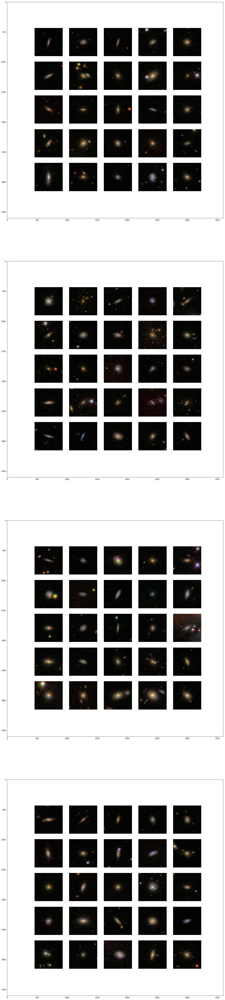

In [138]:
fig, axes = plt.subplots(nrows=4,figsize=(100,100))
ax = axes.ravel()

set1=skimage.io.imread("Postage_stamps_1.png")
set2=skimage.io.imread("Postage_stamps_2.png")
set3=skimage.io.imread("Postage_stamps_3.png")
set4=skimage.io.imread("Postage_stamps_4.png")

ax[0].imshow(set1, cmap='gray')
ax[1].imshow(set2, cmap='gray')
ax[2].imshow(set3, cmap='gray')
ax[3].imshow(set4, cmap='gray')

Let's now see what Kmeans says, starting with two clusters.

In [139]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)
kmeans.fit(images)
y_kmeans = kmeans.predict(images)

In this case, the predictions (the cluster to which each image belongs to) can only assume the value 0 and 1. Here we show a quick way to show which galaxies are predicted to belong to each cluster; there are other ways that you have used already, e.g. using a mask.

In [140]:
print(np.where([y_kmeans == 0])[1]) 
print(np.where([y_kmeans == 1])[1])
print(len(np.where([y_kmeans == 0])[1]))
print(len(np.where([y_kmeans == 1])[1]))

[  4   6   8  16  20  23  25  31  33  37  47  52  54  55  59  64  65  70
  71  72  73  74  80  83  86  88  91  93  97  98  99 101 104 105 107 111
 113 118 125 131 134 139 140 141 142 143 145 147 155 159 162 164 167 168
 169 174 175 179 180 184 186 187 189 190 193 195 197 203 205 206 208 209
 213 217 221 222 224 228 229 230 231 235 239 242 243 244 248 251 252 255
 257 261 267 269 271 273 274 282 283 286 288 290 297 303 305 307 310 315
 316 317 319 323 332 333 336 338 339 340 343 353 355 356 363 364 366 367
 372 373 374 379 383 386 390 396 397 399 402 404 409 411 417 418 419 420
 426 427 428 429 430 431 446 449 454 457 459 460 461 462 463 468 470 476
 480 482 483 485 487 488 490]
[  0   1   2   3   5   7   9  10  11  12  13  14  15  17  18  19  21  22
  24  26  27  28  29  30  32  34  35  36  38  39  40  41  42  43  44  45
  46  48  49  50  51  53  56  57  58  60  61  62  63  66  67  68  69  75
  76  77  78  79  81  82  84  85  87  89  90  92  94  95  96 100 102 103
 106 108 109 110 112 

We can use the code below to take a look at 25 galaxies that were placed in the first cluster and see if they look somehow alike.

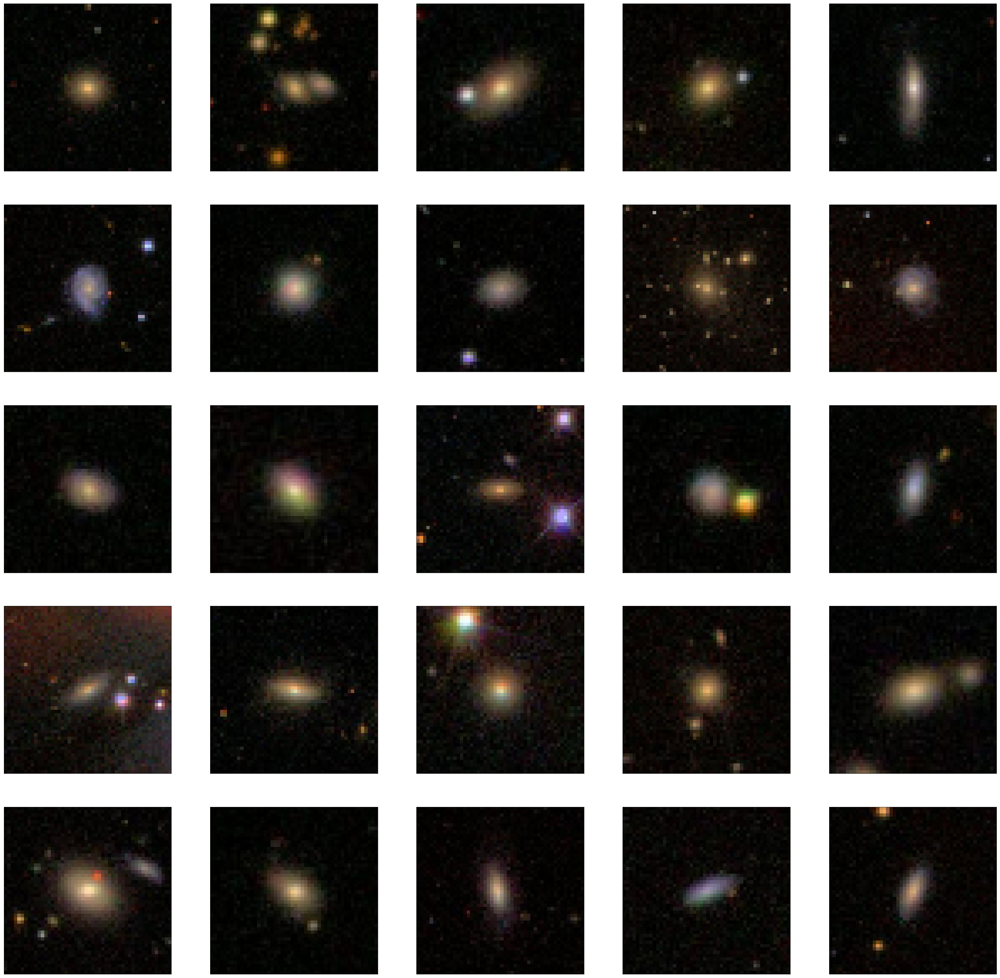

In [141]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 0])[1]),25)):
    #Note: the line below selects galaxies that are assigned to cluster 0
    img = skimage.io.imread('Image_'+str(np.where([y_kmeans == 0])[1][i])+'.png')
    ax[i].imshow(img, cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

Let's now do the same thing but with five clusters.

Q6: Build a K-Means algorithm for this data set with five clusters. Choose initial conditions wisely :) 

In [142]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(images)
y_kmeans = kmeans.predict(images)


Q7: Calculate and show how many objects are assigned to each cluster.

In [143]:
print(np.where([y_kmeans == 0])[1]) 
print(np.where([y_kmeans == 1])[1])
print(np.where([y_kmeans == 2])[1]) 
print(np.where([y_kmeans == 3])[1])
print(np.where([y_kmeans == 4])[1])
print(len(np.where([y_kmeans == 0])[1]))
print(len(np.where([y_kmeans == 1])[1]))
print(len(np.where([y_kmeans == 2])[1]))
print(len(np.where([y_kmeans == 3])[1]))
print(len(np.where([y_kmeans == 4])[1]))

[ 64  70 140 168 175 187 282 363 470]
[ 54 166 243 259 310 460]
[  0   1   2   5   9  10  11  12  13  19  21  22  26  27  29  30  35  36
  38  39  40  41  42  43  44  45  46  48  49  50  51  53  56  58  62  63
  66  75  76  77  81  84  89  92  94  95  96 100 103 106 110 114 115 116
 117 120 121 122 126 129 132 133 135 136 137 138 148 149 150 153 157 158
 160 161 163 165 170 171 172 173 178 181 183 185 188 191 194 196 198 199
 201 202 215 218 219 223 226 227 232 233 237 238 240 241 245 247 249 250
 260 264 265 268 272 275 280 281 285 287 291 292 293 295 296 298 299 300
 301 306 308 309 311 313 314 318 320 321 324 325 326 328 329 331 335 342
 344 345 346 347 348 349 350 352 357 358 359 360 362 365 368 369 370 371
 375 376 380 382 384 385 387 388 392 394 395 398 400 401 403 405 406 408
 410 412 413 414 415 421 422 423 424 425 434 437 438 439 440 442 443 444
 447 448 451 452 453 455 464 465 467 469 471 477 478 479 484 486 491 493
 494 495 497]
[  3   4   6   7  14  15  17  18  20  24  28  

Q8: For each one of the clusters, plot the first 25 galaxies assigned to each cluster (or all of them if they are < 25). Note: You can do this with minimal modification to the code in the cell before Q6.

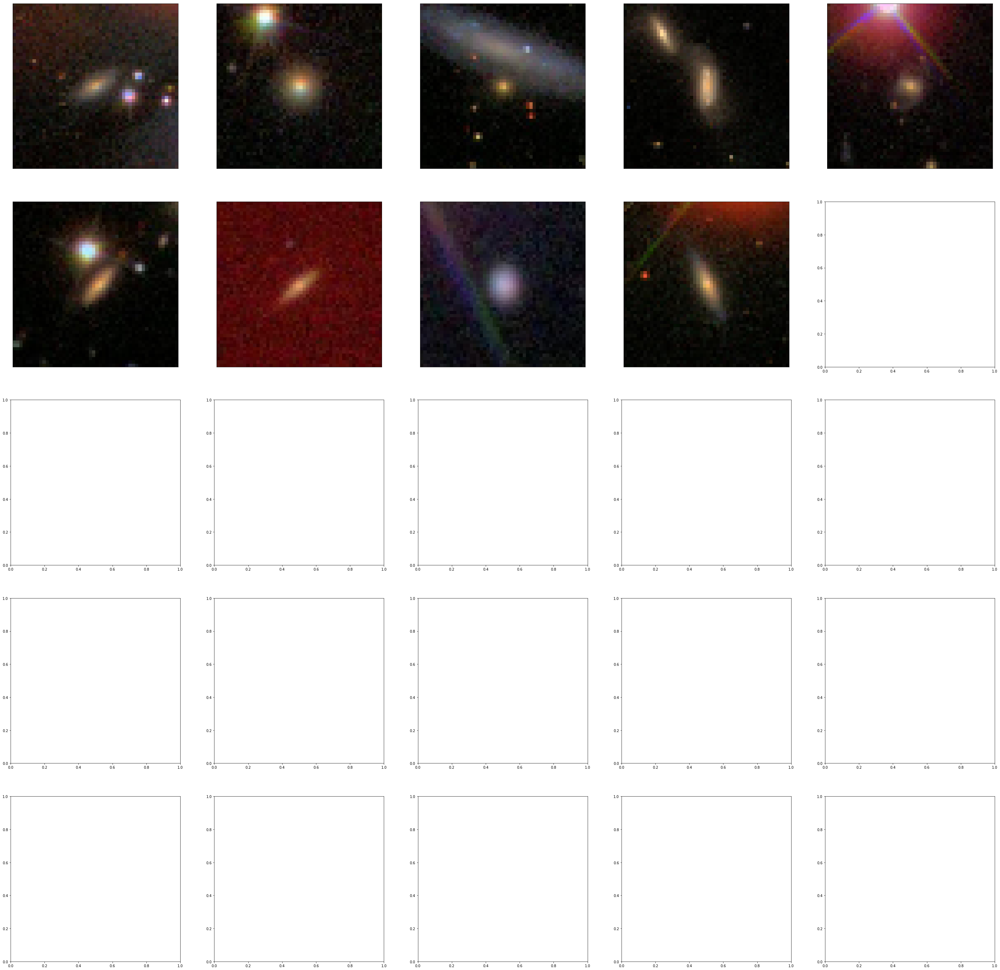

In [144]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 0])[1]),25)):
        img = skimage.io.imread('Image_'+str(np.where([y_kmeans==0])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

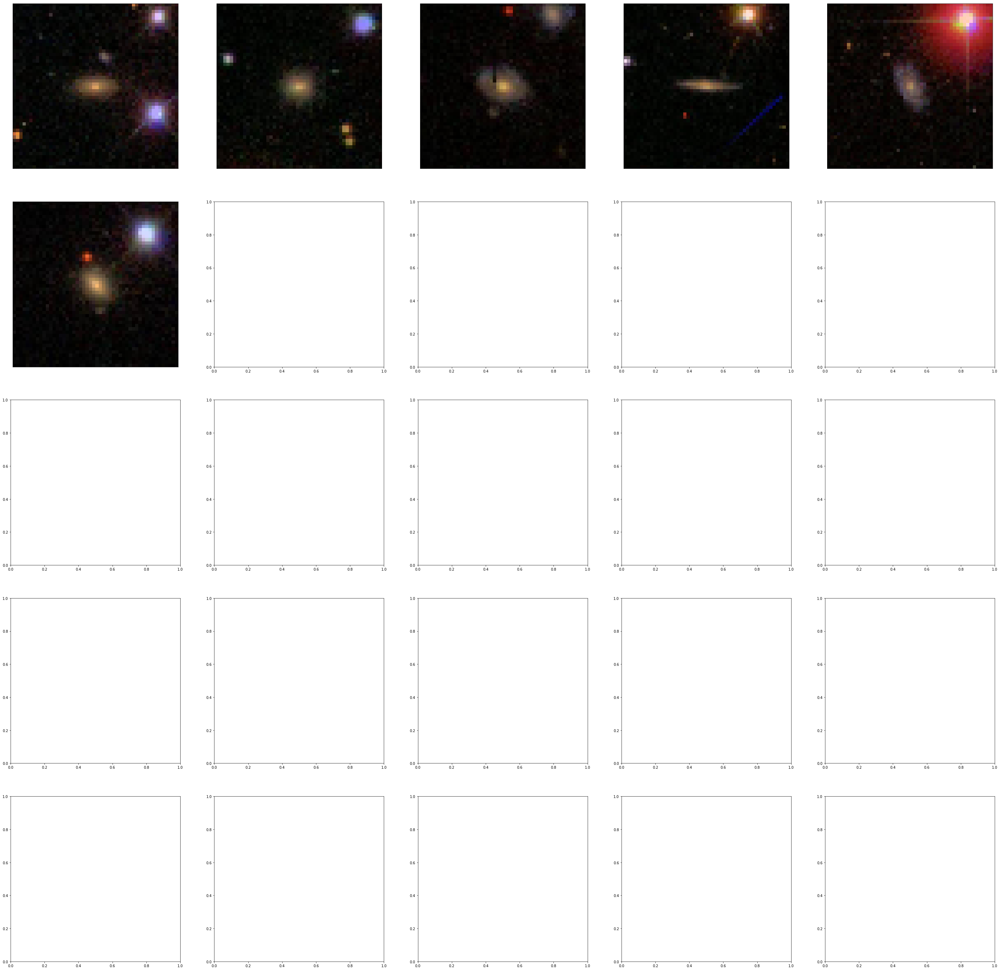

In [145]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 1])[1]),25)):
        img = skimage.io.imread('Image_'+str(np.where([y_kmeans==1])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

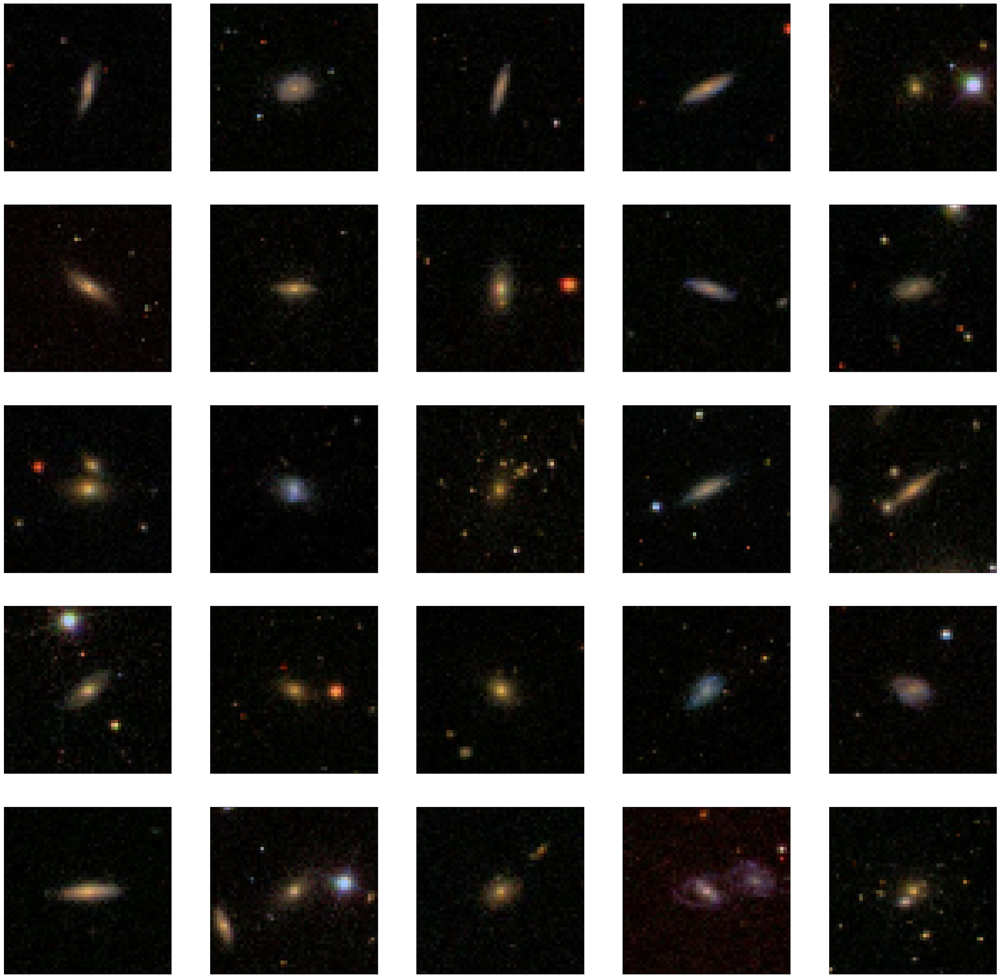

In [146]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 2])[1]),25)):
        img = skimage.io.imread('Image_'+str(np.where([y_kmeans==2])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

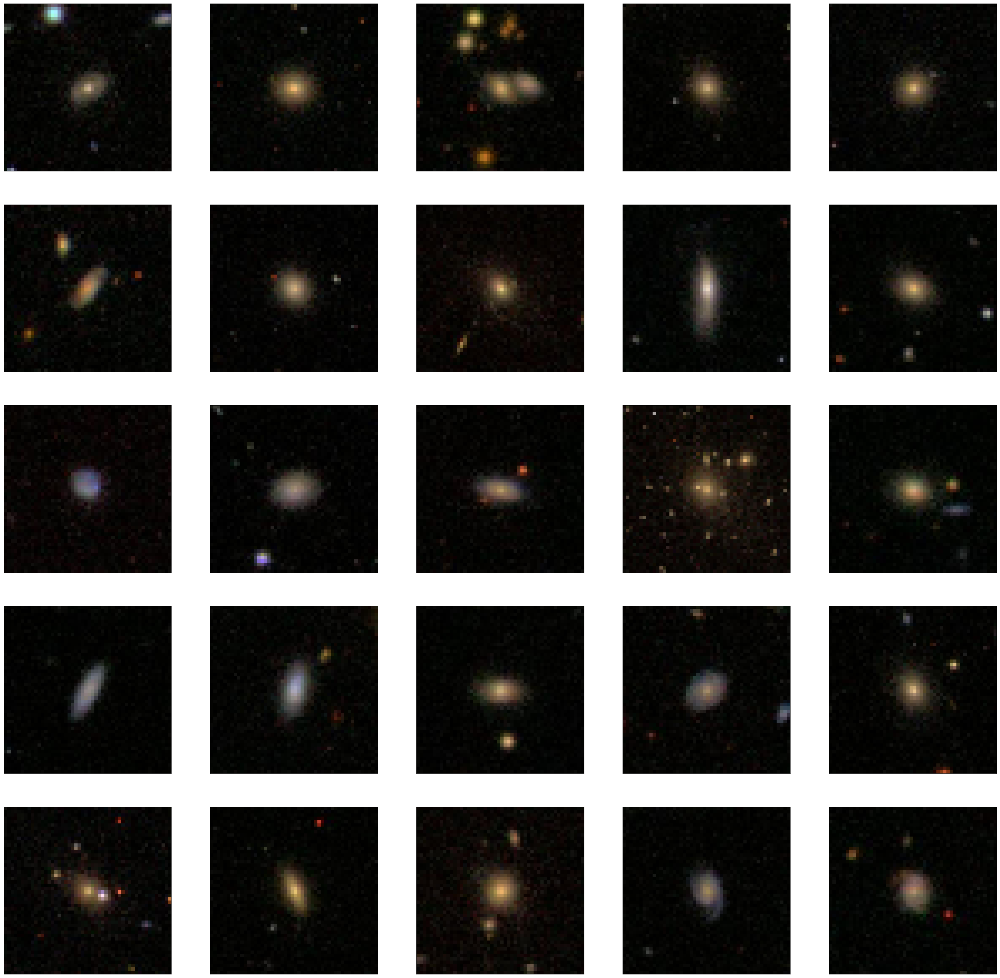

In [147]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 3])[1]),25)):
        img = skimage.io.imread('Image_'+str(np.where([y_kmeans==3])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

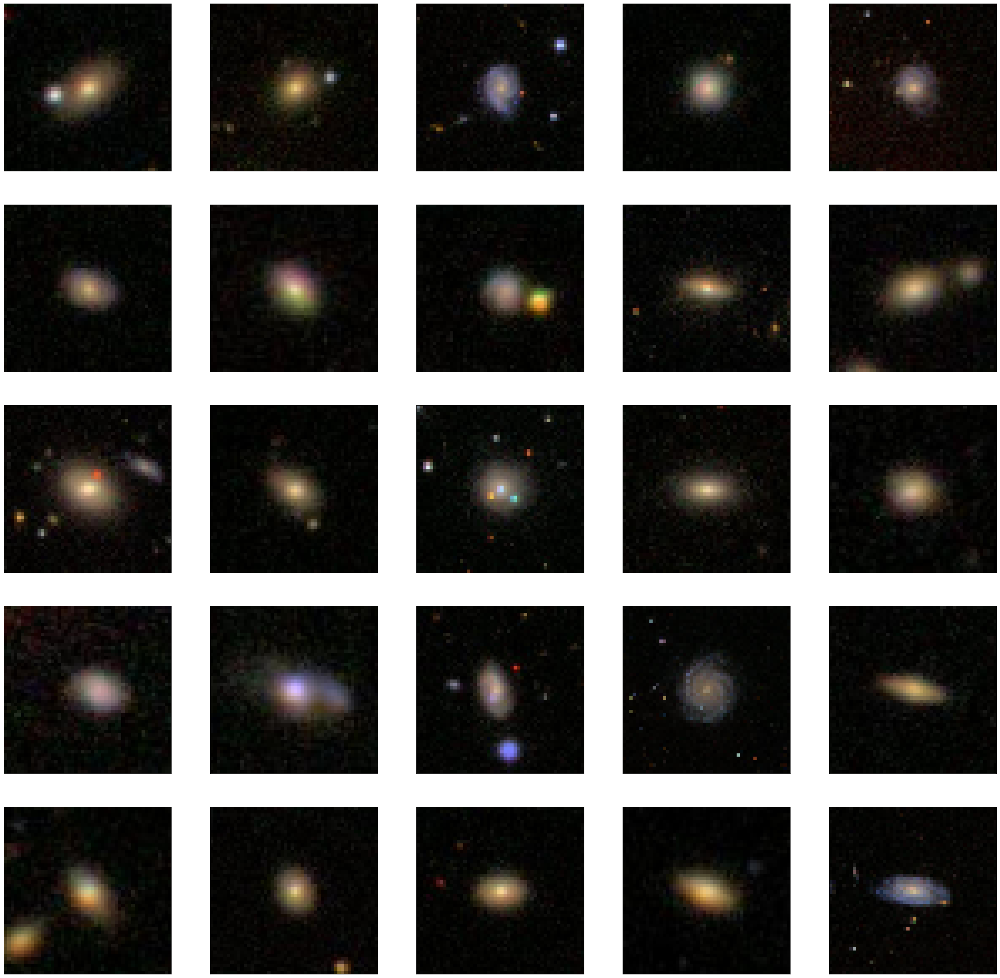

In [148]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 4])[1]),25)):
        img = skimage.io.imread('Image_'+str(np.where([y_kmeans==4])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

Q9: Describe some similarities and differences between galaxies assigned to cluster 1 (or a cluster of your choice). Do you think the algorithm is successful at grouping galaxies with similar morphology?

Q10: Build a k-means clustering model with five clusters using a different (larger) size for the images, for example 100x100. (You will have to build the data set again). Compare the results to the previous run, looking at the distribution of galaxies in their assigned clusters (note that the order of the clusters is random, so cluster 1 in the previous run might be called cluster 4 here). Do you think results are changing significantly? Why or why not?

In [151]:
for i in range(len(X_little)):
    img = skimage.io.imread('SmallData/'+X_little[i])
    img_resized = resize(img, (200,200))               
    skimage.io.imsave('image_'+str(i)+'.png',img_resized)


In [153]:
images1 = []
for i in range(len(X_little)):
    img_resized =skimage.io.imread('image_'+str(i)+'.png')
    length = np.prod(img_resized.shape)
    img = np.reshape(img_resized,length)
    images1.append(img)
    
images1 = np.vstack(images1)

In [155]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(images1)
y_kmeans = kmeans.predict(images1)

In [156]:
print(np.where([y_kmeans == 0])[1]) 
print(np.where([y_kmeans == 1])[1])
print(np.where([y_kmeans == 2])[1]) 
print(np.where([y_kmeans == 3])[1])
print(np.where([y_kmeans == 4])[1])
print(len(np.where([y_kmeans == 0])[1]))
print(len(np.where([y_kmeans == 1])[1]))
print(len(np.where([y_kmeans == 2])[1]))
print(len(np.where([y_kmeans == 3])[1]))
print(len(np.where([y_kmeans == 4])[1]))

[  8  16  23  25  37  47  52  55  65  72  73  74  88  91  93  97 101 105
 118 134 139 142 145 159 162 167 168 174 180 186 187 193 195 197 203 206
 208 213 224 228 230 231 242 269 274 290 315 319 323 332 333 336 338 339
 353 364 386 397 402 411 417 427 428 430 454 462 463 468 480 482]
[  4   6  14  17  18  20  24  31  33  34  59  61  67  68  71  79  80  82
  85  86  87  90  98  99 104 107 109 111 113 119 124 125 127 128 130 131
 141 143 144 146 147 151 152 155 164 169 176 179 182 184 185 189 190 192
 205 207 209 210 212 217 221 222 225 234 235 236 239 243 244 248 251 252
 254 255 256 257 258 261 262 267 271 273 276 278 283 284 286 288 294 297
 302 303 307 316 317 330 334 337 340 343 348 351 354 355 366 367 372 373
 374 377 379 381 383 389 390 391 393 396 399 404 409 416 418 419 420 426
 429 431 432 433 435 436 445 446 449 456 457 459 460 461 472 473 474 475
 476 481 483 485 487 488 490 496]
[ 64  70 140 175 282 310 363 470]
[  0   2   7   9  12  15  22  26  28  29  30  35  36  38  42  4

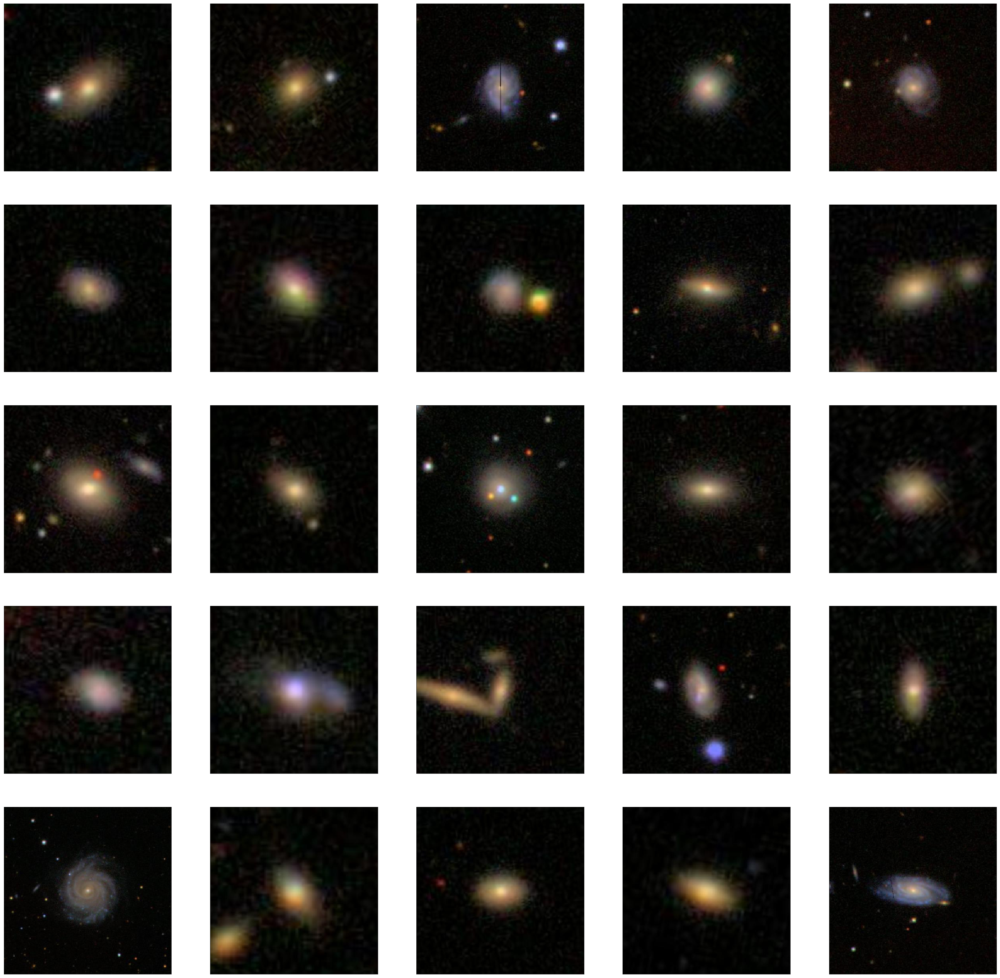

In [157]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 0])[1]),25)):
        img = skimage.io.imread('image_'+str(np.where([y_kmeans==0])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

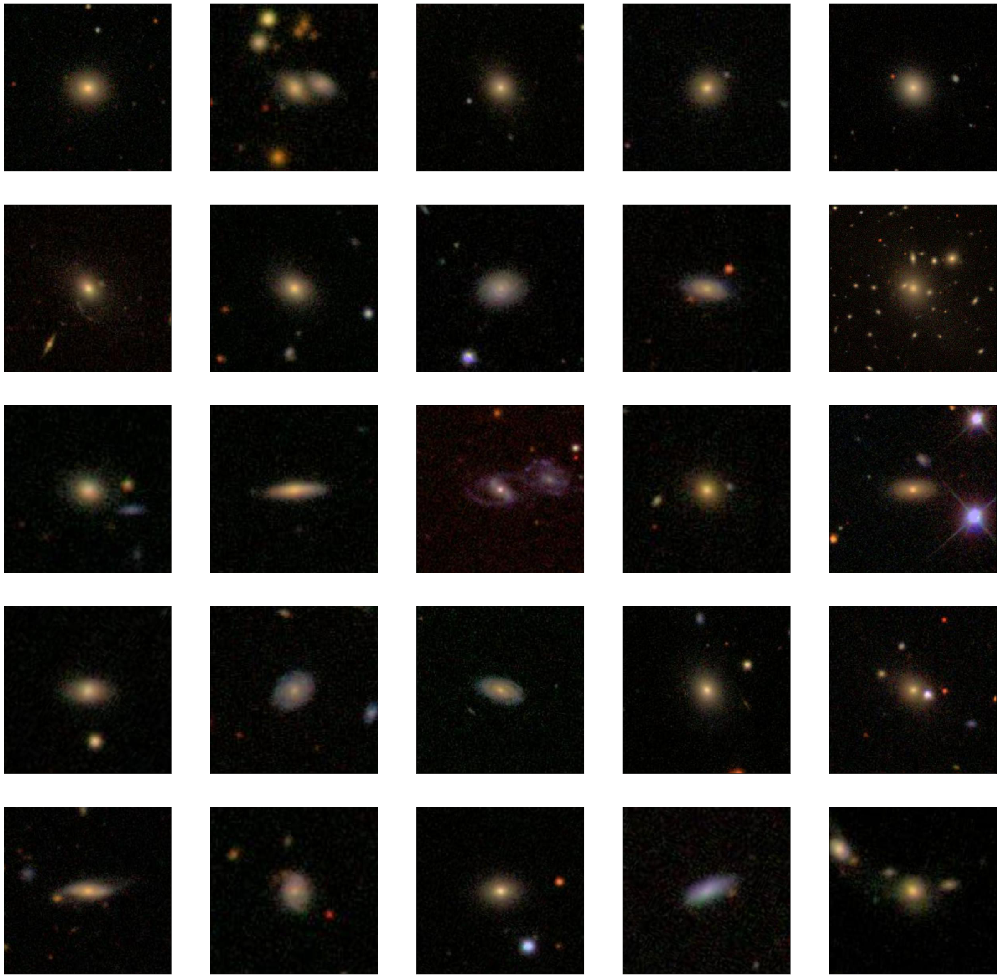

In [120]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == ])[1]),25)):
        img = skimage.io.imread('image_'+str(np.where([y_kmeans==2])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

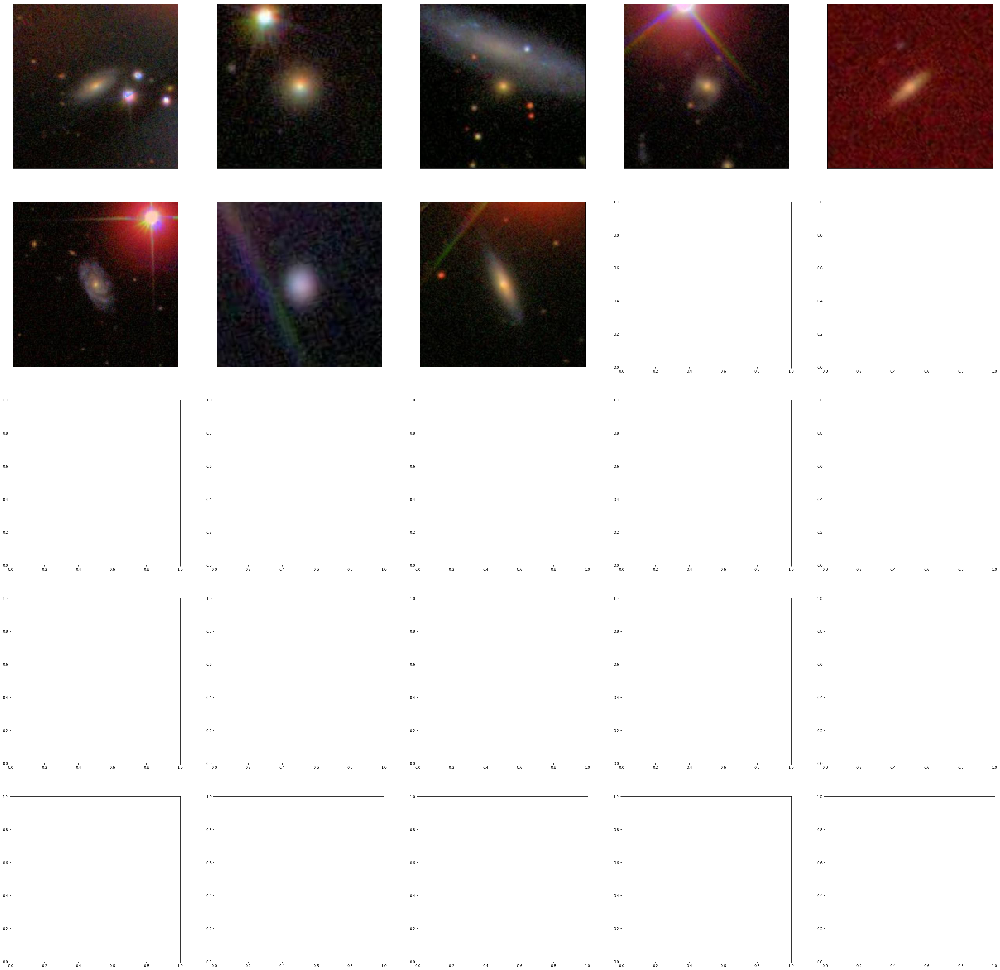

In [158]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 2])[1]),25)):
        img = skimage.io.imread('image_'+str(np.where([y_kmeans==2])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

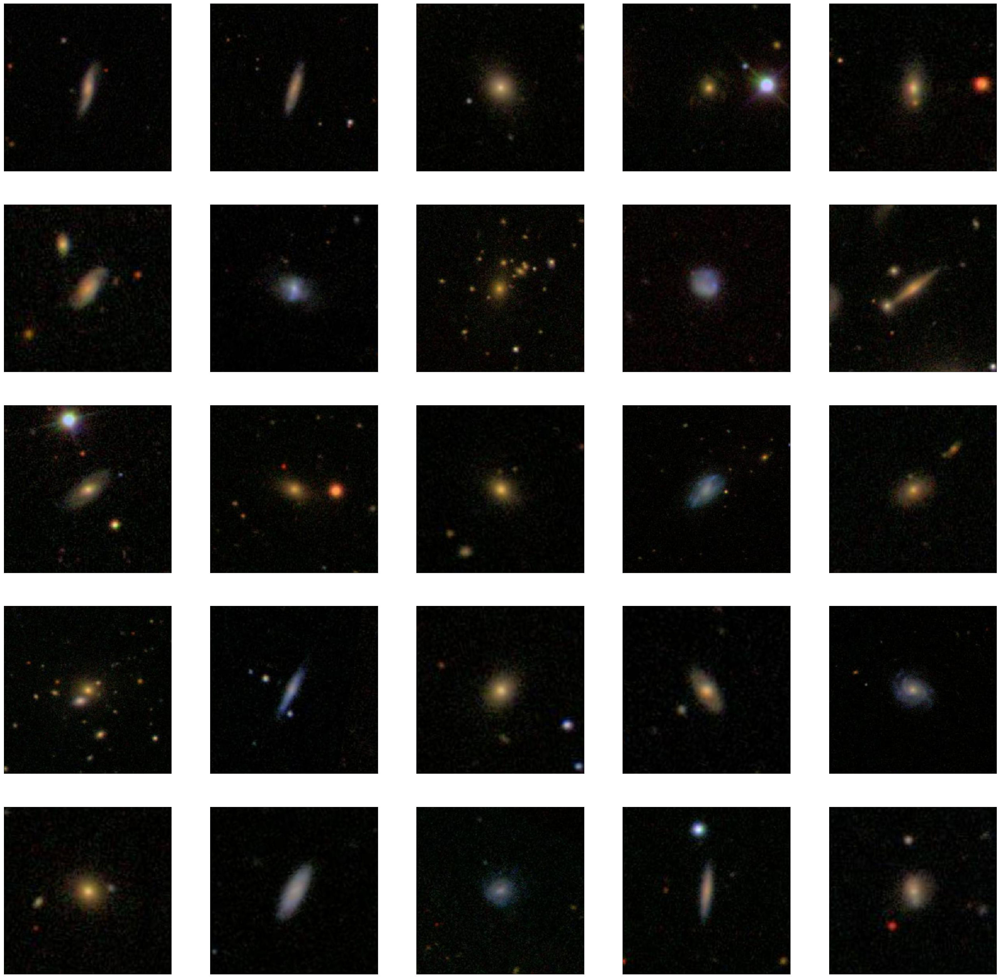

In [159]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 3])[1]),25)):
        img = skimage.io.imread('image_'+str(np.where([y_kmeans==3])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

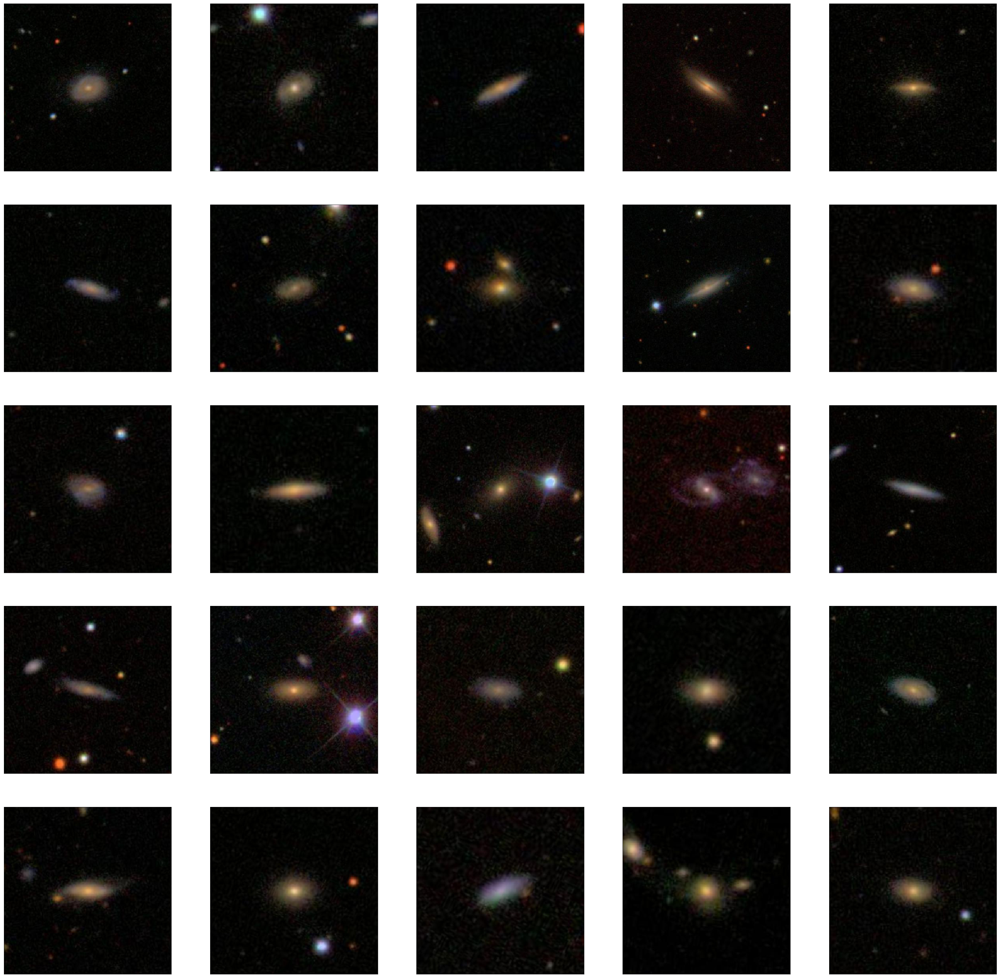

In [160]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(min(len(np.where([y_kmeans == 4])[1]),25)):
        img = skimage.io.imread('image_'+str(np.where([y_kmeans==4])[1][i])+'.png')
        ax[i].imshow(img, cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

EC: The "Elbow method" can be used in clustering to adaptively determine the optimal number of clusters. 1. Research the elbow method and describe in words how it could be used here to find the optimal number of clusters. 2 Write a script to optimally determine the number of clusters in galaxy morphology. Based on your results, is there a clear optimal number of clusters?

C:\Users\merye\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype uint8 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


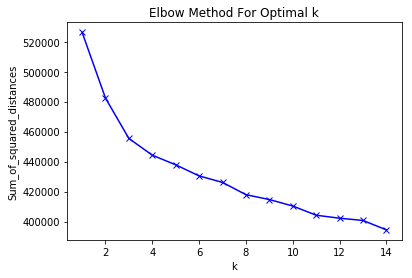

In [170]:
#https://blog.cambridgespark.com/how-to-determine-the-optimal-number-of-clusters-for-k-means-clustering-14f27070048f
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
mms.fit(images1)
data_transformed = mms.transform(images1)
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Not EC but in case you are interested: Affinity Propagation is another tool used in scikit to attempt to determine the number of clusters, and the silhouette score of a cluster distribution. Example code below for your perusal.

In [162]:
from sklearn.cluster import AffinityPropagation
from sklearn import metrics

In [171]:
# #############################################################################
# Compute Affinity Propagation
af = AffinityPropagation(preference=-50).fit(images1)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)

print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(images1, labels, metric='sqeuclidean'))

Estimated number of clusters: 499


ValueError: Number of labels is 499. Valid values are 2 to n_samples - 1 (inclusive)